In [1]:
import pandas as pd
import torch
from torch import nn
import gensim
from gensim.models import KeyedVectors
import sklearn
import torchmetrics
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('main_dataset.csv',  encoding='UTF-8')

In [3]:
df.head()

,id,text,label
0,1,на работе был полный пиддес :| и так каждое за...,0.0
1,2,"Коллеги сидят рубятся в Urban terror, а я из-з...",1.0
2,3,@elina_4post как говорят обещаного три года жд...,0.0
3,4,"Желаю хорошего полёта и удачной посадки,я буду...",0.0
4,5,"Обновил за каким-то лешим surf, теперь не рабо...",0.0


In [4]:
df.isna().sum()

id       0
text     0
label    0
dtype: int64

In [5]:
df.head()

,id,text,label
0,1,на работе был полный пиддес :| и так каждое за...,0.0
1,2,"Коллеги сидят рубятся в Urban terror, а я из-з...",1.0
2,3,@elina_4post как говорят обещаного три года жд...,0.0
3,4,"Желаю хорошего полёта и удачной посадки,я буду...",0.0
4,5,"Обновил за каким-то лешим surf, теперь не рабо...",0.0


In [6]:
df.tail()

,id,text,label
15870,15871,Вонючий совковый скот прибежал и ноет. А вот и...,1.0
15871,15872,А кого любить? Гоблина тупорылого что-ли? Или ...,1.0
15872,15873,"Посмотрел Утомленных солнцем 2. И оказалось, ч...",0.0
15873,15874,КРЫМОТРЕД НАРУШАЕТ ПРАВИЛА РАЗДЕЛА Т.К В НЕМ Н...,1.0
15874,15875,До сих пор пересматриваю его видео. Орамбо кст...,0.0


In [7]:
df['text'].unique

<bound method Series.unique of 0        на работе был полный пиддес :| и так каждое за...
1        Коллеги сидят рубятся в Urban terror, а я из-з...
2        @elina_4post как говорят обещаного три года жд...
3        Желаю хорошего полёта и удачной посадки,я буду...
4        Обновил за каким-то лешим surf, теперь не рабо...
                               ...                        
15870    Вонючий совковый скот прибежал и ноет. А вот и...
15871    А кого любить? Гоблина тупорылого что-ли? Или ...
15872    Посмотрел Утомленных солнцем 2. И оказалось, ч...
15873    КРЫМОТРЕД НАРУШАЕТ ПРАВИЛА РАЗДЕЛА Т.К В НЕМ Н...
15874    До сих пор пересматриваю его видео. Орамбо кст...
Name: text, Length: 15875, dtype: object>

In [8]:
import string

In [9]:
df.head()

,id,text,label
0,1,на работе был полный пиддес :| и так каждое за...,0.0
1,2,"Коллеги сидят рубятся в Urban terror, а я из-з...",1.0
2,3,@elina_4post как говорят обещаного три года жд...,0.0
3,4,"Желаю хорошего полёта и удачной посадки,я буду...",0.0
4,5,"Обновил за каким-то лешим surf, теперь не рабо...",0.0


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15875 entries, 0 to 15874
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      15875 non-null  int64  
 1   text    15875 non-null  object 
 2   label   15875 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 372.2+ KB


In [11]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [12]:
print(stopwords.words('russian'))

['и', 'в', 'во', 'не', 'что', 'он', 'на', 'я', 'с', 'со', 'как', 'а', 'то', 'все', 'она', 'так', 'его', 'но', 'да', 'ты', 'к', 'у', 'же', 'вы', 'за', 'бы', 'по', 'только', 'ее', 'мне', 'было', 'вот', 'от', 'меня', 'еще', 'нет', 'о', 'из', 'ему', 'теперь', 'когда', 'даже', 'ну', 'вдруг', 'ли', 'если', 'уже', 'или', 'ни', 'быть', 'был', 'него', 'до', 'вас', 'нибудь', 'опять', 'уж', 'вам', 'ведь', 'там', 'потом', 'себя', 'ничего', 'ей', 'может', 'они', 'тут', 'где', 'есть', 'надо', 'ней', 'для', 'мы', 'тебя', 'их', 'чем', 'была', 'сам', 'чтоб', 'без', 'будто', 'чего', 'раз', 'тоже', 'себе', 'под', 'будет', 'ж', 'тогда', 'кто', 'этот', 'того', 'потому', 'этого', 'какой', 'совсем', 'ним', 'здесь', 'этом', 'один', 'почти', 'мой', 'тем', 'чтобы', 'нее', 'сейчас', 'были', 'куда', 'зачем', 'всех', 'никогда', 'можно', 'при', 'наконец', 'два', 'об', 'другой', 'хоть', 'после', 'над', 'больше', 'тот', 'через', 'эти', 'нас', 'про', 'всего', 'них', 'какая', 'много', 'разве', 'три', 'эту', 'моя', 'впр

In [13]:
print(df['text'].apply(type).value_counts())

<class 'str'>    15875
Name: text, dtype: int64


In [14]:
!pip install stop-words

In [15]:
import stop_words
#stop_words_russian = set(stopwords.words('russian'))
stop_words_russian = stop_words.get_stop_words('russian')

In [16]:
# Convert non-string values to empty string
df['text'] = df['text'].apply(lambda x: str(x) if type(x) != str else x)

# Remove stop words from the text column
df['text'] = df['text'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in stop_words_russian]))

In [17]:
df.head()

,id,text,label
0,1,"работе полный пиддес :| закрытие месяца, свихн...",0.0
1,2,"Коллеги сидят рубятся Urban terror, из-за долб...",1.0
2,3,@elina_4post говорят обещаного ждут...((,0.0
3,4,"Желаю хорошего полёта удачной посадки,я сильно...",0.0
4,5,"Обновил каким-то лешим surf, работает простопл...",0.0


In [18]:
# Define a function to convert text to lowercase
def convert_to_lower(text):
    return text.lower()

# Apply the function to the 'text' column of the DataFrame
df['text'] = df['text'].apply(convert_to_lower)

In [19]:
df.head(15)

,id,text,label
0,1,"работе полный пиддес :| закрытие месяца, свихн...",0.0
1,2,"коллеги сидят рубятся urban terror, из-за долб...",1.0
2,3,@elina_4post говорят обещаного ждут...((,0.0
3,4,"желаю хорошего полёта удачной посадки,я сильно...",0.0
4,5,"обновил каким-то лешим surf, работает простопл...",0.0
5,6,"котёнка вчера носик разбила, плакала расстраив...",0.0
6,7,"@juliamayko @o_nika55 @and_possum зашли, затих...",0.0
7,8,вообще болею - выздоравливаю :(,0.0
8,9,микрофраза :( учимся срать кирпичами режиме &a...,1.0
9,10,"хочу помириться , сука гордая сделаю! (((",1.0


In [20]:
import re
def remove_urls(text):
    return re.sub(r'http\S+', '', text)

# Apply the function to the 'text' column of the DataFrame
df['text'] = df['text'].apply(remove_urls)

In [21]:
df.tail(20)

,id,text,label
15855,15856,"тасс, 21 марта. премьер-министр новой зеландии...",0.0
15856,15857,"вой подсоса гомофорсера что, говно, неприятно ...",1.0
15857,15858,шлюха. парад шлюх.,1.0
15858,15859,дебил-куколд значение знаешь?,1.0
15859,15860,"хуею сосачеры, большиство прыщавые жиртресты р...",1.0
15860,15861,что-то появившееся небе пугает туристов расска...,1.0
15861,15862,моча анимаче решила окончательно убить реакшен...,1.0
15862,15863,65 мало? гражданина рейтинг 90 3 дня записи ви...,0.0
15863,15864,"зря, вас, хохлов, свиньями кличут. грязные жив...",1.0
15864,15865,прямо сразу ватан бросился своему кредитному н...,1.0


In [22]:
# Define a function to remove punctuation and extra spaces from a text string
def remove_punct_and_extra_space(text):
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Remove extra space
    text = re.sub(' +', ' ', text)
    return text

# Apply the function to the 'text' column of the DataFrame
df['text'] = df['text'].apply(remove_punct_and_extra_space)

In [23]:
df.tail(15)

,id,text,label
15860,15861,чтото появившееся небе пугает туристов рассказ...,1.0
15861,15862,моча анимаче решила окончательно убить реакшен...,1.0
15862,15863,65 мало гражданина рейтинг 90 3 дня записи видео,0.0
15863,15864,зря вас хохлов свиньями кличут грязные животны...,1.0
15864,15865,прямо сразу ватан бросился своему кредитному н...,1.0
15865,15866,эй михалыч пожарка пищит хуй пущай пищит смори...,1.0
15866,15867,пусть евровидение стримит долбоеб чтоли послед...,1.0
15867,15868,женщина венец творения помните ваньки стоите ж...,1.0
15868,15869,авиакомпании вместе специалистами гугл карт см...,1.0
15869,15870,запад прошел хуйню пару сотен назад большинств...,0.0


In [24]:
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('tagsets')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package tagsets to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package tagsets is already up-to-date!


True

In [25]:
# Tokenize the text in the 'text' column
df['text_tokenized'] = df['text'].apply(lambda x: nltk.word_tokenize(x))

In [26]:
df.tail(15)

,id,text,label,text_tokenized
15860,15861,чтото появившееся небе пугает туристов рассказ...,1.0,"[чтото, появившееся, небе, пугает, туристов, р..."
15861,15862,моча анимаче решила окончательно убить реакшен...,1.0,"[моча, анимаче, решила, окончательно, убить, р..."
15862,15863,65 мало гражданина рейтинг 90 3 дня записи видео,0.0,"[65, мало, гражданина, рейтинг, 90, 3, дня, за..."
15863,15864,зря вас хохлов свиньями кличут грязные животны...,1.0,"[зря, вас, хохлов, свиньями, кличут, грязные, ..."
15864,15865,прямо сразу ватан бросился своему кредитному н...,1.0,"[прямо, сразу, ватан, бросился, своему, кредит..."
15865,15866,эй михалыч пожарка пищит хуй пущай пищит смори...,1.0,"[эй, михалыч, пожарка, пищит, хуй, пущай, пищи..."
15866,15867,пусть евровидение стримит долбоеб чтоли послед...,1.0,"[пусть, евровидение, стримит, долбоеб, чтоли, ..."
15867,15868,женщина венец творения помните ваньки стоите ж...,1.0,"[женщина, венец, творения, помните, ваньки, ст..."
15868,15869,авиакомпании вместе специалистами гугл карт см...,1.0,"[авиакомпании, вместе, специалистами, гугл, ка..."
15869,15870,запад прошел хуйню пару сотен назад большинств...,0.0,"[запад, прошел, хуйню, пару, сотен, назад, бол..."


In [27]:
!pip install pymorphy2

In [28]:
import re
from pymorphy2 import MorphAnalyzer
from nltk.corpus import stopwords

patterns = "[A-Za-z0-9!#$%&'()*+,./:;<=>?@[\]^_`{|}~—\"\-]+"
stopwords_ru = stopwords.words("russian")
morph = MorphAnalyzer()

def lemmatize(doc):
    doc = re.sub(patterns, ' ', doc)
    tokens = []
    for token in doc.split():
        if token and token not in stopwords_ru:
            token = token.strip()
            token = morph.normal_forms(token)[0]
            
            tokens.append(token)
    if len(tokens) >= 1:
        return tokens
    return None

data = df.text.apply(lemmatize)
#data = data.dropna()
data

0        [работа, полный, пиддес, закрытие, месяц, свих...
1        [коллега, сидеть, рубиться, изз, долбать, винд...
2                              [говорить, обещаной, ждать]
3        [желать, хороший, полёт, удачный, посадкия, си...
4        [обновить, какимтый, леший, работать, простопл...
                               ...                        
15870    [вонючий, совковый, скот, прибежать, ныть, сто...
15871    [любить, гоблин, тупорылый, чтоль, какуюнибудь...
15872    [посмотреть, утомлённый, солнце, оказаться, хо...
15873    [крымотред, нарушать, правило, раздел, тк, обс...
15874    [пересматривать, видео, орамбо, кстати, свой, ...
Name: text, Length: 15875, dtype: object

In [29]:
df3=pd.DataFrame(columns=['id','text','label'])
df3['text']=data
df3['id']=df['id']
df3['label']=df['label']
df3=df3.dropna()
df3

,id,text,label
0,1,"[работа, полный, пиддес, закрытие, месяц, свих...",0.0
1,2,"[коллега, сидеть, рубиться, изз, долбать, винд...",1.0
2,3,"[говорить, обещаной, ждать]",0.0
3,4,"[желать, хороший, полёт, удачный, посадкия, си...",0.0
4,5,"[обновить, какимтый, леший, работать, простопл...",0.0
...,...,...,...
15870,15871,"[вонючий, совковый, скот, прибежать, ныть, сто...",1.0
15871,15872,"[любить, гоблин, тупорылый, чтоль, какуюнибудь...",1.0
15872,15873,"[посмотреть, утомлённый, солнце, оказаться, хо...",0.0
15873,15874,"[крымотред, нарушать, правило, раздел, тк, обс...",1.0


In [30]:
df3.to_csv('df3_after_preprocessing.csv', index=False)
after = pd.read_csv('df3_after_preprocessing.csv',  encoding='UTF-8')

In [31]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

In [32]:
# Удаление строк с пропущенными значениями в столбце 'text'
after = after.dropna(subset=['text'])

In [33]:
train_df, test_df = train_test_split(after, test_size=0.3, random_state=42)

In [34]:
import torch
from sklearn.feature_extraction.text import TfidfVectorizer
from scipy.sparse import csr_matrix


#Создание экземпляра TfidfVectorizer
vectorizer = TfidfVectorizer()

#Преобразование текстов в матрицу TF-IDF
tfidf_matrix_train_df = vectorizer.fit_transform(train_df['text'])

#Преобразование разреженной матрицы в формат CSR
tfidf_csr_train_df = csr_matrix(tfidf_matrix_train_df)

# Преобразование формата разреженной матрицы в формат COO
tfidf_coo_train_df = tfidf_csr_train_df.tocoo().astype(np.float32)

# Преобразование матрицы TF-IDF в разреженный тензор PyTorch
tfidf_tensor_train_df = torch.sparse.FloatTensor(torch.LongTensor([tfidf_coo_train_df.row.tolist(), tfidf_coo_train_df.col.tolist()]),
                                        torch.FloatTensor(tfidf_coo_train_df.data))

# Вывод тензора TF-IDF
print(tfidf_tensor_train_df)

tensor(indices=tensor([[ 1436,  4096,  8861,  ...,  3527,  5959,  8516],
                       [    0,     0,     0,  ..., 28893, 28894, 28895]]),
       values=tensor([0.3869, 0.2067, 0.2847,  ..., 0.2246, 0.4808, 0.4946]),
       size=(11100, 28896), nnz=141683, layout=torch.sparse_coo)


In [35]:
import torch
from sklearn.feature_extraction.text import TfidfVectorizer
from scipy.sparse import csr_matrix

#Удаление строк с пропущенными значениями в столбце 'text'
after = after.dropna(subset=['text'])

#Создание экземпляра TfidfVectorizer
vectorizer = TfidfVectorizer()

#Преобразование текстов в матрицу TF-IDF
tfidf_matrix_test_df = vectorizer.fit_transform(test_df['text'])

#Преобразование разреженной матрицы в формат CSR
tfidf_csr_test_df = csr_matrix(tfidf_matrix_test_df)

# Преобразование формата разреженной матрицы в формат COO
tfidf_coo_test_df = tfidf_csr_test_df.tocoo().astype(np.float32)

# Преобразование матрицы TF-IDF в разреженный тензор PyTorch
tfidf_tensor_test_df = torch.sparse.FloatTensor(torch.LongTensor([tfidf_coo_test_df.row.tolist(), tfidf_coo_test_df.col.tolist()]),
                                        torch.FloatTensor(tfidf_coo_test_df.data))

# Вывод тензора TF-IDF
print(tfidf_tensor_test_df)

tensor(indices=tensor([[ 1136,  3495,   501,  ...,  3200,  4169,  4602],
                       [    0,     1,     2,  ..., 17674, 17674, 17675]]),
       values=tensor([0.2026, 0.4030, 0.5778,  ..., 0.3787, 0.0672, 0.2085]),
       size=(4758, 17676), nnz=62136, layout=torch.sparse_coo)


In [36]:
x_train = tfidf_tensor_train_df
x_test = tfidf_tensor_test_df 
x_train = x_train.to_dense()
x_test = x_test.to_dense()
x_train = x_train.narrow(1, 0, 1000) 
x_test = x_test.narrow(1, 0, 1000) 

In [37]:
y_train_list=list()
for i in train_df['label']:
    y_train_list.append(i)
y_train=torch.tensor(y_train_list)
y_train.unsqueeze_(1)

tensor([[0.],
        [0.],
        [1.],
        ...,
        [0.],
        [1.],
        [1.]])

In [38]:
y_test_list=list()
for i in test_df['label']:
    y_test_list.append(i)
y_test=torch.tensor(y_test_list)
y_test.unsqueeze_(1)

tensor([[0.],
        [0.],
        [0.],
        ...,
        [0.],
        [0.],
        [1.]])

In [39]:
#----------------------------------------------

<font color='red'>Experiment_#1 (Base)</font>

In [40]:
#----------------------------------------------

In [41]:
class MLP_MK1(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK1, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, output_size)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        out = self.sigmoid(out)
#         out=torch.round(out)
        return out

In [48]:
Mk1=MLP_MK1(1000,300,1)

In [49]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [50]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [51]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [52]:
Mk1=Mk1.to(dev)

In [53]:
optimizer = torch.optim.Adam(Mk1.parameters(), lr=0.001)
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy'])
for epoch in range(10000):
    optimizer.zero_grad()
    pred = Mk1.forward(x_train.float())
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf = pd.concat([diagdf, pd.DataFrame(data, index=[epoch])], ignore_index=True)
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.8063492774963379   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2 , Loss:  0.8057442903518677   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3 , Loss:  0.8051360249519348   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4 , Loss:  0.8045257925987244   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5 , Loss:  0.8039075136184692   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6 , Loss:  0.8032821416854858   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7 , Loss:  0.8026500344276428   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8 , Loss:  0.8019963502883911   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9 , Loss:  0.8013314604759216   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  10 , Loss:  0.8006584644317627   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  11 , Loss:  0.799972414970398   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  12 , Loss:  0.7992727756500244   f1-score: 0.0   accurac

Epoch:  116 , Loss:  0.6979953646659851   f1-score: 0.016765819862484932   accuracy: 0.6724324226379395
Epoch:  117 , Loss:  0.6977792978286743   f1-score: 0.016765819862484932   accuracy: 0.6724324226379395
Epoch:  118 , Loss:  0.6975684762001038   f1-score: 0.017301972955465317   accuracy: 0.6725225448608398
Epoch:  119 , Loss:  0.6973633170127869   f1-score: 0.017301972955465317   accuracy: 0.6725225448608398
Epoch:  120 , Loss:  0.6971635818481445   f1-score: 0.01783783733844757   accuracy: 0.6726126074790955
Epoch:  121 , Loss:  0.6969695687294006   f1-score: 0.01783783733844757   accuracy: 0.6726126074790955
Epoch:  122 , Loss:  0.6967793107032776   f1-score: 0.01944369450211525   accuracy: 0.6728828549385071
Epoch:  123 , Loss:  0.6965939402580261   f1-score: 0.01997840218245983   accuracy: 0.6729729771614075
Epoch:  124 , Loss:  0.6964132785797119   f1-score: 0.020512821152806282   accuracy: 0.6730630397796631
Epoch:  125 , Loss:  0.6962364912033081   f1-score: 0.02211434766650

Epoch:  227 , Loss:  0.6857783794403076   f1-score: 0.15930087864398956   accuracy: 0.6966666579246521
Epoch:  228 , Loss:  0.6857145428657532   f1-score: 0.16067864000797272   accuracy: 0.6969369649887085
Epoch:  229 , Loss:  0.6856511831283569   f1-score: 0.16159601509571075   accuracy: 0.6971170902252197
Epoch:  230 , Loss:  0.6855878233909607   f1-score: 0.16205434501171112   accuracy: 0.6972072124481201
Epoch:  231 , Loss:  0.6855250597000122   f1-score: 0.16251246631145477   accuracy: 0.6972972750663757
Epoch:  232 , Loss:  0.6854634284973145   f1-score: 0.1638854295015335   accuracy: 0.6975675821304321
Epoch:  233 , Loss:  0.6854018568992615   f1-score: 0.16479960083961487   accuracy: 0.6977477669715881
Epoch:  234 , Loss:  0.6853410005569458   f1-score: 0.1666252166032791   accuracy: 0.6981081366539001
Epoch:  235 , Loss:  0.6852805614471436   f1-score: 0.167536661028862   accuracy: 0.6982882618904114
Epoch:  236 , Loss:  0.6852206587791443   f1-score: 0.16844721138477325   acc

Epoch:  337 , Loss:  0.6813565492630005   f1-score: 0.21766409277915955   accuracy: 0.707927942276001
Epoch:  338 , Loss:  0.6813332438468933   f1-score: 0.21766409277915955   accuracy: 0.707927942276001
Epoch:  339 , Loss:  0.6813101768493652   f1-score: 0.21766409277915955   accuracy: 0.707927942276001
Epoch:  340 , Loss:  0.6812876462936401   f1-score: 0.2180940955877304   accuracy: 0.7080180048942566
Epoch:  341 , Loss:  0.6812651753425598   f1-score: 0.21852387487888336   accuracy: 0.708108127117157
Epoch:  342 , Loss:  0.681242823600769   f1-score: 0.2189534604549408   accuracy: 0.7081981897354126
Epoch:  343 , Loss:  0.681220531463623   f1-score: 0.21938283741474152   accuracy: 0.708288311958313
Epoch:  344 , Loss:  0.6811988353729248   f1-score: 0.21981200575828552   accuracy: 0.7083783745765686
Epoch:  345 , Loss:  0.6811772584915161   f1-score: 0.22024096548557281   accuracy: 0.708468496799469
Epoch:  346 , Loss:  0.6811555624008179   f1-score: 0.2206697165966034   accuracy: 

Epoch:  448 , Loss:  0.679652988910675   f1-score: 0.23205742239952087   accuracy: 0.7108108401298523
Epoch:  449 , Loss:  0.6796426177024841   f1-score: 0.23205742239952087   accuracy: 0.7108108401298523
Epoch:  450 , Loss:  0.6796324253082275   f1-score: 0.23205742239952087   accuracy: 0.7108108401298523
Epoch:  451 , Loss:  0.67962247133255   f1-score: 0.23205742239952087   accuracy: 0.7108108401298523
Epoch:  452 , Loss:  0.6796124577522278   f1-score: 0.23205742239952087   accuracy: 0.7108108401298523
Epoch:  453 , Loss:  0.6796025037765503   f1-score: 0.23205742239952087   accuracy: 0.7108108401298523
Epoch:  454 , Loss:  0.6795926094055176   f1-score: 0.23205742239952087   accuracy: 0.7108108401298523
Epoch:  455 , Loss:  0.6795826554298401   f1-score: 0.23205742239952087   accuracy: 0.7108108401298523
Epoch:  456 , Loss:  0.6795728206634521   f1-score: 0.23205742239952087   accuracy: 0.7108108401298523
Epoch:  457 , Loss:  0.6795629858970642   f1-score: 0.23205742239952087   ac

Epoch:  558 , Loss:  0.6787761449813843   f1-score: 0.23826542496681213   accuracy: 0.7119819521903992
Epoch:  559 , Loss:  0.6787703633308411   f1-score: 0.23826542496681213   accuracy: 0.7119819521903992
Epoch:  560 , Loss:  0.6787646412849426   f1-score: 0.23826542496681213   accuracy: 0.7119819521903992
Epoch:  561 , Loss:  0.6787588000297546   f1-score: 0.23826542496681213   accuracy: 0.7119819521903992
Epoch:  562 , Loss:  0.6787531971931458   f1-score: 0.23868508636951447   accuracy: 0.7120720744132996
Epoch:  563 , Loss:  0.6787475943565369   f1-score: 0.23910455405712128   accuracy: 0.7121621370315552
Epoch:  564 , Loss:  0.678741991519928   f1-score: 0.23952381312847137   accuracy: 0.7122522592544556
Epoch:  565 , Loss:  0.6787363290786743   f1-score: 0.23952381312847137   accuracy: 0.7122522592544556
Epoch:  566 , Loss:  0.678730845451355   f1-score: 0.23952381312847137   accuracy: 0.7122522592544556
Epoch:  567 , Loss:  0.6787253022193909   f1-score: 0.23952381312847137   a

Epoch:  667 , Loss:  0.6782753467559814   f1-score: 0.24203519523143768   accuracy: 0.7127928137779236
Epoch:  668 , Loss:  0.6782717704772949   f1-score: 0.24203519523143768   accuracy: 0.7127928137779236
Epoch:  669 , Loss:  0.6782680749893188   f1-score: 0.24203519523143768   accuracy: 0.7127928137779236
Epoch:  670 , Loss:  0.6782644391059875   f1-score: 0.24203519523143768   accuracy: 0.7127928137779236
Epoch:  671 , Loss:  0.678260862827301   f1-score: 0.24203519523143768   accuracy: 0.7127928137779236
Epoch:  672 , Loss:  0.6782572269439697   f1-score: 0.24203519523143768   accuracy: 0.7127928137779236
Epoch:  673 , Loss:  0.6782536506652832   f1-score: 0.24203519523143768   accuracy: 0.7127928137779236
Epoch:  674 , Loss:  0.6782500147819519   f1-score: 0.24203519523143768   accuracy: 0.7127928137779236
Epoch:  675 , Loss:  0.6782464981079102   f1-score: 0.24245305359363556   accuracy: 0.7128828763961792
Epoch:  676 , Loss:  0.6782428622245789   f1-score: 0.24245305359363556   

Epoch:  774 , Loss:  0.6779579520225525   f1-score: 0.2448979616165161   accuracy: 0.7133333086967468
Epoch:  775 , Loss:  0.677955687046051   f1-score: 0.2448979616165161   accuracy: 0.7133333086967468
Epoch:  776 , Loss:  0.6779531836509705   f1-score: 0.2448979616165161   accuracy: 0.7133333086967468
Epoch:  777 , Loss:  0.677950918674469   f1-score: 0.2448979616165161   accuracy: 0.7133333086967468
Epoch:  778 , Loss:  0.6779485940933228   f1-score: 0.2448979616165161   accuracy: 0.7133333086967468
Epoch:  779 , Loss:  0.6779462695121765   f1-score: 0.2448979616165161   accuracy: 0.7133333086967468
Epoch:  780 , Loss:  0.6779439449310303   f1-score: 0.2448979616165161   accuracy: 0.7133333086967468
Epoch:  781 , Loss:  0.6779416799545288   f1-score: 0.2448979616165161   accuracy: 0.7133333086967468
Epoch:  782 , Loss:  0.6779393553733826   f1-score: 0.2448979616165161   accuracy: 0.7133333086967468
Epoch:  783 , Loss:  0.6779370903968811   f1-score: 0.2448979616165161   accuracy: 0

Epoch:  882 , Loss:  0.6777498126029968   f1-score: 0.24697795510292053   accuracy: 0.7137838006019592
Epoch:  883 , Loss:  0.6777482628822327   f1-score: 0.24697795510292053   accuracy: 0.7137838006019592
Epoch:  884 , Loss:  0.6777467727661133   f1-score: 0.24697795510292053   accuracy: 0.7137838006019592
Epoch:  885 , Loss:  0.6777452826499939   f1-score: 0.24697795510292053   accuracy: 0.7137838006019592
Epoch:  886 , Loss:  0.6777437925338745   f1-score: 0.24697795510292053   accuracy: 0.7137838006019592
Epoch:  887 , Loss:  0.6777422428131104   f1-score: 0.24697795510292053   accuracy: 0.7137838006019592
Epoch:  888 , Loss:  0.6777408719062805   f1-score: 0.24697795510292053   accuracy: 0.7137838006019592
Epoch:  889 , Loss:  0.6777393221855164   f1-score: 0.24697795510292053   accuracy: 0.7137838006019592
Epoch:  890 , Loss:  0.6777378916740417   f1-score: 0.24697795510292053   accuracy: 0.7137838006019592
Epoch:  891 , Loss:  0.6777363419532776   f1-score: 0.24697795510292053  

Epoch:  993 , Loss:  0.6776084303855896   f1-score: 0.24739336967468262   accuracy: 0.7138738632202148
Epoch:  994 , Loss:  0.6776073575019836   f1-score: 0.24739336967468262   accuracy: 0.7138738632202148
Epoch:  995 , Loss:  0.6776062250137329   f1-score: 0.24739336967468262   accuracy: 0.7138738632202148
Epoch:  996 , Loss:  0.677605152130127   f1-score: 0.24739336967468262   accuracy: 0.7138738632202148
Epoch:  997 , Loss:  0.677604079246521   f1-score: 0.24739336967468262   accuracy: 0.7138738632202148
Epoch:  998 , Loss:  0.6776030659675598   f1-score: 0.24739336967468262   accuracy: 0.7138738632202148
Epoch:  999 , Loss:  0.6776019930839539   f1-score: 0.24739336967468262   accuracy: 0.7138738632202148
Epoch:  1000 , Loss:  0.6776009202003479   f1-score: 0.24739336967468262   accuracy: 0.7138738632202148
Epoch:  1001 , Loss:  0.6775997877120972   f1-score: 0.24739336967468262   accuracy: 0.7138738632202148
Epoch:  1002 , Loss:  0.677598774433136   f1-score: 0.24739336967468262  

Epoch:  1103 , Loss:  0.6774922609329224   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1104 , Loss:  0.6774911284446716   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1105 , Loss:  0.6774900555610657   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1106 , Loss:  0.6774890422821045   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1107 , Loss:  0.6774880290031433   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1108 , Loss:  0.6774868965148926   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1109 , Loss:  0.6774858236312866   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1110 , Loss:  0.6774847507476807   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1111 , Loss:  0.6774836778640747   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1112 , Loss:  0.6774826645851135   f1-score: 0.249053031

Epoch:  1203 , Loss:  0.6774013638496399   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1204 , Loss:  0.6774005889892578   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1205 , Loss:  0.6773998737335205   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1206 , Loss:  0.6773990392684937   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1207 , Loss:  0.6773983836174011   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1208 , Loss:  0.677397608757019   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1209 , Loss:  0.6773968935012817   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1210 , Loss:  0.6773961186408997   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1211 , Loss:  0.6773954033851624   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1212 , Loss:  0.6773946285247803   f1-score: 0.2494674623

Epoch:  1309 , Loss:  0.6773295402526855   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1310 , Loss:  0.6773290038108826   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1311 , Loss:  0.67732834815979   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1312 , Loss:  0.6773276925086975   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1313 , Loss:  0.6773270964622498   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1314 , Loss:  0.677326500415802   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1315 , Loss:  0.6773259043693542   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1316 , Loss:  0.6773253083229065   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1317 , Loss:  0.677324652671814   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1318 , Loss:  0.6773240566253662   f1-score: 0.2490530312061

Epoch:  1420 , Loss:  0.6772645115852356   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1421 , Loss:  0.6772638559341431   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1422 , Loss:  0.6772633790969849   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1423 , Loss:  0.6772627234458923   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1424 , Loss:  0.6772623062133789   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1425 , Loss:  0.6772617697715759   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1426 , Loss:  0.6772611737251282   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1427 , Loss:  0.6772605776786804   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1428 , Loss:  0.6772600412368774   f1-score: 0.24905303120613098   accuracy: 0.7142342329025269
Epoch:  1429 , Loss:  0.6772595047950745   f1-score: 0.249053031

Epoch:  1532 , Loss:  0.6772068738937378   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1533 , Loss:  0.6772063374519348   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1534 , Loss:  0.6772059202194214   f1-score: 0.24946746230125427   accuracy: 0.7143242955207825
Epoch:  1535 , Loss:  0.6772054433822632   f1-score: 0.24988168478012085   accuracy: 0.7144144177436829
Epoch:  1536 , Loss:  0.6772049069404602   f1-score: 0.24988168478012085   accuracy: 0.7144144177436829
Epoch:  1537 , Loss:  0.677204430103302   f1-score: 0.24988168478012085   accuracy: 0.7144144177436829
Epoch:  1538 , Loss:  0.6772040128707886   f1-score: 0.24988168478012085   accuracy: 0.7144144177436829
Epoch:  1539 , Loss:  0.6772035360336304   f1-score: 0.24988168478012085   accuracy: 0.7144144177436829
Epoch:  1540 , Loss:  0.6772030591964722   f1-score: 0.24988168478012085   accuracy: 0.7144144177436829
Epoch:  1541 , Loss:  0.677202582359314   f1-score: 0.24988168478

Epoch:  1640 , Loss:  0.6771588325500488   f1-score: 0.24994082748889923   accuracy: 0.7145044803619385
Epoch:  1641 , Loss:  0.6771584153175354   f1-score: 0.24994082748889923   accuracy: 0.7145044803619385
Epoch:  1642 , Loss:  0.6771579384803772   f1-score: 0.24994082748889923   accuracy: 0.7145044803619385
Epoch:  1643 , Loss:  0.6771575808525085   f1-score: 0.24994082748889923   accuracy: 0.7145044803619385
Epoch:  1644 , Loss:  0.6771571040153503   f1-score: 0.24994082748889923   accuracy: 0.7145044803619385
Epoch:  1645 , Loss:  0.6771567463874817   f1-score: 0.24994082748889923   accuracy: 0.7145044803619385
Epoch:  1646 , Loss:  0.6771563291549683   f1-score: 0.24994082748889923   accuracy: 0.7145044803619385
Epoch:  1647 , Loss:  0.6771559119224548   f1-score: 0.24994082748889923   accuracy: 0.7145044803619385
Epoch:  1648 , Loss:  0.6771554946899414   f1-score: 0.24994082748889923   accuracy: 0.7145044803619385
Epoch:  1649 , Loss:  0.677155077457428   f1-score: 0.2499408274

Epoch:  1751 , Loss:  0.6771154403686523   f1-score: 0.25076887011528015   accuracy: 0.7146846652030945
Epoch:  1752 , Loss:  0.6771150231361389   f1-score: 0.25076887011528015   accuracy: 0.7146846652030945
Epoch:  1753 , Loss:  0.677114725112915   f1-score: 0.25076887011528015   accuracy: 0.7146846652030945
Epoch:  1754 , Loss:  0.6771143078804016   f1-score: 0.25076887011528015   accuracy: 0.7146846652030945
Epoch:  1755 , Loss:  0.677113950252533   f1-score: 0.25076887011528015   accuracy: 0.7146846652030945
Epoch:  1756 , Loss:  0.6771135926246643   f1-score: 0.25076887011528015   accuracy: 0.7146846652030945
Epoch:  1757 , Loss:  0.6771132349967957   f1-score: 0.25076887011528015   accuracy: 0.7146846652030945
Epoch:  1758 , Loss:  0.6771129369735718   f1-score: 0.25076887011528015   accuracy: 0.7146846652030945
Epoch:  1759 , Loss:  0.6771124601364136   f1-score: 0.25076887011528015   accuracy: 0.7146846652030945
Epoch:  1760 , Loss:  0.6771122217178345   f1-score: 0.25076887011

Epoch:  1859 , Loss:  0.6770778298377991   f1-score: 0.2515961229801178   accuracy: 0.7148648500442505
Epoch:  1860 , Loss:  0.6770774722099304   f1-score: 0.2515961229801178   accuracy: 0.7148648500442505
Epoch:  1861 , Loss:  0.6770771741867065   f1-score: 0.2515961229801178   accuracy: 0.7148648500442505
Epoch:  1862 , Loss:  0.6770767569541931   f1-score: 0.2515961229801178   accuracy: 0.7148648500442505
Epoch:  1863 , Loss:  0.6770764589309692   f1-score: 0.2515961229801178   accuracy: 0.7148648500442505
Epoch:  1864 , Loss:  0.6770761609077454   f1-score: 0.2515961229801178   accuracy: 0.7148648500442505
Epoch:  1865 , Loss:  0.6770758032798767   f1-score: 0.2515961229801178   accuracy: 0.7148648500442505
Epoch:  1866 , Loss:  0.6770755052566528   f1-score: 0.2515961229801178   accuracy: 0.7148648500442505
Epoch:  1867 , Loss:  0.6770751476287842   f1-score: 0.2515961229801178   accuracy: 0.7148648500442505
Epoch:  1868 , Loss:  0.6770748496055603   f1-score: 0.2515961229801178  

Epoch:  1972 , Loss:  0.6770422458648682   f1-score: 0.25200945138931274   accuracy: 0.7149549722671509
Epoch:  1973 , Loss:  0.6770420074462891   f1-score: 0.25200945138931274   accuracy: 0.7149549722671509
Epoch:  1974 , Loss:  0.6770416498184204   f1-score: 0.25200945138931274   accuracy: 0.7149549722671509
Epoch:  1975 , Loss:  0.6770414113998413   f1-score: 0.25200945138931274   accuracy: 0.7149549722671509
Epoch:  1976 , Loss:  0.6770410537719727   f1-score: 0.25200945138931274   accuracy: 0.7149549722671509
Epoch:  1977 , Loss:  0.6770407557487488   f1-score: 0.25200945138931274   accuracy: 0.7149549722671509
Epoch:  1978 , Loss:  0.6770405173301697   f1-score: 0.25200945138931274   accuracy: 0.7149549722671509
Epoch:  1979 , Loss:  0.6770402193069458   f1-score: 0.25200945138931274   accuracy: 0.7149549722671509
Epoch:  1980 , Loss:  0.6770398616790771   f1-score: 0.25200945138931274   accuracy: 0.7149549722671509
Epoch:  1981 , Loss:  0.677039623260498   f1-score: 0.2520094513

Epoch:  2080 , Loss:  0.6770109534263611   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2081 , Loss:  0.6770106554031372   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2082 , Loss:  0.6770104169845581   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2083 , Loss:  0.677010178565979   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2084 , Loss:  0.6770098805427551   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2085 , Loss:  0.6770095229148865   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2086 , Loss:  0.6770092844963074   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2087 , Loss:  0.6770089864730835   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2088 , Loss:  0.6770086288452148   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2089 , Loss:  0.6770083904266357   f1-score: 0.2523629367351532   

Epoch:  2188 , Loss:  0.6769683361053467   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2189 , Loss:  0.6769679188728333   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2190 , Loss:  0.6769676804542542   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2191 , Loss:  0.6769672632217407   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2192 , Loss:  0.6769670248031616   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2193 , Loss:  0.6769666075706482   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2194 , Loss:  0.6769662499427795   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2195 , Loss:  0.6769660115242004   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2196 , Loss:  0.6769656538963318   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2197 , Loss:  0.6769653558731079   f1-score: 0.2523629367351532  

Epoch:  2290 , Loss:  0.6769384145736694   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2291 , Loss:  0.6769381761550903   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2292 , Loss:  0.6769378781318665   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2293 , Loss:  0.6769376397132874   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2294 , Loss:  0.6769374012947083   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2295 , Loss:  0.6769371032714844   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2296 , Loss:  0.6769368648529053   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2297 , Loss:  0.6769366264343262   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2298 , Loss:  0.6769363284111023   f1-score: 0.2523629367351532   accuracy: 0.7149549722671509
Epoch:  2299 , Loss:  0.6769360899925232   f1-score: 0.2523629367351532  

Epoch:  2404 , Loss:  0.6769105195999146   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2405 , Loss:  0.6769102811813354   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2406 , Loss:  0.6769101023674011   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2407 , Loss:  0.676909863948822   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2408 , Loss:  0.6769095659255981   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2409 , Loss:  0.6769093871116638   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2410 , Loss:  0.6769092082977295   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2411 , Loss:  0.6769089698791504   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2412 , Loss:  0.6769087314605713   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2413 , Loss:  0.6769084930419922   f1-score: 0.2527758181

Epoch:  2510 , Loss:  0.6768874526023865   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2511 , Loss:  0.6768872737884521   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2512 , Loss:  0.6768870949745178   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2513 , Loss:  0.6768869161605835   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2514 , Loss:  0.6768866777420044   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2515 , Loss:  0.6768864393234253   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2516 , Loss:  0.676886260509491   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2517 , Loss:  0.6768860220909119   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2518 , Loss:  0.6768858432769775   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2519 , Loss:  0.6768856048583984   f1-score: 0.2527758181

Epoch:  2612 , Loss:  0.6768671274185181   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2613 , Loss:  0.6768668293952942   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2614 , Loss:  0.6768666505813599   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2615 , Loss:  0.6768664717674255   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2616 , Loss:  0.6768662929534912   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2617 , Loss:  0.6768660545349121   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2618 , Loss:  0.6768659353256226   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2619 , Loss:  0.6768656969070435   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2620 , Loss:  0.6768655180931091   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2621 , Loss:  0.67686527967453   f1-score: 0.25277581810

Epoch:  2712 , Loss:  0.6768484711647034   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2713 , Loss:  0.676848292350769   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2714 , Loss:  0.6768481135368347   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2715 , Loss:  0.6768479347229004   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2716 , Loss:  0.6768478155136108   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2717 , Loss:  0.676847517490387   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2718 , Loss:  0.6768473982810974   f1-score: 0.25277581810951233   accuracy: 0.7150450348854065
Epoch:  2719 , Loss:  0.6768472194671631   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2720 , Loss:  0.6768470406532288   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2721 , Loss:  0.6768468618392944   f1-score: 0.25318846106

Epoch:  2819 , Loss:  0.676829993724823   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2820 , Loss:  0.6768298149108887   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2821 , Loss:  0.6768296360969543   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2822 , Loss:  0.6768295168876648   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2823 , Loss:  0.6768293380737305   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2824 , Loss:  0.6768292188644409   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2825 , Loss:  0.6768289804458618   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2826 , Loss:  0.6768288016319275   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2827 , Loss:  0.6768286824226379   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2828 , Loss:  0.6768285036087036   f1-score: 0.2531884610

Epoch:  2929 , Loss:  0.6768124103546143   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2930 , Loss:  0.6768122315406799   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2931 , Loss:  0.6768121123313904   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2932 , Loss:  0.6768119931221008   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2933 , Loss:  0.6768118739128113   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2934 , Loss:  0.676811695098877   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2935 , Loss:  0.6768115162849426   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2936 , Loss:  0.6768113374710083   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2937 , Loss:  0.6768112182617188   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  2938 , Loss:  0.6768110394477844   f1-score: 0.2531884610

Epoch:  3042 , Loss:  0.6767956614494324   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3043 , Loss:  0.6767955422401428   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3044 , Loss:  0.6767954230308533   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3045 , Loss:  0.6767951250076294   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3046 , Loss:  0.6767950654029846   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3047 , Loss:  0.6767949461936951   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3048 , Loss:  0.6767947673797607   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3049 , Loss:  0.6767946481704712   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3050 , Loss:  0.6767945289611816   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3051 , Loss:  0.6767944097518921   f1-score: 0.253188461

Epoch:  3149 , Loss:  0.6767808794975281   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3150 , Loss:  0.6767807006835938   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3151 , Loss:  0.676780641078949   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3152 , Loss:  0.6767804622650146   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3153 , Loss:  0.6767803430557251   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3154 , Loss:  0.6767801642417908   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3155 , Loss:  0.6767800450325012   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3156 , Loss:  0.6767798662185669   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3157 , Loss:  0.6767797470092773   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3158 , Loss:  0.6767796874046326   f1-score: 0.2531884610

Epoch:  3256 , Loss:  0.6767669320106506   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3257 , Loss:  0.6767668128013611   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3258 , Loss:  0.6767666339874268   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3259 , Loss:  0.6767665147781372   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3260 , Loss:  0.6767663955688477   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3261 , Loss:  0.6767662763595581   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3262 , Loss:  0.6767661571502686   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3263 , Loss:  0.676766037940979   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3264 , Loss:  0.6767658591270447   f1-score: 0.25318846106529236   accuracy: 0.7151351571083069
Epoch:  3265 , Loss:  0.6767658591270447   f1-score: 0.2531884610

Epoch:  3363 , Loss:  0.6767538785934448   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3364 , Loss:  0.6767537593841553   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3365 , Loss:  0.676753580570221   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3366 , Loss:  0.6767535209655762   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3367 , Loss:  0.6767533421516418   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3368 , Loss:  0.6767532825469971   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3369 , Loss:  0.6767531633377075   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3370 , Loss:  0.676753044128418   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3371 , Loss:  0.6767529249191284   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3372 , Loss:  0.6767527461051941   f1-score: 0.25324827432

Epoch:  3465 , Loss:  0.6767420172691345   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3466 , Loss:  0.676741898059845   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3467 , Loss:  0.6767417788505554   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3468 , Loss:  0.6767417192459106   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3469 , Loss:  0.6767416000366211   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3470 , Loss:  0.6767414808273315   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3471 , Loss:  0.676741361618042   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3472 , Loss:  0.6767411828041077   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3473 , Loss:  0.6767411231994629   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3474 , Loss:  0.6767410039901733   f1-score: 0.25324827432

Epoch:  3573 , Loss:  0.6767300963401794   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3574 , Loss:  0.6767299771308899   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3575 , Loss:  0.6767298579216003   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3576 , Loss:  0.6767297387123108   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3577 , Loss:  0.676729679107666   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3578 , Loss:  0.6767295598983765   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3579 , Loss:  0.6767294406890869   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3580 , Loss:  0.6767293214797974   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3581 , Loss:  0.6767292618751526   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3582 , Loss:  0.6767290830612183   f1-score: 0.2532482743

Epoch:  3680 , Loss:  0.6767188310623169   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3681 , Loss:  0.6767187714576721   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3682 , Loss:  0.6767186522483826   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3683 , Loss:  0.6767184734344482   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3684 , Loss:  0.6767184138298035   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3685 , Loss:  0.6767183542251587   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3686 , Loss:  0.6767182350158691   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3687 , Loss:  0.6767181158065796   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3688 , Loss:  0.67671799659729   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3689 , Loss:  0.6767178773880005   f1-score: 0.25324827432

Epoch:  3781 , Loss:  0.6767087578773499   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3782 , Loss:  0.6767086386680603   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3783 , Loss:  0.6767085790634155   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3784 , Loss:  0.6767084002494812   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3785 , Loss:  0.6767083406448364   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3786 , Loss:  0.6767082810401917   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3787 , Loss:  0.6767081022262573   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3788 , Loss:  0.6767079830169678   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3789 , Loss:  0.6767078638076782   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3790 , Loss:  0.6767078042030334   f1-score: 0.253248274

Epoch:  3883 , Loss:  0.6766988635063171   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3884 , Loss:  0.6766986846923828   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3885 , Loss:  0.6766986846923828   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3886 , Loss:  0.6766985058784485   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3887 , Loss:  0.6766984462738037   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3888 , Loss:  0.6766983270645142   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3889 , Loss:  0.6766982674598694   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3890 , Loss:  0.6766982078552246   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3891 , Loss:  0.6766980886459351   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3892 , Loss:  0.6766980290412903   f1-score: 0.253248274

Epoch:  3990 , Loss:  0.6766889691352844   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3991 , Loss:  0.6766888499259949   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3992 , Loss:  0.6766887903213501   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3993 , Loss:  0.6766887307167053   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3994 , Loss:  0.6766886115074158   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3995 , Loss:  0.676688551902771   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3996 , Loss:  0.6766884326934814   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3997 , Loss:  0.6766883134841919   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3998 , Loss:  0.6766882538795471   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  3999 , Loss:  0.6766881346702576   f1-score: 0.2532482743

Epoch:  4099 , Loss:  0.676679253578186   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4100 , Loss:  0.6766791939735413   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4101 , Loss:  0.6766791343688965   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4102 , Loss:  0.6766790151596069   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4103 , Loss:  0.6766789555549622   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4104 , Loss:  0.6766788959503174   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4105 , Loss:  0.6766787767410278   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4106 , Loss:  0.6766787171363831   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4107 , Loss:  0.6766785383224487   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4108 , Loss:  0.6766785383224487   f1-score: 0.2532482743

Epoch:  4211 , Loss:  0.676669716835022   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4212 , Loss:  0.6766696572303772   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4213 , Loss:  0.6766695976257324   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4214 , Loss:  0.6766694784164429   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4215 , Loss:  0.6766694188117981   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4216 , Loss:  0.6766692996025085   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4217 , Loss:  0.6766692399978638   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4218 , Loss:  0.6766691207885742   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4219 , Loss:  0.6766690611839294   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4220 , Loss:  0.6766690015792847   f1-score: 0.2532482743

Epoch:  4320 , Loss:  0.6766607761383057   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4321 , Loss:  0.6766607165336609   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4322 , Loss:  0.6766606569290161   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4323 , Loss:  0.6766605973243713   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4324 , Loss:  0.6766605377197266   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4325 , Loss:  0.676660418510437   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4326 , Loss:  0.6766603589057922   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4327 , Loss:  0.6766602396965027   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4328 , Loss:  0.6766601204872131   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4329 , Loss:  0.6766600608825684   f1-score: 0.2532482743

Epoch:  4430 , Loss:  0.676652193069458   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4431 , Loss:  0.6766520738601685   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4432 , Loss:  0.6766520142555237   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4433 , Loss:  0.6766518950462341   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4434 , Loss:  0.6766518354415894   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4435 , Loss:  0.6766517162322998   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4436 , Loss:  0.676651656627655   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4437 , Loss:  0.676651656627655   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4438 , Loss:  0.6766515374183655   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4439 , Loss:  0.6766514778137207   f1-score: 0.253248274326

Epoch:  4543 , Loss:  0.6766435503959656   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4544 , Loss:  0.676643431186676   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4545 , Loss:  0.676643431186676   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4546 , Loss:  0.6766433119773865   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4547 , Loss:  0.6766432523727417   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4548 , Loss:  0.6766431331634521   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4549 , Loss:  0.6766431331634521   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4550 , Loss:  0.6766430139541626   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4551 , Loss:  0.6766429543495178   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4552 , Loss:  0.676642894744873   f1-score: 0.253248274326

Epoch:  4650 , Loss:  0.6766357421875   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4651 , Loss:  0.6766355633735657   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4652 , Loss:  0.6766355633735657   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4653 , Loss:  0.6766354441642761   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4654 , Loss:  0.6766353845596313   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4655 , Loss:  0.6766353249549866   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4656 , Loss:  0.6766352653503418   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4657 , Loss:  0.676635205745697   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4658 , Loss:  0.6766350865364075   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4659 , Loss:  0.6766350269317627   f1-score: 0.2532482743263

Epoch:  4756 , Loss:  0.6766282320022583   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4757 , Loss:  0.6766281723976135   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4758 , Loss:  0.676628053188324   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4759 , Loss:  0.6766279935836792   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4760 , Loss:  0.6766279339790344   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4761 , Loss:  0.6766278743743896   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4762 , Loss:  0.6766278147697449   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4763 , Loss:  0.6766276955604553   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4764 , Loss:  0.6766276359558105   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4765 , Loss:  0.6766275763511658   f1-score: 0.2532482743

Epoch:  4866 , Loss:  0.6766206622123718   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4867 , Loss:  0.676620602607727   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4868 , Loss:  0.6766205430030823   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4869 , Loss:  0.6766204833984375   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4870 , Loss:  0.6766204237937927   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4871 , Loss:  0.676620364189148   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4872 , Loss:  0.6766202449798584   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4873 , Loss:  0.6766202449798584   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4874 , Loss:  0.6766201257705688   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4875 , Loss:  0.6766201257705688   f1-score: 0.25324827432

Epoch:  4972 , Loss:  0.6766136288642883   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4973 , Loss:  0.6766135692596436   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4974 , Loss:  0.6766135692596436   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4975 , Loss:  0.676613450050354   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4976 , Loss:  0.6766133904457092   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4977 , Loss:  0.6766133308410645   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4978 , Loss:  0.6766132712364197   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4979 , Loss:  0.6766132116317749   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4980 , Loss:  0.6766131520271301   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  4981 , Loss:  0.6766130924224854   f1-score: 0.2532482743

Epoch:  5080 , Loss:  0.6766067743301392   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5081 , Loss:  0.6766067147254944   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5082 , Loss:  0.6766066551208496   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5083 , Loss:  0.6766065955162048   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5084 , Loss:  0.6766064763069153   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5085 , Loss:  0.6766064763069153   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5086 , Loss:  0.6766064167022705   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5087 , Loss:  0.6766063570976257   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5088 , Loss:  0.6766063570976257   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5089 , Loss:  0.6766062378883362   f1-score: 0.253248274

Epoch:  5189 , Loss:  0.6766000986099243   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5190 , Loss:  0.6766000390052795   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5191 , Loss:  0.6765999794006348   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5192 , Loss:  0.6765999794006348   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5193 , Loss:  0.6765998601913452   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5194 , Loss:  0.6765998005867004   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5195 , Loss:  0.6765997409820557   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5196 , Loss:  0.6765996813774109   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5197 , Loss:  0.6765996217727661   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5198 , Loss:  0.6765995621681213   f1-score: 0.253248274

Epoch:  5298 , Loss:  0.6765937209129333   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5299 , Loss:  0.6765936017036438   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5300 , Loss:  0.6765936017036438   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5301 , Loss:  0.676593542098999   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5302 , Loss:  0.6765934824943542   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5303 , Loss:  0.6765934228897095   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5304 , Loss:  0.6765933036804199   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5305 , Loss:  0.6765933036804199   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5306 , Loss:  0.6765932440757751   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5307 , Loss:  0.6765931844711304   f1-score: 0.2532482743

Epoch:  5406 , Loss:  0.6765875816345215   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5407 , Loss:  0.6765875220298767   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5408 , Loss:  0.6765874028205872   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5409 , Loss:  0.6765874028205872   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5410 , Loss:  0.6765873432159424   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5411 , Loss:  0.6765872836112976   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5412 , Loss:  0.6765872240066528   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5413 , Loss:  0.6765872240066528   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5414 , Loss:  0.6765871644020081   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5415 , Loss:  0.6765870451927185   f1-score: 0.253248274

Epoch:  5514 , Loss:  0.6765816807746887   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5515 , Loss:  0.676581621170044   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5516 , Loss:  0.6765815019607544   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5517 , Loss:  0.6765815019607544   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5518 , Loss:  0.6765814423561096   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5519 , Loss:  0.6765814423561096   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5520 , Loss:  0.6765813231468201   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5521 , Loss:  0.6765812635421753   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5522 , Loss:  0.6765812039375305   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5523 , Loss:  0.6765811443328857   f1-score: 0.2532482743

Epoch:  5623 , Loss:  0.6765759587287903   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5624 , Loss:  0.6765758991241455   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5625 , Loss:  0.676575779914856   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5626 , Loss:  0.676575779914856   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5627 , Loss:  0.6765757203102112   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5628 , Loss:  0.6765757203102112   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5629 , Loss:  0.6765756011009216   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5630 , Loss:  0.6765756011009216   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5631 , Loss:  0.6765755414962769   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5632 , Loss:  0.6765754222869873   f1-score: 0.25324827432

Epoch:  5726 , Loss:  0.67657071352005   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5727 , Loss:  0.67657071352005   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5728 , Loss:  0.6765705943107605   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5729 , Loss:  0.6765705347061157   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5730 , Loss:  0.6765705347061157   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5731 , Loss:  0.676570475101471   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5732 , Loss:  0.6765704154968262   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5733 , Loss:  0.6765704154968262   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5734 , Loss:  0.6765703558921814   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5735 , Loss:  0.6765702962875366   f1-score: 0.25324827432632

Epoch:  5830 , Loss:  0.6765657067298889   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5831 , Loss:  0.6765655875205994   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5832 , Loss:  0.6765655279159546   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5833 , Loss:  0.6765655279159546   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5834 , Loss:  0.6765654683113098   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5835 , Loss:  0.676565408706665   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5836 , Loss:  0.6765653491020203   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5837 , Loss:  0.6765653491020203   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5838 , Loss:  0.6765652894973755   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5839 , Loss:  0.6765652298927307   f1-score: 0.2532482743

Epoch:  5931 , Loss:  0.6765609383583069   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5932 , Loss:  0.6765608191490173   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5933 , Loss:  0.6765608191490173   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5934 , Loss:  0.6765607595443726   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5935 , Loss:  0.6765607595443726   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5936 , Loss:  0.676560640335083   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5937 , Loss:  0.676560640335083   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5938 , Loss:  0.6765605807304382   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5939 , Loss:  0.6765605211257935   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  5940 , Loss:  0.6765605211257935   f1-score: 0.25324827432

Epoch:  6033 , Loss:  0.6765562891960144   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6034 , Loss:  0.6765562891960144   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6035 , Loss:  0.6765562295913696   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6036 , Loss:  0.6765561699867249   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6037 , Loss:  0.6765561103820801   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6038 , Loss:  0.6765561103820801   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6039 , Loss:  0.6765561103820801   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6040 , Loss:  0.6765559911727905   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6041 , Loss:  0.6765559911727905   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6042 , Loss:  0.6765559315681458   f1-score: 0.253248274

Epoch:  6130 , Loss:  0.6765520572662354   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6131 , Loss:  0.6765520572662354   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6132 , Loss:  0.6765519380569458   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6133 , Loss:  0.6765519380569458   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6134 , Loss:  0.676551878452301   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6135 , Loss:  0.676551878452301   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6136 , Loss:  0.6765518188476562   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6137 , Loss:  0.6765517592430115   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6138 , Loss:  0.6765517592430115   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6139 , Loss:  0.6765516996383667   f1-score: 0.25324827432

Epoch:  6230 , Loss:  0.6765478849411011   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6231 , Loss:  0.6765478253364563   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6232 , Loss:  0.6765478253364563   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6233 , Loss:  0.6765477657318115   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6234 , Loss:  0.6765477657318115   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6235 , Loss:  0.6765477061271667   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6236 , Loss:  0.676547646522522   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6237 , Loss:  0.6765475869178772   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6238 , Loss:  0.6765475869178772   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6239 , Loss:  0.6765475869178772   f1-score: 0.2532482743

Epoch:  6329 , Loss:  0.6765438914299011   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6330 , Loss:  0.6765438914299011   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6331 , Loss:  0.6765437722206116   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6332 , Loss:  0.6765437722206116   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6333 , Loss:  0.6765437126159668   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6334 , Loss:  0.6765437126159668   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6335 , Loss:  0.6765437126159668   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6336 , Loss:  0.6765435934066772   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6337 , Loss:  0.6765435338020325   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6338 , Loss:  0.6765435338020325   f1-score: 0.253248274

Epoch:  6428 , Loss:  0.6765400171279907   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6429 , Loss:  0.6765400171279907   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6430 , Loss:  0.676539957523346   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6431 , Loss:  0.6765398979187012   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6432 , Loss:  0.6765398383140564   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6433 , Loss:  0.6765398383140564   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6434 , Loss:  0.6765398383140564   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6435 , Loss:  0.6765397787094116   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6436 , Loss:  0.6765397191047668   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6437 , Loss:  0.6765396595001221   f1-score: 0.2532482743

Epoch:  6526 , Loss:  0.6765363216400146   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6527 , Loss:  0.6765363216400146   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6528 , Loss:  0.6765362620353699   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6529 , Loss:  0.6765362620353699   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6530 , Loss:  0.6765361428260803   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6531 , Loss:  0.6765361428260803   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6532 , Loss:  0.6765361428260803   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6533 , Loss:  0.6765360832214355   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6534 , Loss:  0.6765360236167908   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6535 , Loss:  0.6765360236167908   f1-score: 0.253248274

Epoch:  6625 , Loss:  0.6765328049659729   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6626 , Loss:  0.6765328049659729   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6627 , Loss:  0.6765326857566833   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6628 , Loss:  0.6765326857566833   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6629 , Loss:  0.6765326261520386   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6630 , Loss:  0.6765326261520386   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6631 , Loss:  0.6765325665473938   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6632 , Loss:  0.676532506942749   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6633 , Loss:  0.676532506942749   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6634 , Loss:  0.6765324473381042   f1-score: 0.25324827432

Epoch:  6723 , Loss:  0.6765294075012207   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6724 , Loss:  0.6765293478965759   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6725 , Loss:  0.6765293478965759   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6726 , Loss:  0.6765292882919312   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6727 , Loss:  0.6765292882919312   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6728 , Loss:  0.6765292286872864   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6729 , Loss:  0.6765291690826416   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6730 , Loss:  0.6765291690826416   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6731 , Loss:  0.6765291094779968   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6732 , Loss:  0.6765291094779968   f1-score: 0.253248274

Epoch:  6816 , Loss:  0.6765262484550476   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6817 , Loss:  0.6765262484550476   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6818 , Loss:  0.6765261888504028   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6819 , Loss:  0.6765261888504028   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6820 , Loss:  0.6765261292457581   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6821 , Loss:  0.6765260696411133   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6822 , Loss:  0.6765260696411133   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6823 , Loss:  0.6765260696411133   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6824 , Loss:  0.6765260100364685   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6825 , Loss:  0.6765260100364685   f1-score: 0.253248274

Epoch:  6908 , Loss:  0.6765233278274536   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6909 , Loss:  0.6765232682228088   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6910 , Loss:  0.6765232682228088   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6911 , Loss:  0.6765232086181641   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6912 , Loss:  0.6765232086181641   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6913 , Loss:  0.6765231490135193   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6914 , Loss:  0.6765230894088745   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6915 , Loss:  0.6765230894088745   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6916 , Loss:  0.6765230894088745   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  6917 , Loss:  0.6765230298042297   f1-score: 0.253248274

Epoch:  7003 , Loss:  0.6765203475952148   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7004 , Loss:  0.6765203475952148   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7005 , Loss:  0.6765203475952148   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7006 , Loss:  0.6765202879905701   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7007 , Loss:  0.6765202283859253   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7008 , Loss:  0.6765202283859253   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7009 , Loss:  0.6765201687812805   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7010 , Loss:  0.6765201687812805   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7011 , Loss:  0.6765201687812805   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7012 , Loss:  0.6765201091766357   f1-score: 0.253248274

Epoch:  7097 , Loss:  0.6765175461769104   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7098 , Loss:  0.6765174865722656   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7099 , Loss:  0.6765174865722656   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7100 , Loss:  0.6765174865722656   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7101 , Loss:  0.6765174865722656   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7102 , Loss:  0.6765173673629761   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7103 , Loss:  0.6765173673629761   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7104 , Loss:  0.6765173673629761   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7105 , Loss:  0.6765173673629761   f1-score: 0.25324827432632446   accuracy: 0.7152252197265625
Epoch:  7106 , Loss:  0.6765173077583313   f1-score: 0.253248274

Epoch:  7187 , Loss:  0.6765149831771851   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7188 , Loss:  0.6765149831771851   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7189 , Loss:  0.6765149235725403   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7190 , Loss:  0.6765148639678955   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7191 , Loss:  0.6765148639678955   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7192 , Loss:  0.6765148043632507   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7193 , Loss:  0.6765148043632507   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7194 , Loss:  0.6765148043632507   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7195 , Loss:  0.676514744758606   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7196 , Loss:  0.676514744758606   f1-score: 0.25366082787

Epoch:  7285 , Loss:  0.6765122413635254   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7286 , Loss:  0.6765122413635254   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7287 , Loss:  0.6765121817588806   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7288 , Loss:  0.6765121817588806   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7289 , Loss:  0.6765121221542358   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7290 , Loss:  0.6765121221542358   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7291 , Loss:  0.6765121221542358   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7292 , Loss:  0.6765120625495911   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7293 , Loss:  0.6765120625495911   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7294 , Loss:  0.6765120029449463   f1-score: 0.253660827

Epoch:  7379 , Loss:  0.6765097975730896   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7380 , Loss:  0.6765097379684448   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7381 , Loss:  0.6765096783638   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7382 , Loss:  0.6765097379684448   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7383 , Loss:  0.6765096187591553   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7384 , Loss:  0.6765096187591553   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7385 , Loss:  0.6765096187591553   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7386 , Loss:  0.6765095591545105   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7387 , Loss:  0.6765095591545105   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7388 , Loss:  0.6765095591545105   f1-score: 0.253660827875

Epoch:  7475 , Loss:  0.676507294178009   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7476 , Loss:  0.676507294178009   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7477 , Loss:  0.676507294178009   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7478 , Loss:  0.6765072345733643   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7479 , Loss:  0.6765072345733643   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7480 , Loss:  0.6765071749687195   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7481 , Loss:  0.6765071749687195   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7482 , Loss:  0.6765071153640747   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7483 , Loss:  0.6765071153640747   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7484 , Loss:  0.6765071153640747   f1-score: 0.253660827875

Epoch:  7573 , Loss:  0.676504909992218   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7574 , Loss:  0.6765048503875732   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7575 , Loss:  0.6765048503875732   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7576 , Loss:  0.6765048503875732   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7577 , Loss:  0.6765047907829285   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7578 , Loss:  0.6765047907829285   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7579 , Loss:  0.6765047311782837   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7580 , Loss:  0.6765047311782837   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7581 , Loss:  0.6765047311782837   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7582 , Loss:  0.6765046715736389   f1-score: 0.2536608278

Epoch:  7658 , Loss:  0.6765028834342957   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7659 , Loss:  0.6765028238296509   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7660 , Loss:  0.6765028238296509   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7661 , Loss:  0.6765028238296509   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7662 , Loss:  0.6765027642250061   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7663 , Loss:  0.6765027642250061   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7664 , Loss:  0.6765027642250061   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7665 , Loss:  0.6765027046203613   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7666 , Loss:  0.6765027046203613   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7667 , Loss:  0.6765027046203613   f1-score: 0.253660827

Epoch:  7750 , Loss:  0.6765007972717285   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7751 , Loss:  0.6765007376670837   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7752 , Loss:  0.6765007376670837   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7753 , Loss:  0.676500678062439   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7754 , Loss:  0.676500678062439   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7755 , Loss:  0.676500678062439   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7756 , Loss:  0.676500678062439   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7757 , Loss:  0.6765006184577942   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7758 , Loss:  0.6765005588531494   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7759 , Loss:  0.6765005588531494   f1-score: 0.2536608278751

Epoch:  7847 , Loss:  0.6764986515045166   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7848 , Loss:  0.6764986515045166   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7849 , Loss:  0.6764986515045166   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7850 , Loss:  0.676498532295227   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7851 , Loss:  0.676498532295227   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7852 , Loss:  0.676498532295227   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7853 , Loss:  0.676498532295227   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7854 , Loss:  0.6764984726905823   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7855 , Loss:  0.6764984726905823   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7856 , Loss:  0.6764984726905823   f1-score: 0.2536608278751

Epoch:  7943 , Loss:  0.6764966249465942   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7944 , Loss:  0.6764966249465942   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7945 , Loss:  0.6764965653419495   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7946 , Loss:  0.6764965057373047   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7947 , Loss:  0.6764965057373047   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7948 , Loss:  0.6764965057373047   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7949 , Loss:  0.6764965057373047   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7950 , Loss:  0.6764964461326599   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7951 , Loss:  0.6764964461326599   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  7952 , Loss:  0.6764964461326599   f1-score: 0.253660827

Epoch:  8038 , Loss:  0.6764946579933167   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8039 , Loss:  0.6764946579933167   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8040 , Loss:  0.6764946579933167   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8041 , Loss:  0.6764945983886719   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8042 , Loss:  0.6764945983886719   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8043 , Loss:  0.6764945983886719   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8044 , Loss:  0.6764945387840271   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8045 , Loss:  0.6764944791793823   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8046 , Loss:  0.6764944791793823   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8047 , Loss:  0.6764944791793823   f1-score: 0.253660827

Epoch:  8133 , Loss:  0.6764928102493286   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8134 , Loss:  0.6764928102493286   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8135 , Loss:  0.6764927506446838   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8136 , Loss:  0.6764927506446838   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8137 , Loss:  0.6764927506446838   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8138 , Loss:  0.6764927506446838   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8139 , Loss:  0.6764926910400391   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8140 , Loss:  0.6764926910400391   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8141 , Loss:  0.6764926910400391   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8142 , Loss:  0.6764926910400391   f1-score: 0.253660827

Epoch:  8232 , Loss:  0.6764909625053406   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8233 , Loss:  0.6764909029006958   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8234 , Loss:  0.6764909029006958   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8235 , Loss:  0.6764909029006958   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8236 , Loss:  0.6764909029006958   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8237 , Loss:  0.676490843296051   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8238 , Loss:  0.676490843296051   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8239 , Loss:  0.676490843296051   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8240 , Loss:  0.676490843296051   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8241 , Loss:  0.6764907836914062   f1-score: 0.2536608278751

Epoch:  8329 , Loss:  0.6764891147613525   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8330 , Loss:  0.6764891147613525   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8331 , Loss:  0.6764891147613525   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8332 , Loss:  0.6764891147613525   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8333 , Loss:  0.6764890551567078   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8334 , Loss:  0.6764890551567078   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8335 , Loss:  0.676488995552063   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8336 , Loss:  0.676488995552063   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8337 , Loss:  0.676488995552063   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8338 , Loss:  0.676488995552063   f1-score: 0.2536608278751

Epoch:  8428 , Loss:  0.676487386226654   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8429 , Loss:  0.6764873266220093   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8430 , Loss:  0.6764873266220093   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8431 , Loss:  0.6764873266220093   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8432 , Loss:  0.6764872670173645   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8433 , Loss:  0.6764872670173645   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8434 , Loss:  0.6764872670173645   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8435 , Loss:  0.6764872670173645   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8436 , Loss:  0.6764872074127197   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8437 , Loss:  0.6764872074127197   f1-score: 0.2536608278

Epoch:  8528 , Loss:  0.6764856576919556   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8529 , Loss:  0.6764855980873108   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8530 , Loss:  0.6764855980873108   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8531 , Loss:  0.6764855980873108   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8532 , Loss:  0.6764855980873108   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8533 , Loss:  0.676485538482666   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8534 , Loss:  0.6764855980873108   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8535 , Loss:  0.676485538482666   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8536 , Loss:  0.676485538482666   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8537 , Loss:  0.6764854788780212   f1-score: 0.253660827875

Epoch:  8626 , Loss:  0.6764840483665466   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8627 , Loss:  0.6764839887619019   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8628 , Loss:  0.6764839887619019   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8629 , Loss:  0.6764839887619019   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8630 , Loss:  0.6764839291572571   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8631 , Loss:  0.6764839291572571   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8632 , Loss:  0.6764839291572571   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8633 , Loss:  0.6764839291572571   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8634 , Loss:  0.6764838695526123   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8635 , Loss:  0.6764838695526123   f1-score: 0.253660827

Epoch:  8726 , Loss:  0.6764824390411377   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8727 , Loss:  0.6764824390411377   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8728 , Loss:  0.6764824390411377   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8729 , Loss:  0.6764823794364929   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8730 , Loss:  0.6764823794364929   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8731 , Loss:  0.6764823794364929   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8732 , Loss:  0.6764823794364929   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8733 , Loss:  0.6764823794364929   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8734 , Loss:  0.6764822602272034   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8735 , Loss:  0.6764822602272034   f1-score: 0.253660827

Epoch:  8827 , Loss:  0.6764808893203735   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8828 , Loss:  0.6764808893203735   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8829 , Loss:  0.6764808893203735   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8830 , Loss:  0.6764808893203735   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8831 , Loss:  0.6764808893203735   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8832 , Loss:  0.6764808893203735   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8833 , Loss:  0.676480770111084   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8834 , Loss:  0.676480770111084   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8835 , Loss:  0.676480770111084   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8836 , Loss:  0.676480770111084   f1-score: 0.2536608278751

Epoch:  8940 , Loss:  0.6764792203903198   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8941 , Loss:  0.6764792203903198   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8942 , Loss:  0.6764792203903198   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8943 , Loss:  0.6764792203903198   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8944 , Loss:  0.6764792203903198   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8945 , Loss:  0.676479160785675   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8946 , Loss:  0.6764791011810303   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8947 , Loss:  0.676479160785675   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8948 , Loss:  0.6764791011810303   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  8949 , Loss:  0.6764791011810303   f1-score: 0.25366082787

Epoch:  9049 , Loss:  0.6764777302742004   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9050 , Loss:  0.6764776706695557   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9051 , Loss:  0.6764776706695557   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9052 , Loss:  0.6764776110649109   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9053 , Loss:  0.6764776110649109   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9054 , Loss:  0.6764776110649109   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9055 , Loss:  0.6764775514602661   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9056 , Loss:  0.6764776110649109   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9057 , Loss:  0.6764775514602661   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9058 , Loss:  0.6764775514602661   f1-score: 0.253660827

Epoch:  9156 , Loss:  0.676476240158081   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9157 , Loss:  0.6764761805534363   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9158 , Loss:  0.6764761805534363   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9159 , Loss:  0.6764761805534363   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9160 , Loss:  0.6764761805534363   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9161 , Loss:  0.6764761805534363   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9162 , Loss:  0.6764761805534363   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9163 , Loss:  0.6764761209487915   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9164 , Loss:  0.6764761209487915   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9165 , Loss:  0.6764761209487915   f1-score: 0.2536608278

Epoch:  9260 , Loss:  0.6764748692512512   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9261 , Loss:  0.6764748692512512   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9262 , Loss:  0.6764748096466064   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9263 , Loss:  0.6764748096466064   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9264 , Loss:  0.6764748096466064   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9265 , Loss:  0.6764748096466064   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9266 , Loss:  0.6764748096466064   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9267 , Loss:  0.6764747500419617   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9268 , Loss:  0.6764746904373169   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9269 , Loss:  0.6764746904373169   f1-score: 0.253660827

Epoch:  9368 , Loss:  0.6764734983444214   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9369 , Loss:  0.6764734983444214   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9370 , Loss:  0.6764734983444214   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9371 , Loss:  0.6764734983444214   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9372 , Loss:  0.6764734983444214   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9373 , Loss:  0.6764734387397766   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9374 , Loss:  0.6764734387397766   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9375 , Loss:  0.6764733791351318   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9376 , Loss:  0.6764733791351318   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9377 , Loss:  0.6764733791351318   f1-score: 0.253660827

Epoch:  9474 , Loss:  0.6764722466468811   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9475 , Loss:  0.6764722466468811   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9476 , Loss:  0.6764722466468811   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9477 , Loss:  0.6764722466468811   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9478 , Loss:  0.6764721870422363   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9479 , Loss:  0.6764721870422363   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9480 , Loss:  0.6764721870422363   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9481 , Loss:  0.6764721870422363   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9482 , Loss:  0.6764721870422363   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9483 , Loss:  0.6764721870422363   f1-score: 0.253660827

Epoch:  9584 , Loss:  0.6764709949493408   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9585 , Loss:  0.6764709949493408   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9586 , Loss:  0.676470935344696   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9587 , Loss:  0.676470935344696   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9588 , Loss:  0.676470935344696   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9589 , Loss:  0.676470935344696   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9590 , Loss:  0.676470935344696   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9591 , Loss:  0.676470935344696   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9592 , Loss:  0.6764708757400513   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9593 , Loss:  0.6764708161354065   f1-score: 0.253660827875137

Epoch:  9699 , Loss:  0.6764697432518005   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9700 , Loss:  0.6764696836471558   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9701 , Loss:  0.6764696836471558   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9702 , Loss:  0.6764696836471558   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9703 , Loss:  0.6764696836471558   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9704 , Loss:  0.6764696836471558   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9705 , Loss:  0.6764696836471558   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9706 , Loss:  0.6764696836471558   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9707 , Loss:  0.676469624042511   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9708 , Loss:  0.676469624042511   f1-score: 0.25366082787

Epoch:  9813 , Loss:  0.6764684915542603   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9814 , Loss:  0.6764684915542603   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9815 , Loss:  0.6764684915542603   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9816 , Loss:  0.6764684915542603   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9817 , Loss:  0.6764684915542603   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9818 , Loss:  0.6764684915542603   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9819 , Loss:  0.6764684915542603   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9820 , Loss:  0.6764684319496155   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9821 , Loss:  0.6764683723449707   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9822 , Loss:  0.6764683723449707   f1-score: 0.253660827

Epoch:  9923 , Loss:  0.6764673590660095   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9924 , Loss:  0.6764673590660095   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9925 , Loss:  0.6764673590660095   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9926 , Loss:  0.6764672994613647   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9927 , Loss:  0.6764672994613647   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9928 , Loss:  0.6764672994613647   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9929 , Loss:  0.6764672994613647   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9930 , Loss:  0.6764672994613647   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9931 , Loss:  0.6764672994613647   f1-score: 0.25366082787513733   accuracy: 0.7153153419494629
Epoch:  9932 , Loss:  0.6764672994613647   f1-score: 0.253660827

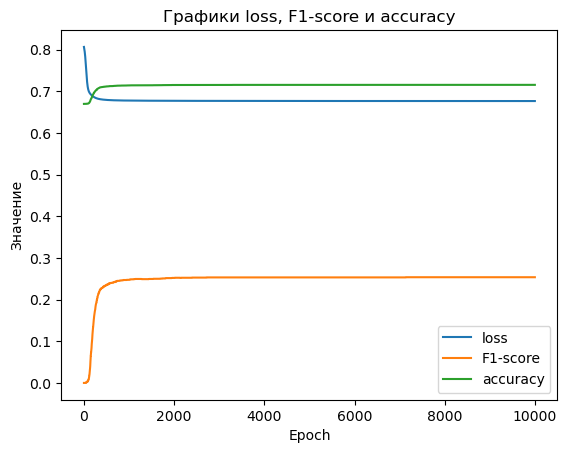

In [54]:
# построение графика loss
plt.plot(diagdf['Epoch'], diagdf['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf['Epoch'], diagdf['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf['Epoch'], diagdf['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [55]:
pred_test1=Mk1.forward(x_test.float())
pred_test_binarized1 = (pred_test1 > 0.5).float()

In [56]:
print(classification_report(y_test.to('cpu'), pred_test_binarized1.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.68      0.94      0.79      3216
         1.0       0.33      0.06      0.10      1542

    accuracy                           0.66      4758
   macro avg       0.50      0.50      0.44      4758
weighted avg       0.56      0.66      0.56      4758



In [57]:
#----------------------------------------------

<font color='red'>Experiment_#2</font>

<font color='red'>epochs: 10000 -> 5050, hidden_size: 200 -> 300, lr: 0.0001 -> 0.001</font>

In [58]:
#----------------------------------------------

In [59]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK2(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK2, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
        
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.relu(out)
        out = self.fc2(out)
        return out

In [60]:
Mk2=MLP_MK2(1000,300,1) #изменить название переменной

In [61]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [62]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [63]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [64]:
Mk2=Mk2.to(dev)

In [65]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk2.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf1=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(5050):
    optimizer.zero_grad()
    pred = Mk2.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf1 = pd.concat([diagdf1, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.6906301379203796   f1-score: 0.0   accuracy: 0.6694594621658325
Epoch:  2 , Loss:  0.6891254186630249   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3 , Loss:  0.6876401901245117   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4 , Loss:  0.6861746311187744   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5 , Loss:  0.6847159266471863   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6 , Loss:  0.6832631230354309   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7 , Loss:  0.6818178296089172   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8 , Loss:  0.6803777813911438   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9 , Loss:  0.6789357662200928   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  10 , Loss:  0.6774953603744507   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  11 , Loss:  0.6760486364364624   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  12 , Loss:  0.6745932102203369   f1-score: 0.0   accura

Epoch:  112 , Loss:  0.5863053798675537   f1-score: 0.22872087359428406   accuracy: 0.707747757434845
Epoch:  113 , Loss:  0.585838794708252   f1-score: 0.22992874681949615   accuracy: 0.707927942276001
Epoch:  114 , Loss:  0.5853788256645203   f1-score: 0.2298741340637207   accuracy: 0.7078378200531006
Epoch:  115 , Loss:  0.584925651550293   f1-score: 0.23107947409152985   accuracy: 0.7080180048942566
Epoch:  116 , Loss:  0.5844791531562805   f1-score: 0.23186343908309937   accuracy: 0.708108127117157
Epoch:  117 , Loss:  0.5840396285057068   f1-score: 0.234375   accuracy: 0.7086486220359802
Epoch:  118 , Loss:  0.583607017993927   f1-score: 0.23604540526866913   accuracy: 0.7090089917182922
Epoch:  119 , Loss:  0.5831811428070068   f1-score: 0.23765650391578674   accuracy: 0.7092792987823486
Epoch:  120 , Loss:  0.5827619433403015   f1-score: 0.23843248188495636   accuracy: 0.7093693614006042
Epoch:  121 , Loss:  0.5823494791984558   f1-score: 0.23926380276679993   accuracy: 0.70954

Epoch:  220 , Loss:  0.5633577704429626   f1-score: 0.2545454502105713   accuracy: 0.7118918895721436
Epoch:  221 , Loss:  0.5632820129394531   f1-score: 0.2545454502105713   accuracy: 0.7118918895721436
Epoch:  222 , Loss:  0.5632073283195496   f1-score: 0.2545454502105713   accuracy: 0.7118918895721436
Epoch:  223 , Loss:  0.5631336569786072   f1-score: 0.2545454502105713   accuracy: 0.7118918895721436
Epoch:  224 , Loss:  0.5630609393119812   f1-score: 0.2545454502105713   accuracy: 0.7118918895721436
Epoch:  225 , Loss:  0.5629891157150269   f1-score: 0.2545454502105713   accuracy: 0.7118918895721436
Epoch:  226 , Loss:  0.5629182457923889   f1-score: 0.25495222210884094   accuracy: 0.7119819521903992
Epoch:  227 , Loss:  0.5628483295440674   f1-score: 0.25495222210884094   accuracy: 0.7119819521903992
Epoch:  228 , Loss:  0.5627793073654175   f1-score: 0.25495222210884094   accuracy: 0.7119819521903992
Epoch:  229 , Loss:  0.5627111792564392   f1-score: 0.25495222210884094   accur

Epoch:  322 , Loss:  0.5587344169616699   f1-score: 0.2561829090118408   accuracy: 0.7127928137779236
Epoch:  323 , Loss:  0.5587071776390076   f1-score: 0.2561829090118408   accuracy: 0.7127928137779236
Epoch:  324 , Loss:  0.55867999792099   f1-score: 0.2561829090118408   accuracy: 0.7127928137779236
Epoch:  325 , Loss:  0.5586531758308411   f1-score: 0.2561829090118408   accuracy: 0.7127928137779236
Epoch:  326 , Loss:  0.5586265325546265   f1-score: 0.2561829090118408   accuracy: 0.7127928137779236
Epoch:  327 , Loss:  0.5585999488830566   f1-score: 0.2561829090118408   accuracy: 0.7127928137779236
Epoch:  328 , Loss:  0.5585737228393555   f1-score: 0.2561829090118408   accuracy: 0.7127928137779236
Epoch:  329 , Loss:  0.5585477352142334   f1-score: 0.25624269247055054   accuracy: 0.7128828763961792
Epoch:  330 , Loss:  0.5585218071937561   f1-score: 0.25624269247055054   accuracy: 0.7128828763961792
Epoch:  331 , Loss:  0.5584960579872131   f1-score: 0.25624269247055054   accuracy

Epoch:  425 , Loss:  0.5566897988319397   f1-score: 0.25746268033981323   accuracy: 0.7131531238555908
Epoch:  426 , Loss:  0.5566752552986145   f1-score: 0.25746268033981323   accuracy: 0.7131531238555908
Epoch:  427 , Loss:  0.5566607117652893   f1-score: 0.25746268033981323   accuracy: 0.7131531238555908
Epoch:  428 , Loss:  0.5566462874412537   f1-score: 0.25746268033981323   accuracy: 0.7131531238555908
Epoch:  429 , Loss:  0.556631863117218   f1-score: 0.25746268033981323   accuracy: 0.7131531238555908
Epoch:  430 , Loss:  0.5566176176071167   f1-score: 0.25746268033981323   accuracy: 0.7131531238555908
Epoch:  431 , Loss:  0.5566033124923706   f1-score: 0.25746268033981323   accuracy: 0.7131531238555908
Epoch:  432 , Loss:  0.5565891861915588   f1-score: 0.25746268033981323   accuracy: 0.7131531238555908
Epoch:  433 , Loss:  0.5565751194953918   f1-score: 0.25746268033981323   accuracy: 0.7131531238555908
Epoch:  434 , Loss:  0.5565611124038696   f1-score: 0.25746268033981323   

Epoch:  531 , Loss:  0.555444061756134   f1-score: 0.2579892575740814   accuracy: 0.7134234309196472
Epoch:  532 , Loss:  0.5554343461990356   f1-score: 0.2579892575740814   accuracy: 0.7134234309196472
Epoch:  533 , Loss:  0.5554247498512268   f1-score: 0.2579892575740814   accuracy: 0.7134234309196472
Epoch:  534 , Loss:  0.5554152131080627   f1-score: 0.2583955228328705   accuracy: 0.7135134935379028
Epoch:  535 , Loss:  0.5554056763648987   f1-score: 0.2583955228328705   accuracy: 0.7135134935379028
Epoch:  536 , Loss:  0.5553961396217346   f1-score: 0.2583955228328705   accuracy: 0.7135134935379028
Epoch:  537 , Loss:  0.5553866624832153   f1-score: 0.2583955228328705   accuracy: 0.7135134935379028
Epoch:  538 , Loss:  0.555377185344696   f1-score: 0.2583955228328705   accuracy: 0.7135134935379028
Epoch:  539 , Loss:  0.5553677678108215   f1-score: 0.2583955228328705   accuracy: 0.7135134935379028
Epoch:  540 , Loss:  0.5553584098815918   f1-score: 0.2583955228328705   accuracy: 0

Epoch:  636 , Loss:  0.5545570254325867   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  637 , Loss:  0.5545494556427002   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  638 , Loss:  0.5545420050621033   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  639 , Loss:  0.5545344352722168   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  640 , Loss:  0.5545269846916199   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  641 , Loss:  0.5545194149017334   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  642 , Loss:  0.5545119643211365   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  643 , Loss:  0.5545044541358948   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  644 , Loss:  0.5544968843460083   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  645 , Loss:  0.5544894933700562   f1-score: 0.25920745730400085  

Epoch:  742 , Loss:  0.5538142919540405   f1-score: 0.25890570878982544   accuracy: 0.7132432460784912
Epoch:  743 , Loss:  0.5538078546524048   f1-score: 0.25890570878982544   accuracy: 0.7132432460784912
Epoch:  744 , Loss:  0.553801417350769   f1-score: 0.25890570878982544   accuracy: 0.7132432460784912
Epoch:  745 , Loss:  0.5537949800491333   f1-score: 0.25890570878982544   accuracy: 0.7132432460784912
Epoch:  746 , Loss:  0.5537884831428528   f1-score: 0.25890570878982544   accuracy: 0.7132432460784912
Epoch:  747 , Loss:  0.553782045841217   f1-score: 0.25890570878982544   accuracy: 0.7132432460784912
Epoch:  748 , Loss:  0.5537755489349365   f1-score: 0.25890570878982544   accuracy: 0.7132432460784912
Epoch:  749 , Loss:  0.553769052028656   f1-score: 0.25890570878982544   accuracy: 0.7132432460784912
Epoch:  750 , Loss:  0.5537626147270203   f1-score: 0.25890570878982544   accuracy: 0.7132432460784912
Epoch:  751 , Loss:  0.5537562370300293   f1-score: 0.25890570878982544   ac

Epoch:  848 , Loss:  0.5531601309776306   f1-score: 0.2593109905719757   accuracy: 0.7133333086967468
Epoch:  849 , Loss:  0.5531542301177979   f1-score: 0.2593109905719757   accuracy: 0.7133333086967468
Epoch:  850 , Loss:  0.5531483292579651   f1-score: 0.2593109905719757   accuracy: 0.7133333086967468
Epoch:  851 , Loss:  0.5531424283981323   f1-score: 0.2593713700771332   accuracy: 0.7134234309196472
Epoch:  852 , Loss:  0.5531364679336548   f1-score: 0.2593713700771332   accuracy: 0.7134234309196472
Epoch:  853 , Loss:  0.553130567073822   f1-score: 0.2593713700771332   accuracy: 0.7134234309196472
Epoch:  854 , Loss:  0.5531246066093445   f1-score: 0.2593713700771332   accuracy: 0.7134234309196472
Epoch:  855 , Loss:  0.5531187653541565   f1-score: 0.2593713700771332   accuracy: 0.7134234309196472
Epoch:  856 , Loss:  0.553112804889679   f1-score: 0.2593713700771332   accuracy: 0.7134234309196472
Epoch:  857 , Loss:  0.5531069040298462   f1-score: 0.2593713700771332   accuracy: 0

Epoch:  953 , Loss:  0.5525593757629395   f1-score: 0.2601815164089203   accuracy: 0.7136036157608032
Epoch:  954 , Loss:  0.5525538325309753   f1-score: 0.2601815164089203   accuracy: 0.7136036157608032
Epoch:  955 , Loss:  0.5525482296943665   f1-score: 0.2601815164089203   accuracy: 0.7136036157608032
Epoch:  956 , Loss:  0.5525427460670471   f1-score: 0.2601815164089203   accuracy: 0.7136036157608032
Epoch:  957 , Loss:  0.552537202835083   f1-score: 0.2601815164089203   accuracy: 0.7136036157608032
Epoch:  958 , Loss:  0.5525317192077637   f1-score: 0.2601815164089203   accuracy: 0.7136036157608032
Epoch:  959 , Loss:  0.5525261163711548   f1-score: 0.2601815164089203   accuracy: 0.7136036157608032
Epoch:  960 , Loss:  0.5525205731391907   f1-score: 0.2601815164089203   accuracy: 0.7136036157608032
Epoch:  961 , Loss:  0.5525150299072266   f1-score: 0.2601815164089203   accuracy: 0.7136036157608032
Epoch:  962 , Loss:  0.5525094866752625   f1-score: 0.2601815164089203   accuracy: 

Epoch:  1058 , Loss:  0.55198073387146   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  1059 , Loss:  0.5519750714302063   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  1060 , Loss:  0.5519694089889526   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  1061 , Loss:  0.5519636273384094   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  1062 , Loss:  0.5519579648971558   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  1063 , Loss:  0.5519523620605469   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  1064 , Loss:  0.5519468188285828   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  1065 , Loss:  0.5519412755966187   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  1066 , Loss:  0.5519356727600098   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  1067 , Loss:  0.5519300699234009   f1-score: 0.26082906126

Epoch:  1162 , Loss:  0.5514051914215088   f1-score: 0.2631334364414215   accuracy: 0.7144144177436829
Epoch:  1163 , Loss:  0.551399827003479   f1-score: 0.2631334364414215   accuracy: 0.7144144177436829
Epoch:  1164 , Loss:  0.551394522190094   f1-score: 0.2631334364414215   accuracy: 0.7144144177436829
Epoch:  1165 , Loss:  0.5513893365859985   f1-score: 0.2631334364414215   accuracy: 0.7144144177436829
Epoch:  1166 , Loss:  0.5513840317726135   f1-score: 0.2631334364414215   accuracy: 0.7144144177436829
Epoch:  1167 , Loss:  0.5513787865638733   f1-score: 0.2631334364414215   accuracy: 0.7144144177436829
Epoch:  1168 , Loss:  0.5513736009597778   f1-score: 0.2631334364414215   accuracy: 0.7144144177436829
Epoch:  1169 , Loss:  0.5513684153556824   f1-score: 0.2631334364414215   accuracy: 0.7144144177436829
Epoch:  1170 , Loss:  0.5513631701469421   f1-score: 0.2631334364414215   accuracy: 0.7144144177436829
Epoch:  1171 , Loss:  0.5513579845428467   f1-score: 0.2631334364414215   a

Epoch:  1275 , Loss:  0.5508239269256592   f1-score: 0.26319462060928345   accuracy: 0.7145044803619385
Epoch:  1276 , Loss:  0.5508188009262085   f1-score: 0.2632558047771454   accuracy: 0.7145946025848389
Epoch:  1277 , Loss:  0.5508137941360474   f1-score: 0.26319462060928345   accuracy: 0.7145044803619385
Epoch:  1278 , Loss:  0.5508084297180176   f1-score: 0.2632558047771454   accuracy: 0.7145946025848389
Epoch:  1279 , Loss:  0.5508033633232117   f1-score: 0.26319462060928345   accuracy: 0.7145044803619385
Epoch:  1280 , Loss:  0.5507980585098267   f1-score: 0.2632558047771454   accuracy: 0.7145946025848389
Epoch:  1281 , Loss:  0.5507929921150208   f1-score: 0.26319462060928345   accuracy: 0.7145044803619385
Epoch:  1282 , Loss:  0.5507877469062805   f1-score: 0.2632558047771454   accuracy: 0.7145946025848389
Epoch:  1283 , Loss:  0.5507826805114746   f1-score: 0.26319462060928345   accuracy: 0.7145044803619385
Epoch:  1284 , Loss:  0.5507774949073792   f1-score: 0.2631946206092

Epoch:  1389 , Loss:  0.5502541065216064   f1-score: 0.2639405131340027   accuracy: 0.7145946025848389
Epoch:  1390 , Loss:  0.550248920917511   f1-score: 0.2639405131340027   accuracy: 0.7145946025848389
Epoch:  1391 , Loss:  0.5502437949180603   f1-score: 0.2639405131340027   accuracy: 0.7145946025848389
Epoch:  1392 , Loss:  0.5502390265464783   f1-score: 0.2639405131340027   accuracy: 0.7145946025848389
Epoch:  1393 , Loss:  0.550234317779541   f1-score: 0.2639405131340027   accuracy: 0.7145946025848389
Epoch:  1394 , Loss:  0.5502297282218933   f1-score: 0.2639405131340027   accuracy: 0.7145946025848389
Epoch:  1395 , Loss:  0.5502253770828247   f1-score: 0.2640632390975952   accuracy: 0.7147747874259949
Epoch:  1396 , Loss:  0.5502210855484009   f1-score: 0.2639405131340027   accuracy: 0.7145946025848389
Epoch:  1397 , Loss:  0.5502166748046875   f1-score: 0.26412463188171387   accuracy: 0.7148648500442505
Epoch:  1398 , Loss:  0.5502123236656189   f1-score: 0.2639405131340027   

Epoch:  1501 , Loss:  0.5497286915779114   f1-score: 0.2641860544681549   accuracy: 0.7149549722671509
Epoch:  1502 , Loss:  0.5497240424156189   f1-score: 0.2639405131340027   accuracy: 0.7145946025848389
Epoch:  1503 , Loss:  0.5497189164161682   f1-score: 0.2641860544681549   accuracy: 0.7149549722671509
Epoch:  1504 , Loss:  0.549713134765625   f1-score: 0.26412463188171387   accuracy: 0.7148648500442505
Epoch:  1505 , Loss:  0.5497074723243713   f1-score: 0.26412463188171387   accuracy: 0.7148648500442505
Epoch:  1506 , Loss:  0.5497024059295654   f1-score: 0.26412463188171387   accuracy: 0.7148648500442505
Epoch:  1507 , Loss:  0.5496978759765625   f1-score: 0.26412463188171387   accuracy: 0.7148648500442505
Epoch:  1508 , Loss:  0.5496935248374939   f1-score: 0.26412463188171387   accuracy: 0.7148648500442505
Epoch:  1509 , Loss:  0.5496894717216492   f1-score: 0.26412463188171387   accuracy: 0.7148648500442505
Epoch:  1510 , Loss:  0.5496852993965149   f1-score: 0.2641860544681

Epoch:  1616 , Loss:  0.5492039322853088   f1-score: 0.2646511495113373   accuracy: 0.7151351571083069
Epoch:  1617 , Loss:  0.5492002964019775   f1-score: 0.2645281255245209   accuracy: 0.7149549722671509
Epoch:  1618 , Loss:  0.5491964221000671   f1-score: 0.2646511495113373   accuracy: 0.7151351571083069
Epoch:  1619 , Loss:  0.5491921305656433   f1-score: 0.26486989855766296   accuracy: 0.7149549722671509
Epoch:  1620 , Loss:  0.5491875410079956   f1-score: 0.2646511495113373   accuracy: 0.7151351571083069
Epoch:  1621 , Loss:  0.5491825938224792   f1-score: 0.26493144035339355   accuracy: 0.7150450348854065
Epoch:  1622 , Loss:  0.5491776466369629   f1-score: 0.2646511495113373   accuracy: 0.7151351571083069
Epoch:  1623 , Loss:  0.5491726398468018   f1-score: 0.2645896375179291   accuracy: 0.7150450348854065
Epoch:  1624 , Loss:  0.5491679906845093   f1-score: 0.2645896375179291   accuracy: 0.7150450348854065
Epoch:  1625 , Loss:  0.5491635203361511   f1-score: 0.2645896375179291

Epoch:  1724 , Loss:  0.5487447381019592   f1-score: 0.26579925417900085   accuracy: 0.7153153419494629
Epoch:  1725 , Loss:  0.5487411618232727   f1-score: 0.26573750376701355   accuracy: 0.7152252197265625
Epoch:  1726 , Loss:  0.5487377047538757   f1-score: 0.26579925417900085   accuracy: 0.7153153419494629
Epoch:  1727 , Loss:  0.5487338900566101   f1-score: 0.26614028215408325   accuracy: 0.7153153419494629
Epoch:  1728 , Loss:  0.5487300157546997   f1-score: 0.26579925417900085   accuracy: 0.7153153419494629
Epoch:  1729 , Loss:  0.5487256646156311   f1-score: 0.26614028215408325   accuracy: 0.7153153419494629
Epoch:  1730 , Loss:  0.5487209558486938   f1-score: 0.26620209217071533   accuracy: 0.7154054045677185
Epoch:  1731 , Loss:  0.5487162470817566   f1-score: 0.26614028215408325   accuracy: 0.7153153419494629
Epoch:  1732 , Loss:  0.5487115383148193   f1-score: 0.26620209217071533   accuracy: 0.7154054045677185
Epoch:  1733 , Loss:  0.5487068891525269   f1-score: 0.266140282

Epoch:  1833 , Loss:  0.5483168363571167   f1-score: 0.2666666805744171   accuracy: 0.7155855894088745
Epoch:  1834 , Loss:  0.5483136177062988   f1-score: 0.26762524247169495   accuracy: 0.7154954671859741
Epoch:  1835 , Loss:  0.5483105778694153   f1-score: 0.26592281460762024   accuracy: 0.7154954671859741
Epoch:  1836 , Loss:  0.5483068823814392   f1-score: 0.26762524247169495   accuracy: 0.7154954671859741
Epoch:  1837 , Loss:  0.5483027100563049   f1-score: 0.26592281460762024   accuracy: 0.7154954671859741
Epoch:  1838 , Loss:  0.5482980608940125   f1-score: 0.2676873207092285   accuracy: 0.7155855894088745
Epoch:  1839 , Loss:  0.5482931733131409   f1-score: 0.2666666805744171   accuracy: 0.7155855894088745
Epoch:  1840 , Loss:  0.5482884049415588   f1-score: 0.26734742522239685   accuracy: 0.7155855894088745
Epoch:  1841 , Loss:  0.5482842326164246   f1-score: 0.2670072019100189   accuracy: 0.7155855894088745
Epoch:  1842 , Loss:  0.5482801795005798   f1-score: 0.2669452130794

Epoch:  1944 , Loss:  0.5479097366333008   f1-score: 0.2671312391757965   accuracy: 0.7157657742500305
Epoch:  1945 , Loss:  0.5479053854942322   f1-score: 0.26756319403648376   accuracy: 0.7154054045677185
Epoch:  1946 , Loss:  0.5479013919830322   f1-score: 0.2670692205429077   accuracy: 0.7156756520271301
Epoch:  1947 , Loss:  0.5478975176811218   f1-score: 0.26728537678718567   accuracy: 0.7154954671859741
Epoch:  1948 , Loss:  0.5478940606117249   f1-score: 0.26728537678718567   accuracy: 0.7154954671859741
Epoch:  1949 , Loss:  0.5478906631469727   f1-score: 0.2674715518951416   accuracy: 0.7157657742500305
Epoch:  1950 , Loss:  0.54788738489151   f1-score: 0.26756319403648376   accuracy: 0.7154054045677185
Epoch:  1951 , Loss:  0.5478844046592712   f1-score: 0.26753365993499756   accuracy: 0.7158558368682861
Epoch:  1952 , Loss:  0.5478813648223877   f1-score: 0.26756319403648376   accuracy: 0.7154054045677185
Epoch:  1953 , Loss:  0.5478783845901489   f1-score: 0.26753365993499

Epoch:  2052 , Loss:  0.5475400686264038   f1-score: 0.2669452130794525   accuracy: 0.7154954671859741
Epoch:  2053 , Loss:  0.5475360155105591   f1-score: 0.2670072019100189   accuracy: 0.7155855894088745
Epoch:  2054 , Loss:  0.5475327372550964   f1-score: 0.2670072019100189   accuracy: 0.7155855894088745
Epoch:  2055 , Loss:  0.5475301146507263   f1-score: 0.2669452130794525   accuracy: 0.7154954671859741
Epoch:  2056 , Loss:  0.5475279688835144   f1-score: 0.2670072019100189   accuracy: 0.7155855894088745
Epoch:  2057 , Loss:  0.5475262403488159   f1-score: 0.26728537678718567   accuracy: 0.7154954671859741
Epoch:  2058 , Loss:  0.547524631023407   f1-score: 0.2670072019100189   accuracy: 0.7155855894088745
Epoch:  2059 , Loss:  0.5475223660469055   f1-score: 0.26722338795661926   accuracy: 0.7154054045677185
Epoch:  2060 , Loss:  0.5475192666053772   f1-score: 0.2670692205429077   accuracy: 0.7156756520271301
Epoch:  2061 , Loss:  0.5475153923034668   f1-score: 0.26722338795661926

Epoch:  2165 , Loss:  0.5471792221069336   f1-score: 0.2662639319896698   accuracy: 0.7154954671859741
Epoch:  2166 , Loss:  0.5471764802932739   f1-score: 0.26654285192489624   accuracy: 0.7154054045677185
Epoch:  2167 , Loss:  0.5471739172935486   f1-score: 0.26586103439331055   accuracy: 0.7154054045677185
Epoch:  2168 , Loss:  0.5471710562705994   f1-score: 0.26654285192489624   accuracy: 0.7154054045677185
Epoch:  2169 , Loss:  0.547167956829071   f1-score: 0.26586103439331055   accuracy: 0.7154054045677185
Epoch:  2170 , Loss:  0.5471646189689636   f1-score: 0.26654285192489624   accuracy: 0.7154054045677185
Epoch:  2171 , Loss:  0.5471608638763428   f1-score: 0.26586103439331055   accuracy: 0.7154054045677185
Epoch:  2172 , Loss:  0.5471572279930115   f1-score: 0.26654285192489624   accuracy: 0.7154054045677185
Epoch:  2173 , Loss:  0.5471537709236145   f1-score: 0.2662639319896698   accuracy: 0.7154954671859741
Epoch:  2174 , Loss:  0.5471500754356384   f1-score: 0.266542851924

Epoch:  2276 , Loss:  0.5468460917472839   f1-score: 0.2663877308368683   accuracy: 0.7156756520271301
Epoch:  2277 , Loss:  0.5468425750732422   f1-score: 0.26787373423576355   accuracy: 0.7158558368682861
Epoch:  2278 , Loss:  0.5468392968177795   f1-score: 0.26632583141326904   accuracy: 0.7155855894088745
Epoch:  2279 , Loss:  0.5468363165855408   f1-score: 0.26672860980033875   accuracy: 0.7156756520271301
Epoch:  2280 , Loss:  0.5468333959579468   f1-score: 0.26672860980033875   accuracy: 0.7156756520271301
Epoch:  2281 , Loss:  0.5468308329582214   f1-score: 0.26672860980033875   accuracy: 0.7156756520271301
Epoch:  2282 , Loss:  0.5468282103538513   f1-score: 0.2674715518951416   accuracy: 0.7157657742500305
Epoch:  2283 , Loss:  0.5468257069587708   f1-score: 0.26679059863090515   accuracy: 0.7157657742500305
Epoch:  2284 , Loss:  0.5468234419822693   f1-score: 0.2678115665912628   accuracy: 0.7157657742500305
Epoch:  2285 , Loss:  0.5468211770057678   f1-score: 0.266790598630

Epoch:  2388 , Loss:  0.546536386013031   f1-score: 0.26787373423576355   accuracy: 0.7158558368682861
Epoch:  2389 , Loss:  0.54653400182724   f1-score: 0.2671312391757965   accuracy: 0.7157657742500305
Epoch:  2390 , Loss:  0.5465317964553833   f1-score: 0.2682757079601288   accuracy: 0.7159459590911865
Epoch:  2391 , Loss:  0.5465295314788818   f1-score: 0.26725539565086365   accuracy: 0.7159459590911865
Epoch:  2392 , Loss:  0.5465275049209595   f1-score: 0.2682134509086609   accuracy: 0.7158558368682861
Epoch:  2393 , Loss:  0.5465252995491028   f1-score: 0.26725539565086365   accuracy: 0.7159459590911865
Epoch:  2394 , Loss:  0.5465232133865356   f1-score: 0.2682134509086609   accuracy: 0.7158558368682861
Epoch:  2395 , Loss:  0.546521008014679   f1-score: 0.26725539565086365   accuracy: 0.7159459590911865
Epoch:  2396 , Loss:  0.5465188026428223   f1-score: 0.2682134509086609   accuracy: 0.7158558368682861
Epoch:  2397 , Loss:  0.5465161800384521   f1-score: 0.26725539565086365 

Epoch:  2501 , Loss:  0.5462201833724976   f1-score: 0.2680603861808777   accuracy: 0.7161261439323425
Epoch:  2502 , Loss:  0.5462176203727722   f1-score: 0.2688022255897522   accuracy: 0.7162162065505981
Epoch:  2503 , Loss:  0.5462153553962708   f1-score: 0.26818498969078064   accuracy: 0.7163063287734985
Epoch:  2504 , Loss:  0.5462132692337036   f1-score: 0.2690790891647339   accuracy: 0.7161261439323425
Epoch:  2505 , Loss:  0.5462115406990051   f1-score: 0.26778241991996765   accuracy: 0.7162162065505981
Epoch:  2506 , Loss:  0.546209990978241   f1-score: 0.2690790891647339   accuracy: 0.7161261439323425
Epoch:  2507 , Loss:  0.5462086796760559   f1-score: 0.26778241991996765   accuracy: 0.7162162065505981
Epoch:  2508 , Loss:  0.5462068915367126   f1-score: 0.2690790891647339   accuracy: 0.7161261439323425
Epoch:  2509 , Loss:  0.5462047457695007   f1-score: 0.26778241991996765   accuracy: 0.7162162065505981
Epoch:  2510 , Loss:  0.5462019443511963   f1-score: 0.269079089164733

Epoch:  2615 , Loss:  0.5459049940109253   f1-score: 0.2699187099933624   accuracy: 0.7168468236923218
Epoch:  2616 , Loss:  0.5459027886390686   f1-score: 0.2696681320667267   accuracy: 0.7164865136146545
Epoch:  2617 , Loss:  0.5459011197090149   f1-score: 0.2699187099933624   accuracy: 0.7168468236923218
Epoch:  2618 , Loss:  0.5459001064300537   f1-score: 0.26994433999061584   accuracy: 0.7163963913917542
Epoch:  2619 , Loss:  0.5458995699882507   f1-score: 0.2699187099933624   accuracy: 0.7168468236923218
Epoch:  2620 , Loss:  0.5458981990814209   f1-score: 0.2703454792499542   accuracy: 0.7164865136146545
Epoch:  2621 , Loss:  0.5458961725234985   f1-score: 0.2699187099933624   accuracy: 0.7168468236923218
Epoch:  2622 , Loss:  0.5458929538726807   f1-score: 0.2703454792499542   accuracy: 0.7164865136146545
Epoch:  2623 , Loss:  0.5458884835243225   f1-score: 0.2699187099933624   accuracy: 0.7168468236923218
Epoch:  2624 , Loss:  0.5458834767341614   f1-score: 0.26994433999061584

Epoch:  2728 , Loss:  0.5455936789512634   f1-score: 0.2695167362689972   accuracy: 0.7167567610740662
Epoch:  2729 , Loss:  0.5455922484397888   f1-score: 0.27047088742256165   accuracy: 0.7166666388511658
Epoch:  2730 , Loss:  0.5455901026725769   f1-score: 0.2695167362689972   accuracy: 0.7167567610740662
Epoch:  2731 , Loss:  0.5455874800682068   f1-score: 0.27047088742256165   accuracy: 0.7166666388511658
Epoch:  2732 , Loss:  0.5455840229988098   f1-score: 0.2695167362689972   accuracy: 0.7167567610740662
Epoch:  2733 , Loss:  0.5455797910690308   f1-score: 0.27047088742256165   accuracy: 0.7166666388511658
Epoch:  2734 , Loss:  0.5455755591392517   f1-score: 0.2695167362689972   accuracy: 0.7167567610740662
Epoch:  2735 , Loss:  0.5455713868141174   f1-score: 0.2697933614253998   accuracy: 0.7166666388511658
Epoch:  2736 , Loss:  0.5455678105354309   f1-score: 0.26945412158966064   accuracy: 0.7166666388511658
Epoch:  2737 , Loss:  0.5455647110939026   f1-score: 0.26945412158966

Epoch:  2840 , Loss:  0.5452823042869568   f1-score: 0.27152472734451294   accuracy: 0.7172071933746338
Epoch:  2841 , Loss:  0.5452794432640076   f1-score: 0.27152472734451294   accuracy: 0.7172071933746338
Epoch:  2842 , Loss:  0.5452767014503479   f1-score: 0.27152472734451294   accuracy: 0.7172071933746338
Epoch:  2843 , Loss:  0.5452739596366882   f1-score: 0.27152472734451294   accuracy: 0.7172071933746338
Epoch:  2844 , Loss:  0.5452712774276733   f1-score: 0.27152472734451294   accuracy: 0.7172071933746338
Epoch:  2845 , Loss:  0.5452685952186584   f1-score: 0.27152472734451294   accuracy: 0.7172071933746338
Epoch:  2846 , Loss:  0.5452659130096436   f1-score: 0.27152472734451294   accuracy: 0.7172071933746338
Epoch:  2847 , Loss:  0.5452632904052734   f1-score: 0.2711234986782074   accuracy: 0.7171171307563782
Epoch:  2848 , Loss:  0.5452607274055481   f1-score: 0.27152472734451294   accuracy: 0.7172071933746338
Epoch:  2849 , Loss:  0.5452584028244019   f1-score: 0.2711234986

Epoch:  2951 , Loss:  0.5449791550636292   f1-score: 0.27266404032707214   accuracy: 0.7173873782157898
Epoch:  2952 , Loss:  0.5449768900871277   f1-score: 0.27226343750953674   accuracy: 0.7172973155975342
Epoch:  2953 , Loss:  0.5449747443199158   f1-score: 0.27266404032707214   accuracy: 0.7173873782157898
Epoch:  2954 , Loss:  0.5449726581573486   f1-score: 0.2718626856803894   accuracy: 0.7172071933746338
Epoch:  2955 , Loss:  0.5449705123901367   f1-score: 0.27260082960128784   accuracy: 0.7172973155975342
Epoch:  2956 , Loss:  0.5449681878089905   f1-score: 0.2718626856803894   accuracy: 0.7172071933746338
Epoch:  2957 , Loss:  0.5449658632278442   f1-score: 0.2729378938674927   accuracy: 0.7172973155975342
Epoch:  2958 , Loss:  0.5449627637863159   f1-score: 0.2718626856803894   accuracy: 0.7172071933746338
Epoch:  2959 , Loss:  0.544959306716919   f1-score: 0.27260082960128784   accuracy: 0.7172973155975342
Epoch:  2960 , Loss:  0.5449552536010742   f1-score: 0.27226343750953

Epoch:  3058 , Loss:  0.5446598529815674   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3059 , Loss:  0.5446568727493286   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3060 , Loss:  0.5446540117263794   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3061 , Loss:  0.5446513295173645   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3062 , Loss:  0.5446486473083496   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3063 , Loss:  0.5446459650993347   f1-score: 0.2744552493095398   accuracy: 0.7180179953575134
Epoch:  3064 , Loss:  0.5446436405181885   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3065 , Loss:  0.5446416735649109   f1-score: 0.2745189070701599   accuracy: 0.7181081175804138
Epoch:  3066 , Loss:  0.5446397662162781   f1-score: 0.2747914791107178   accuracy: 0.7180179953575134
Epoch:  3067 , Loss:  0.5446382164955139   f1-score: 0.274118751287

Epoch:  3172 , Loss:  0.5443196892738342   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  3173 , Loss:  0.544317901134491   f1-score: 0.27591004967689514   accuracy: 0.7186486721038818
Epoch:  3174 , Loss:  0.5443161725997925   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  3175 , Loss:  0.5443139672279358   f1-score: 0.276245653629303   accuracy: 0.7186486721038818
Epoch:  3176 , Loss:  0.5443114638328552   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  3177 , Loss:  0.5443078875541687   f1-score: 0.2766450345516205   accuracy: 0.7187387347221375
Epoch:  3178 , Loss:  0.5443034768104553   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  3179 , Loss:  0.5442986488342285   f1-score: 0.27591004967689514   accuracy: 0.7186486721038818
Epoch:  3180 , Loss:  0.5442938208580017   f1-score: 0.27551019191741943   accuracy: 0.7185585498809814
Epoch:  3181 , Loss:  0.5442888140678406   f1-score: 0.27591004967689514

Epoch:  3285 , Loss:  0.5439663529396057   f1-score: 0.2763737440109253   accuracy: 0.7188288569450378
Epoch:  3286 , Loss:  0.5439635515213013   f1-score: 0.2763737440109253   accuracy: 0.7188288569450378
Epoch:  3287 , Loss:  0.5439610481262207   f1-score: 0.2763737440109253   accuracy: 0.7188288569450378
Epoch:  3288 , Loss:  0.5439585447311401   f1-score: 0.2759740352630615   accuracy: 0.7187387347221375
Epoch:  3289 , Loss:  0.5439562201499939   f1-score: 0.2767733037471771   accuracy: 0.7189189195632935
Epoch:  3290 , Loss:  0.5439541339874268   f1-score: 0.2759740352630615   accuracy: 0.7187387347221375
Epoch:  3291 , Loss:  0.5439521074295044   f1-score: 0.2767733037471771   accuracy: 0.7189189195632935
Epoch:  3292 , Loss:  0.5439497232437134   f1-score: 0.2759740352630615   accuracy: 0.7187387347221375
Epoch:  3293 , Loss:  0.5439474582672119   f1-score: 0.2767733037471771   accuracy: 0.7189189195632935
Epoch:  3294 , Loss:  0.5439445972442627   f1-score: 0.2759740352630615  

Epoch:  3396 , Loss:  0.5436238050460815   f1-score: 0.2767733037471771   accuracy: 0.7189189195632935
Epoch:  3397 , Loss:  0.5436208844184875   f1-score: 0.27717265486717224   accuracy: 0.7190089821815491
Epoch:  3398 , Loss:  0.5436179637908936   f1-score: 0.2767733037471771   accuracy: 0.7189189195632935
Epoch:  3399 , Loss:  0.5436153411865234   f1-score: 0.27717265486717224   accuracy: 0.7190089821815491
Epoch:  3400 , Loss:  0.5436128377914429   f1-score: 0.2763737440109253   accuracy: 0.7188288569450378
Epoch:  3401 , Loss:  0.543610692024231   f1-score: 0.27717265486717224   accuracy: 0.7190089821815491
Epoch:  3402 , Loss:  0.5436086058616638   f1-score: 0.2764378488063812   accuracy: 0.7189189195632935
Epoch:  3403 , Loss:  0.5436066389083862   f1-score: 0.27717265486717224   accuracy: 0.7190089821815491
Epoch:  3404 , Loss:  0.5436050295829773   f1-score: 0.27656611800193787   accuracy: 0.7190991044044495
Epoch:  3405 , Loss:  0.5436034202575684   f1-score: 0.27717265486717

Epoch:  3510 , Loss:  0.5432868003845215   f1-score: 0.27675876021385193   accuracy: 0.7193693518638611
Epoch:  3511 , Loss:  0.5432855486869812   f1-score: 0.27534884214401245   accuracy: 0.7192792892456055
Epoch:  3512 , Loss:  0.5432838797569275   f1-score: 0.27709445357322693   accuracy: 0.7193693518638611
Epoch:  3513 , Loss:  0.5432810187339783   f1-score: 0.2749476730823517   accuracy: 0.7191891670227051
Epoch:  3514 , Loss:  0.543276846408844   f1-score: 0.27709445357322693   accuracy: 0.7193693518638611
Epoch:  3515 , Loss:  0.5432717204093933   f1-score: 0.2749476730823517   accuracy: 0.7191891670227051
Epoch:  3516 , Loss:  0.5432657599449158   f1-score: 0.27675876021385193   accuracy: 0.7193693518638611
Epoch:  3517 , Loss:  0.5432599782943726   f1-score: 0.27534884214401245   accuracy: 0.7192792892456055
Epoch:  3518 , Loss:  0.5432546734809875   f1-score: 0.2768230438232422   accuracy: 0.7194594740867615
Epoch:  3519 , Loss:  0.543250560760498   f1-score: 0.27648699283599

Epoch:  3625 , Loss:  0.5429277420043945   f1-score: 0.2757498323917389   accuracy: 0.7193693518638611
Epoch:  3626 , Loss:  0.5429237484931946   f1-score: 0.2754128873348236   accuracy: 0.7193693518638611
Epoch:  3627 , Loss:  0.5429198741912842   f1-score: 0.2757498323917389   accuracy: 0.7193693518638611
Epoch:  3628 , Loss:  0.5429161787033081   f1-score: 0.2754128873348236   accuracy: 0.7193693518638611
Epoch:  3629 , Loss:  0.5429125428199768   f1-score: 0.27534884214401245   accuracy: 0.7192792892456055
Epoch:  3630 , Loss:  0.5429092645645142   f1-score: 0.2754128873348236   accuracy: 0.7193693518638611
Epoch:  3631 , Loss:  0.5429057478904724   f1-score: 0.27534884214401245   accuracy: 0.7192792892456055
Epoch:  3632 , Loss:  0.542902410030365   f1-score: 0.27534884214401245   accuracy: 0.7192792892456055
Epoch:  3633 , Loss:  0.5428991913795471   f1-score: 0.27534884214401245   accuracy: 0.7192792892456055
Epoch:  3634 , Loss:  0.5428959131240845   f1-score: 0.275348842144012

Epoch:  3738 , Loss:  0.5425890684127808   f1-score: 0.27547696232795715   accuracy: 0.7194594740867615
Epoch:  3739 , Loss:  0.5425863265991211   f1-score: 0.2754128873348236   accuracy: 0.7193693518638611
Epoch:  3740 , Loss:  0.5425832271575928   f1-score: 0.27547696232795715   accuracy: 0.7194594740867615
Epoch:  3741 , Loss:  0.5425804257392883   f1-score: 0.2754128873348236   accuracy: 0.7193693518638611
Epoch:  3742 , Loss:  0.5425776839256287   f1-score: 0.27547696232795715   accuracy: 0.7194594740867615
Epoch:  3743 , Loss:  0.5425748229026794   f1-score: 0.2754128873348236   accuracy: 0.7193693518638611
Epoch:  3744 , Loss:  0.5425718426704407   f1-score: 0.27547696232795715   accuracy: 0.7194594740867615
Epoch:  3745 , Loss:  0.542569100856781   f1-score: 0.2754128873348236   accuracy: 0.7193693518638611
Epoch:  3746 , Loss:  0.5425660610198975   f1-score: 0.27547696232795715   accuracy: 0.7194594740867615
Epoch:  3747 , Loss:  0.5425631403923035   f1-score: 0.27541288733482

Epoch:  3853 , Loss:  0.5422762036323547   f1-score: 0.2755410671234131   accuracy: 0.7195495367050171
Epoch:  3854 , Loss:  0.542272686958313   f1-score: 0.27594229578971863   accuracy: 0.7196396589279175
Epoch:  3855 , Loss:  0.5422692894935608   f1-score: 0.2755410671234131   accuracy: 0.7195495367050171
Epoch:  3856 , Loss:  0.5422664284706116   f1-score: 0.27594229578971863   accuracy: 0.7196396589279175
Epoch:  3857 , Loss:  0.542263388633728   f1-score: 0.2755410671234131   accuracy: 0.7195495367050171
Epoch:  3858 , Loss:  0.5422606468200684   f1-score: 0.27594229578971863   accuracy: 0.7196396589279175
Epoch:  3859 , Loss:  0.5422579646110535   f1-score: 0.2755410671234131   accuracy: 0.7195495367050171
Epoch:  3860 , Loss:  0.5422553420066833   f1-score: 0.27594229578971863   accuracy: 0.7196396589279175
Epoch:  3861 , Loss:  0.542252779006958   f1-score: 0.27594229578971863   accuracy: 0.7196396589279175
Epoch:  3862 , Loss:  0.5422502160072327   f1-score: 0.2759422957897186

Epoch:  3968 , Loss:  0.5419839024543762   f1-score: 0.27594229578971863   accuracy: 0.7196396589279175
Epoch:  3969 , Loss:  0.5419812798500061   f1-score: 0.27634334564208984   accuracy: 0.7197297215461731
Epoch:  3970 , Loss:  0.5419787764549255   f1-score: 0.27594229578971863   accuracy: 0.7196396589279175
Epoch:  3971 , Loss:  0.5419759750366211   f1-score: 0.27634334564208984   accuracy: 0.7197297215461731
Epoch:  3972 , Loss:  0.5419731736183167   f1-score: 0.27594229578971863   accuracy: 0.7196396589279175
Epoch:  3973 , Loss:  0.5419701933860779   f1-score: 0.27634334564208984   accuracy: 0.7197297215461731
Epoch:  3974 , Loss:  0.5419673919677734   f1-score: 0.27594229578971863   accuracy: 0.7196396589279175
Epoch:  3975 , Loss:  0.5419647693634033   f1-score: 0.27634334564208984   accuracy: 0.7197297215461731
Epoch:  3976 , Loss:  0.5419619083404541   f1-score: 0.27594229578971863   accuracy: 0.7196396589279175
Epoch:  3977 , Loss:  0.5419592261314392   f1-score: 0.275942295

Epoch:  4079 , Loss:  0.5417214035987854   f1-score: 0.27674418687820435   accuracy: 0.7198198437690735
Epoch:  4080 , Loss:  0.5417197942733765   f1-score: 0.27647194266319275   accuracy: 0.7199099063873291
Epoch:  4081 , Loss:  0.5417177081108093   f1-score: 0.27674418687820435   accuracy: 0.7198198437690735
Epoch:  4082 , Loss:  0.5417152643203735   f1-score: 0.27647194266319275   accuracy: 0.7199099063873291
Epoch:  4083 , Loss:  0.5417123436927795   f1-score: 0.27680855989456177   accuracy: 0.7199099063873291
Epoch:  4084 , Loss:  0.5417090058326721   f1-score: 0.27647194266319275   accuracy: 0.7199099063873291
Epoch:  4085 , Loss:  0.5417056679725647   f1-score: 0.27680855989456177   accuracy: 0.7199099063873291
Epoch:  4086 , Loss:  0.5417023301124573   f1-score: 0.27647194266319275   accuracy: 0.7199099063873291
Epoch:  4087 , Loss:  0.5416991114616394   f1-score: 0.27680855989456177   accuracy: 0.7199099063873291
Epoch:  4088 , Loss:  0.5416961312294006   f1-score: 0.276872962

Epoch:  4189 , Loss:  0.5414674878120422   f1-score: 0.2776744067668915   accuracy: 0.7201801538467407
Epoch:  4190 , Loss:  0.5414651036262512   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4191 , Loss:  0.5414626598358154   f1-score: 0.2776744067668915   accuracy: 0.7201801538467407
Epoch:  4192 , Loss:  0.5414603352546692   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4193 , Loss:  0.5414579510688782   f1-score: 0.2776744067668915   accuracy: 0.7201801538467407
Epoch:  4194 , Loss:  0.5414556860923767   f1-score: 0.27801021933555603   accuracy: 0.7201801538467407
Epoch:  4195 , Loss:  0.5414534211158752   f1-score: 0.277739018201828   accuracy: 0.7202702760696411
Epoch:  4196 , Loss:  0.5414512157440186   f1-score: 0.27801021933555603   accuracy: 0.7201801538467407
Epoch:  4197 , Loss:  0.5414491891860962   f1-score: 0.277739018201828   accuracy: 0.7202702760696411
Epoch:  4198 , Loss:  0.5414472222328186   f1-score: 0.2780102193355560

Epoch:  4299 , Loss:  0.5412289500236511   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4300 , Loss:  0.5412268042564392   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4301 , Loss:  0.5412244200706482   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4302 , Loss:  0.5412222146987915   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4303 , Loss:  0.5412201285362244   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4304 , Loss:  0.5412178635597229   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4305 , Loss:  0.5412157773971558   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4306 , Loss:  0.5412136316299438   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4307 , Loss:  0.541211724281311   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4308 , Loss:  0.5412095189094543   f1-score: 0.2780748605

Epoch:  4405 , Loss:  0.5410014986991882   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4406 , Loss:  0.540999174118042   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4407 , Loss:  0.5409971475601196   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4408 , Loss:  0.5409952998161316   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4409 , Loss:  0.5409934520721436   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4410 , Loss:  0.5409918427467346   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4411 , Loss:  0.5409900546073914   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4412 , Loss:  0.5409882068634033   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4413 , Loss:  0.5409862995147705   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4414 , Loss:  0.5409840941429138   f1-score: 0.2780748605

Epoch:  4517 , Loss:  0.5407630801200867   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4518 , Loss:  0.5407607555389404   f1-score: 0.2776744067668915   accuracy: 0.7201801538467407
Epoch:  4519 , Loss:  0.5407581925392151   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4520 , Loss:  0.5407560467720032   f1-score: 0.2776744067668915   accuracy: 0.7201801538467407
Epoch:  4521 , Loss:  0.540753960609436   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4522 , Loss:  0.5407520532608032   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4523 , Loss:  0.5407502055168152   f1-score: 0.2776744067668915   accuracy: 0.7201801538467407
Epoch:  4524 , Loss:  0.5407483577728271   f1-score: 0.27807486057281494   accuracy: 0.7202702760696411
Epoch:  4525 , Loss:  0.5407467484474182   f1-score: 0.2776744067668915   accuracy: 0.7201801538467407
Epoch:  4526 , Loss:  0.540744960308075   f1-score: 0.278074860572814

Epoch:  4631 , Loss:  0.5405461192131042   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4632 , Loss:  0.5405444502830505   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4633 , Loss:  0.5405424237251282   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4634 , Loss:  0.5405407547950745   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4635 , Loss:  0.5405389666557312   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4636 , Loss:  0.5405372381210327   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4637 , Loss:  0.5405353903770447   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4638 , Loss:  0.5405336618423462   f1-score: 0.2776744067668915   accuracy: 0.7201801538467407
Epoch:  4639 , Loss:  0.5405319929122925   f1-score: 0.27754533290863037   accuracy: 0.7200000286102295
Epoch:  4640 , Loss:  0.5405303239822388   f1-score: 0.2776744067

Epoch:  4740 , Loss:  0.5403614044189453   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4741 , Loss:  0.5403599143028259   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4742 , Loss:  0.5403585433959961   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4743 , Loss:  0.5403569340705872   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4744 , Loss:  0.5403555631637573   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4745 , Loss:  0.5403540134429932   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4746 , Loss:  0.5403525233268738   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4747 , Loss:  0.5403510332107544   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4748 , Loss:  0.5403491854667664   f1-score: 0.27760985493659973   accuracy: 0.7200900912284851
Epoch:  4749 , Loss:  0.5403472781181335   f1-score: 0.277609854

Epoch:  4853 , Loss:  0.5401796698570251   f1-score: 0.27801021933555603   accuracy: 0.7201801538467407
Epoch:  4854 , Loss:  0.5401782393455505   f1-score: 0.27801021933555603   accuracy: 0.7201801538467407
Epoch:  4855 , Loss:  0.5401768684387207   f1-score: 0.27801021933555603   accuracy: 0.7201801538467407
Epoch:  4856 , Loss:  0.5401753783226013   f1-score: 0.27801021933555603   accuracy: 0.7201801538467407
Epoch:  4857 , Loss:  0.5401741862297058   f1-score: 0.27801021933555603   accuracy: 0.7201801538467407
Epoch:  4858 , Loss:  0.5401728749275208   f1-score: 0.27801021933555603   accuracy: 0.7201801538467407
Epoch:  4859 , Loss:  0.54017174243927   f1-score: 0.27801021933555603   accuracy: 0.7201801538467407
Epoch:  4860 , Loss:  0.5401704907417297   f1-score: 0.27801021933555603   accuracy: 0.7201801538467407
Epoch:  4861 , Loss:  0.5401692986488342   f1-score: 0.27801021933555603   accuracy: 0.7201801538467407
Epoch:  4862 , Loss:  0.5401684641838074   f1-score: 0.27794560790

Epoch:  4965 , Loss:  0.5400243997573853   f1-score: 0.2779456079006195   accuracy: 0.7200900912284851
Epoch:  4966 , Loss:  0.5400232672691345   f1-score: 0.2783457338809967   accuracy: 0.7201801538467407
Epoch:  4967 , Loss:  0.5400222539901733   f1-score: 0.2779456079006195   accuracy: 0.7200900912284851
Epoch:  4968 , Loss:  0.5400211215019226   f1-score: 0.2783457338809967   accuracy: 0.7201801538467407
Epoch:  4969 , Loss:  0.5400197505950928   f1-score: 0.2779456079006195   accuracy: 0.7200900912284851
Epoch:  4970 , Loss:  0.5400182604789734   f1-score: 0.2783457338809967   accuracy: 0.7201801538467407
Epoch:  4971 , Loss:  0.5400164723396301   f1-score: 0.2779456079006195   accuracy: 0.7200900912284851
Epoch:  4972 , Loss:  0.5400142669677734   f1-score: 0.2783457338809967   accuracy: 0.7201801538467407
Epoch:  4973 , Loss:  0.5400118827819824   f1-score: 0.2779456079006195   accuracy: 0.7200900912284851
Epoch:  4974 , Loss:  0.5400094389915466   f1-score: 0.2783457338809967  

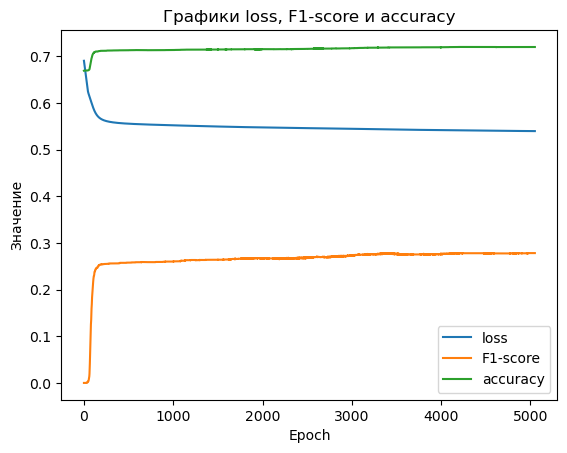

In [66]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf1['Epoch'], diagdf1['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf1['Epoch'], diagdf1['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf1['Epoch'], diagdf1['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [67]:
pred_test2=Mk2.forward(x_test.float())
pred_test_binarized2 = (pred_test2 > 0.5).float()

In [68]:
print(classification_report(y_test.to('cpu'), pred_test_binarized2.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.67      0.89      0.77      3216
         1.0       0.29      0.10      0.14      1542

    accuracy                           0.63      4758
   macro avg       0.48      0.49      0.45      4758
weighted avg       0.55      0.63      0.56      4758



In [69]:
#----------------------------------------------

<font color='red'>Experiment_#3</font>

<font color='red'>layers + 1, epochs: 5050 -> 2000, hidden_size: 300 -> 150, lr: 0.001</font>

In [70]:
#----------------------------------------------

In [71]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK3(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK3, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
        self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
        self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.relu(out)
        out = self.fc2(out)
        out = self.sigmoid(out)
        out = self.fc3(out)
        out = self.tanh(out)
        return out

In [72]:
Mk3=MLP_MK3(1000,150,1) #изменить название переменной

In [73]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [74]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [75]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [76]:
Mk3=Mk3.to(dev)

In [77]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk3.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf2=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(2000):
    optimizer.zero_grad()
    pred = Mk3.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf2 = pd.concat([diagdf2, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.8283801674842834   f1-score: 0.4966479241847992   accuracy: 0.3303603529930115
Epoch:  2 , Loss:  0.8112777471542358   f1-score: 0.4966479241847992   accuracy: 0.3303603529930115
Epoch:  3 , Loss:  0.7935656309127808   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4 , Loss:  0.7755199670791626   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5 , Loss:  0.7574735283851624   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6 , Loss:  0.7397980093955994   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7 , Loss:  0.7228803634643555   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8 , Loss:  0.7070908546447754   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9 , Loss:  0.6927530169487   f1-score: 0.13147208094596863   accuracy: 0.6917117238044739
Epoch:  10 , Loss:  0.6801114678382874   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  11 , Loss:  0.6692973375320435   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  12 , Loss:  

Epoch:  122 , Loss:  0.6067994236946106   f1-score: 0.20719632506370544   accuracy: 0.70423424243927
Epoch:  123 , Loss:  0.6064273715019226   f1-score: 0.2093079388141632   accuracy: 0.704594612121582
Epoch:  124 , Loss:  0.6060643792152405   f1-score: 0.21184401214122772   accuracy: 0.7050450444221497
Epoch:  125 , Loss:  0.605710506439209   f1-score: 0.21522940695285797   accuracy: 0.7056756615638733
Epoch:  126 , Loss:  0.6053657531738281   f1-score: 0.2173704355955124   accuracy: 0.7061261534690857
Epoch:  127 , Loss:  0.6050301194190979   f1-score: 0.21977496147155762   accuracy: 0.7063964009284973
Epoch:  128 , Loss:  0.6047035455703735   f1-score: 0.22227533161640167   accuracy: 0.7068468332290649
Epoch:  129 , Loss:  0.6043862104415894   f1-score: 0.2251371294260025   accuracy: 0.7072973251342773
Epoch:  130 , Loss:  0.6040777564048767   f1-score: 0.22635215520858765   accuracy: 0.7074774503707886
Epoch:  131 , Loss:  0.6037782430648804   f1-score: 0.22840827703475952   accura

Epoch:  228 , Loss:  0.5941644906997681   f1-score: 0.25902631878852844   accuracy: 0.7134234309196472
Epoch:  229 , Loss:  0.5941371917724609   f1-score: 0.25902631878852844   accuracy: 0.7134234309196472
Epoch:  230 , Loss:  0.5941104888916016   f1-score: 0.25902631878852844   accuracy: 0.7134234309196472
Epoch:  231 , Loss:  0.5940841436386108   f1-score: 0.25902631878852844   accuracy: 0.7134234309196472
Epoch:  232 , Loss:  0.5940582156181335   f1-score: 0.25902631878852844   accuracy: 0.7134234309196472
Epoch:  233 , Loss:  0.5940325856208801   f1-score: 0.25902631878852844   accuracy: 0.7134234309196472
Epoch:  234 , Loss:  0.5940075516700745   f1-score: 0.25902631878852844   accuracy: 0.7134234309196472
Epoch:  235 , Loss:  0.5939828157424927   f1-score: 0.25902631878852844   accuracy: 0.7134234309196472
Epoch:  236 , Loss:  0.5939584374427795   f1-score: 0.25902631878852844   accuracy: 0.7134234309196472
Epoch:  237 , Loss:  0.5939343571662903   f1-score: 0.25902631878852844  

Epoch:  345 , Loss:  0.5925461649894714   f1-score: 0.262043297290802   accuracy: 0.7143242955207825
Epoch:  346 , Loss:  0.592539370059967   f1-score: 0.262043297290802   accuracy: 0.7143242955207825
Epoch:  347 , Loss:  0.5925323963165283   f1-score: 0.262043297290802   accuracy: 0.7143242955207825
Epoch:  348 , Loss:  0.5925256013870239   f1-score: 0.262043297290802   accuracy: 0.7143242955207825
Epoch:  349 , Loss:  0.5925188660621643   f1-score: 0.262043297290802   accuracy: 0.7143242955207825
Epoch:  350 , Loss:  0.5925122499465942   f1-score: 0.262043297290802   accuracy: 0.7143242955207825
Epoch:  351 , Loss:  0.5925056338310242   f1-score: 0.262043297290802   accuracy: 0.7143242955207825
Epoch:  352 , Loss:  0.5924991369247437   f1-score: 0.262043297290802   accuracy: 0.7143242955207825
Epoch:  353 , Loss:  0.5924926400184631   f1-score: 0.262043297290802   accuracy: 0.7143242955207825
Epoch:  354 , Loss:  0.5924862027168274   f1-score: 0.262043297290802   accuracy: 0.71432429

Epoch:  451 , Loss:  0.5920371413230896   f1-score: 0.2621653079986572   accuracy: 0.7145044803619385
Epoch:  452 , Loss:  0.592033863067627   f1-score: 0.2621653079986572   accuracy: 0.7145044803619385
Epoch:  453 , Loss:  0.5920306444168091   f1-score: 0.2621653079986572   accuracy: 0.7145044803619385
Epoch:  454 , Loss:  0.5920273661613464   f1-score: 0.2621653079986572   accuracy: 0.7145044803619385
Epoch:  455 , Loss:  0.5920242071151733   f1-score: 0.2621653079986572   accuracy: 0.7145044803619385
Epoch:  456 , Loss:  0.5920210480690002   f1-score: 0.2621653079986572   accuracy: 0.7145044803619385
Epoch:  457 , Loss:  0.5920178890228271   f1-score: 0.2621653079986572   accuracy: 0.7145044803619385
Epoch:  458 , Loss:  0.5920147895812988   f1-score: 0.2621653079986572   accuracy: 0.7145044803619385
Epoch:  459 , Loss:  0.5920116305351257   f1-score: 0.2621653079986572   accuracy: 0.7145044803619385
Epoch:  460 , Loss:  0.5920085906982422   f1-score: 0.2621653079986572   accuracy: 

Epoch:  563 , Loss:  0.5917390584945679   f1-score: 0.2635009288787842   accuracy: 0.7149549722671509
Epoch:  564 , Loss:  0.591736912727356   f1-score: 0.2635009288787842   accuracy: 0.7149549722671509
Epoch:  565 , Loss:  0.5917348861694336   f1-score: 0.2635009288787842   accuracy: 0.7149549722671509
Epoch:  566 , Loss:  0.5917327404022217   f1-score: 0.2635009288787842   accuracy: 0.7149549722671509
Epoch:  567 , Loss:  0.5917306542396545   f1-score: 0.2635009288787842   accuracy: 0.7149549722671509
Epoch:  568 , Loss:  0.5917286276817322   f1-score: 0.2635009288787842   accuracy: 0.7149549722671509
Epoch:  569 , Loss:  0.5917266011238098   f1-score: 0.2635009288787842   accuracy: 0.7149549722671509
Epoch:  570 , Loss:  0.5917245745658875   f1-score: 0.2635009288787842   accuracy: 0.7149549722671509
Epoch:  571 , Loss:  0.5917224884033203   f1-score: 0.2635009288787842   accuracy: 0.7149549722671509
Epoch:  572 , Loss:  0.5917203426361084   f1-score: 0.2635009288787842   accuracy: 

Epoch:  670 , Loss:  0.5915471911430359   f1-score: 0.26390504837036133   accuracy: 0.7150450348854065
Epoch:  671 , Loss:  0.591545820236206   f1-score: 0.2640279531478882   accuracy: 0.7152252197265625
Epoch:  672 , Loss:  0.5915440320968628   f1-score: 0.2640279531478882   accuracy: 0.7152252197265625
Epoch:  673 , Loss:  0.5915426015853882   f1-score: 0.26396647095680237   accuracy: 0.7151351571083069
Epoch:  674 , Loss:  0.5915411114692688   f1-score: 0.26396647095680237   accuracy: 0.7151351571083069
Epoch:  675 , Loss:  0.5915395021438599   f1-score: 0.2640279531478882   accuracy: 0.7152252197265625
Epoch:  676 , Loss:  0.5915378928184509   f1-score: 0.2640279531478882   accuracy: 0.7152252197265625
Epoch:  677 , Loss:  0.5915365815162659   f1-score: 0.2640279531478882   accuracy: 0.7152252197265625
Epoch:  678 , Loss:  0.5915347933769226   f1-score: 0.2640279531478882   accuracy: 0.7152252197265625
Epoch:  679 , Loss:  0.5915333032608032   f1-score: 0.2640279531478882   accurac

Epoch:  778 , Loss:  0.5913960337638855   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  779 , Loss:  0.59139484167099   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  780 , Loss:  0.5913935899734497   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  781 , Loss:  0.5913923382759094   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  782 , Loss:  0.5913911461830139   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  783 , Loss:  0.5913898348808289   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  784 , Loss:  0.5913887619972229   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  785 , Loss:  0.5913873314857483   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  786 , Loss:  0.5913861989974976   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  787 , Loss:  0.5913851857185364   f1-score: 0.2641509473323822   accuracy: 0

Epoch:  887 , Loss:  0.5912685990333557   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  888 , Loss:  0.5912672877311707   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  889 , Loss:  0.5912662744522095   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  890 , Loss:  0.591265082359314   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  891 , Loss:  0.5912639498710632   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  892 , Loss:  0.5912628769874573   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  893 , Loss:  0.5912618041038513   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  894 , Loss:  0.5912606716156006   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  895 , Loss:  0.5912595987319946   f1-score: 0.2641509473323822   accuracy: 0.7154054045677185
Epoch:  896 , Loss:  0.5912585258483887   f1-score: 0.2641509473323822   accuracy: 

Epoch:  1003 , Loss:  0.5911509990692139   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1004 , Loss:  0.5911501049995422   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1005 , Loss:  0.591149091720581   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1006 , Loss:  0.5911481380462646   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1007 , Loss:  0.5911470651626587   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1008 , Loss:  0.5911462306976318   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1009 , Loss:  0.5911453366279602   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1010 , Loss:  0.5911443829536438   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1011 , Loss:  0.5911433696746826   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1012 , Loss:  0.591142475605011   f1-score: 0.2645551860332489   a

Epoch:  1116 , Loss:  0.5910500288009644   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1117 , Loss:  0.591049313545227   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1118 , Loss:  0.5910484194755554   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1119 , Loss:  0.5910476446151733   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1120 , Loss:  0.5910466909408569   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1121 , Loss:  0.5910458564758301   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1122 , Loss:  0.5910451412200928   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1123 , Loss:  0.5910443663597107   f1-score: 0.26449358463287354   accuracy: 0.7154054045677185
Epoch:  1124 , Loss:  0.5910435318946838   f1-score: 0.2645551860332489   accuracy: 0.7154954671859741
Epoch:  1125 , Loss:  0.5910426378250122   f1-score: 0.26449358463287354 

Epoch:  1231 , Loss:  0.5909565687179565   f1-score: 0.2649592459201813   accuracy: 0.7155855894088745
Epoch:  1232 , Loss:  0.5909557938575745   f1-score: 0.2649592459201813   accuracy: 0.7155855894088745
Epoch:  1233 , Loss:  0.5909548997879028   f1-score: 0.2649592459201813   accuracy: 0.7155855894088745
Epoch:  1234 , Loss:  0.5909540057182312   f1-score: 0.2649592459201813   accuracy: 0.7155855894088745
Epoch:  1235 , Loss:  0.5909532308578491   f1-score: 0.2649592459201813   accuracy: 0.7155855894088745
Epoch:  1236 , Loss:  0.5909523963928223   f1-score: 0.2649592459201813   accuracy: 0.7155855894088745
Epoch:  1237 , Loss:  0.5909515023231506   f1-score: 0.2649592459201813   accuracy: 0.7155855894088745
Epoch:  1238 , Loss:  0.5909507870674133   f1-score: 0.2649592459201813   accuracy: 0.7155855894088745
Epoch:  1239 , Loss:  0.5909501910209656   f1-score: 0.2649592459201813   accuracy: 0.7155855894088745
Epoch:  1240 , Loss:  0.5909494161605835   f1-score: 0.264835923910141   

Epoch:  1344 , Loss:  0.5908669233322144   f1-score: 0.265301376581192   accuracy: 0.7155855894088745
Epoch:  1345 , Loss:  0.5908660292625427   f1-score: 0.2653631269931793   accuracy: 0.7156756520271301
Epoch:  1346 , Loss:  0.5908651947975159   f1-score: 0.2653631269931793   accuracy: 0.7156756520271301
Epoch:  1347 , Loss:  0.590864896774292   f1-score: 0.2653631269931793   accuracy: 0.7156756520271301
Epoch:  1348 , Loss:  0.5908638834953308   f1-score: 0.2657049894332886   accuracy: 0.7156756520271301
Epoch:  1349 , Loss:  0.5908631682395935   f1-score: 0.2649592459201813   accuracy: 0.7155855894088745
Epoch:  1350 , Loss:  0.5908627510070801   f1-score: 0.2655813992023468   accuracy: 0.7154954671859741
Epoch:  1351 , Loss:  0.5908622145652771   f1-score: 0.2649592459201813   accuracy: 0.7155855894088745
Epoch:  1352 , Loss:  0.590861439704895   f1-score: 0.2655813992023468   accuracy: 0.7154954671859741
Epoch:  1353 , Loss:  0.5908606052398682   f1-score: 0.2653631269931793   ac

Epoch:  1424 , Loss:  0.5908061861991882   f1-score: 0.2655813992023468   accuracy: 0.7154954671859741
Epoch:  1425 , Loss:  0.59080570936203   f1-score: 0.2657049894332886   accuracy: 0.7156756520271301
Epoch:  1426 , Loss:  0.5908049941062927   f1-score: 0.2655813992023468   accuracy: 0.7154954671859741
Epoch:  1427 , Loss:  0.5908042192459106   f1-score: 0.2657049894332886   accuracy: 0.7156756520271301
Epoch:  1428 , Loss:  0.5908032655715942   f1-score: 0.2655813992023468   accuracy: 0.7154954671859741
Epoch:  1429 , Loss:  0.5908023118972778   f1-score: 0.2657049894332886   accuracy: 0.7156756520271301
Epoch:  1430 , Loss:  0.5908018946647644   f1-score: 0.2655813992023468   accuracy: 0.7154954671859741
Epoch:  1431 , Loss:  0.5908008813858032   f1-score: 0.2657049894332886   accuracy: 0.7156756520271301
Epoch:  1432 , Loss:  0.5907996296882629   f1-score: 0.2657049894332886   accuracy: 0.7156756520271301
Epoch:  1433 , Loss:  0.5907991528511047   f1-score: 0.2655813992023468   a

Epoch:  1534 , Loss:  0.5907228589057922   f1-score: 0.2661083936691284   accuracy: 0.7157657742500305
Epoch:  1535 , Loss:  0.5907222032546997   f1-score: 0.26617032289505005   accuracy: 0.7158558368682861
Epoch:  1536 , Loss:  0.5907215476036072   f1-score: 0.26617032289505005   accuracy: 0.7158558368682861
Epoch:  1537 , Loss:  0.5907208323478699   f1-score: 0.26604652404785156   accuracy: 0.7156756520271301
Epoch:  1538 , Loss:  0.590719997882843   f1-score: 0.26617032289505005   accuracy: 0.7158558368682861
Epoch:  1539 , Loss:  0.5907191634178162   f1-score: 0.26604652404785156   accuracy: 0.7156756520271301
Epoch:  1540 , Loss:  0.5907182097434998   f1-score: 0.26617032289505005   accuracy: 0.7158558368682861
Epoch:  1541 , Loss:  0.5907175540924072   f1-score: 0.26617032289505005   accuracy: 0.7158558368682861
Epoch:  1542 , Loss:  0.5907166600227356   f1-score: 0.26617032289505005   accuracy: 0.7158558368682861
Epoch:  1543 , Loss:  0.5907159447669983   f1-score: 0.26617032289

Epoch:  1646 , Loss:  0.5906389951705933   f1-score: 0.26657360792160034   accuracy: 0.7159459590911865
Epoch:  1647 , Loss:  0.5906381011009216   f1-score: 0.26651161909103394   accuracy: 0.7158558368682861
Epoch:  1648 , Loss:  0.5906370878219604   f1-score: 0.26657360792160034   accuracy: 0.7159459590911865
Epoch:  1649 , Loss:  0.5906369090080261   f1-score: 0.26651161909103394   accuracy: 0.7158558368682861
Epoch:  1650 , Loss:  0.5906358361244202   f1-score: 0.26651161909103394   accuracy: 0.7158558368682861
Epoch:  1651 , Loss:  0.590634822845459   f1-score: 0.2661083936691284   accuracy: 0.7157657742500305
Epoch:  1652 , Loss:  0.5906342267990112   f1-score: 0.2663877308368683   accuracy: 0.7156756520271301
Epoch:  1653 , Loss:  0.5906335711479187   f1-score: 0.26617032289505005   accuracy: 0.7158558368682861
Epoch:  1654 , Loss:  0.590632975101471   f1-score: 0.2663877308368683   accuracy: 0.7156756520271301
Epoch:  1655 , Loss:  0.5906323790550232   f1-score: 0.26617032289505

Epoch:  1760 , Loss:  0.5905522704124451   f1-score: 0.26651161909103394   accuracy: 0.7158558368682861
Epoch:  1761 , Loss:  0.5905514359474182   f1-score: 0.26679059863090515   accuracy: 0.7157657742500305
Epoch:  1762 , Loss:  0.59055095911026   f1-score: 0.26651161909103394   accuracy: 0.7158558368682861
Epoch:  1763 , Loss:  0.5905499458312988   f1-score: 0.26685261726379395   accuracy: 0.7158558368682861
Epoch:  1764 , Loss:  0.5905493497848511   f1-score: 0.26651161909103394   accuracy: 0.7158558368682861
Epoch:  1765 , Loss:  0.5905486345291138   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1766 , Loss:  0.590548038482666   f1-score: 0.26651161909103394   accuracy: 0.7158558368682861
Epoch:  1767 , Loss:  0.5905473232269287   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1768 , Loss:  0.590546727180481   f1-score: 0.26651161909103394   accuracy: 0.7158558368682861
Epoch:  1769 , Loss:  0.590546190738678   f1-score: 0.2668526172637939

Epoch:  1874 , Loss:  0.590481162071228   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1875 , Loss:  0.5904804468154907   f1-score: 0.2671933174133301   accuracy: 0.7158558368682861
Epoch:  1876 , Loss:  0.5904799103736877   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1877 , Loss:  0.5904794931411743   f1-score: 0.2671933174133301   accuracy: 0.7158558368682861
Epoch:  1878 , Loss:  0.5904789566993713   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1879 , Loss:  0.590478241443634   f1-score: 0.2671933174133301   accuracy: 0.7158558368682861
Epoch:  1880 , Loss:  0.5904777646064758   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1881 , Loss:  0.5904769897460938   f1-score: 0.2671933174133301   accuracy: 0.7158558368682861
Epoch:  1882 , Loss:  0.590476393699646   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1883 , Loss:  0.5904759168624878   f1-score: 0.2669146656990051   ac

Epoch:  1988 , Loss:  0.5904228687286377   f1-score: 0.26725539565086365   accuracy: 0.7159459590911865
Epoch:  1989 , Loss:  0.5904216766357422   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1990 , Loss:  0.5904210805892944   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1991 , Loss:  0.5904210209846497   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1992 , Loss:  0.5904207229614258   f1-score: 0.26679059863090515   accuracy: 0.7157657742500305
Epoch:  1993 , Loss:  0.5904203653335571   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1994 , Loss:  0.5904198884963989   f1-score: 0.267317533493042   accuracy: 0.7160360217094421
Epoch:  1995 , Loss:  0.590419352054596   f1-score: 0.2669146656990051   accuracy: 0.7159459590911865
Epoch:  1996 , Loss:  0.5904186964035034   f1-score: 0.267317533493042   accuracy: 0.7160360217094421
Epoch:  1997 , Loss:  0.5904181599617004   f1-score: 0.2669146656990051   

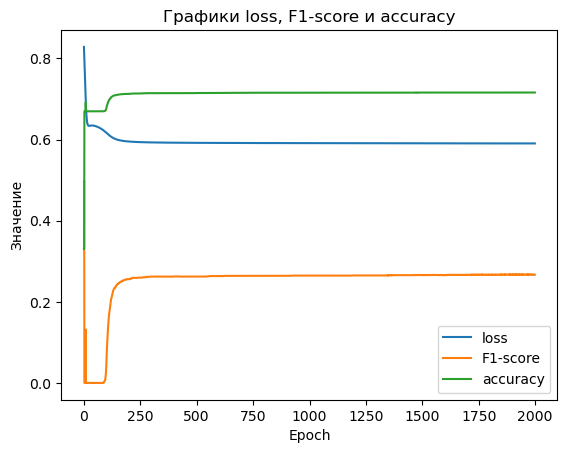

In [78]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf2['Epoch'], diagdf2['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf2['Epoch'], diagdf2['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf2['Epoch'], diagdf2['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [79]:
pred_test3=Mk3.forward(x_test.float())
pred_test_binarized3 = (pred_test3 > 0.5).float()

In [80]:
print(classification_report(y_test.to('cpu'), pred_test_binarized3.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.67      0.89      0.77      3216
         1.0       0.29      0.09      0.14      1542

    accuracy                           0.63      4758
   macro avg       0.48      0.49      0.45      4758
weighted avg       0.55      0.63      0.56      4758



In [81]:
#----------------------------------------------

<font color='red'>Experiment_#4</font>

<font color='red'>epochs: 2000 -> 5000, lr: 0.001 -> 0.0001</font>

In [82]:
#----------------------------------------------

In [83]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK4(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK4, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
        self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
        self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.relu(out)
        out = self.fc2(out)
        out = self.sigmoid(out)
        out = self.fc3(out)
        out = self.tanh(out)
        return out

In [84]:
Mk4=MLP_MK4(1000,150,1) #изменить название переменной

In [85]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [86]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [87]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [88]:
Mk4=Mk4.to(dev)

In [89]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk4.parameters(), lr=0.0001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf3=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(5000):
    optimizer.zero_grad()
    pred = Mk4.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf3 = pd.concat([diagdf3, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.804275631904602   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2 , Loss:  0.802502453327179   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3 , Loss:  0.8007245063781738   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4 , Loss:  0.798941969871521   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5 , Loss:  0.7971552014350891   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6 , Loss:  0.795364499092102   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7 , Loss:  0.7935702204704285   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8 , Loss:  0.791772186756134   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9 , Loss:  0.7899709939956665   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  10 , Loss:  0.7881669998168945   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  11 , Loss:  0.7863602638244629   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  12 , Loss:  0.7845512628555298   f1-score: 0.0   accuracy: 0

Epoch:  121 , Loss:  0.652145266532898   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  122 , Loss:  0.6517379879951477   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  123 , Loss:  0.6513400077819824   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  124 , Loss:  0.65095055103302   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  125 , Loss:  0.6505695581436157   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  126 , Loss:  0.6501966118812561   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  127 , Loss:  0.6498320698738098   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  128 , Loss:  0.649475634098053   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  129 , Loss:  0.6491273641586304   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  130 , Loss:  0.648786723613739   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  131 , Loss:  0.6484538912773132   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  132 , Loss:  0.6481283903121948   f1-sco

Epoch:  233 , Loss:  0.6346591711044312   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  234 , Loss:  0.6346136927604675   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  235 , Loss:  0.6345688104629517   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  236 , Loss:  0.6345246434211731   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  237 , Loss:  0.6344810724258423   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  238 , Loss:  0.634438157081604   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  239 , Loss:  0.6343957781791687   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  240 , Loss:  0.6343539953231812   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  241 , Loss:  0.6343129873275757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  242 , Loss:  0.6342724561691284   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  243 , Loss:  0.6342324614524841   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  244 , Loss:  0.6341930627822876   f1

Epoch:  350 , Loss:  0.6316067576408386   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  351 , Loss:  0.6315882205963135   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  352 , Loss:  0.631569504737854   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  353 , Loss:  0.6315509676933289   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  354 , Loss:  0.6315322518348694   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  355 , Loss:  0.6315136551856995   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  356 , Loss:  0.6314950585365295   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  357 , Loss:  0.6314764022827148   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  358 , Loss:  0.6314576268196106   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  359 , Loss:  0.6314390301704407   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  360 , Loss:  0.6314203143119812   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  361 , Loss:  0.6314015984535217   f1

Epoch:  470 , Loss:  0.6290042996406555   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  471 , Loss:  0.6289775967597961   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  472 , Loss:  0.6289508938789368   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  473 , Loss:  0.6289240121841431   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  474 , Loss:  0.6288971304893494   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  475 , Loss:  0.6288701295852661   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  476 , Loss:  0.6288430094718933   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  477 , Loss:  0.6288157105445862   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  478 , Loss:  0.6287884712219238   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  479 , Loss:  0.6287611722946167   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  480 , Loss:  0.6287335157394409   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  481 , Loss:  0.6287060379981995   f

Epoch:  581 , Loss:  0.6255069971084595   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  582 , Loss:  0.625470757484436   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  583 , Loss:  0.625434398651123   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  584 , Loss:  0.6253980398178101   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  585 , Loss:  0.6253616213798523   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  586 , Loss:  0.6253250241279602   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  587 , Loss:  0.6252884268760681   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  588 , Loss:  0.6252516508102417   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  589 , Loss:  0.6252148747444153   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  590 , Loss:  0.6251779794692993   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  591 , Loss:  0.6251410245895386   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  592 , Loss:  0.6251040101051331   f1-

Epoch:  693 , Loss:  0.6210066080093384   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  694 , Loss:  0.6209630966186523   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  695 , Loss:  0.6209196448326111   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  696 , Loss:  0.620876133441925   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  697 , Loss:  0.6208325624465942   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  698 , Loss:  0.6207889318466187   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  699 , Loss:  0.6207452416419983   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  700 , Loss:  0.6207015514373779   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  701 , Loss:  0.6206578016281128   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  702 , Loss:  0.6206139922142029   f1-score: 0.00760662881

Epoch:  805 , Loss:  0.6160083413124084   f1-score: 0.09237156063318253   accuracy: 0.68486487865448
Epoch:  806 , Loss:  0.6159635782241821   f1-score: 0.09237156063318253   accuracy: 0.68486487865448
Epoch:  807 , Loss:  0.6159190535545349   f1-score: 0.09336099773645401   accuracy: 0.685045063495636
Epoch:  808 , Loss:  0.6158744096755981   f1-score: 0.09531209617853165   accuracy: 0.6853153109550476
Epoch:  809 , Loss:  0.6158298254013062   f1-score: 0.09580527991056442   accuracy: 0.685405433177948
Epoch:  810 , Loss:  0.6157853007316589   f1-score: 0.09627329558134079   accuracy: 0.685405433177948
Epoch:  811 , Loss:  0.6157407760620117   f1-score: 0.09725815057754517   accuracy: 0.6855855584144592
Epoch:  812 , Loss:  0.6156963109970093   f1-score: 0.09775019437074661   accuracy: 0.6856756806373596
Epoch:  813 , Loss:  0.6156517863273621   f1-score: 0.09824198484420776   accuracy: 0.6857657432556152
Epoch:  814 , Loss:  0.6156073212623596   f1-score: 0.09870801120996475   accura

Epoch:  913 , Loss:  0.6113978028297424   f1-score: 0.1628486067056656   accuracy: 0.6971170902252197
Epoch:  914 , Loss:  0.6113578081130981   f1-score: 0.16330595314502716   accuracy: 0.6972072124481201
Epoch:  915 , Loss:  0.6113179326057434   f1-score: 0.16330595314502716   accuracy: 0.6972072124481201
Epoch:  916 , Loss:  0.6112780570983887   f1-score: 0.16376306116580963   accuracy: 0.6972972750663757
Epoch:  917 , Loss:  0.6112383008003235   f1-score: 0.1642199605703354   accuracy: 0.6973873972892761
Epoch:  918 , Loss:  0.6111986637115479   f1-score: 0.1642199605703354   accuracy: 0.6973873972892761
Epoch:  919 , Loss:  0.6111589670181274   f1-score: 0.16509199142456055   accuracy: 0.6974774599075317
Epoch:  920 , Loss:  0.6111193299293518   f1-score: 0.16509199142456055   accuracy: 0.6974774599075317
Epoch:  921 , Loss:  0.611079752445221   f1-score: 0.16509199142456055   accuracy: 0.6974774599075317
Epoch:  922 , Loss:  0.6110403537750244   f1-score: 0.1660039722919464   accu

Epoch:  1028 , Loss:  0.607235312461853   f1-score: 0.20334869623184204   accuracy: 0.70423424243927
Epoch:  1029 , Loss:  0.6072031855583191   f1-score: 0.2042202353477478   accuracy: 0.704414427280426
Epoch:  1030 , Loss:  0.6071709990501404   f1-score: 0.2042202353477478   accuracy: 0.704414427280426
Epoch:  1031 , Loss:  0.6071390509605408   f1-score: 0.20509091019630432   accuracy: 0.704594612121582
Epoch:  1032 , Loss:  0.6071070432662964   f1-score: 0.2055259346961975   accuracy: 0.7046846747398376
Epoch:  1033 , Loss:  0.6070750951766968   f1-score: 0.2055259346961975   accuracy: 0.7046846747398376
Epoch:  1034 , Loss:  0.6070432066917419   f1-score: 0.20596075057983398   accuracy: 0.704774796962738
Epoch:  1035 , Loss:  0.607011616230011   f1-score: 0.20596075057983398   accuracy: 0.704774796962738
Epoch:  1036 , Loss:  0.6069799065589905   f1-score: 0.20639534294605255   accuracy: 0.7048648595809937
Epoch:  1037 , Loss:  0.6069482564926147   f1-score: 0.20639534294605255   ac

Epoch:  1144 , Loss:  0.603951632976532   f1-score: 0.2247728407382965   accuracy: 0.707927942276001
Epoch:  1145 , Loss:  0.6039270758628845   f1-score: 0.2247728407382965   accuracy: 0.707927942276001
Epoch:  1146 , Loss:  0.6039025783538818   f1-score: 0.2247728407382965   accuracy: 0.707927942276001
Epoch:  1147 , Loss:  0.6038781404495239   f1-score: 0.2247728407382965   accuracy: 0.707927942276001
Epoch:  1148 , Loss:  0.6038536429405212   f1-score: 0.2251972258090973   accuracy: 0.7080180048942566
Epoch:  1149 , Loss:  0.6038294434547424   f1-score: 0.22646918892860413   accuracy: 0.708288311958313
Epoch:  1150 , Loss:  0.6038051247596741   f1-score: 0.22646918892860413   accuracy: 0.708288311958313
Epoch:  1151 , Loss:  0.6037808656692505   f1-score: 0.22641509771347046   accuracy: 0.7081981897354126
Epoch:  1152 , Loss:  0.6037567853927612   f1-score: 0.22641509771347046   accuracy: 0.7081981897354126
Epoch:  1153 , Loss:  0.6037326455116272   f1-score: 0.22641509771347046   a

Epoch:  1261 , Loss:  0.6014482975006104   f1-score: 0.233926460146904   accuracy: 0.7090991139411926
Epoch:  1262 , Loss:  0.6014298796653748   f1-score: 0.233926460146904   accuracy: 0.7090991139411926
Epoch:  1263 , Loss:  0.6014114618301392   f1-score: 0.233926460146904   accuracy: 0.7090991139411926
Epoch:  1264 , Loss:  0.6013930439949036   f1-score: 0.23476405441761017   accuracy: 0.7092792987823486
Epoch:  1265 , Loss:  0.6013748049736023   f1-score: 0.23476405441761017   accuracy: 0.7092792987823486
Epoch:  1266 , Loss:  0.6013565063476562   f1-score: 0.23518255352973938   accuracy: 0.7093693614006042
Epoch:  1267 , Loss:  0.601338267326355   f1-score: 0.23518255352973938   accuracy: 0.7093693614006042
Epoch:  1268 , Loss:  0.6013200283050537   f1-score: 0.23518255352973938   accuracy: 0.7093693614006042
Epoch:  1269 , Loss:  0.6013019680976868   f1-score: 0.23518255352973938   accuracy: 0.7093693614006042
Epoch:  1270 , Loss:  0.6012839078903198   f1-score: 0.2351825535297393

Epoch:  1376 , Loss:  0.5995928645133972   f1-score: 0.24381041526794434   accuracy: 0.7110810875892639
Epoch:  1377 , Loss:  0.599578857421875   f1-score: 0.24381041526794434   accuracy: 0.7110810875892639
Epoch:  1378 , Loss:  0.5995649099349976   f1-score: 0.24381041526794434   accuracy: 0.7110810875892639
Epoch:  1379 , Loss:  0.5995509624481201   f1-score: 0.24381041526794434   accuracy: 0.7110810875892639
Epoch:  1380 , Loss:  0.599537193775177   f1-score: 0.24381041526794434   accuracy: 0.7110810875892639
Epoch:  1381 , Loss:  0.5995232462882996   f1-score: 0.24381041526794434   accuracy: 0.7110810875892639
Epoch:  1382 , Loss:  0.5995094776153564   f1-score: 0.2442244291305542   accuracy: 0.7111711502075195
Epoch:  1383 , Loss:  0.5994957089424133   f1-score: 0.2442244291305542   accuracy: 0.7111711502075195
Epoch:  1384 , Loss:  0.599481999874115   f1-score: 0.24416686594486237   accuracy: 0.7110810875892639
Epoch:  1385 , Loss:  0.5994681715965271   f1-score: 0.24416686594486

Epoch:  1488 , Loss:  0.5982186794281006   f1-score: 0.24605974555015564   accuracy: 0.7112612724304199
Epoch:  1489 , Loss:  0.598207950592041   f1-score: 0.24605974555015564   accuracy: 0.7112612724304199
Epoch:  1490 , Loss:  0.5981972217559814   f1-score: 0.24647225439548492   accuracy: 0.7113513350486755
Epoch:  1491 , Loss:  0.5981866121292114   f1-score: 0.24647225439548492   accuracy: 0.7113513350486755
Epoch:  1492 , Loss:  0.5981758832931519   f1-score: 0.2468845546245575   accuracy: 0.7114414572715759
Epoch:  1493 , Loss:  0.5981653332710266   f1-score: 0.2468845546245575   accuracy: 0.7114414572715759
Epoch:  1494 , Loss:  0.5981547236442566   f1-score: 0.2468845546245575   accuracy: 0.7114414572715759
Epoch:  1495 , Loss:  0.5981442332267761   f1-score: 0.2468845546245575   accuracy: 0.7114414572715759
Epoch:  1496 , Loss:  0.5981336236000061   f1-score: 0.2468845546245575   accuracy: 0.7114414572715759
Epoch:  1497 , Loss:  0.5981231927871704   f1-score: 0.246884554624557

Epoch:  1601 , Loss:  0.5971479415893555   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  1602 , Loss:  0.5971396565437317   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  1603 , Loss:  0.5971313118934631   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  1604 , Loss:  0.5971230268478394   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  1605 , Loss:  0.5971147418022156   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  1606 , Loss:  0.5971065163612366   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  1607 , Loss:  0.5970982313156128   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  1608 , Loss:  0.597089946269989   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  1609 , Loss:  0.5970817804336548   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  1610 , Loss:  0.597073495388031   f1-score: 0.2512892782688141   a

Epoch:  1712 , Loss:  0.5963190793991089   f1-score: 0.25374531745910645   accuracy: 0.7127928137779236
Epoch:  1713 , Loss:  0.5963122844696045   f1-score: 0.2541539967060089   accuracy: 0.7128828763961792
Epoch:  1714 , Loss:  0.5963057279586792   f1-score: 0.2541539967060089   accuracy: 0.7128828763961792
Epoch:  1715 , Loss:  0.5962989926338196   f1-score: 0.2541539967060089   accuracy: 0.7128828763961792
Epoch:  1716 , Loss:  0.5962924361228943   f1-score: 0.2541539967060089   accuracy: 0.7128828763961792
Epoch:  1717 , Loss:  0.596285879611969   f1-score: 0.2541539967060089   accuracy: 0.7128828763961792
Epoch:  1718 , Loss:  0.5962792038917542   f1-score: 0.2541539967060089   accuracy: 0.7128828763961792
Epoch:  1719 , Loss:  0.5962726473808289   f1-score: 0.2541539967060089   accuracy: 0.7128828763961792
Epoch:  1720 , Loss:  0.5962660312652588   f1-score: 0.2541539967060089   accuracy: 0.7128828763961792
Epoch:  1721 , Loss:  0.5962594747543335   f1-score: 0.2541539967060089  

Epoch:  1827 , Loss:  0.5956283807754517   f1-score: 0.2547919452190399   accuracy: 0.7127928137779236
Epoch:  1828 , Loss:  0.5956228971481323   f1-score: 0.2547919452190399   accuracy: 0.7127928137779236
Epoch:  1829 , Loss:  0.5956175923347473   f1-score: 0.2547919452190399   accuracy: 0.7127928137779236
Epoch:  1830 , Loss:  0.5956121683120728   f1-score: 0.2551998198032379   accuracy: 0.7128828763961792
Epoch:  1831 , Loss:  0.595606803894043   f1-score: 0.2551998198032379   accuracy: 0.7128828763961792
Epoch:  1832 , Loss:  0.5956014394760132   f1-score: 0.2551998198032379   accuracy: 0.7128828763961792
Epoch:  1833 , Loss:  0.5955961346626282   f1-score: 0.2551998198032379   accuracy: 0.7128828763961792
Epoch:  1834 , Loss:  0.5955907702445984   f1-score: 0.2551998198032379   accuracy: 0.7128828763961792
Epoch:  1835 , Loss:  0.5955854058265686   f1-score: 0.2551998198032379   accuracy: 0.7128828763961792
Epoch:  1836 , Loss:  0.5955801606178284   f1-score: 0.2551998198032379   

Epoch:  1940 , Loss:  0.595075249671936   f1-score: 0.25601494312286377   accuracy: 0.7130630612373352
Epoch:  1941 , Loss:  0.5950708985328674   f1-score: 0.25601494312286377   accuracy: 0.7130630612373352
Epoch:  1942 , Loss:  0.595066487789154   f1-score: 0.25601494312286377   accuracy: 0.7130630612373352
Epoch:  1943 , Loss:  0.5950620174407959   f1-score: 0.25601494312286377   accuracy: 0.7130630612373352
Epoch:  1944 , Loss:  0.5950576663017273   f1-score: 0.25601494312286377   accuracy: 0.7130630612373352
Epoch:  1945 , Loss:  0.5950532555580139   f1-score: 0.25601494312286377   accuracy: 0.7130630612373352
Epoch:  1946 , Loss:  0.5950489044189453   f1-score: 0.25601494312286377   accuracy: 0.7130630612373352
Epoch:  1947 , Loss:  0.5950445532798767   f1-score: 0.25601494312286377   accuracy: 0.7130630612373352
Epoch:  1948 , Loss:  0.5950401425361633   f1-score: 0.25601494312286377   accuracy: 0.7130630612373352
Epoch:  1949 , Loss:  0.5950357913970947   f1-score: 0.25601494312

Epoch:  2051 , Loss:  0.5946282148361206   f1-score: 0.2571761906147003   accuracy: 0.7132432460784912
Epoch:  2052 , Loss:  0.5946245193481445   f1-score: 0.2571761906147003   accuracy: 0.7132432460784912
Epoch:  2053 , Loss:  0.5946208834648132   f1-score: 0.2571761906147003   accuracy: 0.7132432460784912
Epoch:  2054 , Loss:  0.5946173071861267   f1-score: 0.2571761906147003   accuracy: 0.7132432460784912
Epoch:  2055 , Loss:  0.5946136116981506   f1-score: 0.2571761906147003   accuracy: 0.7132432460784912
Epoch:  2056 , Loss:  0.5946099758148193   f1-score: 0.2571761906147003   accuracy: 0.7132432460784912
Epoch:  2057 , Loss:  0.5946063995361328   f1-score: 0.2571761906147003   accuracy: 0.7132432460784912
Epoch:  2058 , Loss:  0.5946027040481567   f1-score: 0.2571761906147003   accuracy: 0.7132432460784912
Epoch:  2059 , Loss:  0.5945990681648254   f1-score: 0.2571761906147003   accuracy: 0.7132432460784912
Epoch:  2060 , Loss:  0.5945955514907837   f1-score: 0.2571761906147003  

Epoch:  2162 , Loss:  0.5942559242248535   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  2163 , Loss:  0.59425288438797   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  2164 , Loss:  0.5942498445510864   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  2165 , Loss:  0.5942467451095581   f1-score: 0.25880157947540283   accuracy: 0.7136036157608032
Epoch:  2166 , Loss:  0.5942436456680298   f1-score: 0.2583955228328705   accuracy: 0.7135134935379028
Epoch:  2167 , Loss:  0.594240665435791   f1-score: 0.2583955228328705   accuracy: 0.7135134935379028
Epoch:  2168 , Loss:  0.5942376255989075   f1-score: 0.2583955228328705   accuracy: 0.7135134935379028
Epoch:  2169 , Loss:  0.5942345857620239   f1-score: 0.2583955228328705   accuracy: 0.7135134935379028
Epoch:  2170 , Loss:  0.5942315459251404   f1-score: 0.2583955228328705   accuracy: 0.7135134935379028
Epoch:  2171 , Loss:  0.5942285060882568   f1-score: 0.2583955228328705 

Epoch:  2274 , Loss:  0.5939399600028992   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2275 , Loss:  0.5939373970031738   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2276 , Loss:  0.5939348340034485   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2277 , Loss:  0.5939322113990784   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2278 , Loss:  0.5939295887947083   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2279 , Loss:  0.5939271450042725   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2280 , Loss:  0.5939245223999023   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2281 , Loss:  0.5939218997955322   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2282 , Loss:  0.5939193964004517   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2283 , Loss:  0.5939168334007263   f1-score: 0.259207457

Epoch:  2385 , Loss:  0.5936737656593323   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2386 , Loss:  0.5936715602874756   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2387 , Loss:  0.5936693549156189   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2388 , Loss:  0.5936671495437622   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2389 , Loss:  0.593664824962616   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2390 , Loss:  0.593662679195404   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2391 , Loss:  0.5936604738235474   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2392 , Loss:  0.5936583280563354   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2393 , Loss:  0.5936561226844788   f1-score: 0.25920745730400085   accuracy: 0.7136936783790588
Epoch:  2394 , Loss:  0.5936539173126221   f1-score: 0.25920745730

Epoch:  2494 , Loss:  0.5934485197067261   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2495 , Loss:  0.5934465527534485   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2496 , Loss:  0.5934445261955261   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2497 , Loss:  0.5934426784515381   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2498 , Loss:  0.5934407711029053   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2499 , Loss:  0.5934388637542725   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2500 , Loss:  0.5934368968009949   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2501 , Loss:  0.5934349894523621   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2502 , Loss:  0.593433141708374   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2503 , Loss:  0.5934311747550964   f1-score: 0.259147047996521   accuracy: 

Epoch:  2606 , Loss:  0.5932467579841614   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2607 , Loss:  0.5932450890541077   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2608 , Loss:  0.5932433605194092   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2609 , Loss:  0.5932416915893555   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2610 , Loss:  0.593239963054657   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2611 , Loss:  0.593238353729248   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2612 , Loss:  0.5932366847991943   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2613 , Loss:  0.5932350158691406   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2614 , Loss:  0.5932332873344421   f1-score: 0.259147047996521   accuracy: 0.7136036157608032
Epoch:  2615 , Loss:  0.5932316780090332   f1-score: 0.259147047996521   accuracy: 0

Epoch:  2716 , Loss:  0.5930726528167725   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  2717 , Loss:  0.5930711627006531   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  2718 , Loss:  0.5930697321891785   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  2719 , Loss:  0.5930681824684143   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  2720 , Loss:  0.5930667519569397   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  2721 , Loss:  0.5930652618408203   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  2722 , Loss:  0.5930637717247009   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  2723 , Loss:  0.5930622816085815   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  2724 , Loss:  0.5930608510971069   f1-score: 0.2604239583015442   accuracy: 0.7139639854431152
Epoch:  2725 , Loss:  0.5930593609809875   f1-score: 0.2604239583

Epoch:  2826 , Loss:  0.592918336391449   f1-score: 0.2604239583015442   accuracy: 0.7139639854431152
Epoch:  2827 , Loss:  0.5929170846939087   f1-score: 0.2604239583015442   accuracy: 0.7139639854431152
Epoch:  2828 , Loss:  0.5929157137870789   f1-score: 0.2604239583015442   accuracy: 0.7139639854431152
Epoch:  2829 , Loss:  0.5929144620895386   f1-score: 0.2604239583015442   accuracy: 0.7139639854431152
Epoch:  2830 , Loss:  0.5929130911827087   f1-score: 0.2604239583015442   accuracy: 0.7139639854431152
Epoch:  2831 , Loss:  0.5929117798805237   f1-score: 0.2604239583015442   accuracy: 0.7139639854431152
Epoch:  2832 , Loss:  0.5929104089736938   f1-score: 0.2604239583015442   accuracy: 0.7139639854431152
Epoch:  2833 , Loss:  0.5929090976715088   f1-score: 0.2604239583015442   accuracy: 0.7139639854431152
Epoch:  2834 , Loss:  0.5929079055786133   f1-score: 0.2604239583015442   accuracy: 0.7139639854431152
Epoch:  2835 , Loss:  0.5929065942764282   f1-score: 0.2604239583015442   

Epoch:  2939 , Loss:  0.5927774906158447   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  2940 , Loss:  0.5927762985229492   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  2941 , Loss:  0.5927751660346985   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  2942 , Loss:  0.592773973941803   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  2943 , Loss:  0.5927727818489075   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  2944 , Loss:  0.5927717089653015   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  2945 , Loss:  0.5927705764770508   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  2946 , Loss:  0.5927693843841553   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  2947 , Loss:  0.5927681922912598   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  2948 , Loss:  0.5927669405937195   f1-score: 0.2612339854

Epoch:  3051 , Loss:  0.5926529169082642   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  3052 , Loss:  0.5926518440246582   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  3053 , Loss:  0.592650830745697   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  3054 , Loss:  0.5926497578620911   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  3055 , Loss:  0.5926487445831299   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  3056 , Loss:  0.5926476716995239   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  3057 , Loss:  0.5926466584205627   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  3058 , Loss:  0.5926456451416016   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  3059 , Loss:  0.5926445722579956   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  3060 , Loss:  0.5926436185836792   f1-score: 0.2612339854

Epoch:  3130 , Loss:  0.5925728678703308   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3131 , Loss:  0.5925719141960144   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3132 , Loss:  0.5925709009170532   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3133 , Loss:  0.5925699472427368   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3134 , Loss:  0.5925690531730652   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3135 , Loss:  0.5925679206848145   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3136 , Loss:  0.5925670266151428   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3137 , Loss:  0.5925660133361816   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3138 , Loss:  0.59256511926651   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3139 , Loss:  0.5925641059875488   f1-score: 0.26082906126

Epoch:  3240 , Loss:  0.5924710631370544   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  3241 , Loss:  0.5924701690673828   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  3242 , Loss:  0.592469334602356   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  3243 , Loss:  0.5924684405326843   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  3244 , Loss:  0.5924675464630127   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  3245 , Loss:  0.5924666523933411   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3246 , Loss:  0.592465877532959   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3247 , Loss:  0.5924649834632874   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3248 , Loss:  0.5924640893936157   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3249 , Loss:  0.5924631953239441   f1-score: 0.26082906126976013   a

Epoch:  3348 , Loss:  0.5923805832862854   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3349 , Loss:  0.5923797488212585   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3350 , Loss:  0.5923789739608765   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3351 , Loss:  0.5923781394958496   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3352 , Loss:  0.5923773646354675   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3353 , Loss:  0.5923765301704407   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3354 , Loss:  0.5923757553100586   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3355 , Loss:  0.5923749804496765   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3356 , Loss:  0.5923742055892944   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3357 , Loss:  0.5923733711242676   f1-score: 0.260829061

Epoch:  3457 , Loss:  0.5922964811325073   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3458 , Loss:  0.5922956466674805   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3459 , Loss:  0.5922949314117432   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3460 , Loss:  0.5922941565513611   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3461 , Loss:  0.592293381690979   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3462 , Loss:  0.5922926664352417   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3463 , Loss:  0.5922920107841492   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3464 , Loss:  0.5922911763191223   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3465 , Loss:  0.5922904014587402   f1-score: 0.26082906126976013   accuracy: 0.7140540480613708
Epoch:  3466 , Loss:  0.5922897458076477   f1-score: 0.2608290612

Epoch:  3572 , Loss:  0.592212438583374   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  3573 , Loss:  0.5922117233276367   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  3574 , Loss:  0.5922109484672546   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  3575 , Loss:  0.5922102928161621   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  3576 , Loss:  0.5922095775604248   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  3577 , Loss:  0.5922088027000427   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  3578 , Loss:  0.592208206653595   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  3579 , Loss:  0.5922074913978577   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  3580 , Loss:  0.5922067761421204   f1-score: 0.26048463582992554   accuracy: 0.7140540480613708
Epoch:  3581 , Loss:  0.5922060608863831   f1-score: 0.26048463582

Epoch:  3689 , Loss:  0.5921353101730347   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3690 , Loss:  0.5921347141265869   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3691 , Loss:  0.5921339988708496   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3692 , Loss:  0.5921334624290466   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3693 , Loss:  0.5921328663825989   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3694 , Loss:  0.5921322107315063   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3695 , Loss:  0.5921316146850586   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3696 , Loss:  0.5921309590339661   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3697 , Loss:  0.5921303629875183   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3698 , Loss:  0.5921298265457153   f1-score: 0.260950595

Epoch:  3804 , Loss:  0.5920684933662415   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3805 , Loss:  0.5920679569244385   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3806 , Loss:  0.5920673608779907   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3807 , Loss:  0.5920668840408325   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3808 , Loss:  0.5920662879943848   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3809 , Loss:  0.592065691947937   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3810 , Loss:  0.5920652151107788   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3811 , Loss:  0.592064619064331   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3812 , Loss:  0.5920641422271729   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3813 , Loss:  0.5920635461807251   f1-score: 0.26095059514

Epoch:  3913 , Loss:  0.592011034488678   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3914 , Loss:  0.5920106172561646   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3915 , Loss:  0.5920100808143616   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3916 , Loss:  0.5920096039772034   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3917 , Loss:  0.5920090675354004   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3918 , Loss:  0.5920085906982422   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3919 , Loss:  0.5920080542564392   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3920 , Loss:  0.5920075178146362   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3921 , Loss:  0.592007040977478   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  3922 , Loss:  0.5920065641403198   f1-score: 0.26095059514

Epoch:  4021 , Loss:  0.5919587016105652   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4022 , Loss:  0.5919582843780518   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4023 , Loss:  0.5919578075408936   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4024 , Loss:  0.5919573903083801   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4025 , Loss:  0.5919569134712219   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4026 , Loss:  0.591956377029419   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4027 , Loss:  0.5919559597969055   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4028 , Loss:  0.5919554829597473   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4029 , Loss:  0.5919550061225891   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4030 , Loss:  0.5919545292854309   f1-score: 0.2609505951

Epoch:  4132 , Loss:  0.5919089913368225   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4133 , Loss:  0.5919085144996643   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4134 , Loss:  0.5919081568717957   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4135 , Loss:  0.5919076800346375   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4136 , Loss:  0.5919073224067688   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4137 , Loss:  0.5919068455696106   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4138 , Loss:  0.5919064283370972   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4139 , Loss:  0.5919060111045837   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4140 , Loss:  0.5919054746627808   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4141 , Loss:  0.5919051766395569   f1-score: 0.260950595

Epoch:  4246 , Loss:  0.5918616652488708   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4247 , Loss:  0.5918612480163574   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4248 , Loss:  0.591860830783844   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4249 , Loss:  0.5918604731559753   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4250 , Loss:  0.5918599963188171   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4251 , Loss:  0.5918596386909485   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4252 , Loss:  0.5918592810630798   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4253 , Loss:  0.5918588042259216   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4254 , Loss:  0.5918583869934082   f1-score: 0.26095059514045715   accuracy: 0.7142342329025269
Epoch:  4255 , Loss:  0.5918580293655396   f1-score: 0.2609505951

Epoch:  4360 , Loss:  0.5918077230453491   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4361 , Loss:  0.5918070077896118   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4362 , Loss:  0.5918064713478088   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4363 , Loss:  0.5918058753013611   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4364 , Loss:  0.5918052196502686   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4365 , Loss:  0.5918046236038208   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4366 , Loss:  0.591804027557373   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4367 , Loss:  0.5918033719062805   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4368 , Loss:  0.5918027758598328   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4369 , Loss:  0.591802179813385   f1-score: 0.2614775002002716   a

Epoch:  4472 , Loss:  0.5917494297027588   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4473 , Loss:  0.5917489528656006   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4474 , Loss:  0.5917484760284424   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4475 , Loss:  0.5917481184005737   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4476 , Loss:  0.5917477011680603   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4477 , Loss:  0.5917471647262573   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4478 , Loss:  0.5917468070983887   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4479 , Loss:  0.5917463898658752   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4480 , Loss:  0.5917459726333618   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4481 , Loss:  0.5917454361915588   f1-score: 0.2614775002002716  

Epoch:  4586 , Loss:  0.5917036533355713   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4587 , Loss:  0.5917032957077026   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4588 , Loss:  0.5917028784751892   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4589 , Loss:  0.5917025208473206   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4590 , Loss:  0.5917021632194519   f1-score: 0.2614775002002716   accuracy: 0.7145044803619385
Epoch:  4591 , Loss:  0.5917018055915833   f1-score: 0.26141658425331116   accuracy: 0.7144144177436829
Epoch:  4592 , Loss:  0.5917014479637146   f1-score: 0.26141658425331116   accuracy: 0.7144144177436829
Epoch:  4593 , Loss:  0.591701090335846   f1-score: 0.26141658425331116   accuracy: 0.7144144177436829
Epoch:  4594 , Loss:  0.5917006731033325   f1-score: 0.26141658425331116   accuracy: 0.7144144177436829
Epoch:  4595 , Loss:  0.5917003154754639   f1-score: 0.261416584253311

Epoch:  4687 , Loss:  0.5916680693626404   f1-score: 0.26153847575187683   accuracy: 0.7145946025848389
Epoch:  4688 , Loss:  0.5916677117347717   f1-score: 0.26153847575187683   accuracy: 0.7145946025848389
Epoch:  4689 , Loss:  0.5916673541069031   f1-score: 0.26153847575187683   accuracy: 0.7145946025848389
Epoch:  4690 , Loss:  0.5916670560836792   f1-score: 0.26153847575187683   accuracy: 0.7145946025848389
Epoch:  4691 , Loss:  0.5916666984558105   f1-score: 0.26153847575187683   accuracy: 0.7145946025848389
Epoch:  4692 , Loss:  0.5916664004325867   f1-score: 0.26153847575187683   accuracy: 0.7145946025848389
Epoch:  4693 , Loss:  0.591666042804718   f1-score: 0.26153847575187683   accuracy: 0.7145946025848389
Epoch:  4694 , Loss:  0.5916656851768494   f1-score: 0.26153847575187683   accuracy: 0.7145946025848389
Epoch:  4695 , Loss:  0.5916653871536255   f1-score: 0.26153847575187683   accuracy: 0.7145946025848389
Epoch:  4696 , Loss:  0.5916650295257568   f1-score: 0.2615384757

Epoch:  4793 , Loss:  0.5916337966918945   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4794 , Loss:  0.5916335582733154   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4795 , Loss:  0.5916332006454468   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4796 , Loss:  0.5916328430175781   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4797 , Loss:  0.5916325449943542   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4798 , Loss:  0.5916323661804199   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4799 , Loss:  0.5916320085525513   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4800 , Loss:  0.5916317105293274   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4801 , Loss:  0.591631293296814   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4802 , Loss:  0.5916310548782349   f1-score: 0.2619436085

Epoch:  4905 , Loss:  0.591600239276886   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4906 , Loss:  0.5915999412536621   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4907 , Loss:  0.591599702835083   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4908 , Loss:  0.5915992856025696   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4909 , Loss:  0.5915990471839905   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4910 , Loss:  0.5915986895561218   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4911 , Loss:  0.591598391532898   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4912 , Loss:  0.5915982127189636   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4913 , Loss:  0.591597855091095   f1-score: 0.26194360852241516   accuracy: 0.7146846652030945
Epoch:  4914 , Loss:  0.5915976166725159   f1-score: 0.2619436085224

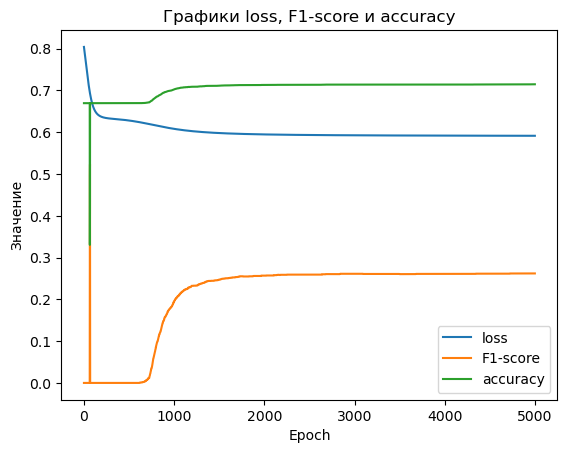

In [90]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf3['Epoch'], diagdf3['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf3['Epoch'], diagdf3['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf3['Epoch'], diagdf3['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [91]:
pred_test4=Mk4.forward(x_test.float())
pred_test_binarized4 = (pred_test4 > 0.5).float()

In [92]:
print(classification_report(y_test.to('cpu'), pred_test_binarized4.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.67      0.90      0.77      3216
         1.0       0.29      0.09      0.14      1542

    accuracy                           0.63      4758
   macro avg       0.48      0.49      0.45      4758
weighted avg       0.55      0.63      0.56      4758



In [93]:
#----------------------------------------------

<font color='red'>Experiment_#5</font>

<font color='red'>layers: -1, activation functions: Sigmoid() and Tanh(), epochs: 2000, hidden_size: 200, lr: 0.0001 -> 0.001</font>

In [94]:
#----------------------------------------------

In [95]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK5(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK5, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.sigmoid1 = nn.Sigmoid()
        self.fc2 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
        self.tanh1 = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.sigmoid1(out)
        out = self.fc2(out)
        out = self.tanh1(out)
        return out

In [96]:
Mk5=MLP_MK5(1000,200,1) #изменить название переменной

In [97]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [98]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [99]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [100]:
Mk5=Mk5.to(dev)

In [101]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk5.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf4=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(2000):
    optimizer.zero_grad()
    pred = Mk5.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf4 = pd.concat([diagdf4, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.7197426557540894   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2 , Loss:  0.7000841498374939   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3 , Loss:  0.682968020439148   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4 , Loss:  0.668774425983429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5 , Loss:  0.6575973629951477   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6 , Loss:  0.6492520570755005   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7 , Loss:  0.6433472633361816   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8 , Loss:  0.6393903493881226   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9 , Loss:  0.6368880271911621   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  10 , Loss:  0.6354117393493652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  11 , Loss:  0.6346253156661987   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  12 , Loss:  0.634282648563385   f1-score: 0.0   accuracy:

Epoch:  111 , Loss:  0.6324732303619385   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  112 , Loss:  0.6324504017829895   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  113 , Loss:  0.6324276328086853   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  114 , Loss:  0.6324049234390259   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  115 , Loss:  0.6323821544647217   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  116 , Loss:  0.6323593258857727   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  117 , Loss:  0.6323365569114685   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  118 , Loss:  0.6323136687278748   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  119 , Loss:  0.632290780544281   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  120 , Loss:  0.6322677731513977   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  121 , Loss:  0.6322447061538696   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  122 , Loss:  0.6322214603424072   f1

Epoch:  222 , Loss:  0.6294650435447693   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  223 , Loss:  0.629431426525116   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  224 , Loss:  0.6293976902961731   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  225 , Loss:  0.6293637752532959   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  226 , Loss:  0.6293296813964844   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  227 , Loss:  0.6292955279350281   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  228 , Loss:  0.6292610764503479   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  229 , Loss:  0.6292266249656677   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  230 , Loss:  0.6291919350624084   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  231 , Loss:  0.6291569471359253   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  232 , Loss:  0.6291218996047974   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  233 , Loss:  0.6290866732597351   f1

Epoch:  340 , Loss:  0.6240984797477722   f1-score: 0.007606628816574812   accuracy: 0.6709008812904358
Epoch:  341 , Loss:  0.6240386962890625   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  342 , Loss:  0.6239785552024841   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  343 , Loss:  0.6239182353019714   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  344 , Loss:  0.6238577365875244   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  345 , Loss:  0.6237968802452087   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  346 , Loss:  0.623735785484314   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  347 , Loss:  0.6236745119094849   f1-score: 0.009769335389137268   accuracy: 0.6712612509727478
Epoch:  348 , Loss:  0.6236128211021423   f1-score: 0.009769335389137268   accuracy: 0.6712612509727478
Epoch:  349 , Loss:  0.6235510110855103   f1-score: 0.00976668484

Epoch:  451 , Loss:  0.6162186861038208   f1-score: 0.09720785915851593   accuracy: 0.685405433177948
Epoch:  452 , Loss:  0.6161414384841919   f1-score: 0.0971827358007431   accuracy: 0.6853153109550476
Epoch:  453 , Loss:  0.6160643100738525   f1-score: 0.0981658473610878   accuracy: 0.6854954957962036
Epoch:  454 , Loss:  0.6159871220588684   f1-score: 0.09865702688694   accuracy: 0.6855855584144592
Epoch:  455 , Loss:  0.615909993648529   f1-score: 0.09961290657520294   accuracy: 0.6856756806373596
Epoch:  456 , Loss:  0.6158328652381897   f1-score: 0.10010319948196411   accuracy: 0.6857657432556152
Epoch:  457 , Loss:  0.6157557368278503   f1-score: 0.10157257318496704   accuracy: 0.6860360503196716
Epoch:  458 , Loss:  0.6156786680221558   f1-score: 0.10206185281276703   accuracy: 0.6861261129379272
Epoch:  459 , Loss:  0.6156015992164612   f1-score: 0.10206185281276703   accuracy: 0.6861261129379272
Epoch:  460 , Loss:  0.6155246496200562   f1-score: 0.10301313549280167   accura

Epoch:  533 , Loss:  0.6101894974708557   f1-score: 0.17058096826076508   accuracy: 0.6977477669715881
Epoch:  534 , Loss:  0.6101224422454834   f1-score: 0.17099085450172424   accuracy: 0.6977477669715881
Epoch:  535 , Loss:  0.6100555658340454   f1-score: 0.1714426875114441   accuracy: 0.6978378295898438
Epoch:  536 , Loss:  0.6099889278411865   f1-score: 0.17189429700374603   accuracy: 0.6979279518127441
Epoch:  537 , Loss:  0.6099225878715515   f1-score: 0.1727968454360962   accuracy: 0.6981081366539001
Epoch:  538 , Loss:  0.6098563075065613   f1-score: 0.17414899170398712   accuracy: 0.6983783841133118
Epoch:  539 , Loss:  0.6097903251647949   f1-score: 0.1745562106370926   accuracy: 0.6983783841133118
Epoch:  540 , Loss:  0.6097245812416077   f1-score: 0.17500616610050201   accuracy: 0.6984684467315674
Epoch:  541 , Loss:  0.6096588969230652   f1-score: 0.17500616610050201   accuracy: 0.6984684467315674
Epoch:  542 , Loss:  0.6095935702323914   f1-score: 0.17500616610050201   ac

Epoch:  650 , Loss:  0.6038186550140381   f1-score: 0.22259454429149628   accuracy: 0.707387387752533
Epoch:  651 , Loss:  0.6037765145301819   f1-score: 0.22254127264022827   accuracy: 0.7072973251342773
Epoch:  652 , Loss:  0.6037346124649048   f1-score: 0.22381635010242462   accuracy: 0.707567572593689
Epoch:  653 , Loss:  0.6036928296089172   f1-score: 0.2242409735918045   accuracy: 0.7076576352119446
Epoch:  654 , Loss:  0.6036513447761536   f1-score: 0.22466538846492767   accuracy: 0.707747757434845
Epoch:  655 , Loss:  0.6036100387573242   f1-score: 0.22508960962295532   accuracy: 0.7078378200531006
Epoch:  656 , Loss:  0.6035688519477844   f1-score: 0.22508960962295532   accuracy: 0.7078378200531006
Epoch:  657 , Loss:  0.6035279631614685   f1-score: 0.22508960962295532   accuracy: 0.7078378200531006
Epoch:  658 , Loss:  0.6034870743751526   f1-score: 0.22508960962295532   accuracy: 0.7078378200531006
Epoch:  659 , Loss:  0.6034464240074158   f1-score: 0.22503583133220673   acc

Epoch:  732 , Loss:  0.6009300351142883   f1-score: 0.23529411852359772   accuracy: 0.7095495462417603
Epoch:  733 , Loss:  0.6009010672569275   f1-score: 0.23529411852359772   accuracy: 0.7095495462417603
Epoch:  734 , Loss:  0.6008722186088562   f1-score: 0.23523831367492676   accuracy: 0.7094594836235046
Epoch:  735 , Loss:  0.600843608379364   f1-score: 0.23523831367492676   accuracy: 0.7094594836235046
Epoch:  736 , Loss:  0.600814938545227   f1-score: 0.23518255352973938   accuracy: 0.7093693614006042
Epoch:  737 , Loss:  0.6007863879203796   f1-score: 0.23518255352973938   accuracy: 0.7093693614006042
Epoch:  738 , Loss:  0.6007581353187561   f1-score: 0.23518255352973938   accuracy: 0.7093693614006042
Epoch:  739 , Loss:  0.6007300019264221   f1-score: 0.23518255352973938   accuracy: 0.7093693614006042
Epoch:  740 , Loss:  0.6007018685340881   f1-score: 0.23554502427577972   accuracy: 0.7093693614006042
Epoch:  741 , Loss:  0.6006739735603333   f1-score: 0.23554502427577972   a

Epoch:  812 , Loss:  0.5989787578582764   f1-score: 0.24316681921482086   accuracy: 0.7106306552886963
Epoch:  813 , Loss:  0.5989583730697632   f1-score: 0.24316681921482086   accuracy: 0.7106306552886963
Epoch:  814 , Loss:  0.5989382266998291   f1-score: 0.2435806840658188   accuracy: 0.7107207179069519
Epoch:  815 , Loss:  0.5989181399345398   f1-score: 0.2435806840658188   accuracy: 0.7107207179069519
Epoch:  816 , Loss:  0.5988981127738953   f1-score: 0.2435806840658188   accuracy: 0.7107207179069519
Epoch:  817 , Loss:  0.5988782048225403   f1-score: 0.2435806840658188   accuracy: 0.7107207179069519
Epoch:  818 , Loss:  0.5988582968711853   f1-score: 0.2435806840658188   accuracy: 0.7107207179069519
Epoch:  819 , Loss:  0.5988385081291199   f1-score: 0.2435806840658188   accuracy: 0.7107207179069519
Epoch:  820 , Loss:  0.598818838596344   f1-score: 0.24399434030056   accuracy: 0.7108108401298523
Epoch:  821 , Loss:  0.5987991690635681   f1-score: 0.24440781772136688   accuracy:

Epoch:  893 , Loss:  0.59758061170578   f1-score: 0.24753405153751373   accuracy: 0.7113513350486755
Epoch:  894 , Loss:  0.5975660681724548   f1-score: 0.24753405153751373   accuracy: 0.7113513350486755
Epoch:  895 , Loss:  0.5975515842437744   f1-score: 0.24753405153751373   accuracy: 0.7113513350486755
Epoch:  896 , Loss:  0.5975371599197388   f1-score: 0.24753405153751373   accuracy: 0.7113513350486755
Epoch:  897 , Loss:  0.5975227355957031   f1-score: 0.24753405153751373   accuracy: 0.7113513350486755
Epoch:  898 , Loss:  0.5975083708763123   f1-score: 0.24753405153751373   accuracy: 0.7113513350486755
Epoch:  899 , Loss:  0.5974940061569214   f1-score: 0.24753405153751373   accuracy: 0.7113513350486755
Epoch:  900 , Loss:  0.5974798798561096   f1-score: 0.24753405153751373   accuracy: 0.7113513350486755
Epoch:  901 , Loss:  0.5974656939506531   f1-score: 0.24835680425167084   accuracy: 0.7115315198898315
Epoch:  902 , Loss:  0.5974515676498413   f1-score: 0.24835680425167084   a

Epoch:  974 , Loss:  0.5965632200241089   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  975 , Loss:  0.5965523719787598   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  976 , Loss:  0.5965416431427002   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  977 , Loss:  0.5965310335159302   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  978 , Loss:  0.5965203642845154   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  979 , Loss:  0.5965097546577454   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  980 , Loss:  0.5964992046356201   f1-score: 0.2508792579174042   accuracy: 0.7121621370315552
Epoch:  981 , Loss:  0.5964887142181396   f1-score: 0.25082042813301086   accuracy: 0.7120720744132996
Epoch:  982 , Loss:  0.5964781641960144   f1-score: 0.25082042813301086   accuracy: 0.7120720744132996
Epoch:  983 , Loss:  0.5964676737785339   f1-score: 0.25082042813301086   accura

Epoch:  1087 , Loss:  0.5955496430397034   f1-score: 0.25432443618774414   accuracy: 0.7126126289367676
Epoch:  1088 , Loss:  0.5955421924591064   f1-score: 0.25432443618774414   accuracy: 0.7126126289367676
Epoch:  1089 , Loss:  0.5955348610877991   f1-score: 0.25432443618774414   accuracy: 0.7126126289367676
Epoch:  1090 , Loss:  0.5955273509025574   f1-score: 0.25432443618774414   accuracy: 0.7126126289367676
Epoch:  1091 , Loss:  0.5955199599266052   f1-score: 0.25432443618774414   accuracy: 0.7126126289367676
Epoch:  1092 , Loss:  0.5955126285552979   f1-score: 0.25432443618774414   accuracy: 0.7126126289367676
Epoch:  1093 , Loss:  0.5955052971839905   f1-score: 0.25432443618774414   accuracy: 0.7126126289367676
Epoch:  1094 , Loss:  0.5954979658126831   f1-score: 0.25432443618774414   accuracy: 0.7126126289367676
Epoch:  1095 , Loss:  0.5954906344413757   f1-score: 0.25432443618774414   accuracy: 0.7126126289367676
Epoch:  1096 , Loss:  0.5954833626747131   f1-score: 0.254324436

Epoch:  1167 , Loss:  0.5950134992599487   f1-score: 0.2554284334182739   accuracy: 0.7127026915550232
Epoch:  1168 , Loss:  0.595007598400116   f1-score: 0.2554284334182739   accuracy: 0.7127026915550232
Epoch:  1169 , Loss:  0.5950015783309937   f1-score: 0.2558356821537018   accuracy: 0.7127928137779236
Epoch:  1170 , Loss:  0.5949954986572266   f1-score: 0.2558356821537018   accuracy: 0.7127928137779236
Epoch:  1171 , Loss:  0.594989538192749   f1-score: 0.2558356821537018   accuracy: 0.7127928137779236
Epoch:  1172 , Loss:  0.5949835777282715   f1-score: 0.2558356821537018   accuracy: 0.7127928137779236
Epoch:  1173 , Loss:  0.594977617263794   f1-score: 0.2558356821537018   accuracy: 0.7127928137779236
Epoch:  1174 , Loss:  0.5949717164039612   f1-score: 0.2558356821537018   accuracy: 0.7127928137779236
Epoch:  1175 , Loss:  0.5949658155441284   f1-score: 0.2558356821537018   accuracy: 0.7127928137779236
Epoch:  1176 , Loss:  0.5949599146842957   f1-score: 0.2558356821537018   ac

Epoch:  1282 , Loss:  0.5944128632545471   f1-score: 0.2571161985397339   accuracy: 0.7131531238555908
Epoch:  1283 , Loss:  0.5944083333015442   f1-score: 0.2571161985397339   accuracy: 0.7131531238555908
Epoch:  1284 , Loss:  0.594403862953186   f1-score: 0.2571161985397339   accuracy: 0.7131531238555908
Epoch:  1285 , Loss:  0.5943993926048279   f1-score: 0.2571161985397339   accuracy: 0.7131531238555908
Epoch:  1286 , Loss:  0.5943949222564697   f1-score: 0.2571161985397339   accuracy: 0.7131531238555908
Epoch:  1287 , Loss:  0.5943905115127563   f1-score: 0.2571161985397339   accuracy: 0.7131531238555908
Epoch:  1288 , Loss:  0.5943860411643982   f1-score: 0.2571161985397339   accuracy: 0.7131531238555908
Epoch:  1289 , Loss:  0.5943816304206848   f1-score: 0.2571161985397339   accuracy: 0.7131531238555908
Epoch:  1290 , Loss:  0.5943772196769714   f1-score: 0.2571161985397339   accuracy: 0.7131531238555908
Epoch:  1291 , Loss:  0.5943728089332581   f1-score: 0.2571161985397339   

Epoch:  1364 , Loss:  0.5940790772438049   f1-score: 0.2578689754009247   accuracy: 0.7132432460784912
Epoch:  1365 , Loss:  0.5940753817558289   f1-score: 0.2578689754009247   accuracy: 0.7132432460784912
Epoch:  1366 , Loss:  0.5940716862678528   f1-score: 0.2578689754009247   accuracy: 0.7132432460784912
Epoch:  1367 , Loss:  0.5940680503845215   f1-score: 0.2578689754009247   accuracy: 0.7132432460784912
Epoch:  1368 , Loss:  0.5940644145011902   f1-score: 0.2578689754009247   accuracy: 0.7132432460784912
Epoch:  1369 , Loss:  0.5940607786178589   f1-score: 0.2578689754009247   accuracy: 0.7132432460784912
Epoch:  1370 , Loss:  0.5940570831298828   f1-score: 0.2578689754009247   accuracy: 0.7132432460784912
Epoch:  1371 , Loss:  0.5940535664558411   f1-score: 0.2578689754009247   accuracy: 0.7132432460784912
Epoch:  1372 , Loss:  0.594049870967865   f1-score: 0.2578689754009247   accuracy: 0.7132432460784912
Epoch:  1373 , Loss:  0.5940463542938232   f1-score: 0.2582750618457794   

Epoch:  1480 , Loss:  0.5937039256095886   f1-score: 0.2594921886920929   accuracy: 0.7136036157608032
Epoch:  1481 , Loss:  0.5937010049819946   f1-score: 0.2594921886920929   accuracy: 0.7136036157608032
Epoch:  1482 , Loss:  0.593698263168335   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1483 , Loss:  0.5936954021453857   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1484 , Loss:  0.5936926603317261   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1485 , Loss:  0.5936897397041321   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1486 , Loss:  0.5936869978904724   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1487 , Loss:  0.5936842560768127   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1488 , Loss:  0.5936813950538635   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1489 , Loss:  0.5936785936355591   f1-score: 0.259552657604

Epoch:  1595 , Loss:  0.593413233757019   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1596 , Loss:  0.5934109687805176   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1597 , Loss:  0.5934086441993713   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1598 , Loss:  0.5934064388275146   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1599 , Loss:  0.593404233455658   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1600 , Loss:  0.5934020280838013   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1601 , Loss:  0.5933997631072998   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1602 , Loss:  0.5933975577354431   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1603 , Loss:  0.5933953523635864   f1-score: 0.25955265760421753   accuracy: 0.7136936783790588
Epoch:  1604 , Loss:  0.5933931469917297   f1-score: 0.25955265760

Epoch:  1710 , Loss:  0.5931800007820129   f1-score: 0.2594921886920929   accuracy: 0.7136036157608032
Epoch:  1711 , Loss:  0.5931782126426697   f1-score: 0.2594921886920929   accuracy: 0.7136036157608032
Epoch:  1712 , Loss:  0.5931763648986816   f1-score: 0.2594921886920929   accuracy: 0.7136036157608032
Epoch:  1713 , Loss:  0.5931745171546936   f1-score: 0.2594921886920929   accuracy: 0.7136036157608032
Epoch:  1714 , Loss:  0.5931727290153503   f1-score: 0.2594921886920929   accuracy: 0.7136036157608032
Epoch:  1715 , Loss:  0.5931709408760071   f1-score: 0.2594921886920929   accuracy: 0.7136036157608032
Epoch:  1716 , Loss:  0.593169093132019   f1-score: 0.2594921886920929   accuracy: 0.7136036157608032
Epoch:  1717 , Loss:  0.5931673645973206   f1-score: 0.2594921886920929   accuracy: 0.7136036157608032
Epoch:  1718 , Loss:  0.5931655764579773   f1-score: 0.2594921886920929   accuracy: 0.7136036157608032
Epoch:  1719 , Loss:  0.593163788318634   f1-score: 0.2594921886920929   a

Epoch:  1827 , Loss:  0.5929858088493347   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  1828 , Loss:  0.5929844379425049   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  1829 , Loss:  0.5929828882217407   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  1830 , Loss:  0.5929813385009766   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  1831 , Loss:  0.5929798483848572   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  1832 , Loss:  0.5929784178733826   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  1833 , Loss:  0.5929769277572632   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  1834 , Loss:  0.5929754376411438   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  1835 , Loss:  0.5929739475250244   f1-score: 0.260768324136734   accuracy: 0.7139639854431152
Epoch:  1836 , Loss:  0.592972457408905   f1-score: 0.26117318868637085   accuracy

Epoch:  1944 , Loss:  0.5928245782852173   f1-score: 0.2615169882774353   accuracy: 0.7140540480613708
Epoch:  1945 , Loss:  0.5928232669830322   f1-score: 0.2615169882774353   accuracy: 0.7140540480613708
Epoch:  1946 , Loss:  0.5928220748901367   f1-score: 0.2615169882774353   accuracy: 0.7140540480613708
Epoch:  1947 , Loss:  0.5928207635879517   f1-score: 0.2615169882774353   accuracy: 0.7140540480613708
Epoch:  1948 , Loss:  0.5928195714950562   f1-score: 0.2615169882774353   accuracy: 0.7140540480613708
Epoch:  1949 , Loss:  0.5928182601928711   f1-score: 0.2615169882774353   accuracy: 0.7140540480613708
Epoch:  1950 , Loss:  0.5928170680999756   f1-score: 0.2615169882774353   accuracy: 0.7140540480613708
Epoch:  1951 , Loss:  0.5928157567977905   f1-score: 0.2615169882774353   accuracy: 0.7140540480613708
Epoch:  1952 , Loss:  0.592814564704895   f1-score: 0.2615169882774353   accuracy: 0.7140540480613708
Epoch:  1953 , Loss:  0.5928133130073547   f1-score: 0.2615169882774353   

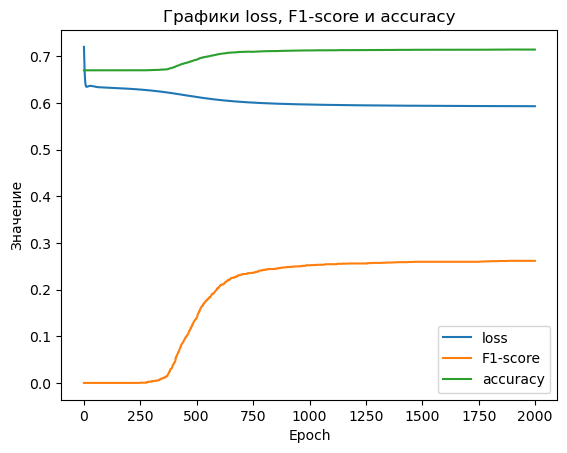

In [102]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf4['Epoch'], diagdf4['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf4['Epoch'], diagdf4['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf4['Epoch'], diagdf4['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [103]:
pred_test5=Mk5.forward(x_test.float())
pred_test_binarized5 = (pred_test5 > 0.5).float()

In [104]:
print(classification_report(y_test.to('cpu'), pred_test_binarized5.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.67      0.90      0.77      3216
         1.0       0.29      0.08      0.13      1542

    accuracy                           0.64      4758
   macro avg       0.48      0.49      0.45      4758
weighted avg       0.55      0.64      0.56      4758



In [105]:
#----------------------------------------------

<font color='red'>Experiment_#6</font>

<font color='red'>layer + 1, epochs: 2000 -> 10000, lr: 0.0001 -> 0.001, hidden_size: 200 -> 300</font>

In [106]:
#----------------------------------------------

In [107]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK6(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK6, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
        self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
        self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.relu(out)
        out = self.fc2(out)
        out = self.sigmoid(out)
        out = self.fc3(out)
        out = self.tanh(out)
        return out

In [108]:
Mk6=MLP_MK6(1000,300,1) #изменить название переменной

In [109]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [110]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [111]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [112]:
Mk6=Mk6.to(dev)

In [113]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk6.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf5=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(10000):
    optimizer.zero_grad()
    pred = Mk6.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf5 = pd.concat([diagdf5, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.6983461976051331   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2 , Loss:  0.6734216213226318   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3 , Loss:  0.6555737853050232   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4 , Loss:  0.6443483829498291   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5 , Loss:  0.638218104839325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6 , Loss:  0.6353943347930908   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7 , Loss:  0.6344329118728638   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8 , Loss:  0.6344005465507507   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9 , Loss:  0.6347730755805969   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  10 , Loss:  0.6352825164794922   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  11 , Loss:  0.6358020901679993   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  12 , Loss:  0.6362777948379517   f1-score: 0.0   accurac

Epoch:  116 , Loss:  0.5954039096832275   f1-score: 0.25496146082878113   accuracy: 0.7125225067138672
Epoch:  117 , Loss:  0.5952897667884827   f1-score: 0.25484246015548706   accuracy: 0.7123423218727112
Epoch:  118 , Loss:  0.595180869102478   f1-score: 0.25443512201309204   accuracy: 0.7122522592544556
Epoch:  119 , Loss:  0.5950769782066345   f1-score: 0.25443512201309204   accuracy: 0.7122522592544556
Epoch:  120 , Loss:  0.5949777960777283   f1-score: 0.25443512201309204   accuracy: 0.7122522592544556
Epoch:  121 , Loss:  0.5948829054832458   f1-score: 0.2549019753932953   accuracy: 0.7124324440956116
Epoch:  122 , Loss:  0.5947920680046082   f1-score: 0.25524964928627014   accuracy: 0.7124324440956116
Epoch:  123 , Loss:  0.5947052240371704   f1-score: 0.25524964928627014   accuracy: 0.7124324440956116
Epoch:  124 , Loss:  0.5946218967437744   f1-score: 0.25524964928627014   accuracy: 0.7124324440956116
Epoch:  125 , Loss:  0.5945420861244202   f1-score: 0.2556566298007965   ac

Epoch:  208 , Loss:  0.592237114906311   f1-score: 0.26163873076438904   accuracy: 0.7142342329025269
Epoch:  209 , Loss:  0.5922269225120544   f1-score: 0.26163873076438904   accuracy: 0.7142342329025269
Epoch:  210 , Loss:  0.5922169089317322   f1-score: 0.26163873076438904   accuracy: 0.7142342329025269
Epoch:  211 , Loss:  0.5922070741653442   f1-score: 0.26163873076438904   accuracy: 0.7142342329025269
Epoch:  212 , Loss:  0.5921972990036011   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  213 , Loss:  0.5921877026557922   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  214 , Loss:  0.5921783447265625   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  215 , Loss:  0.5921691060066223   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  216 , Loss:  0.5921599864959717   f1-score: 0.26123398542404175   accuracy: 0.7141441702842712
Epoch:  217 , Loss:  0.5921510457992554   f1-score: 0.26123398542404175   

Epoch:  298 , Loss:  0.5916941165924072   f1-score: 0.262287437915802   accuracy: 0.7146846652030945
Epoch:  299 , Loss:  0.5916905403137207   f1-score: 0.262287437915802   accuracy: 0.7146846652030945
Epoch:  300 , Loss:  0.5916869044303894   f1-score: 0.262287437915802   accuracy: 0.7146846652030945
Epoch:  301 , Loss:  0.5916832089424133   f1-score: 0.262287437915802   accuracy: 0.7146846652030945
Epoch:  302 , Loss:  0.5916796922683716   f1-score: 0.262287437915802   accuracy: 0.7146846652030945
Epoch:  303 , Loss:  0.5916761159896851   f1-score: 0.262287437915802   accuracy: 0.7146846652030945
Epoch:  304 , Loss:  0.5916726589202881   f1-score: 0.262287437915802   accuracy: 0.7146846652030945
Epoch:  305 , Loss:  0.5916692614555359   f1-score: 0.262287437915802   accuracy: 0.7146846652030945
Epoch:  306 , Loss:  0.5916656851768494   f1-score: 0.262287437915802   accuracy: 0.7146846652030945
Epoch:  307 , Loss:  0.5916622877120972   f1-score: 0.262287437915802   accuracy: 0.7146846

Epoch:  386 , Loss:  0.5914388298988342   f1-score: 0.2636236548423767   accuracy: 0.7151351571083069
Epoch:  387 , Loss:  0.5914363265037537   f1-score: 0.2636236548423767   accuracy: 0.7151351571083069
Epoch:  388 , Loss:  0.5914339423179626   f1-score: 0.2636236548423767   accuracy: 0.7151351571083069
Epoch:  389 , Loss:  0.5914314985275269   f1-score: 0.2636236548423767   accuracy: 0.7151351571083069
Epoch:  390 , Loss:  0.5914290547370911   f1-score: 0.2636236548423767   accuracy: 0.7151351571083069
Epoch:  391 , Loss:  0.5914266109466553   f1-score: 0.2636236548423767   accuracy: 0.7151351571083069
Epoch:  392 , Loss:  0.5914242267608643   f1-score: 0.2636236548423767   accuracy: 0.7151351571083069
Epoch:  393 , Loss:  0.5914217829704285   f1-score: 0.2636236548423767   accuracy: 0.7151351571083069
Epoch:  394 , Loss:  0.5914193987846375   f1-score: 0.2636236548423767   accuracy: 0.7151351571083069
Epoch:  395 , Loss:  0.5914170145988464   f1-score: 0.2636236548423767   accuracy:

Epoch:  470 , Loss:  0.591245710849762   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  471 , Loss:  0.5912433862686157   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  472 , Loss:  0.5912410616874695   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  473 , Loss:  0.5912388563156128   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  474 , Loss:  0.5912366509437561   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  475 , Loss:  0.5912344455718994   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  476 , Loss:  0.5912322402000427   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  477 , Loss:  0.5912298560142517   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  478 , Loss:  0.5912275910377502   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  479 , Loss:  0.591225266456604   f1-score: 0.2637465000152588   accuracy: 0

Epoch:  554 , Loss:  0.5910423994064331   f1-score: 0.2638079822063446   accuracy: 0.7154054045677185
Epoch:  555 , Loss:  0.5910403728485107   f1-score: 0.2638694643974304   accuracy: 0.7154954671859741
Epoch:  556 , Loss:  0.5910378098487854   f1-score: 0.2637465000152588   accuracy: 0.7153153419494629
Epoch:  557 , Loss:  0.5910349488258362   f1-score: 0.2638694643974304   accuracy: 0.7154954671859741
Epoch:  558 , Loss:  0.591031551361084   f1-score: 0.2638079822063446   accuracy: 0.7154054045677185
Epoch:  559 , Loss:  0.59102863073349   f1-score: 0.2638694643974304   accuracy: 0.7154954671859741
Epoch:  560 , Loss:  0.5910261273384094   f1-score: 0.2638694643974304   accuracy: 0.7154954671859741
Epoch:  561 , Loss:  0.5910239219665527   f1-score: 0.2638079822063446   accuracy: 0.7154054045677185
Epoch:  562 , Loss:  0.5910217761993408   f1-score: 0.2638694643974304   accuracy: 0.7154954671859741
Epoch:  563 , Loss:  0.5910196900367737   f1-score: 0.2638079822063446   accuracy: 0.

Epoch:  640 , Loss:  0.5908409357070923   f1-score: 0.2639309763908386   accuracy: 0.7155855894088745
Epoch:  641 , Loss:  0.5908389687538147   f1-score: 0.26427406072616577   accuracy: 0.7155855894088745
Epoch:  642 , Loss:  0.5908372402191162   f1-score: 0.2635875940322876   accuracy: 0.7155855894088745
Epoch:  643 , Loss:  0.5908357501029968   f1-score: 0.26427406072616577   accuracy: 0.7155855894088745
Epoch:  644 , Loss:  0.5908344984054565   f1-score: 0.2632438838481903   accuracy: 0.7155855894088745
Epoch:  645 , Loss:  0.5908329486846924   f1-score: 0.26427406072616577   accuracy: 0.7155855894088745
Epoch:  646 , Loss:  0.5908313393592834   f1-score: 0.2632438838481903   accuracy: 0.7155855894088745
Epoch:  647 , Loss:  0.5908284187316895   f1-score: 0.2646784782409668   accuracy: 0.7156756520271301
Epoch:  648 , Loss:  0.5908248424530029   f1-score: 0.26318246126174927   accuracy: 0.7154954671859741
Epoch:  649 , Loss:  0.5908204913139343   f1-score: 0.26427406072616577   accu

Epoch:  721 , Loss:  0.5906525254249573   f1-score: 0.26480185985565186   accuracy: 0.7158558368682861
Epoch:  722 , Loss:  0.5906494855880737   f1-score: 0.26445895433425903   accuracy: 0.7158558368682861
Epoch:  723 , Loss:  0.5906468629837036   f1-score: 0.26445895433425903   accuracy: 0.7158558368682861
Epoch:  724 , Loss:  0.5906447172164917   f1-score: 0.2643972933292389   accuracy: 0.7157657742500305
Epoch:  725 , Loss:  0.5906427502632141   f1-score: 0.26445895433425903   accuracy: 0.7158558368682861
Epoch:  726 , Loss:  0.5906410217285156   f1-score: 0.26480185985565186   accuracy: 0.7158558368682861
Epoch:  727 , Loss:  0.5906391739845276   f1-score: 0.26445895433425903   accuracy: 0.7158558368682861
Epoch:  728 , Loss:  0.5906370878219604   f1-score: 0.26480185985565186   accuracy: 0.7158558368682861
Epoch:  729 , Loss:  0.5906348824501038   f1-score: 0.26445895433425903   accuracy: 0.7158558368682861
Epoch:  730 , Loss:  0.5906322002410889   f1-score: 0.2652062475681305   a

Epoch:  806 , Loss:  0.5904613733291626   f1-score: 0.26492536067962646   accuracy: 0.7160360217094421
Epoch:  807 , Loss:  0.5904567837715149   f1-score: 0.2656104266643524   accuracy: 0.7160360217094421
Epoch:  808 , Loss:  0.590453028678894   f1-score: 0.2652680575847626   accuracy: 0.7160360217094421
Epoch:  809 , Loss:  0.5904505252838135   f1-score: 0.2652680575847626   accuracy: 0.7160360217094421
Epoch:  810 , Loss:  0.5904488563537598   f1-score: 0.2652062475681305   accuracy: 0.7159459590911865
Epoch:  811 , Loss:  0.590447723865509   f1-score: 0.2652680575847626   accuracy: 0.7160360217094421
Epoch:  812 , Loss:  0.5904464721679688   f1-score: 0.2660144567489624   accuracy: 0.7161261439323425
Epoch:  813 , Loss:  0.590445339679718   f1-score: 0.26492536067962646   accuracy: 0.7160360217094421
Epoch:  814 , Loss:  0.5904430150985718   f1-score: 0.2660144567489624   accuracy: 0.7161261439323425
Epoch:  815 , Loss:  0.5904402732849121   f1-score: 0.26492536067962646   accuracy:

Epoch:  894 , Loss:  0.5902619361877441   f1-score: 0.2660764157772064   accuracy: 0.7162162065505981
Epoch:  895 , Loss:  0.5902597308158875   f1-score: 0.2664182484149933   accuracy: 0.7162162065505981
Epoch:  896 , Loss:  0.5902577042579651   f1-score: 0.2660764157772064   accuracy: 0.7162162065505981
Epoch:  897 , Loss:  0.5902553200721741   f1-score: 0.2664182484149933   accuracy: 0.7162162065505981
Epoch:  898 , Loss:  0.5902531147003174   f1-score: 0.2660764157772064   accuracy: 0.7162162065505981
Epoch:  899 , Loss:  0.5902507901191711   f1-score: 0.26648032665252686   accuracy: 0.7163063287734985
Epoch:  900 , Loss:  0.5902486443519592   f1-score: 0.26648032665252686   accuracy: 0.7163063287734985
Epoch:  901 , Loss:  0.5902463793754578   f1-score: 0.26648032665252686   accuracy: 0.7163063287734985
Epoch:  902 , Loss:  0.5902441740036011   f1-score: 0.26648032665252686   accuracy: 0.7163063287734985
Epoch:  903 , Loss:  0.5902417898178101   f1-score: 0.2668840289115906   accur

Epoch:  979 , Loss:  0.5900747179985046   f1-score: 0.26648032665252686   accuracy: 0.7163063287734985
Epoch:  980 , Loss:  0.5900731682777405   f1-score: 0.2667597830295563   accuracy: 0.7162162065505981
Epoch:  981 , Loss:  0.590071976184845   f1-score: 0.2666045129299164   accuracy: 0.7164865136146545
Epoch:  982 , Loss:  0.5900703072547913   f1-score: 0.2667597830295563   accuracy: 0.7162162065505981
Epoch:  983 , Loss:  0.5900694131851196   f1-score: 0.2666045129299164   accuracy: 0.7164865136146545
Epoch:  984 , Loss:  0.5900678634643555   f1-score: 0.2667597830295563   accuracy: 0.7162162065505981
Epoch:  985 , Loss:  0.5900668501853943   f1-score: 0.2666045129299164   accuracy: 0.7164865136146545
Epoch:  986 , Loss:  0.5900647640228271   f1-score: 0.2667597830295563   accuracy: 0.7162162065505981
Epoch:  987 , Loss:  0.5900634527206421   f1-score: 0.2666045129299164   accuracy: 0.7164865136146545
Epoch:  988 , Loss:  0.5900602340698242   f1-score: 0.2667597830295563   accuracy:

Epoch:  1062 , Loss:  0.58989018201828   f1-score: 0.26648032665252686   accuracy: 0.7163063287734985
Epoch:  1063 , Loss:  0.5898873209953308   f1-score: 0.26682189106941223   accuracy: 0.7163063287734985
Epoch:  1064 , Loss:  0.5898846983909607   f1-score: 0.26648032665252686   accuracy: 0.7163063287734985
Epoch:  1065 , Loss:  0.5898822546005249   f1-score: 0.26648032665252686   accuracy: 0.7163063287734985
Epoch:  1066 , Loss:  0.5898799896240234   f1-score: 0.26648032665252686   accuracy: 0.7163063287734985
Epoch:  1067 , Loss:  0.5898779034614563   f1-score: 0.26648032665252686   accuracy: 0.7163063287734985
Epoch:  1068 , Loss:  0.5898758172988892   f1-score: 0.26682189106941223   accuracy: 0.7163063287734985
Epoch:  1069 , Loss:  0.5898740291595459   f1-score: 0.26648032665252686   accuracy: 0.7163063287734985
Epoch:  1070 , Loss:  0.5898725986480713   f1-score: 0.267100989818573   accuracy: 0.7162162065505981
Epoch:  1071 , Loss:  0.5898718237876892   f1-score: 0.2665424048900

Epoch:  1146 , Loss:  0.5897191166877747   f1-score: 0.26728755235671997   accuracy: 0.7164865136146545
Epoch:  1147 , Loss:  0.5897125601768494   f1-score: 0.26744186878204346   accuracy: 0.7162162065505981
Epoch:  1148 , Loss:  0.5897092223167419   f1-score: 0.26716312766075134   accuracy: 0.7163063287734985
Epoch:  1149 , Loss:  0.5897083878517151   f1-score: 0.26722532510757446   accuracy: 0.7163963913917542
Epoch:  1150 , Loss:  0.5897089242935181   f1-score: 0.26784467697143555   accuracy: 0.7163063287734985
Epoch:  1151 , Loss:  0.5897104740142822   f1-score: 0.2669461965560913   accuracy: 0.7164865136146545
Epoch:  1152 , Loss:  0.5897106528282166   f1-score: 0.26778241991996765   accuracy: 0.7162162065505981
Epoch:  1153 , Loss:  0.5897113084793091   f1-score: 0.2669461965560913   accuracy: 0.7164865136146545
Epoch:  1154 , Loss:  0.5897079110145569   f1-score: 0.26778241991996765   accuracy: 0.7162162065505981
Epoch:  1155 , Loss:  0.5897049307823181   f1-score: 0.26694619655

Epoch:  1233 , Loss:  0.5895533561706543   f1-score: 0.2682473361492157   accuracy: 0.7163963913917542
Epoch:  1234 , Loss:  0.5895524621009827   f1-score: 0.2675663232803345   accuracy: 0.7163963913917542
Epoch:  1235 , Loss:  0.5895512104034424   f1-score: 0.26812267303466797   accuracy: 0.7162162065505981
Epoch:  1236 , Loss:  0.5895503759384155   f1-score: 0.26769086718559265   accuracy: 0.7165765762329102
Epoch:  1237 , Loss:  0.589548647403717   f1-score: 0.26812267303466797   accuracy: 0.7162162065505981
Epoch:  1238 , Loss:  0.5895472764968872   f1-score: 0.2677532136440277   accuracy: 0.7166666388511658
Epoch:  1239 , Loss:  0.5895453691482544   f1-score: 0.26812267303466797   accuracy: 0.7162162065505981
Epoch:  1240 , Loss:  0.5895437002182007   f1-score: 0.2677532136440277   accuracy: 0.7166666388511658
Epoch:  1241 , Loss:  0.5895413756370544   f1-score: 0.26812267303466797   accuracy: 0.7162162065505981
Epoch:  1242 , Loss:  0.5895394682884216   f1-score: 0.26775321364402

Epoch:  1322 , Loss:  0.5894141793251038   f1-score: 0.2681564390659332   accuracy: 0.7167567610740662
Epoch:  1323 , Loss:  0.5894079804420471   f1-score: 0.2682473361492157   accuracy: 0.7163963913917542
Epoch:  1324 , Loss:  0.5894042253494263   f1-score: 0.26803165674209595   accuracy: 0.7165765762329102
Epoch:  1325 , Loss:  0.5894012451171875   f1-score: 0.26830968260765076   accuracy: 0.7164865136146545
Epoch:  1326 , Loss:  0.5893990993499756   f1-score: 0.26803165674209595   accuracy: 0.7165765762329102
Epoch:  1327 , Loss:  0.5893974900245667   f1-score: 0.26803165674209595   accuracy: 0.7165765762329102
Epoch:  1328 , Loss:  0.5893962979316711   f1-score: 0.26830968260765076   accuracy: 0.7164865136146545
Epoch:  1329 , Loss:  0.5893955230712891   f1-score: 0.26803165674209595   accuracy: 0.7165765762329102
Epoch:  1330 , Loss:  0.5893950462341309   f1-score: 0.2682473361492157   accuracy: 0.7163963913917542
Epoch:  1331 , Loss:  0.5893957018852234   f1-score: 0.268156439065

Epoch:  1407 , Loss:  0.5892876386642456   f1-score: 0.26864978671073914   accuracy: 0.7164865136146545
Epoch:  1408 , Loss:  0.5892877578735352   f1-score: 0.26855945587158203   accuracy: 0.7168468236923218
Epoch:  1409 , Loss:  0.5892859697341919   f1-score: 0.26864978671073914   accuracy: 0.7164865136146545
Epoch:  1410 , Loss:  0.5892852544784546   f1-score: 0.26855945587158203   accuracy: 0.7168468236923218
Epoch:  1411 , Loss:  0.5892825126647949   f1-score: 0.26864978671073914   accuracy: 0.7164865136146545
Epoch:  1412 , Loss:  0.5892809629440308   f1-score: 0.26855945587158203   accuracy: 0.7168468236923218
Epoch:  1413 , Loss:  0.5892775058746338   f1-score: 0.26864978671073914   accuracy: 0.7164865136146545
Epoch:  1414 , Loss:  0.5892746448516846   f1-score: 0.2684969902038574   accuracy: 0.7167567610740662
Epoch:  1415 , Loss:  0.5892711281776428   f1-score: 0.26871222257614136   accuracy: 0.7165765762329102
Epoch:  1416 , Loss:  0.5892683267593384   f1-score: 0.2684345245

Epoch:  1490 , Loss:  0.5891762971878052   f1-score: 0.2684969902038574   accuracy: 0.7167567610740662
Epoch:  1491 , Loss:  0.5891691446304321   f1-score: 0.26923972368240356   accuracy: 0.7168468236923218
Epoch:  1492 , Loss:  0.5891656279563904   f1-score: 0.2684345245361328   accuracy: 0.7166666388511658
Epoch:  1493 , Loss:  0.5891652703285217   f1-score: 0.2684345245361328   accuracy: 0.7166666388511658
Epoch:  1494 , Loss:  0.589166522026062   f1-score: 0.26923972368240356   accuracy: 0.7168468236923218
Epoch:  1495 , Loss:  0.5891686677932739   f1-score: 0.2684969902038574   accuracy: 0.7167567610740662
Epoch:  1496 , Loss:  0.5891692042350769   f1-score: 0.26923972368240356   accuracy: 0.7168468236923218
Epoch:  1497 , Loss:  0.5891700387001038   f1-score: 0.2684969902038574   accuracy: 0.7167567610740662
Epoch:  1498 , Loss:  0.589167058467865   f1-score: 0.26905205845832825   accuracy: 0.7165765762329102
Epoch:  1499 , Loss:  0.5891643762588501   f1-score: 0.2684969902038574

Epoch:  1573 , Loss:  0.5890716910362244   f1-score: 0.26889973878860474   accuracy: 0.7168468236923218
Epoch:  1574 , Loss:  0.5890700221061707   f1-score: 0.26911458373069763   accuracy: 0.7166666388511658
Epoch:  1575 , Loss:  0.5890688300132751   f1-score: 0.26883721351623535   accuracy: 0.7167567610740662
Epoch:  1576 , Loss:  0.5890676379203796   f1-score: 0.26911458373069763   accuracy: 0.7166666388511658
Epoch:  1577 , Loss:  0.589066743850708   f1-score: 0.26883721351623535   accuracy: 0.7167567610740662
Epoch:  1578 , Loss:  0.5890659689903259   f1-score: 0.26911458373069763   accuracy: 0.7166666388511658
Epoch:  1579 , Loss:  0.5890657901763916   f1-score: 0.26889973878860474   accuracy: 0.7168468236923218
Epoch:  1580 , Loss:  0.5890659689903259   f1-score: 0.26905205845832825   accuracy: 0.7165765762329102
Epoch:  1581 , Loss:  0.5890676379203796   f1-score: 0.26889973878860474   accuracy: 0.7168468236923218
Epoch:  1582 , Loss:  0.5890698432922363   f1-score: 0.2690520584

Epoch:  1661 , Loss:  0.5889904499053955   f1-score: 0.26898953318595886   accuracy: 0.7164865136146545
Epoch:  1662 , Loss:  0.5889827609062195   f1-score: 0.26883721351623535   accuracy: 0.7167567610740662
Epoch:  1663 , Loss:  0.5889747738838196   f1-score: 0.26905205845832825   accuracy: 0.7165765762329102
Epoch:  1664 , Loss:  0.5889706015586853   f1-score: 0.26864978671073914   accuracy: 0.7164865136146545
Epoch:  1665 , Loss:  0.5889696478843689   f1-score: 0.26864978671073914   accuracy: 0.7164865136146545
Epoch:  1666 , Loss:  0.5889710783958435   f1-score: 0.26905205845832825   accuracy: 0.7165765762329102
Epoch:  1667 , Loss:  0.5889741778373718   f1-score: 0.26883721351623535   accuracy: 0.7167567610740662
Epoch:  1668 , Loss:  0.5889763236045837   f1-score: 0.26905205845832825   accuracy: 0.7165765762329102
Epoch:  1669 , Loss:  0.5889795422554016   f1-score: 0.26855945587158203   accuracy: 0.7168468236923218
Epoch:  1670 , Loss:  0.5889782309532166   f1-score: 0.268989533

Epoch:  1746 , Loss:  0.5888952612876892   f1-score: 0.26871222257614136   accuracy: 0.7165765762329102
Epoch:  1747 , Loss:  0.5888908505439758   f1-score: 0.2698560059070587   accuracy: 0.7167567610740662
Epoch:  1748 , Loss:  0.5888888239860535   f1-score: 0.26945412158966064   accuracy: 0.7166666388511658
Epoch:  1749 , Loss:  0.5888886451721191   f1-score: 0.26905205845832825   accuracy: 0.7165765762329102
Epoch:  1750 , Loss:  0.5888898968696594   f1-score: 0.2698560059070587   accuracy: 0.7167567610740662
Epoch:  1751 , Loss:  0.5888918042182922   f1-score: 0.26871222257614136   accuracy: 0.7165765762329102
Epoch:  1752 , Loss:  0.5888923406600952   f1-score: 0.2698560059070587   accuracy: 0.7167567610740662
Epoch:  1753 , Loss:  0.5888928174972534   f1-score: 0.2683720886707306   accuracy: 0.7165765762329102
Epoch:  1754 , Loss:  0.5888901352882385   f1-score: 0.2698560059070587   accuracy: 0.7167567610740662
Epoch:  1755 , Loss:  0.5888875126838684   f1-score: 0.26911458373069

Epoch:  1831 , Loss:  0.5888369083404541   f1-score: 0.26877471804618835   accuracy: 0.7166666388511658
Epoch:  1832 , Loss:  0.5888314843177795   f1-score: 0.27139875292778015   accuracy: 0.7170270085334778
Epoch:  1833 , Loss:  0.5888298749923706   f1-score: 0.2691771388053894   accuracy: 0.7167567610740662
Epoch:  1834 , Loss:  0.5888235569000244   f1-score: 0.2710605561733246   accuracy: 0.7170270085334778
Epoch:  1835 , Loss:  0.5888199806213379   f1-score: 0.2691771388053894   accuracy: 0.7167567610740662
Epoch:  1836 , Loss:  0.5888153314590454   f1-score: 0.2706592381000519   accuracy: 0.7169369459152222
Epoch:  1837 , Loss:  0.5888122916221619   f1-score: 0.2698560059070587   accuracy: 0.7167567610740662
Epoch:  1838 , Loss:  0.5888102054595947   f1-score: 0.27025771141052246   accuracy: 0.7168468236923218
Epoch:  1839 , Loss:  0.5888091325759888   f1-score: 0.27025771141052246   accuracy: 0.7168468236923218
Epoch:  1840 , Loss:  0.5888088941574097   f1-score: 0.26985600590705

Epoch:  1915 , Loss:  0.5887748003005981   f1-score: 0.27167361974716187   accuracy: 0.7169369459152222
Epoch:  1916 , Loss:  0.5887783765792847   f1-score: 0.2697047293186188   accuracy: 0.7170270085334778
Epoch:  1917 , Loss:  0.5887689590454102   f1-score: 0.27167361974716187   accuracy: 0.7169369459152222
Epoch:  1918 , Loss:  0.5887656211853027   f1-score: 0.26964202523231506   accuracy: 0.7169369459152222
Epoch:  1919 , Loss:  0.5887561440467834   f1-score: 0.27179962396621704   accuracy: 0.7171171307563782
Epoch:  1920 , Loss:  0.5887506604194641   f1-score: 0.26998141407966614   accuracy: 0.7169369459152222
Epoch:  1921 , Loss:  0.5887457132339478   f1-score: 0.27146172523498535   accuracy: 0.7171171307563782
Epoch:  1922 , Loss:  0.5887431502342224   f1-score: 0.2706592381000519   accuracy: 0.7169369459152222
Epoch:  1923 , Loss:  0.5887418389320374   f1-score: 0.2706592381000519   accuracy: 0.7169369459152222
Epoch:  1924 , Loss:  0.5887419581413269   f1-score: 0.271060556173

Epoch:  1998 , Loss:  0.5886940956115723   f1-score: 0.27173662185668945   accuracy: 0.7170270085334778
Epoch:  1999 , Loss:  0.5887007117271423   f1-score: 0.2697047293186188   accuracy: 0.7170270085334778
Epoch:  2000 , Loss:  0.5887027978897095   f1-score: 0.27167361974716187   accuracy: 0.7169369459152222
Epoch:  2001 , Loss:  0.5887134075164795   f1-score: 0.2697674334049225   accuracy: 0.7171171307563782
Epoch:  2002 , Loss:  0.5887113809585571   f1-score: 0.2720111310482025   accuracy: 0.7169369459152222
Epoch:  2003 , Loss:  0.5887216329574585   f1-score: 0.26983019709587097   accuracy: 0.7172071933746338
Epoch:  2004 , Loss:  0.5887106657028198   f1-score: 0.2720111310482025   accuracy: 0.7169369459152222
Epoch:  2005 , Loss:  0.5887098908424377   f1-score: 0.2697674334049225   accuracy: 0.7171171307563782
Epoch:  2006 , Loss:  0.5886927247047424   f1-score: 0.27167361974716187   accuracy: 0.7169369459152222
Epoch:  2007 , Loss:  0.5886821746826172   f1-score: 0.27050894498825

Epoch:  2085 , Loss:  0.5886209607124329   f1-score: 0.2718626856803894   accuracy: 0.7172071933746338
Epoch:  2086 , Loss:  0.5886197090148926   f1-score: 0.2708478569984436   accuracy: 0.7172071933746338
Epoch:  2087 , Loss:  0.5886185765266418   f1-score: 0.2718626856803894   accuracy: 0.7172071933746338
Epoch:  2088 , Loss:  0.5886176824569702   f1-score: 0.2711864411830902   accuracy: 0.7172071933746338
Epoch:  2089 , Loss:  0.5886167287826538   f1-score: 0.2718626856803894   accuracy: 0.7172071933746338
Epoch:  2090 , Loss:  0.5886159539222717   f1-score: 0.2711864411830902   accuracy: 0.7172071933746338
Epoch:  2091 , Loss:  0.5886152386665344   f1-score: 0.2718626856803894   accuracy: 0.7172071933746338
Epoch:  2092 , Loss:  0.5886146426200867   f1-score: 0.2711864411830902   accuracy: 0.7172071933746338
Epoch:  2093 , Loss:  0.5886138677597046   f1-score: 0.2718626856803894   accuracy: 0.7172071933746338
Epoch:  2094 , Loss:  0.5886131525039673   f1-score: 0.2711864411830902  

Epoch:  2173 , Loss:  0.588569164276123   f1-score: 0.2733379602432251   accuracy: 0.7173873782157898
Epoch:  2174 , Loss:  0.5885725021362305   f1-score: 0.271312415599823   accuracy: 0.7173873782157898
Epoch:  2175 , Loss:  0.5885746479034424   f1-score: 0.27327466011047363   accuracy: 0.7172973155975342
Epoch:  2176 , Loss:  0.5885830521583557   f1-score: 0.2701069414615631   accuracy: 0.7171171307563782
Epoch:  2177 , Loss:  0.5885868072509766   f1-score: 0.27321138978004456   accuracy: 0.7172071933746338
Epoch:  2178 , Loss:  0.5886037945747375   f1-score: 0.270169734954834   accuracy: 0.7172071933746338
Epoch:  2179 , Loss:  0.5886036157608032   f1-score: 0.2736110985279083   accuracy: 0.7172973155975342
Epoch:  2180 , Loss:  0.5886256098747253   f1-score: 0.27023255825042725   accuracy: 0.7172973155975342
Epoch:  2181 , Loss:  0.5886095762252808   f1-score: 0.2736110985279083   accuracy: 0.7172973155975342
Epoch:  2182 , Loss:  0.5886138081550598   f1-score: 0.27023255825042725 

Epoch:  2262 , Loss:  0.5885151624679565   f1-score: 0.2733379602432251   accuracy: 0.7173873782157898
Epoch:  2263 , Loss:  0.5885101556777954   f1-score: 0.27192574739456177   accuracy: 0.7172973155975342
Epoch:  2264 , Loss:  0.5885065793991089   f1-score: 0.27300116419792175   accuracy: 0.7173873782157898
Epoch:  2265 , Loss:  0.588505208492279   f1-score: 0.27300116419792175   accuracy: 0.7173873782157898
Epoch:  2266 , Loss:  0.5885054469108582   f1-score: 0.2718626856803894   accuracy: 0.7172071933746338
Epoch:  2267 , Loss:  0.588506817817688   f1-score: 0.27300116419792175   accuracy: 0.7173873782157898
Epoch:  2268 , Loss:  0.588509738445282   f1-score: 0.2719888687133789   accuracy: 0.7173873782157898
Epoch:  2269 , Loss:  0.5885121822357178   f1-score: 0.2733379602432251   accuracy: 0.7173873782157898
Epoch:  2270 , Loss:  0.5885172486305237   f1-score: 0.27205199003219604   accuracy: 0.7174775004386902
Epoch:  2271 , Loss:  0.5885187983512878   f1-score: 0.2736744582653045

Epoch:  2350 , Loss:  0.5884628295898438   f1-score: 0.27192574739456177   accuracy: 0.7172973155975342
Epoch:  2351 , Loss:  0.5884650349617004   f1-score: 0.2737378478050232   accuracy: 0.7174775004386902
Epoch:  2352 , Loss:  0.5884712338447571   f1-score: 0.27205199003219604   accuracy: 0.7174775004386902
Epoch:  2353 , Loss:  0.58847576379776   f1-score: 0.2736110985279083   accuracy: 0.7172973155975342
Epoch:  2354 , Loss:  0.5884902477264404   f1-score: 0.27171388268470764   accuracy: 0.7174775004386902
Epoch:  2355 , Loss:  0.5884947776794434   f1-score: 0.27401065826416016   accuracy: 0.7173873782157898
Epoch:  2356 , Loss:  0.5885205864906311   f1-score: 0.27097374200820923   accuracy: 0.7173873782157898
Epoch:  2357 , Loss:  0.5885125994682312   f1-score: 0.27401065826416016   accuracy: 0.7173873782157898
Epoch:  2358 , Loss:  0.5885341763496399   f1-score: 0.27103671431541443   accuracy: 0.7174775004386902
Epoch:  2359 , Loss:  0.5885053277015686   f1-score: 0.2740106582641

Epoch:  2436 , Loss:  0.5884127020835876   f1-score: 0.27232661843299866   accuracy: 0.7173873782157898
Epoch:  2437 , Loss:  0.588410496711731   f1-score: 0.2737378478050232   accuracy: 0.7174775004386902
Epoch:  2438 , Loss:  0.5884091258049011   f1-score: 0.27300116419792175   accuracy: 0.7173873782157898
Epoch:  2439 , Loss:  0.5884084105491638   f1-score: 0.27300116419792175   accuracy: 0.7173873782157898
Epoch:  2440 , Loss:  0.5884077548980713   f1-score: 0.27300116419792175   accuracy: 0.7173873782157898
Epoch:  2441 , Loss:  0.5884075164794922   f1-score: 0.27300116419792175   accuracy: 0.7173873782157898
Epoch:  2442 , Loss:  0.5884073972702026   f1-score: 0.27340129017829895   accuracy: 0.7174775004386902
Epoch:  2443 , Loss:  0.5884075164794922   f1-score: 0.27266404032707214   accuracy: 0.7173873782157898
Epoch:  2444 , Loss:  0.5884074568748474   f1-score: 0.2737378478050232   accuracy: 0.7174775004386902
Epoch:  2445 , Loss:  0.5884075164794922   f1-score: 0.272326618432

Epoch:  2522 , Loss:  0.5883659720420837   f1-score: 0.27306443452835083   accuracy: 0.7174775004386902
Epoch:  2523 , Loss:  0.5883659720420837   f1-score: 0.2738012373447418   accuracy: 0.7175675630569458
Epoch:  2524 , Loss:  0.5883660912513733   f1-score: 0.27306443452835083   accuracy: 0.7174775004386902
Epoch:  2525 , Loss:  0.5883665084838867   f1-score: 0.2741375267505646   accuracy: 0.7175675630569458
Epoch:  2526 , Loss:  0.5883677005767822   f1-score: 0.2731277644634247   accuracy: 0.7175675630569458
Epoch:  2527 , Loss:  0.5883693099021912   f1-score: 0.2741375267505646   accuracy: 0.7175675630569458
Epoch:  2528 , Loss:  0.5883733034133911   f1-score: 0.27232661843299866   accuracy: 0.7173873782157898
Epoch:  2529 , Loss:  0.5883771777153015   f1-score: 0.27407407760620117   accuracy: 0.7174775004386902
Epoch:  2530 , Loss:  0.5883880853652954   f1-score: 0.27211517095565796   accuracy: 0.7175675630569458
Epoch:  2531 , Loss:  0.588394284248352   f1-score: 0.27434653043746

Epoch:  2606 , Loss:  0.5883259177207947   f1-score: 0.2738012373447418   accuracy: 0.7175675630569458
Epoch:  2607 , Loss:  0.5883255004882812   f1-score: 0.2734646499156952   accuracy: 0.7175675630569458
Epoch:  2608 , Loss:  0.5883250832557678   f1-score: 0.2741375267505646   accuracy: 0.7175675630569458
Epoch:  2609 , Loss:  0.5883249640464783   f1-score: 0.2734646499156952   accuracy: 0.7175675630569458
Epoch:  2610 , Loss:  0.5883249044418335   f1-score: 0.27453702688217163   accuracy: 0.7176576852798462
Epoch:  2611 , Loss:  0.5883252620697021   f1-score: 0.2731277644634247   accuracy: 0.7175675630569458
Epoch:  2612 , Loss:  0.5883257985115051   f1-score: 0.27453702688217163   accuracy: 0.7176576852798462
Epoch:  2613 , Loss:  0.5883278250694275   f1-score: 0.27272728085517883   accuracy: 0.7174775004386902
Epoch:  2614 , Loss:  0.5883299708366394   f1-score: 0.27453702688217163   accuracy: 0.7176576852798462
Epoch:  2615 , Loss:  0.5883360505104065   f1-score: 0.27272728085517

Epoch:  2692 , Loss:  0.588302493095398   f1-score: 0.2743465304374695   accuracy: 0.7173873782157898
Epoch:  2693 , Loss:  0.5883077383041382   f1-score: 0.27232661843299866   accuracy: 0.7173873782157898
Epoch:  2694 , Loss:  0.5883063077926636   f1-score: 0.2743465304374695   accuracy: 0.7173873782157898
Epoch:  2695 , Loss:  0.5883125066757202   f1-score: 0.2724530100822449   accuracy: 0.7175675630569458
Epoch:  2696 , Loss:  0.5883090496063232   f1-score: 0.2743465304374695   accuracy: 0.7173873782157898
Epoch:  2697 , Loss:  0.5883147716522217   f1-score: 0.27211517095565796   accuracy: 0.7175675630569458
Epoch:  2698 , Loss:  0.5883090496063232   f1-score: 0.2743465304374695   accuracy: 0.7173873782157898
Epoch:  2699 , Loss:  0.5883125066757202   f1-score: 0.27238979935646057   accuracy: 0.7174775004386902
Epoch:  2700 , Loss:  0.5883049964904785   f1-score: 0.2743465304374695   accuracy: 0.7173873782157898
Epoch:  2701 , Loss:  0.5883053541183472   f1-score: 0.2723266184329986

Epoch:  2780 , Loss:  0.5882425308227539   f1-score: 0.27420100569725037   accuracy: 0.7176576852798462
Epoch:  2781 , Loss:  0.5882430076599121   f1-score: 0.27447348833084106   accuracy: 0.7175675630569458
Epoch:  2782 , Loss:  0.5882444977760315   f1-score: 0.2739916443824768   accuracy: 0.7178378105163574
Epoch:  2783 , Loss:  0.5882464051246643   f1-score: 0.27447348833084106   accuracy: 0.7175675630569458
Epoch:  2784 , Loss:  0.5882509350776672   f1-score: 0.2739916443824768   accuracy: 0.7178378105163574
Epoch:  2785 , Loss:  0.588255763053894   f1-score: 0.2743465304374695   accuracy: 0.7173873782157898
Epoch:  2786 , Loss:  0.5882680416107178   f1-score: 0.27211517095565796   accuracy: 0.7175675630569458
Epoch:  2787 , Loss:  0.5882753729820251   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  2788 , Loss:  0.5883026719093323   f1-score: 0.2721783518791199   accuracy: 0.7176576852798462
Epoch:  2789 , Loss:  0.5883031487464905   f1-score: 0.274745613336563

Epoch:  2862 , Loss:  0.5882096290588379   f1-score: 0.2739916443824768   accuracy: 0.7178378105163574
Epoch:  2863 , Loss:  0.5882056951522827   f1-score: 0.2741375267505646   accuracy: 0.7175675630569458
Epoch:  2864 , Loss:  0.5882056951522827   f1-score: 0.2741375267505646   accuracy: 0.7175675630569458
Epoch:  2865 , Loss:  0.5882085561752319   f1-score: 0.2739916443824768   accuracy: 0.7178378105163574
Epoch:  2866 , Loss:  0.5882129669189453   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  2867 , Loss:  0.5882208347320557   f1-score: 0.2739916443824768   accuracy: 0.7178378105163574
Epoch:  2868 , Loss:  0.588225245475769   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  2869 , Loss:  0.5882370471954346   f1-score: 0.27257952094078064   accuracy: 0.7177477478981018
Epoch:  2870 , Loss:  0.5882349014282227   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  2871 , Loss:  0.5882418155670166   f1-score: 0.27251625061035156 

Epoch:  2950 , Loss:  0.5881693363189697   f1-score: 0.2741375267505646   accuracy: 0.7175675630569458
Epoch:  2951 , Loss:  0.5881691575050354   f1-score: 0.2741375267505646   accuracy: 0.7175675630569458
Epoch:  2952 , Loss:  0.5881721377372742   f1-score: 0.2738646864891052   accuracy: 0.7176576852798462
Epoch:  2953 , Loss:  0.5881757736206055   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  2954 , Loss:  0.588181734085083   f1-score: 0.2739916443824768   accuracy: 0.7178378105163574
Epoch:  2955 , Loss:  0.5881847739219666   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  2956 , Loss:  0.5881930589675903   f1-score: 0.272853821516037   accuracy: 0.7176576852798462
Epoch:  2957 , Loss:  0.5881925821304321   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  2958 , Loss:  0.5882002711296082   f1-score: 0.27291715145111084   accuracy: 0.7177477478981018
Epoch:  2959 , Loss:  0.5881945490837097   f1-score: 0.2747456133365631   

Epoch:  3034 , Loss:  0.5881466865539551   f1-score: 0.2739916443824768   accuracy: 0.7178378105163574
Epoch:  3035 , Loss:  0.5881531834602356   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  3036 , Loss:  0.5881659984588623   f1-score: 0.27291715145111084   accuracy: 0.7177477478981018
Epoch:  3037 , Loss:  0.5881680250167847   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  3038 , Loss:  0.5881820917129517   f1-score: 0.2729805111885071   accuracy: 0.7178378105163574
Epoch:  3039 , Loss:  0.588174045085907   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  3040 , Loss:  0.5881810188293457   f1-score: 0.27291715145111084   accuracy: 0.7177477478981018
Epoch:  3041 , Loss:  0.588165819644928   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  3042 , Loss:  0.5881632566452026   f1-score: 0.27291715145111084   accuracy: 0.7177477478981018
Epoch:  3043 , Loss:  0.5881505012512207   f1-score: 0.2747456133365631 

Epoch:  3115 , Loss:  0.5881054997444153   f1-score: 0.274872750043869   accuracy: 0.7176576852798462
Epoch:  3116 , Loss:  0.5881058573722839   f1-score: 0.27420100569725037   accuracy: 0.7176576852798462
Epoch:  3117 , Loss:  0.5881063342094421   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  3118 , Loss:  0.5881075859069824   f1-score: 0.273928165435791   accuracy: 0.7177477478981018
Epoch:  3119 , Loss:  0.5881088972091675   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  3120 , Loss:  0.5881122350692749   f1-score: 0.2739916443824768   accuracy: 0.7178378105163574
Epoch:  3121 , Loss:  0.588114857673645   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  3122 , Loss:  0.5881221890449524   f1-score: 0.27359145879745483   accuracy: 0.7177477478981018
Epoch:  3123 , Loss:  0.5881262421607971   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  3124 , Loss:  0.5881414413452148   f1-score: 0.2729805111885071   

Epoch:  3217 , Loss:  0.5880699157714844   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3218 , Loss:  0.5880734920501709   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  3219 , Loss:  0.5880813598632812   f1-score: 0.27319109439849854   accuracy: 0.7176576852798462
Epoch:  3220 , Loss:  0.58808434009552   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  3221 , Loss:  0.5880968570709229   f1-score: 0.272853821516037   accuracy: 0.7176576852798462
Epoch:  3222 , Loss:  0.5880962014198303   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  3223 , Loss:  0.5881112813949585   f1-score: 0.27291715145111084   accuracy: 0.7177477478981018
Epoch:  3224 , Loss:  0.5881027579307556   f1-score: 0.2751445174217224   accuracy: 0.7175675630569458
Epoch:  3225 , Loss:  0.5881132483482361   f1-score: 0.27291715145111084   accuracy: 0.7177477478981018
Epoch:  3226 , Loss:  0.5880974531173706   f1-score: 0.2747456133365631 

Epoch:  3318 , Loss:  0.5880257487297058   f1-score: 0.2750000059604645   accuracy: 0.7178378105163574
Epoch:  3319 , Loss:  0.5880250930786133   f1-score: 0.274872750043869   accuracy: 0.7176576852798462
Epoch:  3320 , Loss:  0.588024914264679   f1-score: 0.2743280827999115   accuracy: 0.7178378105163574
Epoch:  3321 , Loss:  0.5880247354507446   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  3322 , Loss:  0.5880246162414551   f1-score: 0.2743280827999115   accuracy: 0.7178378105163574
Epoch:  3323 , Loss:  0.5880245566368103   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  3324 , Loss:  0.5880247354507446   f1-score: 0.2743280827999115   accuracy: 0.7178378105163574
Epoch:  3325 , Loss:  0.5880250930786133   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  3326 , Loss:  0.5880261063575745   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3327 , Loss:  0.58802729845047   f1-score: 0.2748091518878937   ac

Epoch:  3420 , Loss:  0.5880126953125   f1-score: 0.27365490794181824   accuracy: 0.7178378105163574
Epoch:  3421 , Loss:  0.5880038142204285   f1-score: 0.2747456133365631   accuracy: 0.7174775004386902
Epoch:  3422 , Loss:  0.5879998207092285   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3423 , Loss:  0.5879955887794495   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  3424 , Loss:  0.5879939198493958   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3425 , Loss:  0.5879926085472107   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  3426 , Loss:  0.5879924893379211   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3427 , Loss:  0.5879924297332764   f1-score: 0.2748091518878937   accuracy: 0.7175675630569458
Epoch:  3428 , Loss:  0.5879939198493958   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3429 , Loss:  0.5879955887794495   f1-score: 0.2748091518878937

Epoch:  3501 , Loss:  0.5879651308059692   f1-score: 0.274872750043869   accuracy: 0.7176576852798462
Epoch:  3502 , Loss:  0.5879644751548767   f1-score: 0.2743280827999115   accuracy: 0.7178378105163574
Epoch:  3503 , Loss:  0.5879639983177185   f1-score: 0.274872750043869   accuracy: 0.7176576852798462
Epoch:  3504 , Loss:  0.5879635214805603   f1-score: 0.2743280827999115   accuracy: 0.7178378105163574
Epoch:  3505 , Loss:  0.5879631042480469   f1-score: 0.274872750043869   accuracy: 0.7176576852798462
Epoch:  3506 , Loss:  0.5879628658294678   f1-score: 0.2743280827999115   accuracy: 0.7178378105163574
Epoch:  3507 , Loss:  0.5879625678062439   f1-score: 0.274872750043869   accuracy: 0.7176576852798462
Epoch:  3508 , Loss:  0.5879625082015991   f1-score: 0.2743280827999115   accuracy: 0.7178378105163574
Epoch:  3509 , Loss:  0.5879625678062439   f1-score: 0.274872750043869   accuracy: 0.7176576852798462
Epoch:  3510 , Loss:  0.5879626274108887   f1-score: 0.2743280827999115   accu

Epoch:  3585 , Loss:  0.5879372954368591   f1-score: 0.27426454424858093   accuracy: 0.7177477478981018
Epoch:  3586 , Loss:  0.5879371762275696   f1-score: 0.274872750043869   accuracy: 0.7176576852798462
Epoch:  3587 , Loss:  0.5879371166229248   f1-score: 0.27426454424858093   accuracy: 0.7177477478981018
Epoch:  3588 , Loss:  0.5879371166229248   f1-score: 0.274872750043869   accuracy: 0.7176576852798462
Epoch:  3589 , Loss:  0.5879371762275696   f1-score: 0.27439165115356445   accuracy: 0.7179279327392578
Epoch:  3590 , Loss:  0.587937593460083   f1-score: 0.274872750043869   accuracy: 0.7176576852798462
Epoch:  3591 , Loss:  0.5879390239715576   f1-score: 0.2744552493095398   accuracy: 0.7180179953575134
Epoch:  3592 , Loss:  0.5879400968551636   f1-score: 0.274872750043869   accuracy: 0.7176576852798462
Epoch:  3593 , Loss:  0.5879432559013367   f1-score: 0.2744552493095398   accuracy: 0.7180179953575134
Epoch:  3594 , Loss:  0.5879467725753784   f1-score: 0.2751445174217224   a

Epoch:  3667 , Loss:  0.5879358649253845   f1-score: 0.27371838688850403   accuracy: 0.7179279327392578
Epoch:  3668 , Loss:  0.5879414081573486   f1-score: 0.2754795551300049   accuracy: 0.7175675630569458
Epoch:  3669 , Loss:  0.5879600644111633   f1-score: 0.2733812928199768   accuracy: 0.7179279327392578
Epoch:  3670 , Loss:  0.5879589319229126   f1-score: 0.2754795551300049   accuracy: 0.7175675630569458
Epoch:  3671 , Loss:  0.5879812836647034   f1-score: 0.2734447419643402   accuracy: 0.7180179953575134
Epoch:  3672 , Loss:  0.5879665017127991   f1-score: 0.2754795551300049   accuracy: 0.7175675630569458
Epoch:  3673 , Loss:  0.5879796743392944   f1-score: 0.2734447419643402   accuracy: 0.7180179953575134
Epoch:  3674 , Loss:  0.5879561305046082   f1-score: 0.2754795551300049   accuracy: 0.7175675630569458
Epoch:  3675 , Loss:  0.5879548192024231   f1-score: 0.2737818956375122   accuracy: 0.7180179953575134
Epoch:  3676 , Loss:  0.5879358649253845   f1-score: 0.2754795551300049 

Epoch:  3770 , Loss:  0.5879714488983154   f1-score: 0.2734447419643402   accuracy: 0.7180179953575134
Epoch:  3771 , Loss:  0.5879368185997009   f1-score: 0.27627629041671753   accuracy: 0.7177477478981018
Epoch:  3772 , Loss:  0.5879325866699219   f1-score: 0.2737818956375122   accuracy: 0.7180179953575134
Epoch:  3773 , Loss:  0.5879074931144714   f1-score: 0.27587801218032837   accuracy: 0.7176576852798462
Epoch:  3774 , Loss:  0.5878979563713074   f1-score: 0.2740551829338074   accuracy: 0.7179279327392578
Epoch:  3775 , Loss:  0.5878875851631165   f1-score: 0.27527180314064026   accuracy: 0.7177477478981018
Epoch:  3776 , Loss:  0.5878825187683105   f1-score: 0.2744552493095398   accuracy: 0.7180179953575134
Epoch:  3777 , Loss:  0.5878798365592957   f1-score: 0.2746005952358246   accuracy: 0.7177477478981018
Epoch:  3778 , Loss:  0.587878942489624   f1-score: 0.2746005952358246   accuracy: 0.7177477478981018
Epoch:  3779 , Loss:  0.5878792405128479   f1-score: 0.2743280827999115

Epoch:  3851 , Loss:  0.5878633260726929   f1-score: 0.2740551829338074   accuracy: 0.7179279327392578
Epoch:  3852 , Loss:  0.5878670811653137   f1-score: 0.2756069302558899   accuracy: 0.7177477478981018
Epoch:  3853 , Loss:  0.5878766775131226   f1-score: 0.27371838688850403   accuracy: 0.7179279327392578
Epoch:  3854 , Loss:  0.5878880023956299   f1-score: 0.2763400971889496   accuracy: 0.7178378105163574
Epoch:  3855 , Loss:  0.5879238247871399   f1-score: 0.2734447419643402   accuracy: 0.7180179953575134
Epoch:  3856 , Loss:  0.5879399180412292   f1-score: 0.2770722806453705   accuracy: 0.7179279327392578
Epoch:  3857 , Loss:  0.5880215764045715   f1-score: 0.2735082507133484   accuracy: 0.7181081175804138
Epoch:  3858 , Loss:  0.5879703760147095   f1-score: 0.27834102511405945   accuracy: 0.7178378105163574
Epoch:  3859 , Loss:  0.5879983305931091   f1-score: 0.2734447419643402   accuracy: 0.7180179953575134
Epoch:  3860 , Loss:  0.5879184603691101   f1-score: 0.2770722806453705

Epoch:  3932 , Loss:  0.5878044962882996   f1-score: 0.2761332094669342   accuracy: 0.7180179953575134
Epoch:  3933 , Loss:  0.587803840637207   f1-score: 0.2749188542366028   accuracy: 0.7181981801986694
Epoch:  3934 , Loss:  0.5878030061721802   f1-score: 0.2761332094669342   accuracy: 0.7180179953575134
Epoch:  3935 , Loss:  0.5878027677536011   f1-score: 0.2749188542366028   accuracy: 0.7181981801986694
Epoch:  3936 , Loss:  0.5878028869628906   f1-score: 0.27619707584381104   accuracy: 0.7181081175804138
Epoch:  3937 , Loss:  0.5878037810325623   f1-score: 0.2749188542366028   accuracy: 0.7181981801986694
Epoch:  3938 , Loss:  0.5878046751022339   f1-score: 0.27619707584381104   accuracy: 0.7181081175804138
Epoch:  3939 , Loss:  0.5878076553344727   f1-score: 0.27458256483078003   accuracy: 0.7181981801986694
Epoch:  3940 , Loss:  0.5878100395202637   f1-score: 0.27646785974502563   accuracy: 0.7180179953575134
Epoch:  3941 , Loss:  0.5878176093101501   f1-score: 0.274182319641113

Epoch:  4014 , Loss:  0.5877872109413147   f1-score: 0.27686619758605957   accuracy: 0.7181081175804138
Epoch:  4015 , Loss:  0.587785542011261   f1-score: 0.27538248896598816   accuracy: 0.7183783650398254
Epoch:  4016 , Loss:  0.5877824425697327   f1-score: 0.27693018317222595   accuracy: 0.7181981801986694
Epoch:  4017 , Loss:  0.5877819061279297   f1-score: 0.27538248896598816   accuracy: 0.7183783650398254
Epoch:  4018 , Loss:  0.5877804160118103   f1-score: 0.27693018317222595   accuracy: 0.7181981801986694
Epoch:  4019 , Loss:  0.5877816081047058   f1-score: 0.27538248896598816   accuracy: 0.7183783650398254
Epoch:  4020 , Loss:  0.5877811908721924   f1-score: 0.27693018317222595   accuracy: 0.7181981801986694
Epoch:  4021 , Loss:  0.5877838134765625   f1-score: 0.27498260140419006   accuracy: 0.7182883024215698
Epoch:  4022 , Loss:  0.587785005569458   f1-score: 0.27686619758605957   accuracy: 0.7181081175804138
Epoch:  4023 , Loss:  0.5877909064292908   f1-score: 0.27498260140

Epoch:  4118 , Loss:  0.5877398252487183   f1-score: 0.2766597270965576   accuracy: 0.7182883024215698
Epoch:  4119 , Loss:  0.5877396464347839   f1-score: 0.2756543755531311   accuracy: 0.7182883024215698
Epoch:  4120 , Loss:  0.5877398252487183   f1-score: 0.27659574151039124   accuracy: 0.7181981801986694
Epoch:  4121 , Loss:  0.5877406597137451   f1-score: 0.2757182717323303   accuracy: 0.7183783650398254
Epoch:  4122 , Loss:  0.5877414345741272   f1-score: 0.27653178572654724   accuracy: 0.7181081175804138
Epoch:  4123 , Loss:  0.5877432823181152   f1-score: 0.27538248896598816   accuracy: 0.7183783650398254
Epoch:  4124 , Loss:  0.5877457857131958   f1-score: 0.27693018317222595   accuracy: 0.7181981801986694
Epoch:  4125 , Loss:  0.5877517461776733   f1-score: 0.27498260140419006   accuracy: 0.7182883024215698
Epoch:  4126 , Loss:  0.5877569317817688   f1-score: 0.2772643268108368   accuracy: 0.7181981801986694
Epoch:  4127 , Loss:  0.5877708792686462   f1-score: 0.2746462523937

Epoch:  4222 , Loss:  0.5877096056938171   f1-score: 0.2760537266731262   accuracy: 0.7183783650398254
Epoch:  4223 , Loss:  0.5877090692520142   f1-score: 0.2766597270965576   accuracy: 0.7182883024215698
Epoch:  4224 , Loss:  0.5877088308334351   f1-score: 0.27632492780685425   accuracy: 0.7182883024215698
Epoch:  4225 , Loss:  0.587708592414856   f1-score: 0.2766597270965576   accuracy: 0.7182883024215698
Epoch:  4226 , Loss:  0.5877084136009216   f1-score: 0.2767237424850464   accuracy: 0.7183783650398254
Epoch:  4227 , Loss:  0.587708055973053   f1-score: 0.2767237424850464   accuracy: 0.7183783650398254
Epoch:  4228 , Loss:  0.5877077579498291   f1-score: 0.2771223783493042   accuracy: 0.7184684872627258
Epoch:  4229 , Loss:  0.5877075791358948   f1-score: 0.27638888359069824   accuracy: 0.7183783650398254
Epoch:  4230 , Loss:  0.5877072811126709   f1-score: 0.2771223783493042   accuracy: 0.7184684872627258
Epoch:  4231 , Loss:  0.5877070426940918   f1-score: 0.2760537266731262  

Epoch:  4328 , Loss:  0.5877082347869873   f1-score: 0.27498260140419006   accuracy: 0.7182883024215698
Epoch:  4329 , Loss:  0.5877132415771484   f1-score: 0.2776622772216797   accuracy: 0.7182883024215698
Epoch:  4330 , Loss:  0.5877371430397034   f1-score: 0.2747099697589874   accuracy: 0.7183783650398254
Epoch:  4331 , Loss:  0.5877406597137451   f1-score: 0.27839335799217224   accuracy: 0.7183783650398254
Epoch:  4332 , Loss:  0.5877847075462341   f1-score: 0.27430957555770874   accuracy: 0.7182883024215698
Epoch:  4333 , Loss:  0.5877678394317627   f1-score: 0.2786620557308197   accuracy: 0.7182883024215698
Epoch:  4334 , Loss:  0.5878126621246338   f1-score: 0.27437326312065125   accuracy: 0.7183783650398254
Epoch:  4335 , Loss:  0.5877628922462463   f1-score: 0.27859777212142944   accuracy: 0.7181981801986694
Epoch:  4336 , Loss:  0.5877699851989746   f1-score: 0.27430957555770874   accuracy: 0.7182883024215698
Epoch:  4337 , Loss:  0.5877266526222229   f1-score: 0.277995854616

Epoch:  4408 , Loss:  0.5877359509468079   f1-score: 0.2747099697589874   accuracy: 0.7183783650398254
Epoch:  4409 , Loss:  0.5877237319946289   f1-score: 0.27872633934020996   accuracy: 0.7183783650398254
Epoch:  4410 , Loss:  0.5877484679222107   f1-score: 0.2747099697589874   accuracy: 0.7183783650398254
Epoch:  4411 , Loss:  0.5877216458320618   f1-score: 0.27872633934020996   accuracy: 0.7183783650398254
Epoch:  4412 , Loss:  0.5877307057380676   f1-score: 0.2747099697589874   accuracy: 0.7183783650398254
Epoch:  4413 , Loss:  0.5877037048339844   f1-score: 0.27799585461616516   accuracy: 0.7182883024215698
Epoch:  4414 , Loss:  0.587701141834259   f1-score: 0.2754463255405426   accuracy: 0.7184684872627258
Epoch:  4415 , Loss:  0.587684154510498   f1-score: 0.2776622772216797   accuracy: 0.7182883024215698
Epoch:  4416 , Loss:  0.5876800417900085   f1-score: 0.27538248896598816   accuracy: 0.7183783650398254
Epoch:  4417 , Loss:  0.58767169713974   f1-score: 0.2777264416217804  

Epoch:  4513 , Loss:  0.5876660943031311   f1-score: 0.27799585461616516   accuracy: 0.7182883024215698
Epoch:  4514 , Loss:  0.5876904726028442   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  4515 , Loss:  0.5876863598823547   f1-score: 0.27872633934020996   accuracy: 0.7183783650398254
Epoch:  4516 , Loss:  0.5877057909965515   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  4517 , Loss:  0.587681233882904   f1-score: 0.27832910418510437   accuracy: 0.7182883024215698
Epoch:  4518 , Loss:  0.5876787900924683   f1-score: 0.2754463255405426   accuracy: 0.7184684872627258
Epoch:  4519 , Loss:  0.5876571536064148   f1-score: 0.2776622772216797   accuracy: 0.7182883024215698
Epoch:  4520 , Loss:  0.5876481533050537   f1-score: 0.27578216791152954   accuracy: 0.7184684872627258
Epoch:  4521 , Loss:  0.5876380801200867   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  4522 , Loss:  0.5876331329345703   f1-score: 0.276580959558486

Epoch:  4596 , Loss:  0.5876547694206238   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  4597 , Loss:  0.5876495242118835   f1-score: 0.27839335799217224   accuracy: 0.7183783650398254
Epoch:  4598 , Loss:  0.5876613259315491   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  4599 , Loss:  0.5876531004905701   f1-score: 0.27839335799217224   accuracy: 0.7183783650398254
Epoch:  4600 , Loss:  0.5876642465591431   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  4601 , Loss:  0.5876529812812805   f1-score: 0.2784576416015625   accuracy: 0.7184684872627258
Epoch:  4602 , Loss:  0.5876615643501282   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  4603 , Loss:  0.5876491665840149   f1-score: 0.2784576416015625   accuracy: 0.7184684872627258
Epoch:  4604 , Loss:  0.5876545310020447   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  4605 , Loss:  0.5876432657241821   f1-score: 0.2783933579921722

Epoch:  4679 , Loss:  0.5875930190086365   f1-score: 0.276915967464447   accuracy: 0.7186486721038818
Epoch:  4680 , Loss:  0.587593138217926   f1-score: 0.2775849997997284   accuracy: 0.7186486721038818
Epoch:  4681 , Loss:  0.5875935554504395   f1-score: 0.2764528691768646   accuracy: 0.7184684872627258
Epoch:  4682 , Loss:  0.5875943303108215   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  4683 , Loss:  0.5875959396362305   f1-score: 0.2765169143676758   accuracy: 0.7185585498809814
Epoch:  4684 , Loss:  0.5875982642173767   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  4685 , Loss:  0.5876034498214722   f1-score: 0.2761816382408142   accuracy: 0.7185585498809814
Epoch:  4686 , Loss:  0.5876089930534363   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  4687 , Loss:  0.5876249074935913   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  4688 , Loss:  0.5876349806785583   f1-score: 0.27839335799217224  

Epoch:  4761 , Loss:  0.5876113772392273   f1-score: 0.2784576416015625   accuracy: 0.7184684872627258
Epoch:  4762 , Loss:  0.5876204371452332   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  4763 , Loss:  0.5876105427742004   f1-score: 0.2784576416015625   accuracy: 0.7184684872627258
Epoch:  4764 , Loss:  0.5876177549362183   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  4765 , Loss:  0.5876073837280273   f1-score: 0.2784576416015625   accuracy: 0.7184684872627258
Epoch:  4766 , Loss:  0.5876125693321228   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  4767 , Loss:  0.5876031517982483   f1-score: 0.27852192521095276   accuracy: 0.7185585498809814
Epoch:  4768 , Loss:  0.5876054763793945   f1-score: 0.27504637837409973   accuracy: 0.7183783650398254
Epoch:  4769 , Loss:  0.5875946879386902   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  4770 , Loss:  0.587591290473938   f1-score: 0.2757821679115295

Epoch:  4867 , Loss:  0.5875789523124695   f1-score: 0.27538248896598816   accuracy: 0.7183783650398254
Epoch:  4868 , Loss:  0.5875662565231323   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  4869 , Loss:  0.5875601768493652   f1-score: 0.27658095955848694   accuracy: 0.7186486721038818
Epoch:  4870 , Loss:  0.5875542163848877   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  4871 , Loss:  0.587550938129425   f1-score: 0.276915967464447   accuracy: 0.7186486721038818
Epoch:  4872 , Loss:  0.587549090385437   f1-score: 0.27718648314476013   accuracy: 0.7185585498809814
Epoch:  4873 , Loss:  0.5875488519668579   f1-score: 0.27718648314476013   accuracy: 0.7185585498809814
Epoch:  4874 , Loss:  0.5875492095947266   f1-score: 0.2768518626689911   accuracy: 0.7185585498809814
Epoch:  4875 , Loss:  0.5875499248504639   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  4876 , Loss:  0.5875516533851624   f1-score: 0.2765809595584869

Epoch:  4951 , Loss:  0.5875779390335083   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  4952 , Loss:  0.5875744223594666   f1-score: 0.27551019191741943   accuracy: 0.7185585498809814
Epoch:  4953 , Loss:  0.5875574350357056   f1-score: 0.27852192521095276   accuracy: 0.7185585498809814
Epoch:  4954 , Loss:  0.5875536799430847   f1-score: 0.27538248896598816   accuracy: 0.7183783650398254
Epoch:  4955 , Loss:  0.5875461101531982   f1-score: 0.2777906060218811   accuracy: 0.7184684872627258
Epoch:  4956 , Loss:  0.5875445604324341   f1-score: 0.27578216791152954   accuracy: 0.7184684872627258
Epoch:  4957 , Loss:  0.5875411033630371   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  4958 , Loss:  0.5875413417816162   f1-score: 0.2761816382408142   accuracy: 0.7185585498809814
Epoch:  4959 , Loss:  0.587539792060852   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  4960 , Loss:  0.5875401496887207   f1-score: 0.27618163824081

Epoch:  5035 , Loss:  0.5875434279441833   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  5036 , Loss:  0.5875645279884338   f1-score: 0.27557411789894104   accuracy: 0.7186486721038818
Epoch:  5037 , Loss:  0.5875603556632996   f1-score: 0.278790682554245   accuracy: 0.7184684872627258
Epoch:  5038 , Loss:  0.5875815749168396   f1-score: 0.27557411789894104   accuracy: 0.7186486721038818
Epoch:  5039 , Loss:  0.587569534778595   f1-score: 0.2791878283023834   accuracy: 0.7185585498809814
Epoch:  5040 , Loss:  0.5875891447067261   f1-score: 0.2747737169265747   accuracy: 0.7184684872627258
Epoch:  5041 , Loss:  0.5875697135925293   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  5042 , Loss:  0.587583065032959   f1-score: 0.2747737169265747   accuracy: 0.7184684872627258
Epoch:  5043 , Loss:  0.5875621438026428   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  5044 , Loss:  0.587568998336792   f1-score: 0.27517402172088623

Epoch:  5118 , Loss:  0.5876197814941406   f1-score: 0.27437326312065125   accuracy: 0.7183783650398254
Epoch:  5119 , Loss:  0.5875946879386902   f1-score: 0.2790590524673462   accuracy: 0.7183783650398254
Epoch:  5120 , Loss:  0.5876404643058777   f1-score: 0.27437326312065125   accuracy: 0.7183783650398254
Epoch:  5121 , Loss:  0.5875805020332336   f1-score: 0.2790590524673462   accuracy: 0.7183783650398254
Epoch:  5122 , Loss:  0.5875812768936157   f1-score: 0.27517402172088623   accuracy: 0.7185585498809814
Epoch:  5123 , Loss:  0.5875391364097595   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  5124 , Loss:  0.5875275731086731   f1-score: 0.27551019191741943   accuracy: 0.7185585498809814
Epoch:  5125 , Loss:  0.5875114798545837   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  5126 , Loss:  0.5875054001808167   f1-score: 0.2761816382408142   accuracy: 0.7185585498809814
Epoch:  5127 , Loss:  0.587500274181366   f1-score: 0.27785483002662

Epoch:  5202 , Loss:  0.5875282287597656   f1-score: 0.27517402172088623   accuracy: 0.7185585498809814
Epoch:  5203 , Loss:  0.5875217318534851   f1-score: 0.27852192521095276   accuracy: 0.7185585498809814
Epoch:  5204 , Loss:  0.5875368118286133   f1-score: 0.27517402172088623   accuracy: 0.7185585498809814
Epoch:  5205 , Loss:  0.5875262022018433   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  5206 , Loss:  0.5875399708747864   f1-score: 0.27517402172088623   accuracy: 0.7185585498809814
Epoch:  5207 , Loss:  0.5875252485275269   f1-score: 0.2792522609233856   accuracy: 0.7186486721038818
Epoch:  5208 , Loss:  0.5875343680381775   f1-score: 0.27517402172088623   accuracy: 0.7185585498809814
Epoch:  5209 , Loss:  0.587518572807312   f1-score: 0.2784576416015625   accuracy: 0.7184684872627258
Epoch:  5210 , Loss:  0.5875229835510254   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  5211 , Loss:  0.5875101089477539   f1-score: 0.2785219252109

Epoch:  5307 , Loss:  0.5875101685523987   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  5308 , Loss:  0.5874985456466675   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  5309 , Loss:  0.587478518486023   f1-score: 0.2785862684249878   accuracy: 0.7186486721038818
Epoch:  5310 , Loss:  0.5874720215797424   f1-score: 0.276245653629303   accuracy: 0.7186486721038818
Epoch:  5311 , Loss:  0.587465763092041   f1-score: 0.27825284004211426   accuracy: 0.7186486721038818
Epoch:  5312 , Loss:  0.5874634385108948   f1-score: 0.2766450345516205   accuracy: 0.7187387347221375
Epoch:  5313 , Loss:  0.5874613523483276   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  5314 , Loss:  0.5874608755111694   f1-score: 0.27658095955848694   accuracy: 0.7186486721038818
Epoch:  5315 , Loss:  0.5874602198600769   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  5316 , Loss:  0.5874605178833008   f1-score: 0.27658095955848694 

Epoch:  5389 , Loss:  0.5874482989311218   f1-score: 0.2766450345516205   accuracy: 0.7187387347221375
Epoch:  5390 , Loss:  0.5874509215354919   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  5391 , Loss:  0.5874585509300232   f1-score: 0.27584609389305115   accuracy: 0.7185585498809814
Epoch:  5392 , Loss:  0.5874642133712769   f1-score: 0.27898383140563965   accuracy: 0.7187387347221375
Epoch:  5393 , Loss:  0.5874831080436707   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  5394 , Loss:  0.5874896049499512   f1-score: 0.27891942858695984   accuracy: 0.7186486721038818
Epoch:  5395 , Loss:  0.5875270366668701   f1-score: 0.27437326312065125   accuracy: 0.7183783650398254
Epoch:  5396 , Loss:  0.5875197649002075   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  5397 , Loss:  0.5875678658485413   f1-score: 0.27443695068359375   accuracy: 0.7184684872627258
Epoch:  5398 , Loss:  0.5875279307365417   f1-score: 0.278855025768

Epoch:  5470 , Loss:  0.5874488949775696   f1-score: 0.2754463255405426   accuracy: 0.7184684872627258
Epoch:  5471 , Loss:  0.5874413251876831   f1-score: 0.2785862684249878   accuracy: 0.7186486721038818
Epoch:  5472 , Loss:  0.5874407291412354   f1-score: 0.27584609389305115   accuracy: 0.7185585498809814
Epoch:  5473 , Loss:  0.5874372124671936   f1-score: 0.2781885266304016   accuracy: 0.7185585498809814
Epoch:  5474 , Loss:  0.5874374508857727   f1-score: 0.276245653629303   accuracy: 0.7186486721038818
Epoch:  5475 , Loss:  0.5874346494674683   f1-score: 0.2781885266304016   accuracy: 0.7185585498809814
Epoch:  5476 , Loss:  0.5874342322349548   f1-score: 0.276245653629303   accuracy: 0.7186486721038818
Epoch:  5477 , Loss:  0.5874317288398743   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  5478 , Loss:  0.587431013584137   f1-score: 0.276245653629303   accuracy: 0.7186486721038818
Epoch:  5479 , Loss:  0.5874293446540833   f1-score: 0.2778548300266266   ac

Epoch:  5578 , Loss:  0.5874283313751221   f1-score: 0.27551019191741943   accuracy: 0.7185585498809814
Epoch:  5579 , Loss:  0.5874375700950623   f1-score: 0.27852192521095276   accuracy: 0.7185585498809814
Epoch:  5580 , Loss:  0.5874683260917664   f1-score: 0.27437326312065125   accuracy: 0.7183783650398254
Epoch:  5581 , Loss:  0.5874758362770081   f1-score: 0.27891942858695984   accuracy: 0.7186486721038818
Epoch:  5582 , Loss:  0.5875362157821655   f1-score: 0.27462825179100037   accuracy: 0.7187387347221375
Epoch:  5583 , Loss:  0.5875079035758972   f1-score: 0.27872633934020996   accuracy: 0.7183783650398254
Epoch:  5584 , Loss:  0.5875576138496399   f1-score: 0.27462825179100037   accuracy: 0.7187387347221375
Epoch:  5585 , Loss:  0.587489902973175   f1-score: 0.278790682554245   accuracy: 0.7184684872627258
Epoch:  5586 , Loss:  0.5874876379966736   f1-score: 0.27437326312065125   accuracy: 0.7183783650398254
Epoch:  5587 , Loss:  0.5874444842338562   f1-score: 0.278855025768

Epoch:  5662 , Loss:  0.5873975157737732   f1-score: 0.27825284004211426   accuracy: 0.7186486721038818
Epoch:  5663 , Loss:  0.587404191493988   f1-score: 0.27584609389305115   accuracy: 0.7185585498809814
Epoch:  5664 , Loss:  0.587410569190979   f1-score: 0.27852192521095276   accuracy: 0.7185585498809814
Epoch:  5665 , Loss:  0.5874302983283997   f1-score: 0.27437326312065125   accuracy: 0.7183783650398254
Epoch:  5666 , Loss:  0.5874402523040771   f1-score: 0.27891942858695984   accuracy: 0.7186486721038818
Epoch:  5667 , Loss:  0.5874882340431213   f1-score: 0.27450069785118103   accuracy: 0.7185585498809814
Epoch:  5668 , Loss:  0.5874798893928528   f1-score: 0.278790682554245   accuracy: 0.7184684872627258
Epoch:  5669 , Loss:  0.5875329375267029   f1-score: 0.2745644748210907   accuracy: 0.7186486721038818
Epoch:  5670 , Loss:  0.5874696373939514   f1-score: 0.278790682554245   accuracy: 0.7184684872627258
Epoch:  5671 , Loss:  0.5874611139297485   f1-score: 0.2743732631206512

Epoch:  5744 , Loss:  0.5874826908111572   f1-score: 0.27462825179100037   accuracy: 0.7187387347221375
Epoch:  5745 , Loss:  0.587465763092041   f1-score: 0.278790682554245   accuracy: 0.7184684872627258
Epoch:  5746 , Loss:  0.5875179767608643   f1-score: 0.27462825179100037   accuracy: 0.7187387347221375
Epoch:  5747 , Loss:  0.5874650478363037   f1-score: 0.27872633934020996   accuracy: 0.7183783650398254
Epoch:  5748 , Loss:  0.5874802470207214   f1-score: 0.2745644748210907   accuracy: 0.7186486721038818
Epoch:  5749 , Loss:  0.5874313116073608   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  5750 , Loss:  0.5874238014221191   f1-score: 0.27430957555770874   accuracy: 0.7182883024215698
Epoch:  5751 , Loss:  0.5874003171920776   f1-score: 0.27852192521095276   accuracy: 0.7185585498809814
Epoch:  5752 , Loss:  0.5873947739601135   f1-score: 0.2751101851463318   accuracy: 0.7184684872627258
Epoch:  5753 , Loss:  0.5873864889144897   f1-score: 0.27825284004211

Epoch:  5848 , Loss:  0.5873948931694031   f1-score: 0.2747099697589874   accuracy: 0.7183783650398254
Epoch:  5849 , Loss:  0.5873693823814392   f1-score: 0.2785862684249878   accuracy: 0.7186486721038818
Epoch:  5850 , Loss:  0.5873583555221558   f1-score: 0.2761816382408142   accuracy: 0.7185585498809814
Epoch:  5851 , Loss:  0.5873537659645081   f1-score: 0.27718648314476013   accuracy: 0.7185585498809814
Epoch:  5852 , Loss:  0.5873547792434692   f1-score: 0.27718648314476013   accuracy: 0.7185585498809814
Epoch:  5853 , Loss:  0.5873598456382751   f1-score: 0.27584609389305115   accuracy: 0.7185585498809814
Epoch:  5854 , Loss:  0.587367057800293   f1-score: 0.2785862684249878   accuracy: 0.7186486721038818
Epoch:  5855 , Loss:  0.5873806476593018   f1-score: 0.2747099697589874   accuracy: 0.7183783650398254
Epoch:  5856 , Loss:  0.5873857736587524   f1-score: 0.27852192521095276   accuracy: 0.7185585498809814
Epoch:  5857 , Loss:  0.5874050259590149   f1-score: 0.274436950683593

Epoch:  5931 , Loss:  0.587376058101654   f1-score: 0.2784576416015625   accuracy: 0.7184684872627258
Epoch:  5932 , Loss:  0.5873685479164124   f1-score: 0.27523788809776306   accuracy: 0.7186486721038818
Epoch:  5933 , Loss:  0.5873554944992065   f1-score: 0.2781885266304016   accuracy: 0.7185585498809814
Epoch:  5934 , Loss:  0.5873520374298096   f1-score: 0.27584609389305115   accuracy: 0.7185585498809814
Epoch:  5935 , Loss:  0.5873472690582275   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  5936 , Loss:  0.5873464345932007   f1-score: 0.2754463255405426   accuracy: 0.7184684872627258
Epoch:  5937 , Loss:  0.587344765663147   f1-score: 0.27825284004211426   accuracy: 0.7186486721038818
Epoch:  5938 , Loss:  0.5873457789421082   f1-score: 0.276245653629303   accuracy: 0.7186486721038818
Epoch:  5939 , Loss:  0.5873457789421082   f1-score: 0.2786506414413452   accuracy: 0.7187387347221375
Epoch:  5940 , Loss:  0.5873487591743469   f1-score: 0.27584609389305115 

Epoch:  6035 , Loss:  0.5873361825942993   f1-score: 0.2781885266304016   accuracy: 0.7185585498809814
Epoch:  6036 , Loss:  0.5873466730117798   f1-score: 0.27563804388046265   accuracy: 0.7187387347221375
Epoch:  6037 , Loss:  0.5873509049415588   f1-score: 0.27852192521095276   accuracy: 0.7185585498809814
Epoch:  6038 , Loss:  0.5873733162879944   f1-score: 0.27462825179100037   accuracy: 0.7187387347221375
Epoch:  6039 , Loss:  0.587374746799469   f1-score: 0.2784576416015625   accuracy: 0.7184684872627258
Epoch:  6040 , Loss:  0.5874130725860596   f1-score: 0.27462825179100037   accuracy: 0.7187387347221375
Epoch:  6041 , Loss:  0.5873948931694031   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  6042 , Loss:  0.5874243378639221   f1-score: 0.2745644748210907   accuracy: 0.7186486721038818
Epoch:  6043 , Loss:  0.5873774290084839   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  6044 , Loss:  0.5873661041259766   f1-score: 0.2752378880977

Epoch:  6140 , Loss:  0.5873610973358154   f1-score: 0.27885502576828003   accuracy: 0.7185585498809814
Epoch:  6141 , Loss:  0.5873389840126038   f1-score: 0.2753017544746399   accuracy: 0.7187387347221375
Epoch:  6142 , Loss:  0.5873100161552429   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6143 , Loss:  0.587298572063446   f1-score: 0.27578216791152954   accuracy: 0.7184684872627258
Epoch:  6144 , Loss:  0.5872958898544312   f1-score: 0.2757182717323303   accuracy: 0.7183783650398254
Epoch:  6145 , Loss:  0.587299644947052   f1-score: 0.2775208055973053   accuracy: 0.7185585498809814
Epoch:  6146 , Loss:  0.5873094797134399   f1-score: 0.27563804388046265   accuracy: 0.7187387347221375
Epoch:  6147 , Loss:  0.5873202085494995   f1-score: 0.2781885266304016   accuracy: 0.7185585498809814
Epoch:  6148 , Loss:  0.5873438715934753   f1-score: 0.2753656804561615   accuracy: 0.7188288569450378
Epoch:  6149 , Loss:  0.5873467326164246   f1-score: 0.2785219252109527

Epoch:  6247 , Loss:  0.5873209238052368   f1-score: 0.2753656804561615   accuracy: 0.7188288569450378
Epoch:  6248 , Loss:  0.587327778339386   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6249 , Loss:  0.5873748064041138   f1-score: 0.2750290334224701   accuracy: 0.7188288569450378
Epoch:  6250 , Loss:  0.5873675346374512   f1-score: 0.2784576416015625   accuracy: 0.7184684872627258
Epoch:  6251 , Loss:  0.5874353051185608   f1-score: 0.27462825179100037   accuracy: 0.7187387347221375
Epoch:  6252 , Loss:  0.5873790383338928   f1-score: 0.27832910418510437   accuracy: 0.7182883024215698
Epoch:  6253 , Loss:  0.5874074697494507   f1-score: 0.27462825179100037   accuracy: 0.7187387347221375
Epoch:  6254 , Loss:  0.5873432159423828   f1-score: 0.2784576416015625   accuracy: 0.7184684872627258
Epoch:  6255 , Loss:  0.5873346328735352   f1-score: 0.2753656804561615   accuracy: 0.7188288569450378
Epoch:  6256 , Loss:  0.5873039364814758   f1-score: 0.278124272823333

Epoch:  6343 , Loss:  0.5873075723648071   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6344 , Loss:  0.5873243808746338   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6345 , Loss:  0.5873030424118042   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6346 , Loss:  0.5873119235038757   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6347 , Loss:  0.5872925519943237   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6348 , Loss:  0.5872966051101685   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6349 , Loss:  0.5872827172279358   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6350 , Loss:  0.5872858762741089   f1-score: 0.2753017544746399   accuracy: 0.7187387347221375
Epoch:  6351 , Loss:  0.5872765779495239   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6352 , Loss:  0.5872808694839478   f1-score: 0.2753017544746

Epoch:  6451 , Loss:  0.5872567296028137   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6452 , Loss:  0.5872669816017151   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6453 , Loss:  0.5872633457183838   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6454 , Loss:  0.5872818231582642   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6455 , Loss:  0.5872766971588135   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6456 , Loss:  0.5873039364814758   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6457 , Loss:  0.587289571762085   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6458 , Loss:  0.5873178839683533   f1-score: 0.2750290334224701   accuracy: 0.7188288569450378
Epoch:  6459 , Loss:  0.5872907042503357   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6460 , Loss:  0.587307870388031   f1-score: 0.275429636240005

Epoch:  6535 , Loss:  0.5872379541397095   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6536 , Loss:  0.5872353911399841   f1-score: 0.2753017544746399   accuracy: 0.7187387347221375
Epoch:  6537 , Loss:  0.5872234106063843   f1-score: 0.27739250659942627   accuracy: 0.7183783650398254
Epoch:  6538 , Loss:  0.5872207283973694   f1-score: 0.27563804388046265   accuracy: 0.7187387347221375
Epoch:  6539 , Loss:  0.5872145891189575   f1-score: 0.2775208055973053   accuracy: 0.7185585498809814
Epoch:  6540 , Loss:  0.587213933467865   f1-score: 0.27610209584236145   accuracy: 0.7189189195632935
Epoch:  6541 , Loss:  0.5872122645378113   f1-score: 0.2775208055973053   accuracy: 0.7185585498809814
Epoch:  6542 , Loss:  0.5872148871421814   f1-score: 0.2760380506515503   accuracy: 0.7188288569450378
Epoch:  6543 , Loss:  0.5872148871421814   f1-score: 0.27739250659942627   accuracy: 0.7183783650398254
Epoch:  6544 , Loss:  0.5872196555137634   f1-score: 0.27563804388046

Epoch:  6619 , Loss:  0.5871812105178833   f1-score: 0.27737903594970703   accuracy: 0.7188288569450378
Epoch:  6620 , Loss:  0.5871807336807251   f1-score: 0.27704423666000366   accuracy: 0.7188288569450378
Epoch:  6621 , Loss:  0.5871816277503967   f1-score: 0.27591004967689514   accuracy: 0.7186486721038818
Epoch:  6622 , Loss:  0.5871833562850952   f1-score: 0.2775849997997284   accuracy: 0.7186486721038818
Epoch:  6623 , Loss:  0.587185800075531   f1-score: 0.2760380506515503   accuracy: 0.7188288569450378
Epoch:  6624 , Loss:  0.5871880054473877   f1-score: 0.2775208055973053   accuracy: 0.7185585498809814
Epoch:  6625 , Loss:  0.5871925950050354   f1-score: 0.27610209584236145   accuracy: 0.7189189195632935
Epoch:  6626 , Loss:  0.5871952176094055   f1-score: 0.27739250659942627   accuracy: 0.7183783650398254
Epoch:  6627 , Loss:  0.5872032046318054   f1-score: 0.27523788809776306   accuracy: 0.7186486721038818
Epoch:  6628 , Loss:  0.5872041583061218   f1-score: 0.2773925065994

Epoch:  6705 , Loss:  0.5871949195861816   f1-score: 0.2777906060218811   accuracy: 0.7184684872627258
Epoch:  6706 , Loss:  0.587181806564331   f1-score: 0.2757660150527954   accuracy: 0.7189189195632935
Epoch:  6707 , Loss:  0.5871670246124268   f1-score: 0.2775208055973053   accuracy: 0.7185585498809814
Epoch:  6708 , Loss:  0.5871604681015015   f1-score: 0.2760380506515503   accuracy: 0.7188288569450378
Epoch:  6709 , Loss:  0.5871568322181702   f1-score: 0.27731481194496155   accuracy: 0.7187387347221375
Epoch:  6710 , Loss:  0.5871554613113403   f1-score: 0.2766450345516205   accuracy: 0.7187387347221375
Epoch:  6711 , Loss:  0.5871553421020508   f1-score: 0.27630969882011414   accuracy: 0.7187387347221375
Epoch:  6712 , Loss:  0.5871562957763672   f1-score: 0.27731481194496155   accuracy: 0.7187387347221375
Epoch:  6713 , Loss:  0.5871585011482239   f1-score: 0.2760380506515503   accuracy: 0.7188288569450378
Epoch:  6714 , Loss:  0.587161660194397   f1-score: 0.2774566411972046 

Epoch:  6787 , Loss:  0.5872058272361755   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6788 , Loss:  0.5871912240982056   f1-score: 0.27739250659942627   accuracy: 0.7183783650398254
Epoch:  6789 , Loss:  0.5872156023979187   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6790 , Loss:  0.5872021317481995   f1-score: 0.27739250659942627   accuracy: 0.7183783650398254
Epoch:  6791 , Loss:  0.5872375965118408   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6792 , Loss:  0.587214469909668   f1-score: 0.27806004881858826   accuracy: 0.7183783650398254
Epoch:  6793 , Loss:  0.5872507095336914   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6794 , Loss:  0.5872125029563904   f1-score: 0.27812427282333374   accuracy: 0.7184684872627258
Epoch:  6795 , Loss:  0.5872317552566528   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6796 , Loss:  0.5871952772140503   f1-score: 0.277790606021881

Epoch:  6890 , Loss:  0.5871450901031494   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6891 , Loss:  0.5871313214302063   f1-score: 0.27739250659942627   accuracy: 0.7183783650398254
Epoch:  6892 , Loss:  0.5871306657791138   f1-score: 0.2753017544746399   accuracy: 0.7187387347221375
Epoch:  6893 , Loss:  0.5871226787567139   f1-score: 0.2774566411972046   accuracy: 0.7184684872627258
Epoch:  6894 , Loss:  0.5871230363845825   f1-score: 0.2753017544746399   accuracy: 0.7187387347221375
Epoch:  6895 , Loss:  0.5871186256408691   f1-score: 0.2775208055973053   accuracy: 0.7185585498809814
Epoch:  6896 , Loss:  0.5871206521987915   f1-score: 0.2753017544746399   accuracy: 0.7187387347221375
Epoch:  6897 , Loss:  0.5871176719665527   f1-score: 0.2775208055973053   accuracy: 0.7185585498809814
Epoch:  6898 , Loss:  0.5871228575706482   f1-score: 0.27570202946662903   accuracy: 0.7188288569450378
Epoch:  6899 , Loss:  0.5871250629425049   f1-score: 0.2774566411972046

Epoch:  6971 , Loss:  0.5871273279190063   f1-score: 0.2753656804561615   accuracy: 0.7188288569450378
Epoch:  6972 , Loss:  0.5871252417564392   f1-score: 0.2777906060218811   accuracy: 0.7184684872627258
Epoch:  6973 , Loss:  0.587146520614624   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6974 , Loss:  0.5871309638023376   f1-score: 0.2777906060218811   accuracy: 0.7184684872627258
Epoch:  6975 , Loss:  0.5871430039405823   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6976 , Loss:  0.5871213674545288   f1-score: 0.2777906060218811   accuracy: 0.7184684872627258
Epoch:  6977 , Loss:  0.5871226787567139   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  6978 , Loss:  0.5871058106422424   f1-score: 0.2777906060218811   accuracy: 0.7184684872627258
Epoch:  6979 , Loss:  0.5871029496192932   f1-score: 0.2753656804561615   accuracy: 0.7188288569450378
Epoch:  6980 , Loss:  0.5870932936668396   f1-score: 0.2774566411972046   

Epoch:  7053 , Loss:  0.5870614051818848   f1-score: 0.2775849997997284   accuracy: 0.7186486721038818
Epoch:  7054 , Loss:  0.5870579481124878   f1-score: 0.2767733037471771   accuracy: 0.7189189195632935
Epoch:  7055 , Loss:  0.5870556831359863   f1-score: 0.2776492238044739   accuracy: 0.7187387347221375
Epoch:  7056 , Loss:  0.5870550870895386   f1-score: 0.2767091393470764   accuracy: 0.7188288569450378
Epoch:  7057 , Loss:  0.5870550274848938   f1-score: 0.2767091393470764   accuracy: 0.7188288569450378
Epoch:  7058 , Loss:  0.5870555639266968   f1-score: 0.2776492238044739   accuracy: 0.7187387347221375
Epoch:  7059 , Loss:  0.5870569348335266   f1-score: 0.27683746814727783   accuracy: 0.7190089821815491
Epoch:  7060 , Loss:  0.5870583653450012   f1-score: 0.2775849997997284   accuracy: 0.7186486721038818
Epoch:  7061 , Loss:  0.5870606303215027   f1-score: 0.27650198340415955   accuracy: 0.7190089821815491
Epoch:  7062 , Loss:  0.5870619416236877   f1-score: 0.2779833376407623

Epoch:  7133 , Loss:  0.5870445370674133   f1-score: 0.2753656804561615   accuracy: 0.7188288569450378
Epoch:  7134 , Loss:  0.5870481729507446   f1-score: 0.27791908383369446   accuracy: 0.7186486721038818
Epoch:  7135 , Loss:  0.5870665311813354   f1-score: 0.2754936218261719   accuracy: 0.7190089821815491
Epoch:  7136 , Loss:  0.5870714783668518   f1-score: 0.2778548300266266   accuracy: 0.7185585498809814
Epoch:  7137 , Loss:  0.5871099829673767   f1-score: 0.2750929296016693   accuracy: 0.7189189195632935
Epoch:  7138 , Loss:  0.5871027112007141   f1-score: 0.2777906060218811   accuracy: 0.7184684872627258
Epoch:  7139 , Loss:  0.5871566534042358   f1-score: 0.2750929296016693   accuracy: 0.7189189195632935
Epoch:  7140 , Loss:  0.5871153473854065   f1-score: 0.2776622772216797   accuracy: 0.7182883024215698
Epoch:  7141 , Loss:  0.5871459245681763   f1-score: 0.2750929296016693   accuracy: 0.7189189195632935
Epoch:  7142 , Loss:  0.5870905518531799   f1-score: 0.2777264416217804 

Epoch:  7215 , Loss:  0.5870534181594849   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  7216 , Loss:  0.5870397090911865   f1-score: 0.27791908383369446   accuracy: 0.7186486721038818
Epoch:  7217 , Loss:  0.5870458483695984   f1-score: 0.2750929296016693   accuracy: 0.7189189195632935
Epoch:  7218 , Loss:  0.5870344638824463   f1-score: 0.27798333764076233   accuracy: 0.7187387347221375
Epoch:  7219 , Loss:  0.5870398879051208   f1-score: 0.2750929296016693   accuracy: 0.7189189195632935
Epoch:  7220 , Loss:  0.5870311856269836   f1-score: 0.27798333764076233   accuracy: 0.7187387347221375
Epoch:  7221 , Loss:  0.5870376229286194   f1-score: 0.2750929296016693   accuracy: 0.7189189195632935
Epoch:  7222 , Loss:  0.5870307683944702   f1-score: 0.27798333764076233   accuracy: 0.7187387347221375
Epoch:  7223 , Loss:  0.5870384573936462   f1-score: 0.2750929296016693   accuracy: 0.7189189195632935
Epoch:  7224 , Loss:  0.5870322585105896   f1-score: 0.27791908383369

Epoch:  7320 , Loss:  0.5870678424835205   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  7321 , Loss:  0.5870386362075806   f1-score: 0.2775849997997284   accuracy: 0.7186486721038818
Epoch:  7322 , Loss:  0.587052047252655   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  7323 , Loss:  0.5870250463485718   f1-score: 0.2776492238044739   accuracy: 0.7187387347221375
Epoch:  7324 , Loss:  0.5870299935340881   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  7325 , Loss:  0.5870113968849182   f1-score: 0.2776492238044739   accuracy: 0.7187387347221375
Epoch:  7326 , Loss:  0.5870148539543152   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  7327 , Loss:  0.5870036482810974   f1-score: 0.2776492238044739   accuracy: 0.7187387347221375
Epoch:  7328 , Loss:  0.5870088934898376   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  7329 , Loss:  0.5870025157928467   f1-score: 0.2776492238044739   

Epoch:  7424 , Loss:  0.5870280861854553   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  7425 , Loss:  0.5870211720466614   f1-score: 0.2775849997997284   accuracy: 0.7186486721038818
Epoch:  7426 , Loss:  0.5870673060417175   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  7427 , Loss:  0.5870372653007507   f1-score: 0.2774566411972046   accuracy: 0.7184684872627258
Epoch:  7428 , Loss:  0.5870731472969055   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  7429 , Loss:  0.5870251059532166   f1-score: 0.2774566411972046   accuracy: 0.7184684872627258
Epoch:  7430 , Loss:  0.5870339274406433   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  7431 , Loss:  0.5869981646537781   f1-score: 0.2776492238044739   accuracy: 0.7187387347221375
Epoch:  7432 , Loss:  0.586997389793396   f1-score: 0.2750929296016693   accuracy: 0.7189189195632935
Epoch:  7433 , Loss:  0.5869794487953186   f1-score: 0.2776492238044739   

Epoch:  7505 , Loss:  0.5870393514633179   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  7506 , Loss:  0.586989164352417   f1-score: 0.27771347761154175   accuracy: 0.7188288569450378
Epoch:  7507 , Loss:  0.586984395980835   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  7508 , Loss:  0.5869603753089905   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7509 , Loss:  0.5869561433792114   f1-score: 0.2754936218261719   accuracy: 0.7190089821815491
Epoch:  7510 , Loss:  0.5869441628456116   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7511 , Loss:  0.5869397521018982   f1-score: 0.2762302756309509   accuracy: 0.7190991044044495
Epoch:  7512 , Loss:  0.5869340896606445   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7513 , Loss:  0.5869314670562744   f1-score: 0.2769658863544464   accuracy: 0.7191891670227051
Epoch:  7514 , Loss:  0.5869290232658386   f1-score: 0.2777777910232544  

Epoch:  7587 , Loss:  0.5869302749633789   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7588 , Loss:  0.5869330763816833   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  7589 , Loss:  0.5869306325912476   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7590 , Loss:  0.5869370102882385   f1-score: 0.2754936218261719   accuracy: 0.7190089821815491
Epoch:  7591 , Loss:  0.5869362354278564   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7592 , Loss:  0.5869487524032593   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  7593 , Loss:  0.5869483947753906   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7594 , Loss:  0.5869695544242859   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  7595 , Loss:  0.5869635939598083   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7596 , Loss:  0.586992084980011   f1-score: 0.27555760741233826

Epoch:  7669 , Loss:  0.5869722962379456   f1-score: 0.27771347761154175   accuracy: 0.7188288569450378
Epoch:  7670 , Loss:  0.587033212184906   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  7671 , Loss:  0.5869975686073303   f1-score: 0.2775849997997284   accuracy: 0.7186486721038818
Epoch:  7672 , Loss:  0.5870530009269714   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  7673 , Loss:  0.5869850516319275   f1-score: 0.2775849997997284   accuracy: 0.7186486721038818
Epoch:  7674 , Loss:  0.5869967937469482   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  7675 , Loss:  0.586948037147522   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7676 , Loss:  0.586944580078125   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  7677 , Loss:  0.5869232416152954   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7678 , Loss:  0.586924135684967   f1-score: 0.27555760741233826   

Epoch:  7773 , Loss:  0.5869149565696716   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  7774 , Loss:  0.5869073271751404   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7775 , Loss:  0.5869197249412537   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  7776 , Loss:  0.5869099497795105   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7777 , Loss:  0.5869226455688477   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  7778 , Loss:  0.5869103670120239   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7779 , Loss:  0.586921751499176   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  7780 , Loss:  0.5869093537330627   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7781 , Loss:  0.586919367313385   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  7782 , Loss:  0.5869064927101135   f1-score: 0.2777777910232544   a

Epoch:  7877 , Loss:  0.5868687629699707   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7878 , Loss:  0.5868711471557617   f1-score: 0.2754936218261719   accuracy: 0.7190089821815491
Epoch:  7879 , Loss:  0.5868659615516663   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7880 , Loss:  0.5868691205978394   f1-score: 0.2754936218261719   accuracy: 0.7190089821815491
Epoch:  7881 , Loss:  0.5868648290634155   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7882 , Loss:  0.5868715643882751   f1-score: 0.2754936218261719   accuracy: 0.7190089821815491
Epoch:  7883 , Loss:  0.5868735909461975   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7884 , Loss:  0.5868933796882629   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  7885 , Loss:  0.5868990421295166   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7886 , Loss:  0.5869461297988892   f1-score: 0.2752208411693573  

Epoch:  7977 , Loss:  0.5868956446647644   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  7978 , Loss:  0.5869192481040955   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  7979 , Loss:  0.5868886113166809   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  7980 , Loss:  0.5868966579437256   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  7981 , Loss:  0.5868644714355469   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7982 , Loss:  0.5868539810180664   f1-score: 0.2754936218261719   accuracy: 0.7190089821815491
Epoch:  7983 , Loss:  0.5868377685546875   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7984 , Loss:  0.5868302583694458   f1-score: 0.27709445357322693   accuracy: 0.7193693518638611
Epoch:  7985 , Loss:  0.5868254899978638   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  7986 , Loss:  0.5868238210678101   f1-score: 0.277172654867172

Epoch:  8075 , Loss:  0.5868604183197021   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8076 , Loss:  0.5868771076202393   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8077 , Loss:  0.5868564248085022   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8078 , Loss:  0.586864709854126   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8079 , Loss:  0.5868455171585083   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8080 , Loss:  0.5868492126464844   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8081 , Loss:  0.5868369936943054   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  8082 , Loss:  0.586841344833374   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  8083 , Loss:  0.586833119392395   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  8084 , Loss:  0.5868381261825562   f1-score: 0.27555760741233826

Epoch:  8178 , Loss:  0.5868290662765503   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8179 , Loss:  0.5868384838104248   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8180 , Loss:  0.5868247747421265   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8181 , Loss:  0.5868303179740906   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8182 , Loss:  0.5868182182312012   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8183 , Loss:  0.5868214964866638   f1-score: 0.2751568555831909   accuracy: 0.7190089821815491
Epoch:  8184 , Loss:  0.5868122577667236   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  8185 , Loss:  0.586815357208252   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  8186 , Loss:  0.5868090987205505   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  8187 , Loss:  0.5868129730224609   f1-score: 0.275557607412338

Epoch:  8262 , Loss:  0.5867957472801208   f1-score: 0.2754936218261719   accuracy: 0.7190089821815491
Epoch:  8263 , Loss:  0.5867940783500671   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8264 , Loss:  0.5868018865585327   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  8265 , Loss:  0.5868000388145447   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8266 , Loss:  0.5868111252784729   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8267 , Loss:  0.5868074297904968   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8268 , Loss:  0.586821973323822   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8269 , Loss:  0.5868145823478699   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8270 , Loss:  0.5868304371833801   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8271 , Loss:  0.586817741394043   f1-score: 0.278176337480545

Epoch:  8344 , Loss:  0.5868622660636902   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8345 , Loss:  0.5868208408355713   f1-score: 0.27811199426651   accuracy: 0.7189189195632935
Epoch:  8346 , Loss:  0.5868250131607056   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8347 , Loss:  0.5868005156517029   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8348 , Loss:  0.5868037343025208   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8349 , Loss:  0.5867920517921448   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8350 , Loss:  0.5868001580238342   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8351 , Loss:  0.5867943167686462   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8352 , Loss:  0.5868099331855774   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8353 , Loss:  0.5868051052093506   f1-score: 0.27817633748054504

Epoch:  8447 , Loss:  0.5867487788200378   f1-score: 0.27709445357322693   accuracy: 0.7193693518638611
Epoch:  8448 , Loss:  0.5867441296577454   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  8449 , Loss:  0.5867417454719543   f1-score: 0.27730119228363037   accuracy: 0.7191891670227051
Epoch:  8450 , Loss:  0.586740255355835   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  8451 , Loss:  0.5867395997047424   f1-score: 0.27757182717323303   accuracy: 0.7190991044044495
Epoch:  8452 , Loss:  0.5867393016815186   f1-score: 0.2774432599544525   accuracy: 0.7189189195632935
Epoch:  8453 , Loss:  0.5867394208908081   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  8454 , Loss:  0.5867397785186768   f1-score: 0.27757182717323303   accuracy: 0.7190991044044495
Epoch:  8455 , Loss:  0.5867404937744141   f1-score: 0.2777777910232544   accuracy: 0.7189189195632935
Epoch:  8456 , Loss:  0.58674156665802   f1-score: 0.277365505695343  

Epoch:  8551 , Loss:  0.5867652893066406   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8552 , Loss:  0.5867767333984375   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8553 , Loss:  0.5867658257484436   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8554 , Loss:  0.5867776870727539   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8555 , Loss:  0.5867661237716675   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8556 , Loss:  0.5867846012115479   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8557 , Loss:  0.5867817401885986   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8558 , Loss:  0.5868238210678101   f1-score: 0.2752208411693573   accuracy: 0.7190991044044495
Epoch:  8559 , Loss:  0.586814820766449   f1-score: 0.27844586968421936   accuracy: 0.7189189195632935
Epoch:  8560 , Loss:  0.5868853330612183   f1-score: 0.27522084116935

Epoch:  8654 , Loss:  0.586751401424408   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8655 , Loss:  0.586760938167572   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8656 , Loss:  0.5867475867271423   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8657 , Loss:  0.5867559313774109   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8658 , Loss:  0.5867447257041931   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8659 , Loss:  0.5867530107498169   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8660 , Loss:  0.586743950843811   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8661 , Loss:  0.5867539644241333   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8662 , Loss:  0.5867452621459961   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8663 , Loss:  0.5867565274238586   f1-score: 0.2756216526031494

Epoch:  8753 , Loss:  0.5867482423782349   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8754 , Loss:  0.5867340564727783   f1-score: 0.27857473492622375   accuracy: 0.7190991044044495
Epoch:  8755 , Loss:  0.5867430567741394   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8756 , Loss:  0.586731493473053   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8757 , Loss:  0.5867411494255066   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8758 , Loss:  0.5867308378219604   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8759 , Loss:  0.5867409706115723   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8760 , Loss:  0.5867307186126709   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8761 , Loss:  0.5867416858673096   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  8762 , Loss:  0.586731493473053   f1-score: 0.2781763374805450

Epoch:  8859 , Loss:  0.586708664894104   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8860 , Loss:  0.5867103338241577   f1-score: 0.2754936218261719   accuracy: 0.7190089821815491
Epoch:  8861 , Loss:  0.5867002606391907   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8862 , Loss:  0.5867013931274414   f1-score: 0.2758300304412842   accuracy: 0.7190089821815491
Epoch:  8863 , Loss:  0.58669513463974   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8864 , Loss:  0.5866969227790833   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  8865 , Loss:  0.5866930484771729   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8866 , Loss:  0.5866959691047668   f1-score: 0.2754296362400055   accuracy: 0.7189189195632935
Epoch:  8867 , Loss:  0.586694061756134   f1-score: 0.27817633748054504   accuracy: 0.7190089821815491
Epoch:  8868 , Loss:  0.5866992473602295   f1-score: 0.2754296362400055 

Epoch:  8962 , Loss:  0.5867144465446472   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  8963 , Loss:  0.5867033004760742   f1-score: 0.27857473492622375   accuracy: 0.7190991044044495
Epoch:  8964 , Loss:  0.586715042591095   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  8965 , Loss:  0.5867036581039429   f1-score: 0.27857473492622375   accuracy: 0.7190991044044495
Epoch:  8966 , Loss:  0.5867157578468323   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  8967 , Loss:  0.5867046117782593   f1-score: 0.27857473492622375   accuracy: 0.7190991044044495
Epoch:  8968 , Loss:  0.5867171883583069   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  8969 , Loss:  0.5867044925689697   f1-score: 0.27857473492622375   accuracy: 0.7190991044044495
Epoch:  8970 , Loss:  0.5867171883583069   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  8971 , Loss:  0.5867049098014832   f1-score: 0.2785747349

Epoch:  9067 , Loss:  0.5867416262626648   f1-score: 0.2788439393043518   accuracy: 0.7190089821815491
Epoch:  9068 , Loss:  0.5868037343025208   f1-score: 0.2756216526031494   accuracy: 0.7191891670227051
Epoch:  9069 , Loss:  0.5867477655410767   f1-score: 0.2788439393043518   accuracy: 0.7190089821815491
Epoch:  9070 , Loss:  0.5867778658866882   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  9071 , Loss:  0.5867199301719666   f1-score: 0.2788439393043518   accuracy: 0.7190089821815491
Epoch:  9072 , Loss:  0.586723268032074   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  9073 , Loss:  0.586691677570343   f1-score: 0.27857473492622375   accuracy: 0.7190991044044495
Epoch:  9074 , Loss:  0.5866939425468445   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  9075 , Loss:  0.5866804718971252   f1-score: 0.27857473492622375   accuracy: 0.7190991044044495
Epoch:  9076 , Loss:  0.5866893529891968   f1-score: 0.275557607412338

Epoch:  9167 , Loss:  0.586672842502594   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9168 , Loss:  0.586683452129364   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  9169 , Loss:  0.5866718292236328   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9170 , Loss:  0.5866831541061401   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  9171 , Loss:  0.5866723656654358   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9172 , Loss:  0.58668452501297   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  9173 , Loss:  0.5866734385490417   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9174 , Loss:  0.5866861939430237   f1-score: 0.27555760741233826   accuracy: 0.7190991044044495
Epoch:  9175 , Loss:  0.586674690246582   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9176 , Loss:  0.5866878032684326   f1-score: 0.27555760741233

Epoch:  9270 , Loss:  0.5866732001304626   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9271 , Loss:  0.5866608619689941   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9272 , Loss:  0.5866735577583313   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9273 , Loss:  0.5866609215736389   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9274 , Loss:  0.586673378944397   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9275 , Loss:  0.5866603255271912   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9276 , Loss:  0.5866720676422119   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9277 , Loss:  0.5866591334342957   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9278 , Loss:  0.5866708755493164   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9279 , Loss:  0.5866586565971375   f1-score: 0.2789729237

Epoch:  9373 , Loss:  0.5866455435752869   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9374 , Loss:  0.5866585373878479   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9375 , Loss:  0.586645781993866   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9376 , Loss:  0.5866585969924927   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9377 , Loss:  0.5866453647613525   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9378 , Loss:  0.586657702922821   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9379 , Loss:  0.5866445302963257   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9380 , Loss:  0.586656391620636   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9381 , Loss:  0.586643636226654   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9382 , Loss:  0.5866557359695435   f1-score: 0.2759581804275

Epoch:  9468 , Loss:  0.5866423845291138   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9469 , Loss:  0.5866296291351318   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9470 , Loss:  0.5866417288780212   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9471 , Loss:  0.5866294503211975   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9472 , Loss:  0.5866421461105347   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9473 , Loss:  0.5866297483444214   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9474 , Loss:  0.5866425037384033   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9475 , Loss:  0.5866300463676453   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9476 , Loss:  0.5866429209709167   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9477 , Loss:  0.5866300463676453   f1-score: 0.278972923

Epoch:  9548 , Loss:  0.5866315960884094   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9549 , Loss:  0.5866188406944275   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9550 , Loss:  0.5866312980651855   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9551 , Loss:  0.5866185426712036   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9552 , Loss:  0.5866310596466064   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9553 , Loss:  0.5866184830665588   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9554 , Loss:  0.5866310596466064   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9555 , Loss:  0.5866183042526245   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9556 , Loss:  0.5866307616233826   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9557 , Loss:  0.5866180658340454   f1-score: 0.278972923

Epoch:  9651 , Loss:  0.5866051912307739   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9652 , Loss:  0.5866175889968872   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9653 , Loss:  0.5866040587425232   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9654 , Loss:  0.5866161584854126   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9655 , Loss:  0.586603045463562   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9656 , Loss:  0.5866151452064514   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9657 , Loss:  0.5866023302078247   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9658 , Loss:  0.5866149663925171   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9659 , Loss:  0.5866022706031799   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9660 , Loss:  0.5866155028343201   f1-score: 0.2759581804

Epoch:  9730 , Loss:  0.5866057872772217   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9731 , Loss:  0.5865928530693054   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9732 , Loss:  0.5866059064865112   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9733 , Loss:  0.5865927338600159   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9734 , Loss:  0.5866056084632874   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9735 , Loss:  0.5865925550460815   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9736 , Loss:  0.5866056084632874   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9737 , Loss:  0.586592435836792   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9738 , Loss:  0.5866053700447083   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9739 , Loss:  0.5865921378135681   f1-score: 0.2789729237

Epoch:  9833 , Loss:  0.5865809917449951   f1-score: 0.2789084315299988   accuracy: 0.7190991044044495
Epoch:  9834 , Loss:  0.5865948796272278   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9835 , Loss:  0.5865810513496399   f1-score: 0.2789084315299988   accuracy: 0.7190991044044495
Epoch:  9836 , Loss:  0.5865943431854248   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9837 , Loss:  0.586580216884613   f1-score: 0.2789084315299988   accuracy: 0.7190991044044495
Epoch:  9838 , Loss:  0.5865930318832397   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9839 , Loss:  0.586578905582428   f1-score: 0.2789084315299988   accuracy: 0.7190991044044495
Epoch:  9840 , Loss:  0.5865910649299622   f1-score: 0.27595818042755127   accuracy: 0.7191891670227051
Epoch:  9841 , Loss:  0.5865781903266907   f1-score: 0.2789084315299988   accuracy: 0.7190991044044495
Epoch:  9842 , Loss:  0.5865904092788696   f1-score: 0.2759581804275512

Epoch:  9933 , Loss:  0.5865640640258789   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9934 , Loss:  0.5865767598152161   f1-score: 0.27635857462882996   accuracy: 0.7192792892456055
Epoch:  9935 , Loss:  0.5865635871887207   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9936 , Loss:  0.5865767598152161   f1-score: 0.27635857462882996   accuracy: 0.7192792892456055
Epoch:  9937 , Loss:  0.5865635871887207   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9938 , Loss:  0.5865768194198608   f1-score: 0.27635857462882996   accuracy: 0.7192792892456055
Epoch:  9939 , Loss:  0.586563766002655   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9940 , Loss:  0.5865771770477295   f1-score: 0.27635857462882996   accuracy: 0.7192792892456055
Epoch:  9941 , Loss:  0.5865638256072998   f1-score: 0.27897292375564575   accuracy: 0.7191891670227051
Epoch:  9942 , Loss:  0.5865775346755981   f1-score: 0.2763585746

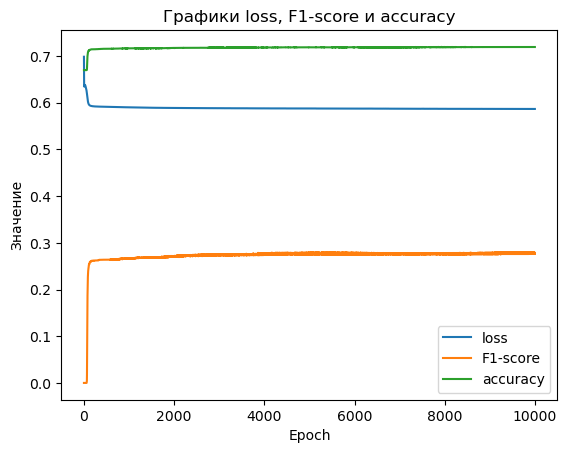

In [114]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf5['Epoch'], diagdf5['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf5['Epoch'], diagdf5['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf5['Epoch'], diagdf5['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [115]:
pred_test6=Mk6.forward(x_test.float())
pred_test_binarized6 = (pred_test6 > 0.5).float()

In [116]:
print(classification_report(y_test.to('cpu'), pred_test_binarized6.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.67      0.88      0.76      3216
         1.0       0.29      0.10      0.15      1542

    accuracy                           0.63      4758
   macro avg       0.48      0.49      0.45      4758
weighted avg       0.55      0.63      0.56      4758



In [117]:
#----------------------------------------------

<font color='red'>Experiment_#7</font>

<font color='red'>layers - 2, epochs: 10000, lr: 0.001</font>

In [118]:
#----------------------------------------------

In [119]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK7(nn.Module): #изменить название
    def __init__(self, input_size, output_size):
        super(MLP_MK7, self).__init__()
        self.fc1 = nn.Linear(input_size, output_size)
#         self.relu = nn.ReLU()
#         self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
#         self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
#         self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
#         out = self.relu(out)
#         out = self.fc2(out)
        out = self.sigmoid(out)
#         out = self.fc3(out)
#         out = self.tanh(out)
        return out

In [120]:
Mk7=MLP_MK7(1000,1) #изменить название переменной

In [121]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [122]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [123]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [124]:
Mk7=Mk7.to(dev)

In [125]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk7.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf6=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(10000):
    optimizer.zero_grad()
    pred = Mk7.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf6 = pd.concat([diagdf6, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.8101835250854492   f1-score: 0.49640873074531555   accuracy: 0.3304504454135895
Epoch:  2 , Loss:  0.8101029396057129   f1-score: 0.4965433180332184   accuracy: 0.3308108150959015
Epoch:  3 , Loss:  0.8100222945213318   f1-score: 0.49660971760749817   accuracy: 0.3311711847782135
Epoch:  4 , Loss:  0.8099415302276611   f1-score: 0.4968775510787964   accuracy: 0.33225226402282715
Epoch:  5 , Loss:  0.8098608255386353   f1-score: 0.49717745184898376   accuracy: 0.33396396040916443
Epoch:  6 , Loss:  0.8097803592681885   f1-score: 0.4979897737503052   accuracy: 0.33630630373954773
Epoch:  7 , Loss:  0.8096996545791626   f1-score: 0.4986335039138794   accuracy: 0.33891892433166504
Epoch:  8 , Loss:  0.8096190690994263   f1-score: 0.4991084933280945   accuracy: 0.34198197722435
Epoch:  9 , Loss:  0.8095384836196899   f1-score: 0.49865803122520447   accuracy: 0.34369370341300964
Epoch:  10 , Loss:  0.8094578981399536   f1-score: 0.4986513555049896   accuracy: 0.346936941

Epoch:  88 , Loss:  0.8032470345497131   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  89 , Loss:  0.8031684756278992   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  90 , Loss:  0.8030898571014404   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  91 , Loss:  0.803011417388916   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  92 , Loss:  0.802932858467102   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  93 , Loss:  0.8028544783592224   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  94 , Loss:  0.8027760982513428   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  95 , Loss:  0.8026975989341736   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  96 , Loss:  0.8026193380355835   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  97 , Loss:  0.8025409579277039   f1-score: 0.00814774539321661   ac

Epoch:  175 , Loss:  0.7965285778045654   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  176 , Loss:  0.7964528203010559   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  177 , Loss:  0.7963770627975464   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  178 , Loss:  0.7963013052940369   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  179 , Loss:  0.7962255477905273   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  180 , Loss:  0.7961500883102417   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  181 , Loss:  0.796074390411377   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  182 , Loss:  0.7959989309310913   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  183 , Loss:  0.7959233522415161   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  184 , Loss:  0.7958479523658752   f1-score: 0.00543921673

Epoch:  292 , Loss:  0.7879123091697693   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  293 , Loss:  0.7878408432006836   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  294 , Loss:  0.7877694964408875   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  295 , Loss:  0.7876982092857361   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  296 , Loss:  0.7876268625259399   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  297 , Loss:  0.7875558137893677   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  298 , Loss:  0.7874847054481506   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  299 , Loss:  0.787413477897644   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  300 , Loss:  0.7873424291610718   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  301 , Loss:  0.7872713804244995   f1-score: 0.00435374164

Epoch:  380 , Loss:  0.7817879915237427   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  381 , Loss:  0.7817203402519226   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  382 , Loss:  0.7816526293754578   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  383 , Loss:  0.7815848588943481   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  384 , Loss:  0.7815173268318176   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  385 , Loss:  0.7814497351646423   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  386 , Loss:  0.781382143497467   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  387 , Loss:  0.7813147902488708   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  388 , Loss:  0.7812473177909851   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  389 , Loss:  0.7811799049377441   f1-score: 0.00

Epoch:  462 , Loss:  0.7763761878013611   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  463 , Loss:  0.7763120532035828   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  464 , Loss:  0.7762479186058044   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  465 , Loss:  0.7761836647987366   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  466 , Loss:  0.7761196494102478   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  467 , Loss:  0.7760555744171143   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  468 , Loss:  0.7759917378425598   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  469 , Loss:  0.7759276628494263   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  470 , Loss:  0.775863766670227   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  471 , Loss:  0.7757999300956726   f1-score: 0.00

Epoch:  546 , Loss:  0.7711359858512878   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  547 , Loss:  0.7710754871368408   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  548 , Loss:  0.771014928817749   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  549 , Loss:  0.7709546089172363   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  550 , Loss:  0.7708942294120789   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  551 , Loss:  0.7708339095115662   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  552 , Loss:  0.7707734107971191   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  553 , Loss:  0.7707132697105408   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  554 , Loss:  0.7706530690193176   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  555 , Loss:  0.7705929279327393   f1-score: 0.00

Epoch:  628 , Loss:  0.7663186192512512   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  629 , Loss:  0.7662618160247803   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  630 , Loss:  0.7662048935890198   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  631 , Loss:  0.7661479711532593   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  632 , Loss:  0.7660911083221436   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  633 , Loss:  0.7660344839096069   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  634 , Loss:  0.7659777402877808   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  635 , Loss:  0.7659210562705994   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  636 , Loss:  0.7658644914627075   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  637 , Loss:  0.7658077478408813   f1-score: 0.0

Epoch:  714 , Loss:  0.7615792155265808   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  715 , Loss:  0.7615259289741516   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  716 , Loss:  0.7614727020263672   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  717 , Loss:  0.7614195346832275   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  718 , Loss:  0.7613664865493774   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  719 , Loss:  0.7613133788108826   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  720 , Loss:  0.7612603306770325   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  721 , Loss:  0.7612072825431824   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  722 , Loss:  0.761154294013977   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  723 , Loss:  0.7611013054847717   f1-score: 0.00

Epoch:  797 , Loss:  0.7573006749153137   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  798 , Loss:  0.7572508454322815   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  799 , Loss:  0.7572009563446045   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  800 , Loss:  0.7571512460708618   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  801 , Loss:  0.7571015357971191   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  802 , Loss:  0.7570518255233765   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  803 , Loss:  0.7570022940635681   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  804 , Loss:  0.7569527626037598   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  805 , Loss:  0.7569032311439514   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  806 , Loss:  0.7568536400794983   f1-score: 0.0

Epoch:  876 , Loss:  0.7534881234169006   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  877 , Loss:  0.7534413933753967   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  878 , Loss:  0.7533947825431824   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  879 , Loss:  0.7533480525016785   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  880 , Loss:  0.7533015012741089   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  881 , Loss:  0.7532549500465393   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  882 , Loss:  0.7532083988189697   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  883 , Loss:  0.7531619668006897   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  884 , Loss:  0.753115713596344   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  885 , Loss:  0.7530692219734192   f1-score: 0.00435374164

Epoch:  959 , Loss:  0.7497429251670837   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  960 , Loss:  0.7496992945671082   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  961 , Loss:  0.7496558427810669   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  962 , Loss:  0.7496123909950256   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  963 , Loss:  0.7495689392089844   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  964 , Loss:  0.7495254874229431   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  965 , Loss:  0.7494821548461914   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  966 , Loss:  0.7494388222694397   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  967 , Loss:  0.749395489692688   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  968 , Loss:  0.7493523359298706   f1-score: 0.00435374164

Epoch:  1038 , Loss:  0.7464134693145752   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1039 , Loss:  0.746372640132904   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1040 , Loss:  0.7463319897651672   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1041 , Loss:  0.74629145860672   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1042 , Loss:  0.7462507486343384   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1043 , Loss:  0.7462100982666016   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1044 , Loss:  0.7461696267127991   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1045 , Loss:  0.7461289763450623   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1046 , Loss:  0.7460885047912598   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1047 , Loss:  0.7460480332374573   f1-score: 0.004

Epoch:  1125 , Loss:  0.7429963946342468   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1126 , Loss:  0.7429585456848145   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1127 , Loss:  0.7429209351539612   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1128 , Loss:  0.7428830862045288   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1129 , Loss:  0.7428452372550964   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1130 , Loss:  0.7428076863288879   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1131 , Loss:  0.7427699565887451   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1132 , Loss:  0.7427324652671814   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1133 , Loss:  0.7426947951316833   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1134 , Loss:  0.7426573038101196   f1-score: 0.

Epoch:  1206 , Loss:  0.7400354146957397   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1207 , Loss:  0.7400001883506775   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1208 , Loss:  0.7399648427963257   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1209 , Loss:  0.7399296164512634   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1210 , Loss:  0.739894449710846   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1211 , Loss:  0.7398593425750732   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1212 , Loss:  0.7398241758346558   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1213 , Loss:  0.7397890686988831   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1214 , Loss:  0.7397539615631104   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1215 , Loss:  0.739719033241272   f1-score: 0.00

Epoch:  1289 , Loss:  0.7372066974639893   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1290 , Loss:  0.737173855304718   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1291 , Loss:  0.7371410131454468   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1292 , Loss:  0.7371082305908203   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1293 , Loss:  0.7370753884315491   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1294 , Loss:  0.7370426058769226   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1295 , Loss:  0.7370098829269409   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1296 , Loss:  0.736977219581604   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1297 , Loss:  0.7369444370269775   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1298 , Loss:  0.7369118928909302   f1-score: 0.00

Epoch:  1368 , Loss:  0.7346941232681274   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1369 , Loss:  0.7346634864807129   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1370 , Loss:  0.7346327304840088   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1371 , Loss:  0.7346020340919495   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1372 , Loss:  0.7345713973045349   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1373 , Loss:  0.7345407009124756   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1374 , Loss:  0.7345101237297058   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1375 , Loss:  0.7344796061515808   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1376 , Loss:  0.734449028968811   f1-score: 0.004896626807749271   accuracy: 0.6704504489898682
Epoch:  1377 , Loss:  0.7344185709953308   f1-score: 0.0

Epoch:  1452 , Loss:  0.7322012186050415   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1453 , Loss:  0.7321726679801941   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1454 , Loss:  0.7321439385414124   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1455 , Loss:  0.7321153879165649   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1456 , Loss:  0.7320868372917175   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1457 , Loss:  0.7320582866668701   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1458 , Loss:  0.7320297956466675   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1459 , Loss:  0.7320013642311096   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1460 , Loss:  0.731972873210907   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1461 , Loss:  0.7319444417953491   f1-score: 0.0

Epoch:  1536 , Loss:  0.7298787236213684   f1-score: 0.005981511902064085   accuracy: 0.6706306338310242
Epoch:  1537 , Loss:  0.7298520803451538   f1-score: 0.005981511902064085   accuracy: 0.6706306338310242
Epoch:  1538 , Loss:  0.7298253774642944   f1-score: 0.005981511902064085   accuracy: 0.6706306338310242
Epoch:  1539 , Loss:  0.7297987937927246   f1-score: 0.005981511902064085   accuracy: 0.6706306338310242
Epoch:  1540 , Loss:  0.7297722101211548   f1-score: 0.005981511902064085   accuracy: 0.6706306338310242
Epoch:  1541 , Loss:  0.7297455668449402   f1-score: 0.005981511902064085   accuracy: 0.6706306338310242
Epoch:  1542 , Loss:  0.7297190427780151   f1-score: 0.005981511902064085   accuracy: 0.6706306338310242
Epoch:  1543 , Loss:  0.7296924591064453   f1-score: 0.005981511902064085   accuracy: 0.6706306338310242
Epoch:  1544 , Loss:  0.7296659350395203   f1-score: 0.005981511902064085   accuracy: 0.6706306338310242
Epoch:  1545 , Loss:  0.7296394109725952   f1-score: 0.

Epoch:  1618 , Loss:  0.7277635931968689   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1619 , Loss:  0.7277386784553528   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1620 , Loss:  0.7277137637138367   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1621 , Loss:  0.7276889085769653   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1622 , Loss:  0.7276639938354492   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1623 , Loss:  0.7276393175125122   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1624 , Loss:  0.7276144027709961   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1625 , Loss:  0.7275896072387695   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1626 , Loss:  0.7275648713111877   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1627 , Loss:  0.7275400757789612   f1-score: 0.

Epoch:  1702 , Loss:  0.7257405519485474   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1703 , Loss:  0.7257173657417297   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1704 , Loss:  0.7256941795349121   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1705 , Loss:  0.7256709337234497   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1706 , Loss:  0.7256477475166321   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1707 , Loss:  0.7256245613098145   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1708 , Loss:  0.7256014347076416   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1709 , Loss:  0.7255783081054688   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1710 , Loss:  0.7255551218986511   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1711 , Loss:  0.7255319952964783   f1-score: 0.

Epoch:  1782 , Loss:  0.723939061164856   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1783 , Loss:  0.7239172458648682   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1784 , Loss:  0.7238954901695251   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1785 , Loss:  0.7238737344741821   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1786 , Loss:  0.7238519787788391   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1787 , Loss:  0.7238302826881409   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1788 , Loss:  0.7238085865974426   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1789 , Loss:  0.7237868905067444   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1790 , Loss:  0.7237652540206909   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1791 , Loss:  0.7237436175346375   f1-score: 0.0

Epoch:  1890 , Loss:  0.7216841578483582   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1891 , Loss:  0.7216641902923584   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1892 , Loss:  0.7216442227363586   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1893 , Loss:  0.7216242551803589   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1894 , Loss:  0.7216043472290039   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1895 , Loss:  0.7215843796730042   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1896 , Loss:  0.721564531326294   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1897 , Loss:  0.721544623374939   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1898 , Loss:  0.7215247750282288   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1899 , Loss:  0.7215048670768738   f1-score: 0.00

Epoch:  1974 , Loss:  0.7200594544410706   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1975 , Loss:  0.7200407385826111   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1976 , Loss:  0.7200220227241516   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1977 , Loss:  0.7200034260749817   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1978 , Loss:  0.7199846506118774   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1979 , Loss:  0.7199660539627075   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1980 , Loss:  0.719947338104248   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1981 , Loss:  0.7199288606643677   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1982 , Loss:  0.719910204410553   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  1983 , Loss:  0.7198916077613831   f1-score: 0.00

Epoch:  2059 , Loss:  0.71852046251297   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2060 , Loss:  0.7185029983520508   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2061 , Loss:  0.7184854745864868   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2062 , Loss:  0.7184679508209229   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2063 , Loss:  0.7184505462646484   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2064 , Loss:  0.7184330224990845   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2065 , Loss:  0.7184156775474548   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2066 , Loss:  0.7183980941772461   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2067 , Loss:  0.7183807492256165   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2068 , Loss:  0.718363344669342   f1-score: 0.007

Epoch:  2140 , Loss:  0.7171449065208435   f1-score: 0.00814774539321661   accuracy: 0.6709910035133362
Epoch:  2141 , Loss:  0.717128336429596   f1-score: 0.00814774539321661   accuracy: 0.6709910035133362
Epoch:  2142 , Loss:  0.7171118855476379   f1-score: 0.00814774539321661   accuracy: 0.6709910035133362
Epoch:  2143 , Loss:  0.7170954942703247   f1-score: 0.00814774539321661   accuracy: 0.6709910035133362
Epoch:  2144 , Loss:  0.7170791029930115   f1-score: 0.00814774539321661   accuracy: 0.6709910035133362
Epoch:  2145 , Loss:  0.7170626521110535   f1-score: 0.00814774539321661   accuracy: 0.6709910035133362
Epoch:  2146 , Loss:  0.7170462608337402   f1-score: 0.00814774539321661   accuracy: 0.6709910035133362
Epoch:  2147 , Loss:  0.7170299291610718   f1-score: 0.00814774539321661   accuracy: 0.6709910035133362
Epoch:  2148 , Loss:  0.7170134782791138   f1-score: 0.00814774539321661   accuracy: 0.6709910035133362
Epoch:  2149 , Loss:  0.7169971466064453   f1-score: 0.0081477453

Epoch:  2222 , Loss:  0.7158357501029968   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  2223 , Loss:  0.7158202528953552   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  2224 , Loss:  0.7158048748970032   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  2225 , Loss:  0.7157893776893616   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  2226 , Loss:  0.7157739400863647   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  2227 , Loss:  0.7157585024833679   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  2228 , Loss:  0.7157430648803711   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  2229 , Loss:  0.715727686882019   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  2230 , Loss:  0.715712308883667   f1-score: 0.008688569068908691   accuracy: 0.6710810661315918
Epoch:  2231 , Loss:  0.7156968712806702   f1-score: 0.00

Epoch:  2307 , Loss:  0.7145607471466064   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2308 , Loss:  0.7145463228225708   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2309 , Loss:  0.7145317196846008   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2310 , Loss:  0.7145171761512756   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2311 , Loss:  0.7145026922225952   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2312 , Loss:  0.7144882678985596   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2313 , Loss:  0.7144737243652344   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2314 , Loss:  0.7144593596458435   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2315 , Loss:  0.7144448757171631   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2316 , Loss:  0.7144304513931274   f1-score: 0.

Epoch:  2388 , Loss:  0.7134178280830383   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2389 , Loss:  0.7134041786193848   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2390 , Loss:  0.7133904695510864   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2391 , Loss:  0.7133768200874329   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2392 , Loss:  0.713362991809845   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2393 , Loss:  0.713349461555481   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2394 , Loss:  0.7133357524871826   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2395 , Loss:  0.7133221626281738   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2396 , Loss:  0.7133085131645203   f1-score: 0.009229098446667194   accuracy: 0.6711711883544922
Epoch:  2397 , Loss:  0.7132949233055115   f1-score: 0.00

Epoch:  2469 , Loss:  0.7123398780822754   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2470 , Loss:  0.7123270630836487   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2471 , Loss:  0.7123140692710876   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2472 , Loss:  0.7123011946678162   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2473 , Loss:  0.7122882604598999   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2474 , Loss:  0.7122753858566284   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2475 , Loss:  0.7122625112533569   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2476 , Loss:  0.7122496962547302   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2477 , Loss:  0.712236762046814   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2478 , Loss:  0.7122239470481873   f1-score: 0.0

Epoch:  2551 , Loss:  0.7113102078437805   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2552 , Loss:  0.7112980484962463   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2553 , Loss:  0.7112858295440674   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2554 , Loss:  0.7112736105918884   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2555 , Loss:  0.7112613916397095   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2556 , Loss:  0.7112492918968201   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2557 , Loss:  0.7112371921539307   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2558 , Loss:  0.7112249135971069   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2559 , Loss:  0.7112128138542175   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2560 , Loss:  0.7112007737159729   f1-score: 0.

Epoch:  2661 , Loss:  0.710018515586853   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2662 , Loss:  0.7100071907043457   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2663 , Loss:  0.7099958062171936   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2664 , Loss:  0.709984540939331   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2665 , Loss:  0.7099732756614685   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2666 , Loss:  0.7099620699882507   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2667 , Loss:  0.7099508047103882   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2668 , Loss:  0.7099395990371704   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2669 , Loss:  0.7099282741546631   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2670 , Loss:  0.7099170684814453   f1-score: 0.00

Epoch:  2745 , Loss:  0.7090957760810852   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2746 , Loss:  0.7090851068496704   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2747 , Loss:  0.7090744972229004   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2748 , Loss:  0.7090638279914856   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2749 , Loss:  0.7090530395507812   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2750 , Loss:  0.7090425491333008   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2751 , Loss:  0.709031879901886   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2752 , Loss:  0.709021270275116   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2753 , Loss:  0.7090106010437012   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2754 , Loss:  0.7089999914169312   f1-score: 0.00

Epoch:  2827 , Loss:  0.7082441449165344   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2828 , Loss:  0.7082340121269226   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2829 , Loss:  0.7082239389419556   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2830 , Loss:  0.7082138657569885   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2831 , Loss:  0.7082037329673767   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2832 , Loss:  0.7081936597824097   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2833 , Loss:  0.7081837058067322   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2834 , Loss:  0.7081735730171204   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2835 , Loss:  0.7081635594367981   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2836 , Loss:  0.7081534266471863   f1-score: 0.

Epoch:  2906 , Loss:  0.7074663043022156   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2907 , Loss:  0.7074567079544067   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2908 , Loss:  0.7074471712112427   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2909 , Loss:  0.7074375748634338   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2910 , Loss:  0.7074280381202698   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2911 , Loss:  0.7074185013771057   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2912 , Loss:  0.7074088454246521   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2913 , Loss:  0.7073993682861328   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2914 , Loss:  0.7073898911476135   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2915 , Loss:  0.7073802947998047   f1-score: 0.

Epoch:  2989 , Loss:  0.7066913843154907   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2990 , Loss:  0.7066823244094849   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2991 , Loss:  0.7066732048988342   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2992 , Loss:  0.7066641449928284   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2993 , Loss:  0.7066550850868225   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2994 , Loss:  0.7066459655761719   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2995 , Loss:  0.706636905670166   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2996 , Loss:  0.7066279053688049   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2997 , Loss:  0.7066188454627991   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2998 , Loss:  0.7066097855567932   f1-score: 0.0

Epoch:  3069 , Loss:  0.7059824466705322   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3070 , Loss:  0.7059738636016846   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3071 , Loss:  0.7059652209281921   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3072 , Loss:  0.7059566378593445   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3073 , Loss:  0.7059480547904968   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3074 , Loss:  0.7059393525123596   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3075 , Loss:  0.705930769443512   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3076 , Loss:  0.7059221863746643   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3077 , Loss:  0.7059136033058167   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3078 , Loss:  0.705905020236969   f1-score: 0.01

Epoch:  3151 , Loss:  0.7052923440933228   f1-score: 0.010845987126231194   accuracy: 0.6713513731956482
Epoch:  3152 , Loss:  0.7052841186523438   f1-score: 0.010845987126231194   accuracy: 0.6713513731956482
Epoch:  3153 , Loss:  0.70527583360672   f1-score: 0.010845987126231194   accuracy: 0.6713513731956482
Epoch:  3154 , Loss:  0.7052676677703857   f1-score: 0.010845987126231194   accuracy: 0.6713513731956482
Epoch:  3155 , Loss:  0.7052594423294067   f1-score: 0.010845987126231194   accuracy: 0.6713513731956482
Epoch:  3156 , Loss:  0.7052513957023621   f1-score: 0.010845987126231194   accuracy: 0.6713513731956482
Epoch:  3157 , Loss:  0.7052431702613831   f1-score: 0.010845987126231194   accuracy: 0.6713513731956482
Epoch:  3158 , Loss:  0.7052350044250488   f1-score: 0.010845987126231194   accuracy: 0.6713513731956482
Epoch:  3159 , Loss:  0.7052267789840698   f1-score: 0.010845987126231194   accuracy: 0.6713513731956482
Epoch:  3160 , Loss:  0.7052186727523804   f1-score: 0.01

Epoch:  3231 , Loss:  0.7046520709991455   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3232 , Loss:  0.7046443223953247   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3233 , Loss:  0.7046365141868591   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3234 , Loss:  0.7046287655830383   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3235 , Loss:  0.7046209573745728   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3236 , Loss:  0.7046131491661072   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3237 , Loss:  0.7046053409576416   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3238 , Loss:  0.7045975923538208   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3239 , Loss:  0.7045897841453552   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3240 , Loss:  0.7045820951461792   f1-score: 0.

Epoch:  3310 , Loss:  0.7040500044822693   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3311 , Loss:  0.7040426135063171   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3312 , Loss:  0.704035222530365   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3313 , Loss:  0.7040277719497681   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3314 , Loss:  0.7040203213691711   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3315 , Loss:  0.7040128707885742   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3316 , Loss:  0.7040054798126221   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3317 , Loss:  0.7039980888366699   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3318 , Loss:  0.7039906978607178   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3319 , Loss:  0.7039833068847656   f1-score: 0.0

Epoch:  3419 , Loss:  0.7032651901245117   f1-score: 0.01300108339637518   accuracy: 0.6717116832733154
Epoch:  3420 , Loss:  0.7032581567764282   f1-score: 0.01300108339637518   accuracy: 0.6717116832733154
Epoch:  3421 , Loss:  0.7032512426376343   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3422 , Loss:  0.7032442092895508   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3423 , Loss:  0.7032372951507568   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3424 , Loss:  0.7032304406166077   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3425 , Loss:  0.7032234072685242   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3426 , Loss:  0.7032164931297302   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3427 , Loss:  0.7032095193862915   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3428 , Loss:  0.7032025456428528   f1-score: 0.01

Epoch:  3533 , Loss:  0.7024966478347778   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3534 , Loss:  0.7024902701377869   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3535 , Loss:  0.7024837136268616   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3536 , Loss:  0.7024771571159363   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3537 , Loss:  0.7024707198143005   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3538 , Loss:  0.70246422290802   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3539 , Loss:  0.7024576663970947   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3540 , Loss:  0.7024511694908142   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3541 , Loss:  0.7024447321891785   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3542 , Loss:  0.702438235282898   f1-score: 0.014

Epoch:  3615 , Loss:  0.7019747495651245   f1-score: 0.01515151560306549   accuracy: 0.6720720529556274
Epoch:  3616 , Loss:  0.7019685506820679   f1-score: 0.01515151560306549   accuracy: 0.6720720529556274
Epoch:  3617 , Loss:  0.7019622921943665   f1-score: 0.01515151560306549   accuracy: 0.6720720529556274
Epoch:  3618 , Loss:  0.7019561529159546   f1-score: 0.01515151560306549   accuracy: 0.6720720529556274
Epoch:  3619 , Loss:  0.7019498944282532   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3620 , Loss:  0.7019436359405518   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3621 , Loss:  0.7019374966621399   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3622 , Loss:  0.7019312977790833   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3623 , Loss:  0.7019251585006714   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3624 , Loss:  0.70191890001297   f1-score: 0.015688

Epoch:  3695 , Loss:  0.7014884948730469   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3696 , Loss:  0.7014825344085693   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3697 , Loss:  0.7014766335487366   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3698 , Loss:  0.701470673084259   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3699 , Loss:  0.7014647722244263   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3700 , Loss:  0.7014588117599487   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3701 , Loss:  0.701452910900116   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3702 , Loss:  0.7014470100402832   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3703 , Loss:  0.7014409899711609   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3704 , Loss:  0.7014351487159729   f1-score: 0.01

Epoch:  3811 , Loss:  0.7008212208747864   f1-score: 0.01783301867544651   accuracy: 0.6725225448608398
Epoch:  3812 , Loss:  0.7008155584335327   f1-score: 0.01783301867544651   accuracy: 0.6725225448608398
Epoch:  3813 , Loss:  0.7008100152015686   f1-score: 0.01783301867544651   accuracy: 0.6725225448608398
Epoch:  3814 , Loss:  0.7008044719696045   f1-score: 0.01783301867544651   accuracy: 0.6725225448608398
Epoch:  3815 , Loss:  0.7007989287376404   f1-score: 0.01783301867544651   accuracy: 0.6725225448608398
Epoch:  3816 , Loss:  0.7007933855056763   f1-score: 0.01783301867544651   accuracy: 0.6725225448608398
Epoch:  3817 , Loss:  0.7007878422737122   f1-score: 0.01783301867544651   accuracy: 0.6725225448608398
Epoch:  3818 , Loss:  0.700782299041748   f1-score: 0.01783301867544651   accuracy: 0.6725225448608398
Epoch:  3819 , Loss:  0.7007767558097839   f1-score: 0.01783301867544651   accuracy: 0.6725225448608398
Epoch:  3820 , Loss:  0.7007712125778198   f1-score: 0.0178330186

Epoch:  3927 , Loss:  0.7001952528953552   f1-score: 0.018903592601418495   accuracy: 0.6727027297019958
Epoch:  3928 , Loss:  0.7001900672912598   f1-score: 0.018903592601418495   accuracy: 0.6727027297019958
Epoch:  3929 , Loss:  0.7001848220825195   f1-score: 0.018903592601418495   accuracy: 0.6727027297019958
Epoch:  3930 , Loss:  0.7001795768737793   f1-score: 0.018903592601418495   accuracy: 0.6727027297019958
Epoch:  3931 , Loss:  0.7001743912696838   f1-score: 0.018903592601418495   accuracy: 0.6727027297019958
Epoch:  3932 , Loss:  0.7001691460609436   f1-score: 0.018903592601418495   accuracy: 0.6727027297019958
Epoch:  3933 , Loss:  0.7001640200614929   f1-score: 0.018903592601418495   accuracy: 0.6727027297019958
Epoch:  3934 , Loss:  0.7001587152481079   f1-score: 0.018903592601418495   accuracy: 0.6727027297019958
Epoch:  3935 , Loss:  0.7001535296440125   f1-score: 0.018903592601418495   accuracy: 0.6727027297019958
Epoch:  3936 , Loss:  0.7001484632492065   f1-score: 0.

Epoch:  4039 , Loss:  0.699627161026001   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4040 , Loss:  0.6996221542358398   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4041 , Loss:  0.6996172666549683   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4042 , Loss:  0.6996123194694519   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4043 , Loss:  0.6996074318885803   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4044 , Loss:  0.6996025443077087   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4045 , Loss:  0.6995976567268372   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4046 , Loss:  0.6995927691459656   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4047 , Loss:  0.6995878219604492   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4048 , Loss:  0.6995829343795776   f1-score: 0.0

Epoch:  4118 , Loss:  0.6992462277412415   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4119 , Loss:  0.6992414593696594   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4120 , Loss:  0.6992368102073669   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4121 , Loss:  0.6992320418357849   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4122 , Loss:  0.6992273926734924   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4123 , Loss:  0.6992226243019104   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4124 , Loss:  0.6992179155349731   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4125 , Loss:  0.6992132067680359   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4126 , Loss:  0.6992084980010986   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4127 , Loss:  0.6992037892341614   f1-score: 0.

Epoch:  4231 , Loss:  0.6987279057502747   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4232 , Loss:  0.6987234354019165   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4233 , Loss:  0.6987190246582031   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4234 , Loss:  0.698714554309845   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4235 , Loss:  0.6987102031707764   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4236 , Loss:  0.6987057328224182   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4237 , Loss:  0.6987012624740601   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4238 , Loss:  0.6986968517303467   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4239 , Loss:  0.6986923813819885   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4240 , Loss:  0.6986879110336304   f1-score: 0.0

Epoch:  4310 , Loss:  0.6983830332756042   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4311 , Loss:  0.6983787417411804   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4312 , Loss:  0.6983745098114014   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4313 , Loss:  0.6983702778816223   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4314 , Loss:  0.6983659267425537   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4315 , Loss:  0.6983616948127747   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4316 , Loss:  0.6983574628829956   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4317 , Loss:  0.6983531713485718   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4318 , Loss:  0.6983489394187927   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4319 , Loss:  0.6983447074890137   f1-score: 0.

Epoch:  4391 , Loss:  0.6980434656143188   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4392 , Loss:  0.6980393528938293   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4393 , Loss:  0.6980352401733398   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4394 , Loss:  0.6980311274528503   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4395 , Loss:  0.6980270147323608   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4396 , Loss:  0.6980229616165161   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4397 , Loss:  0.6980188488960266   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4398 , Loss:  0.6980147957801819   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4399 , Loss:  0.6980106234550476   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4400 , Loss:  0.6980065703392029   f1-score: 0.

Epoch:  4507 , Loss:  0.6975802779197693   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4508 , Loss:  0.6975764036178589   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4509 , Loss:  0.6975725889205933   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4510 , Loss:  0.6975686550140381   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4511 , Loss:  0.6975647807121277   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4512 , Loss:  0.6975609660148621   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4513 , Loss:  0.6975570917129517   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4514 , Loss:  0.6975531578063965   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4515 , Loss:  0.6975493431091309   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4516 , Loss:  0.6975455284118652   f1-score: 0.

Epoch:  4622 , Loss:  0.6971464157104492   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4623 , Loss:  0.6971426606178284   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4624 , Loss:  0.6971390247344971   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4625 , Loss:  0.697135329246521   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4626 , Loss:  0.6971316337585449   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4627 , Loss:  0.6971279382705688   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4628 , Loss:  0.6971244215965271   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4629 , Loss:  0.6971206665039062   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4630 , Loss:  0.697117030620575   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4631 , Loss:  0.6971133351325989   f1-score: 0.02

Epoch:  4736 , Loss:  0.6967390775680542   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4737 , Loss:  0.6967355012893677   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4738 , Loss:  0.6967320442199707   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4739 , Loss:  0.6967286467552185   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4740 , Loss:  0.6967252492904663   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4741 , Loss:  0.6967217326164246   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4742 , Loss:  0.6967182159423828   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4743 , Loss:  0.6967148184776306   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4744 , Loss:  0.6967113614082336   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4745 , Loss:  0.6967077851295471   f1-score: 0.

Epoch:  4850 , Loss:  0.696353018283844   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4851 , Loss:  0.6963497400283813   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4852 , Loss:  0.6963464617729187   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4853 , Loss:  0.6963431239128113   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4854 , Loss:  0.6963398456573486   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4855 , Loss:  0.6963365077972412   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4856 , Loss:  0.6963333487510681   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4857 , Loss:  0.6963300108909607   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4858 , Loss:  0.696326732635498   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4859 , Loss:  0.6963233947753906   f1-score: 0.02

Epoch:  4956 , Loss:  0.6960117816925049   f1-score: 0.026888947933912277   accuracy: 0.6739639639854431
Epoch:  4957 , Loss:  0.6960086822509766   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  4958 , Loss:  0.6960055232048035   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  4959 , Loss:  0.6960023045539856   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  4960 , Loss:  0.6959991455078125   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  4961 , Loss:  0.695996105670929   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  4962 , Loss:  0.6959929466247559   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  4963 , Loss:  0.6959898471832275   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  4964 , Loss:  0.6959866881370544   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  4965 , Loss:  0.6959835886955261   f1-score: 0.0

Epoch:  5036 , Loss:  0.6957648396492004   f1-score: 0.02794947661459446   accuracy: 0.6741441488265991
Epoch:  5037 , Loss:  0.6957617998123169   f1-score: 0.02794947661459446   accuracy: 0.6741441488265991
Epoch:  5038 , Loss:  0.6957588195800781   f1-score: 0.02794947661459446   accuracy: 0.6741441488265991
Epoch:  5039 , Loss:  0.6957557797431946   f1-score: 0.02794947661459446   accuracy: 0.6741441488265991
Epoch:  5040 , Loss:  0.695752739906311   f1-score: 0.02794947661459446   accuracy: 0.6741441488265991
Epoch:  5041 , Loss:  0.6957497000694275   f1-score: 0.02794947661459446   accuracy: 0.6741441488265991
Epoch:  5042 , Loss:  0.6957466006278992   f1-score: 0.02794947661459446   accuracy: 0.6741441488265991
Epoch:  5043 , Loss:  0.6957436800003052   f1-score: 0.02794947661459446   accuracy: 0.6741441488265991
Epoch:  5044 , Loss:  0.6957406401634216   f1-score: 0.02794947661459446   accuracy: 0.6741441488265991
Epoch:  5045 , Loss:  0.6957376003265381   f1-score: 0.0279494766

Epoch:  5143 , Loss:  0.6954479217529297   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5144 , Loss:  0.6954451203346252   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5145 , Loss:  0.6954420804977417   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5146 , Loss:  0.6954392790794373   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5147 , Loss:  0.695436418056488   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5148 , Loss:  0.695433497428894   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5149 , Loss:  0.6954305768013   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5150 , Loss:  0.6954277157783508   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5151 , Loss:  0.6954248547554016   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5152 , Loss:  0.6954219341278076   f1-score: 0.02900

Epoch:  5259 , Loss:  0.6951207518577576   f1-score: 0.030067114159464836   accuracy: 0.6745045185089111
Epoch:  5260 , Loss:  0.6951180100440979   f1-score: 0.030067114159464836   accuracy: 0.6745045185089111
Epoch:  5261 , Loss:  0.6951152086257935   f1-score: 0.030067114159464836   accuracy: 0.6745045185089111
Epoch:  5262 , Loss:  0.6951124668121338   f1-score: 0.030067114159464836   accuracy: 0.6745045185089111
Epoch:  5263 , Loss:  0.6951097249984741   f1-score: 0.030067114159464836   accuracy: 0.6745045185089111
Epoch:  5264 , Loss:  0.6951070427894592   f1-score: 0.030067114159464836   accuracy: 0.6745045185089111
Epoch:  5265 , Loss:  0.6951042413711548   f1-score: 0.030067114159464836   accuracy: 0.6745045185089111
Epoch:  5266 , Loss:  0.6951014399528503   f1-score: 0.030067114159464836   accuracy: 0.6745045185089111
Epoch:  5267 , Loss:  0.6950987577438354   f1-score: 0.030067114159464836   accuracy: 0.6745045185089111
Epoch:  5268 , Loss:  0.6950960159301758   f1-score: 0.

Epoch:  5374 , Loss:  0.6948119401931763   f1-score: 0.03270777314901352   accuracy: 0.6749549508094788
Epoch:  5375 , Loss:  0.6948092579841614   f1-score: 0.03270777314901352   accuracy: 0.6749549508094788
Epoch:  5376 , Loss:  0.6948066353797913   f1-score: 0.03270777314901352   accuracy: 0.6749549508094788
Epoch:  5377 , Loss:  0.6948040127754211   f1-score: 0.03270777314901352   accuracy: 0.6749549508094788
Epoch:  5378 , Loss:  0.6948014497756958   f1-score: 0.03270777314901352   accuracy: 0.6749549508094788
Epoch:  5379 , Loss:  0.6947988271713257   f1-score: 0.03270777314901352   accuracy: 0.6749549508094788
Epoch:  5380 , Loss:  0.6947961449623108   f1-score: 0.03270777314901352   accuracy: 0.6749549508094788
Epoch:  5381 , Loss:  0.6947935819625854   f1-score: 0.03270777314901352   accuracy: 0.6749549508094788
Epoch:  5382 , Loss:  0.6947908997535706   f1-score: 0.03270777314901352   accuracy: 0.6749549508094788
Epoch:  5383 , Loss:  0.6947883367538452   f1-score: 0.032707773

Epoch:  5453 , Loss:  0.6946081519126892   f1-score: 0.03376205638051033   accuracy: 0.6751351356506348
Epoch:  5454 , Loss:  0.6946056485176086   f1-score: 0.03376205638051033   accuracy: 0.6751351356506348
Epoch:  5455 , Loss:  0.6946031451225281   f1-score: 0.03376205638051033   accuracy: 0.6751351356506348
Epoch:  5456 , Loss:  0.694600522518158   f1-score: 0.03376205638051033   accuracy: 0.6751351356506348
Epoch:  5457 , Loss:  0.6945979595184326   f1-score: 0.03376205638051033   accuracy: 0.6751351356506348
Epoch:  5458 , Loss:  0.6945955157279968   f1-score: 0.03376205638051033   accuracy: 0.6751351356506348
Epoch:  5459 , Loss:  0.6945930123329163   f1-score: 0.03376205638051033   accuracy: 0.6751351356506348
Epoch:  5460 , Loss:  0.6945904493331909   f1-score: 0.03376205638051033   accuracy: 0.6751351356506348
Epoch:  5461 , Loss:  0.6945879459381104   f1-score: 0.03376205638051033   accuracy: 0.6751351356506348
Epoch:  5462 , Loss:  0.694585382938385   f1-score: 0.03376205638

Epoch:  5565 , Loss:  0.6943303942680359   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5566 , Loss:  0.6943280100822449   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5567 , Loss:  0.6943255662918091   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5568 , Loss:  0.6943231225013733   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5569 , Loss:  0.694320797920227   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5570 , Loss:  0.6943182945251465   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5571 , Loss:  0.6943159103393555   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5572 , Loss:  0.6943134665489197   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5573 , Loss:  0.6943111419677734   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5574 , Loss:  0.6943086385726929   f1-score: 0.0353413671

Epoch:  5680 , Loss:  0.6940579414367676   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5681 , Loss:  0.6940556168556213   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5682 , Loss:  0.6940532922744751   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5683 , Loss:  0.6940510272979736   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5684 , Loss:  0.6940487027168274   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5685 , Loss:  0.6940464377403259   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5686 , Loss:  0.6940440535545349   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5687 , Loss:  0.6940417289733887   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5688 , Loss:  0.6940394639968872   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5689 , Loss:  0.6940370798110962   f1-score: 0.035867236

Epoch:  5790 , Loss:  0.6938085556030273   f1-score: 0.036392830312252045   accuracy: 0.6755855679512024
Epoch:  5791 , Loss:  0.6938062906265259   f1-score: 0.036392830312252045   accuracy: 0.6755855679512024
Epoch:  5792 , Loss:  0.6938040852546692   f1-score: 0.036392830312252045   accuracy: 0.6755855679512024
Epoch:  5793 , Loss:  0.6938018798828125   f1-score: 0.036392830312252045   accuracy: 0.6755855679512024
Epoch:  5794 , Loss:  0.6937997341156006   f1-score: 0.036392830312252045   accuracy: 0.6755855679512024
Epoch:  5795 , Loss:  0.6937974095344543   f1-score: 0.036392830312252045   accuracy: 0.6755855679512024
Epoch:  5796 , Loss:  0.6937953233718872   f1-score: 0.036392830312252045   accuracy: 0.6755855679512024
Epoch:  5797 , Loss:  0.6937930583953857   f1-score: 0.036392830312252045   accuracy: 0.6755855679512024
Epoch:  5798 , Loss:  0.693790853023529   f1-score: 0.036392830312252045   accuracy: 0.6755855679512024
Epoch:  5799 , Loss:  0.6937887072563171   f1-score: 0.0

Epoch:  5903 , Loss:  0.6935630440711975   f1-score: 0.03849238157272339   accuracy: 0.6759459376335144
Epoch:  5904 , Loss:  0.6935610175132751   f1-score: 0.03849238157272339   accuracy: 0.6759459376335144
Epoch:  5905 , Loss:  0.6935588717460632   f1-score: 0.03849238157272339   accuracy: 0.6759459376335144
Epoch:  5906 , Loss:  0.6935567259788513   f1-score: 0.03849238157272339   accuracy: 0.6759459376335144
Epoch:  5907 , Loss:  0.6935545802116394   f1-score: 0.03849238157272339   accuracy: 0.6759459376335144
Epoch:  5908 , Loss:  0.6935524940490723   f1-score: 0.03849238157272339   accuracy: 0.6759459376335144
Epoch:  5909 , Loss:  0.6935503482818604   f1-score: 0.03849238157272339   accuracy: 0.6759459376335144
Epoch:  5910 , Loss:  0.6935482621192932   f1-score: 0.039016567170619965   accuracy: 0.6760360598564148
Epoch:  5911 , Loss:  0.6935461759567261   f1-score: 0.039016567170619965   accuracy: 0.6760360598564148
Epoch:  5912 , Loss:  0.6935439705848694   f1-score: 0.0390165

Epoch:  6015 , Loss:  0.6933297514915466   f1-score: 0.04111051931977272   accuracy: 0.676396369934082
Epoch:  6016 , Loss:  0.6933277249336243   f1-score: 0.04111051931977272   accuracy: 0.676396369934082
Epoch:  6017 , Loss:  0.6933256387710571   f1-score: 0.04111051931977272   accuracy: 0.676396369934082
Epoch:  6018 , Loss:  0.6933237314224243   f1-score: 0.04111051931977272   accuracy: 0.676396369934082
Epoch:  6019 , Loss:  0.6933216452598572   f1-score: 0.04111051931977272   accuracy: 0.676396369934082
Epoch:  6020 , Loss:  0.6933196187019348   f1-score: 0.04111051931977272   accuracy: 0.676396369934082
Epoch:  6021 , Loss:  0.6933175921440125   f1-score: 0.04111051931977272   accuracy: 0.676396369934082
Epoch:  6022 , Loss:  0.6933155059814453   f1-score: 0.04111051931977272   accuracy: 0.676396369934082
Epoch:  6023 , Loss:  0.6933135390281677   f1-score: 0.04111051931977272   accuracy: 0.676396369934082
Epoch:  6024 , Loss:  0.6933114528656006   f1-score: 0.04111051931977272 

Epoch:  6129 , Loss:  0.6931019425392151   f1-score: 0.042678046971559525   accuracy: 0.6766666769981384
Epoch:  6130 , Loss:  0.6930999755859375   f1-score: 0.042678046971559525   accuracy: 0.6766666769981384
Epoch:  6131 , Loss:  0.6930979490280151   f1-score: 0.042678046971559525   accuracy: 0.6766666769981384
Epoch:  6132 , Loss:  0.6930961012840271   f1-score: 0.042678046971559525   accuracy: 0.6766666769981384
Epoch:  6133 , Loss:  0.6930940747261047   f1-score: 0.042678046971559525   accuracy: 0.6766666769981384
Epoch:  6134 , Loss:  0.6930921077728271   f1-score: 0.042678046971559525   accuracy: 0.6766666769981384
Epoch:  6135 , Loss:  0.6930901408195496   f1-score: 0.042678046971559525   accuracy: 0.6766666769981384
Epoch:  6136 , Loss:  0.693088173866272   f1-score: 0.042678046971559525   accuracy: 0.6766666769981384
Epoch:  6137 , Loss:  0.6930863261222839   f1-score: 0.042678046971559525   accuracy: 0.6766666769981384
Epoch:  6138 , Loss:  0.6930842995643616   f1-score: 0.0

Epoch:  6246 , Loss:  0.6928773522377014   f1-score: 0.04424307122826576   accuracy: 0.67693692445755
Epoch:  6247 , Loss:  0.6928755044937134   f1-score: 0.04424307122826576   accuracy: 0.67693692445755
Epoch:  6248 , Loss:  0.6928735971450806   f1-score: 0.04424307122826576   accuracy: 0.67693692445755
Epoch:  6249 , Loss:  0.6928717494010925   f1-score: 0.04424307122826576   accuracy: 0.67693692445755
Epoch:  6250 , Loss:  0.6928698420524597   f1-score: 0.04424307122826576   accuracy: 0.67693692445755
Epoch:  6251 , Loss:  0.6928679943084717   f1-score: 0.04424307122826576   accuracy: 0.67693692445755
Epoch:  6252 , Loss:  0.6928660869598389   f1-score: 0.04424307122826576   accuracy: 0.67693692445755
Epoch:  6253 , Loss:  0.6928642988204956   f1-score: 0.04424307122826576   accuracy: 0.67693692445755
Epoch:  6254 , Loss:  0.692862331867218   f1-score: 0.04424307122826576   accuracy: 0.67693692445755
Epoch:  6255 , Loss:  0.6928604245185852   f1-score: 0.04424307122826576   accuracy

Epoch:  6363 , Loss:  0.6926616430282593   f1-score: 0.047365620732307434   accuracy: 0.6774774789810181
Epoch:  6364 , Loss:  0.692659854888916   f1-score: 0.047365620732307434   accuracy: 0.6774774789810181
Epoch:  6365 , Loss:  0.692658007144928   f1-score: 0.047365620732307434   accuracy: 0.6774774789810181
Epoch:  6366 , Loss:  0.6926562190055847   f1-score: 0.047365620732307434   accuracy: 0.6774774789810181
Epoch:  6367 , Loss:  0.6926544308662415   f1-score: 0.047365620732307434   accuracy: 0.6774774789810181
Epoch:  6368 , Loss:  0.6926526427268982   f1-score: 0.047365620732307434   accuracy: 0.6774774789810181
Epoch:  6369 , Loss:  0.6926507949829102   f1-score: 0.047365620732307434   accuracy: 0.6774774789810181
Epoch:  6370 , Loss:  0.6926490664482117   f1-score: 0.047365620732307434   accuracy: 0.6774774789810181
Epoch:  6371 , Loss:  0.6926472187042236   f1-score: 0.047365620732307434   accuracy: 0.6774774789810181
Epoch:  6372 , Loss:  0.6926453709602356   f1-score: 0.04

Epoch:  6470 , Loss:  0.6924716830253601   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6471 , Loss:  0.6924697756767273   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6472 , Loss:  0.6924681067466736   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6473 , Loss:  0.6924664378166199   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6474 , Loss:  0.6924645900726318   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6475 , Loss:  0.6924628615379333   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6476 , Loss:  0.6924611330032349   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6477 , Loss:  0.6924593448638916   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6478 , Loss:  0.6924576759338379   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6479 , Loss:  0.6924559473991394   f1-score: 0.048923157

Epoch:  6587 , Loss:  0.6922711730003357   f1-score: 0.051513541489839554   accuracy: 0.6781982183456421
Epoch:  6588 , Loss:  0.692269504070282   f1-score: 0.051513541489839554   accuracy: 0.6781982183456421
Epoch:  6589 , Loss:  0.6922677755355835   f1-score: 0.051513541489839554   accuracy: 0.6781982183456421
Epoch:  6590 , Loss:  0.6922661662101746   f1-score: 0.051513541489839554   accuracy: 0.6781982183456421
Epoch:  6591 , Loss:  0.6922644376754761   f1-score: 0.05203079432249069   accuracy: 0.6782882809638977
Epoch:  6592 , Loss:  0.6922627687454224   f1-score: 0.05203079432249069   accuracy: 0.6782882809638977
Epoch:  6593 , Loss:  0.6922611594200134   f1-score: 0.05203079432249069   accuracy: 0.6782882809638977
Epoch:  6594 , Loss:  0.6922593712806702   f1-score: 0.05203079432249069   accuracy: 0.6782882809638977
Epoch:  6595 , Loss:  0.6922577619552612   f1-score: 0.05203079432249069   accuracy: 0.6782882809638977
Epoch:  6596 , Loss:  0.6922560334205627   f1-score: 0.052030

Epoch:  6702 , Loss:  0.6920811533927917   f1-score: 0.05409705638885498   accuracy: 0.6786486506462097
Epoch:  6703 , Loss:  0.6920795440673828   f1-score: 0.05409705638885498   accuracy: 0.6786486506462097
Epoch:  6704 , Loss:  0.6920778751373291   f1-score: 0.05409705638885498   accuracy: 0.6786486506462097
Epoch:  6705 , Loss:  0.6920763254165649   f1-score: 0.05409705638885498   accuracy: 0.6786486506462097
Epoch:  6706 , Loss:  0.6920746564865112   f1-score: 0.05409705638885498   accuracy: 0.6786486506462097
Epoch:  6707 , Loss:  0.6920730471611023   f1-score: 0.05409705638885498   accuracy: 0.6786486506462097
Epoch:  6708 , Loss:  0.6920714378356934   f1-score: 0.05409705638885498   accuracy: 0.6786486506462097
Epoch:  6709 , Loss:  0.6920698285102844   f1-score: 0.05409705638885498   accuracy: 0.6786486506462097
Epoch:  6710 , Loss:  0.6920681595802307   f1-score: 0.05409705638885498   accuracy: 0.6786486506462097
Epoch:  6711 , Loss:  0.6920665502548218   f1-score: 0.054097056

Epoch:  6814 , Loss:  0.6919022798538208   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6815 , Loss:  0.6919007301330566   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6816 , Loss:  0.6918991804122925   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6817 , Loss:  0.6918976306915283   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6818 , Loss:  0.6918960213661194   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6819 , Loss:  0.6918944716453552   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6820 , Loss:  0.6918928623199463   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6821 , Loss:  0.6918913125991821   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6822 , Loss:  0.691889762878418   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6823 , Loss:  0.6918882727622986   f1-score: 0.0

Epoch:  6927 , Loss:  0.6917276382446289   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  6928 , Loss:  0.6917260885238647   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  6929 , Loss:  0.6917245984077454   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  6930 , Loss:  0.691723108291626   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  6931 , Loss:  0.6917216181755066   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  6932 , Loss:  0.6917200088500977   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  6933 , Loss:  0.6917185187339783   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  6934 , Loss:  0.6917170286178589   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  6935 , Loss:  0.69171541929245   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  6936 , Loss:  0.6917139887809753   f1-score: 0.056

Epoch:  7043 , Loss:  0.6915540099143982   f1-score: 0.05667372792959213   accuracy: 0.6790990829467773
Epoch:  7044 , Loss:  0.691552460193634   f1-score: 0.05667372792959213   accuracy: 0.6790990829467773
Epoch:  7045 , Loss:  0.6915509700775146   f1-score: 0.05667372792959213   accuracy: 0.6790990829467773
Epoch:  7046 , Loss:  0.6915494799613953   f1-score: 0.05667372792959213   accuracy: 0.6790990829467773
Epoch:  7047 , Loss:  0.6915480494499207   f1-score: 0.05667372792959213   accuracy: 0.6790990829467773
Epoch:  7048 , Loss:  0.691546618938446   f1-score: 0.05667372792959213   accuracy: 0.6790990829467773
Epoch:  7049 , Loss:  0.6915450692176819   f1-score: 0.05667372792959213   accuracy: 0.6790990829467773
Epoch:  7050 , Loss:  0.691543698310852   f1-score: 0.05667372792959213   accuracy: 0.6790990829467773
Epoch:  7051 , Loss:  0.6915422081947327   f1-score: 0.05667372792959213   accuracy: 0.6790990829467773
Epoch:  7052 , Loss:  0.6915407180786133   f1-score: 0.056673727929

Epoch:  7154 , Loss:  0.6913926601409912   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7155 , Loss:  0.6913912892341614   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7156 , Loss:  0.691389799118042   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7157 , Loss:  0.6913884282112122   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7158 , Loss:  0.6913869976997375   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7159 , Loss:  0.6913855671882629   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7160 , Loss:  0.6913840770721436   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7161 , Loss:  0.6913827061653137   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7162 , Loss:  0.6913813352584839   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7163 , Loss:  0.6913798451423645   f1-score: 0.0587301589

Epoch:  7233 , Loss:  0.691280722618103   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7234 , Loss:  0.6912792921066284   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7235 , Loss:  0.6912779211997986   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7236 , Loss:  0.691276490688324   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7237 , Loss:  0.6912750601768494   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7238 , Loss:  0.6912736892700195   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7239 , Loss:  0.6912722587585449   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7240 , Loss:  0.6912708878517151   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7241 , Loss:  0.6912695169448853   f1-score: 0.05873015895485878   accuracy: 0.6794594526290894
Epoch:  7242 , Loss:  0.6912680268287659   f1-score: 0.05873015895

Epoch:  7350 , Loss:  0.6911187767982483   f1-score: 0.06026962772011757   accuracy: 0.679729700088501
Epoch:  7351 , Loss:  0.6911174058914185   f1-score: 0.06026962772011757   accuracy: 0.679729700088501
Epoch:  7352 , Loss:  0.6911160349845886   f1-score: 0.06026962772011757   accuracy: 0.679729700088501
Epoch:  7353 , Loss:  0.691114604473114   f1-score: 0.06078224256634712   accuracy: 0.6798198223114014
Epoch:  7354 , Loss:  0.691113293170929   f1-score: 0.06078224256634712   accuracy: 0.6798198223114014
Epoch:  7355 , Loss:  0.6911119818687439   f1-score: 0.06078224256634712   accuracy: 0.6798198223114014
Epoch:  7356 , Loss:  0.6911105513572693   f1-score: 0.06078224256634712   accuracy: 0.6798198223114014
Epoch:  7357 , Loss:  0.6911091804504395   f1-score: 0.06078224256634712   accuracy: 0.6798198223114014
Epoch:  7358 , Loss:  0.6911078095436096   f1-score: 0.06078224256634712   accuracy: 0.6798198223114014
Epoch:  7359 , Loss:  0.6911064982414246   f1-score: 0.06078224256634

Epoch:  7465 , Loss:  0.690963864326477   f1-score: 0.062318459153175354   accuracy: 0.680090069770813
Epoch:  7466 , Loss:  0.690962553024292   f1-score: 0.062318459153175354   accuracy: 0.680090069770813
Epoch:  7467 , Loss:  0.6909611821174622   f1-score: 0.062318459153175354   accuracy: 0.680090069770813
Epoch:  7468 , Loss:  0.6909598112106323   f1-score: 0.062318459153175354   accuracy: 0.680090069770813
Epoch:  7469 , Loss:  0.690958559513092   f1-score: 0.062318459153175354   accuracy: 0.680090069770813
Epoch:  7470 , Loss:  0.6909571886062622   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7471 , Loss:  0.6909558773040771   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7472 , Loss:  0.6909545660018921   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7473 , Loss:  0.690953254699707   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7474 , Loss:  0.6909518837928772   f1-score: 0.0623020045459

Epoch:  7581 , Loss:  0.6908115148544312   f1-score: 0.06432902812957764   accuracy: 0.680270254611969
Epoch:  7582 , Loss:  0.6908102035522461   f1-score: 0.06432902812957764   accuracy: 0.680270254611969
Epoch:  7583 , Loss:  0.6908090710639954   f1-score: 0.06432902812957764   accuracy: 0.680270254611969
Epoch:  7584 , Loss:  0.6908076405525208   f1-score: 0.06432902812957764   accuracy: 0.680270254611969
Epoch:  7585 , Loss:  0.6908063888549805   f1-score: 0.06432902812957764   accuracy: 0.680270254611969
Epoch:  7586 , Loss:  0.6908050179481506   f1-score: 0.06432902812957764   accuracy: 0.680270254611969
Epoch:  7587 , Loss:  0.6908038258552551   f1-score: 0.06432902812957764   accuracy: 0.680270254611969
Epoch:  7588 , Loss:  0.6908024549484253   f1-score: 0.06432902812957764   accuracy: 0.680270254611969
Epoch:  7589 , Loss:  0.6908012628555298   f1-score: 0.06432902812957764   accuracy: 0.680270254611969
Epoch:  7590 , Loss:  0.6907998919487   f1-score: 0.06432902812957764   a

Epoch:  7693 , Loss:  0.6906681060791016   f1-score: 0.06738615781068802   accuracy: 0.680810809135437
Epoch:  7694 , Loss:  0.6906667947769165   f1-score: 0.06738615781068802   accuracy: 0.680810809135437
Epoch:  7695 , Loss:  0.690665602684021   f1-score: 0.06738615781068802   accuracy: 0.680810809135437
Epoch:  7696 , Loss:  0.6906642317771912   f1-score: 0.06738615781068802   accuracy: 0.680810809135437
Epoch:  7697 , Loss:  0.6906629204750061   f1-score: 0.06738615781068802   accuracy: 0.680810809135437
Epoch:  7698 , Loss:  0.6906617283821106   f1-score: 0.06738615781068802   accuracy: 0.680810809135437
Epoch:  7699 , Loss:  0.6906604170799255   f1-score: 0.06738615781068802   accuracy: 0.680810809135437
Epoch:  7700 , Loss:  0.69065922498703   f1-score: 0.06738615781068802   accuracy: 0.680810809135437
Epoch:  7701 , Loss:  0.690657913684845   f1-score: 0.06738615781068802   accuracy: 0.680810809135437
Epoch:  7702 , Loss:  0.6906566023826599   f1-score: 0.06738615781068802   ac

Epoch:  7809 , Loss:  0.6905227303504944   f1-score: 0.06941887736320496   accuracy: 0.681171178817749
Epoch:  7810 , Loss:  0.6905214786529541   f1-score: 0.06941887736320496   accuracy: 0.681171178817749
Epoch:  7811 , Loss:  0.6905202865600586   f1-score: 0.06941887736320496   accuracy: 0.681171178817749
Epoch:  7812 , Loss:  0.6905189752578735   f1-score: 0.06941887736320496   accuracy: 0.681171178817749
Epoch:  7813 , Loss:  0.6905178427696228   f1-score: 0.06941887736320496   accuracy: 0.681171178817749
Epoch:  7814 , Loss:  0.6905165910720825   f1-score: 0.06941887736320496   accuracy: 0.681171178817749
Epoch:  7815 , Loss:  0.6905152797698975   f1-score: 0.06941887736320496   accuracy: 0.681171178817749
Epoch:  7816 , Loss:  0.690514087677002   f1-score: 0.06941887736320496   accuracy: 0.681171178817749
Epoch:  7817 , Loss:  0.6905128359794617   f1-score: 0.06941887736320496   accuracy: 0.681171178817749
Epoch:  7818 , Loss:  0.6905115246772766   f1-score: 0.06941887736320496  

Epoch:  7918 , Loss:  0.6903890371322632   f1-score: 0.06992639601230621   accuracy: 0.6812612414360046
Epoch:  7919 , Loss:  0.6903877854347229   f1-score: 0.06992639601230621   accuracy: 0.6812612414360046
Epoch:  7920 , Loss:  0.6903865933418274   f1-score: 0.06992639601230621   accuracy: 0.6812612414360046
Epoch:  7921 , Loss:  0.6903854608535767   f1-score: 0.07043363898992538   accuracy: 0.681351363658905
Epoch:  7922 , Loss:  0.6903841495513916   f1-score: 0.07043363898992538   accuracy: 0.681351363658905
Epoch:  7923 , Loss:  0.6903830170631409   f1-score: 0.07043363898992538   accuracy: 0.681351363658905
Epoch:  7924 , Loss:  0.6903817653656006   f1-score: 0.07043363898992538   accuracy: 0.681351363658905
Epoch:  7925 , Loss:  0.6903805732727051   f1-score: 0.07043363898992538   accuracy: 0.681351363658905
Epoch:  7926 , Loss:  0.6903793811798096   f1-score: 0.07043363898992538   accuracy: 0.681351363658905
Epoch:  7927 , Loss:  0.6903780698776245   f1-score: 0.070433638989925

Epoch:  7999 , Loss:  0.6902914047241211   f1-score: 0.07144733518362045   accuracy: 0.681531548500061
Epoch:  8000 , Loss:  0.6902901530265808   f1-score: 0.07144733518362045   accuracy: 0.681531548500061
Epoch:  8001 , Loss:  0.6902889609336853   f1-score: 0.07144733518362045   accuracy: 0.681531548500061
Epoch:  8002 , Loss:  0.690287709236145   f1-score: 0.07144733518362045   accuracy: 0.681531548500061
Epoch:  8003 , Loss:  0.6902865767478943   f1-score: 0.07144733518362045   accuracy: 0.681531548500061
Epoch:  8004 , Loss:  0.690285325050354   f1-score: 0.07144733518362045   accuracy: 0.681531548500061
Epoch:  8005 , Loss:  0.6902841329574585   f1-score: 0.07144733518362045   accuracy: 0.681531548500061
Epoch:  8006 , Loss:  0.690282940864563   f1-score: 0.07144733518362045   accuracy: 0.681531548500061
Epoch:  8007 , Loss:  0.6902818083763123   f1-score: 0.07144733518362045   accuracy: 0.681531548500061
Epoch:  8008 , Loss:  0.690280556678772   f1-score: 0.07144733518362045   ac

Epoch:  8119 , Loss:  0.6901490688323975   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8120 , Loss:  0.6901479363441467   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8121 , Loss:  0.6901467442512512   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8122 , Loss:  0.6901455521583557   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8123 , Loss:  0.6901443600654602   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8124 , Loss:  0.6901431679725647   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8125 , Loss:  0.690142035484314   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8126 , Loss:  0.6901408433914185   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8127 , Loss:  0.690139651298523   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8128 , Loss:  0.6901384592056274   f1-score: 0.0744820386171341   a

Epoch:  8237 , Loss:  0.690011739730835   f1-score: 0.07547169923782349   accuracy: 0.6821621656417847
Epoch:  8238 , Loss:  0.6900106072425842   f1-score: 0.07547169923782349   accuracy: 0.6821621656417847
Epoch:  8239 , Loss:  0.6900094747543335   f1-score: 0.07547169923782349   accuracy: 0.6821621656417847
Epoch:  8240 , Loss:  0.6900082230567932   f1-score: 0.07547169923782349   accuracy: 0.6821621656417847
Epoch:  8241 , Loss:  0.6900071501731873   f1-score: 0.07547169923782349   accuracy: 0.6821621656417847
Epoch:  8242 , Loss:  0.6900060176849365   f1-score: 0.07547169923782349   accuracy: 0.6821621656417847
Epoch:  8243 , Loss:  0.6900048851966858   f1-score: 0.07547169923782349   accuracy: 0.6821621656417847
Epoch:  8244 , Loss:  0.6900036931037903   f1-score: 0.07547169923782349   accuracy: 0.6821621656417847
Epoch:  8245 , Loss:  0.6900025010108948   f1-score: 0.07547169923782349   accuracy: 0.6821621656417847
Epoch:  8246 , Loss:  0.6900013089179993   f1-score: 0.0754716992

Epoch:  8356 , Loss:  0.689875602722168   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8357 , Loss:  0.6898744702339172   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8358 , Loss:  0.6898733973503113   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8359 , Loss:  0.6898722052574158   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8360 , Loss:  0.6898711323738098   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8361 , Loss:  0.6898699998855591   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8362 , Loss:  0.6898688673973083   f1-score: 0.07748690992593765   accuracy: 0.6825225353240967
Epoch:  8363 , Loss:  0.6898676753044128   f1-score: 0.07748690992593765   accuracy: 0.6825225353240967
Epoch:  8364 , Loss:  0.6898665428161621   f1-score: 0.07799005508422852   accuracy: 0.6826125979423523
Epoch:  8365 , Loss:  0.6898654103279114   f1-score: 0.0779900550842285

Epoch:  8473 , Loss:  0.6897440552711487   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8474 , Loss:  0.689742922782898   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8475 , Loss:  0.689741849899292   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8476 , Loss:  0.6897406578063965   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8477 , Loss:  0.6897395849227905   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8478 , Loss:  0.689738392829895   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8479 , Loss:  0.6897373199462891   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8480 , Loss:  0.6897361874580383   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8481 , Loss:  0.6897350549697876   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8482 , Loss:  0.6897339820861816   f1-score: 0.080501832067

Epoch:  8592 , Loss:  0.6896122097969055   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8593 , Loss:  0.6896111369132996   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8594 , Loss:  0.689609944820404   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8595 , Loss:  0.6896088719367981   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8596 , Loss:  0.6896077394485474   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8597 , Loss:  0.6896066665649414   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8598 , Loss:  0.6896055936813354   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8599 , Loss:  0.6896044611930847   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8600 , Loss:  0.689603328704834   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8601 , Loss:  0.689602255821228   f1-score: 0.0815047025680542   ac

Epoch:  8673 , Loss:  0.689523458480835   f1-score: 0.08250652998685837   accuracy: 0.6834233999252319
Epoch:  8674 , Loss:  0.689522385597229   f1-score: 0.08250652998685837   accuracy: 0.6834233999252319
Epoch:  8675 , Loss:  0.6895212531089783   f1-score: 0.08250652998685837   accuracy: 0.6834233999252319
Epoch:  8676 , Loss:  0.6895201206207275   f1-score: 0.08250652998685837   accuracy: 0.6834233999252319
Epoch:  8677 , Loss:  0.6895191073417664   f1-score: 0.08250652998685837   accuracy: 0.6834233999252319
Epoch:  8678 , Loss:  0.6895179748535156   f1-score: 0.08250652998685837   accuracy: 0.6834233999252319
Epoch:  8679 , Loss:  0.6895169019699097   f1-score: 0.08250652998685837   accuracy: 0.6834233999252319
Epoch:  8680 , Loss:  0.6895157694816589   f1-score: 0.08250652998685837   accuracy: 0.6834233999252319
Epoch:  8681 , Loss:  0.6895147562026978   f1-score: 0.08250652998685837   accuracy: 0.6834233999252319
Epoch:  8682 , Loss:  0.6895136833190918   f1-score: 0.08250652998

Epoch:  8753 , Loss:  0.689436674118042   f1-score: 0.08350730687379837   accuracy: 0.6836035847663879
Epoch:  8754 , Loss:  0.6894355416297913   f1-score: 0.08350730687379837   accuracy: 0.6836035847663879
Epoch:  8755 , Loss:  0.6894345879554749   f1-score: 0.08350730687379837   accuracy: 0.6836035847663879
Epoch:  8756 , Loss:  0.6894334554672241   f1-score: 0.08350730687379837   accuracy: 0.6836035847663879
Epoch:  8757 , Loss:  0.6894323229789734   f1-score: 0.08350730687379837   accuracy: 0.6836035847663879
Epoch:  8758 , Loss:  0.6894312500953674   f1-score: 0.08350730687379837   accuracy: 0.6836035847663879
Epoch:  8759 , Loss:  0.6894301772117615   f1-score: 0.08350730687379837   accuracy: 0.6836035847663879
Epoch:  8760 , Loss:  0.6894291043281555   f1-score: 0.08350730687379837   accuracy: 0.6836035847663879
Epoch:  8761 , Loss:  0.6894280314445496   f1-score: 0.08350730687379837   accuracy: 0.6836035847663879
Epoch:  8762 , Loss:  0.6894270181655884   f1-score: 0.0835073068

Epoch:  8868 , Loss:  0.6893132328987122   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8869 , Loss:  0.689312219619751   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8870 , Loss:  0.689311146736145   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8871 , Loss:  0.6893100738525391   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8872 , Loss:  0.6893089413642883   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8873 , Loss:  0.6893078684806824   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8874 , Loss:  0.6893068552017212   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8875 , Loss:  0.6893057823181152   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8876 , Loss:  0.6893047094345093   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8877 , Loss:  0.6893036365509033   f1-score: 0.08398539572

Epoch:  8986 , Loss:  0.6891881227493286   f1-score: 0.08598228543996811   accuracy: 0.6839639544487
Epoch:  8987 , Loss:  0.6891871094703674   f1-score: 0.08598228543996811   accuracy: 0.6839639544487
Epoch:  8988 , Loss:  0.6891859769821167   f1-score: 0.08598228543996811   accuracy: 0.6839639544487
Epoch:  8989 , Loss:  0.6891849637031555   f1-score: 0.08598228543996811   accuracy: 0.6839639544487
Epoch:  8990 , Loss:  0.6891838908195496   f1-score: 0.08598228543996811   accuracy: 0.6839639544487
Epoch:  8991 , Loss:  0.6891829371452332   f1-score: 0.08598228543996811   accuracy: 0.6839639544487
Epoch:  8992 , Loss:  0.6891818046569824   f1-score: 0.08598228543996811   accuracy: 0.6839639544487
Epoch:  8993 , Loss:  0.6891807317733765   f1-score: 0.08598228543996811   accuracy: 0.6839639544487
Epoch:  8994 , Loss:  0.6891797184944153   f1-score: 0.08598228543996811   accuracy: 0.6839639544487
Epoch:  8995 , Loss:  0.6891786456108093   f1-score: 0.08598228543996811   accuracy: 0.6839

Epoch:  9099 , Loss:  0.6890696883201599   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9100 , Loss:  0.6890686750411987   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9101 , Loss:  0.6890676021575928   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9102 , Loss:  0.689066469669342   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9103 , Loss:  0.6890655159950256   f1-score: 0.08697916567325592   accuracy: 0.684144139289856
Epoch:  9104 , Loss:  0.6890644431114197   f1-score: 0.08697916567325592   accuracy: 0.684144139289856
Epoch:  9105 , Loss:  0.6890634894371033   f1-score: 0.08697916567325592   accuracy: 0.684144139289856
Epoch:  9106 , Loss:  0.6890623569488525   f1-score: 0.08697916567325592   accuracy: 0.684144139289856
Epoch:  9107 , Loss:  0.6890613436698914   f1-score: 0.08697916567325592   accuracy: 0.684144139289856
Epoch:  9108 , Loss:  0.6890603303909302   f1-score: 0.087477222084999

Epoch:  9181 , Loss:  0.6889845728874207   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9182 , Loss:  0.6889835000038147   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9183 , Loss:  0.6889824271202087   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9184 , Loss:  0.6889814734458923   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9185 , Loss:  0.6889804601669312   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9186 , Loss:  0.6889793872833252   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9187 , Loss:  0.6889783143997192   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9188 , Loss:  0.6889772415161133   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9189 , Loss:  0.6889762282371521   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9190 , Loss:  0.6889752149581909   f1-score: 0.08896982669830322 

Epoch:  9299 , Loss:  0.6888631582260132   f1-score: 0.08996360003948212   accuracy: 0.684684693813324
Epoch:  9300 , Loss:  0.6888620853424072   f1-score: 0.08996360003948212   accuracy: 0.684684693813324
Epoch:  9301 , Loss:  0.688861072063446   f1-score: 0.08996360003948212   accuracy: 0.684684693813324
Epoch:  9302 , Loss:  0.6888600587844849   f1-score: 0.08996360003948212   accuracy: 0.684684693813324
Epoch:  9303 , Loss:  0.6888590455055237   f1-score: 0.08996360003948212   accuracy: 0.684684693813324
Epoch:  9304 , Loss:  0.6888580322265625   f1-score: 0.08996360003948212   accuracy: 0.684684693813324
Epoch:  9305 , Loss:  0.6888569593429565   f1-score: 0.08996360003948212   accuracy: 0.684684693813324
Epoch:  9306 , Loss:  0.6888559460639954   f1-score: 0.08996360003948212   accuracy: 0.684684693813324
Epoch:  9307 , Loss:  0.6888548731803894   f1-score: 0.08996360003948212   accuracy: 0.684684693813324
Epoch:  9308 , Loss:  0.688853919506073   f1-score: 0.08996360003948212   

Epoch:  9413 , Loss:  0.6887470483779907   f1-score: 0.09194805473089218   accuracy: 0.685045063495636
Epoch:  9414 , Loss:  0.6887460350990295   f1-score: 0.09194805473089218   accuracy: 0.685045063495636
Epoch:  9415 , Loss:  0.6887450218200684   f1-score: 0.09194805473089218   accuracy: 0.685045063495636
Epoch:  9416 , Loss:  0.6887439489364624   f1-score: 0.09194805473089218   accuracy: 0.685045063495636
Epoch:  9417 , Loss:  0.6887430548667908   f1-score: 0.09194805473089218   accuracy: 0.685045063495636
Epoch:  9418 , Loss:  0.6887419819831848   f1-score: 0.09194805473089218   accuracy: 0.685045063495636
Epoch:  9419 , Loss:  0.6887409687042236   f1-score: 0.09194805473089218   accuracy: 0.685045063495636
Epoch:  9420 , Loss:  0.6887398958206177   f1-score: 0.09194805473089218   accuracy: 0.685045063495636
Epoch:  9421 , Loss:  0.688739001750946   f1-score: 0.09194805473089218   accuracy: 0.685045063495636
Epoch:  9422 , Loss:  0.6887379884719849   f1-score: 0.09194805473089218  

Epoch:  9518 , Loss:  0.6886411905288696   f1-score: 0.0944228246808052   accuracy: 0.6854954957962036
Epoch:  9519 , Loss:  0.6886401176452637   f1-score: 0.0944228246808052   accuracy: 0.6854954957962036
Epoch:  9520 , Loss:  0.6886391639709473   f1-score: 0.0944228246808052   accuracy: 0.6854954957962036
Epoch:  9521 , Loss:  0.6886382102966309   f1-score: 0.0944228246808052   accuracy: 0.6854954957962036
Epoch:  9522 , Loss:  0.6886371970176697   f1-score: 0.0944228246808052   accuracy: 0.6854954957962036
Epoch:  9523 , Loss:  0.688636064529419   f1-score: 0.0944228246808052   accuracy: 0.6854954957962036
Epoch:  9524 , Loss:  0.6886350512504578   f1-score: 0.0944228246808052   accuracy: 0.6854954957962036
Epoch:  9525 , Loss:  0.6886341571807861   f1-score: 0.0944228246808052   accuracy: 0.6854954957962036
Epoch:  9526 , Loss:  0.6886332035064697   f1-score: 0.0944228246808052   accuracy: 0.6854954957962036
Epoch:  9527 , Loss:  0.6886321902275085   f1-score: 0.0944228246808052   

Epoch:  9631 , Loss:  0.688528299331665   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9632 , Loss:  0.6885273456573486   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9633 , Loss:  0.6885262727737427   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9634 , Loss:  0.6885253190994263   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9635 , Loss:  0.6885244250297546   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9636 , Loss:  0.6885232925415039   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9637 , Loss:  0.6885223984718323   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9638 , Loss:  0.6885213851928711   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9639 , Loss:  0.6885203719139099   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9640 , Loss:  0.6885193586349487   f1-score: 0.0953862071

Epoch:  9711 , Loss:  0.6884490251541138   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9712 , Loss:  0.6884480714797974   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9713 , Loss:  0.6884471774101257   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9714 , Loss:  0.6884462237358093   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9715 , Loss:  0.6884451508522034   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9716 , Loss:  0.6884441375732422   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9717 , Loss:  0.688443124294281   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9718 , Loss:  0.6884421706199646   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9719 , Loss:  0.6884412169456482   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9720 , Loss:  0.6884402632713318   f1-score: 0.0968660935

Epoch:  9822 , Loss:  0.6883400678634644   f1-score: 0.09735888242721558   accuracy: 0.6859459280967712
Epoch:  9823 , Loss:  0.6883391737937927   f1-score: 0.09735888242721558   accuracy: 0.6859459280967712
Epoch:  9824 , Loss:  0.6883381009101868   f1-score: 0.09735888242721558   accuracy: 0.6859459280967712
Epoch:  9825 , Loss:  0.6883372068405151   f1-score: 0.09735888242721558   accuracy: 0.6859459280967712
Epoch:  9826 , Loss:  0.688336193561554   f1-score: 0.09735888242721558   accuracy: 0.6859459280967712
Epoch:  9827 , Loss:  0.6883351802825928   f1-score: 0.09735888242721558   accuracy: 0.6859459280967712
Epoch:  9828 , Loss:  0.6883341670036316   f1-score: 0.09735888242721558   accuracy: 0.6859459280967712
Epoch:  9829 , Loss:  0.6883331537246704   f1-score: 0.09735888242721558   accuracy: 0.6859459280967712
Epoch:  9830 , Loss:  0.6883322596549988   f1-score: 0.09735888242721558   accuracy: 0.6859459280967712
Epoch:  9831 , Loss:  0.6883312463760376   f1-score: 0.0973588824

Epoch:  9938 , Loss:  0.6882272958755493   f1-score: 0.10031023621559143   accuracy: 0.6864864826202393
Epoch:  9939 , Loss:  0.6882263422012329   f1-score: 0.10031023621559143   accuracy: 0.6864864826202393
Epoch:  9940 , Loss:  0.6882253289222717   f1-score: 0.10031023621559143   accuracy: 0.6864864826202393
Epoch:  9941 , Loss:  0.6882243156433105   f1-score: 0.10031023621559143   accuracy: 0.6864864826202393
Epoch:  9942 , Loss:  0.6882234215736389   f1-score: 0.10031023621559143   accuracy: 0.6864864826202393
Epoch:  9943 , Loss:  0.6882224678993225   f1-score: 0.10031023621559143   accuracy: 0.6864864826202393
Epoch:  9944 , Loss:  0.6882214546203613   f1-score: 0.10031023621559143   accuracy: 0.6864864826202393
Epoch:  9945 , Loss:  0.6882205009460449   f1-score: 0.10031023621559143   accuracy: 0.6864864826202393
Epoch:  9946 , Loss:  0.6882195472717285   f1-score: 0.10031023621559143   accuracy: 0.6864864826202393
Epoch:  9947 , Loss:  0.6882185935974121   f1-score: 0.100310236

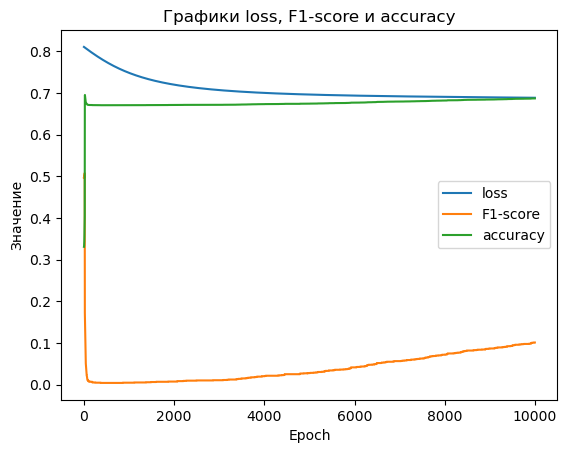

In [126]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf6['Epoch'], diagdf6['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf6['Epoch'], diagdf6['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf6['Epoch'], diagdf6['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [127]:
pred_test7=Mk7.forward(x_test.float())
pred_test_binarized7 = (pred_test7 > 0.5).float()

In [128]:
print(classification_report(y_test.to('cpu'), pred_test_binarized7.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.68      0.98      0.80      3216
         1.0       0.37      0.03      0.06      1542

    accuracy                           0.67      4758
   macro avg       0.52      0.50      0.43      4758
weighted avg       0.58      0.67      0.56      4758



In [129]:
#----------------------------------------------

<font color='red'>Experiment_#8</font>

<font color='red'>layers: 1, epochs: 20000, lr: 0.001 -> 0.0001</font>

In [130]:
#----------------------------------------------

In [131]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK8(nn.Module): #изменить название
    def __init__(self, input_size, output_size):
        super(MLP_MK8, self).__init__()
        self.fc1 = nn.Linear(input_size, output_size)
#         self.relu = nn.ReLU()
#         self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
#         self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
#         self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
#         out = self.relu(out)
#         out = self.fc2(out)
        out = self.sigmoid(out)
#         out = self.fc3(out)
#         out = self.tanh(out)
        return out

In [132]:
Mk8=MLP_MK8(1000,1) #изменить название переменной

In [133]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [134]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [135]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [136]:
Mk8=Mk8.to(dev)

In [137]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk8.parameters(), lr=0.0001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf7=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(20000):
    optimizer.zero_grad()
    pred = Mk8.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf7 = pd.concat([diagdf7, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.8070608377456665   f1-score: 0.0   accuracy: 0.6695495247840881
Epoch:  2 , Loss:  0.8070528507232666   f1-score: 0.0   accuracy: 0.6695495247840881
Epoch:  3 , Loss:  0.8070448040962219   f1-score: 0.0   accuracy: 0.6695495247840881
Epoch:  4 , Loss:  0.807036817073822   f1-score: 0.0   accuracy: 0.6695495247840881
Epoch:  5 , Loss:  0.8070288300514221   f1-score: 0.0   accuracy: 0.6695495247840881
Epoch:  6 , Loss:  0.8070207238197327   f1-score: 0.0   accuracy: 0.6695495247840881
Epoch:  7 , Loss:  0.8070127964019775   f1-score: 0.0   accuracy: 0.6695495247840881
Epoch:  8 , Loss:  0.8070048093795776   f1-score: 0.0   accuracy: 0.6695495247840881
Epoch:  9 , Loss:  0.806996762752533   f1-score: 0.0   accuracy: 0.6695495247840881
Epoch:  10 , Loss:  0.8069887757301331   f1-score: 0.0   accuracy: 0.6695495247840881
Epoch:  11 , Loss:  0.8069807887077332   f1-score: 0.0   accuracy: 0.6695495247840881
Epoch:  12 , Loss:  0.8069726824760437   f1-score: 0.0   accuracy

Epoch:  109 , Loss:  0.8061977624893188   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  110 , Loss:  0.8061898350715637   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  111 , Loss:  0.8061817288398743   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  112 , Loss:  0.8061738014221191   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  113 , Loss:  0.8061657547950745   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  114 , Loss:  0.8061578273773193   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  115 , Loss:  0.8061498403549194   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  116 , Loss:  0.8061419129371643   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  117 , Loss:  0.8061338663101196   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  118 , Loss:  0.8061259984970093   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  119 , Loss:  0.8061179518699646   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  120 , Loss:  0.8061099648475647   f

Epoch:  246 , Loss:  0.8051072359085083   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  247 , Loss:  0.8050992488861084   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  248 , Loss:  0.8050914406776428   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  249 , Loss:  0.8050833940505981   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  250 , Loss:  0.8050755262374878   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  251 , Loss:  0.8050675988197327   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  252 , Loss:  0.8050596714019775   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  253 , Loss:  0.8050516843795776   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  254 , Loss:  0.8050437569618225   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  255 , Loss:  0.8050358891487122   f1-score: 0.0

Epoch:  337 , Loss:  0.804385781288147   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  338 , Loss:  0.8043778538703918   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  339 , Loss:  0.8043699264526367   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  340 , Loss:  0.8043620586395264   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  341 , Loss:  0.8043540716171265   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  342 , Loss:  0.8043462634086609   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  343 , Loss:  0.8043383359909058   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  344 , Loss:  0.8043303489685059   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  345 , Loss:  0.8043224215507507   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  346 , Loss:  0.8043144941329956   f1-score: 0.00

Epoch:  429 , Loss:  0.8036587238311768   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  430 , Loss:  0.8036507964134216   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  431 , Loss:  0.8036428689956665   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  432 , Loss:  0.8036350607872009   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  433 , Loss:  0.8036270141601562   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  434 , Loss:  0.8036192655563354   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  435 , Loss:  0.8036113381385803   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  436 , Loss:  0.8036035299301147   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  437 , Loss:  0.8035955429077148   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  438 , Loss:  0.8035876154899597   f1-score: 0.0

Epoch:  525 , Loss:  0.8029024600982666   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  526 , Loss:  0.8028945922851562   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  527 , Loss:  0.8028867840766907   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  528 , Loss:  0.8028788566589355   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  529 , Loss:  0.8028709292411804   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  530 , Loss:  0.8028631806373596   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  531 , Loss:  0.8028552532196045   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  532 , Loss:  0.8028474450111389   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  533 , Loss:  0.8028396368026733   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  534 , Loss:  0.8028317093849182   f1-score: 0.0

Epoch:  609 , Loss:  0.8022429347038269   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  610 , Loss:  0.8022351264953613   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  611 , Loss:  0.802227258682251   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  612 , Loss:  0.8022193908691406   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  613 , Loss:  0.8022115230560303   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  614 , Loss:  0.8022037148475647   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  615 , Loss:  0.8021957874298096   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  616 , Loss:  0.8021880388259888   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  617 , Loss:  0.8021801114082336   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  618 , Loss:  0.8021724820137024   f1-score: 0.00

Epoch:  689 , Loss:  0.8016167283058167   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  690 , Loss:  0.8016088604927063   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  691 , Loss:  0.8016010522842407   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  692 , Loss:  0.8015931248664856   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  693 , Loss:  0.8015853762626648   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  694 , Loss:  0.8015775680541992   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  695 , Loss:  0.8015697598457336   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  696 , Loss:  0.8015620112419128   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  697 , Loss:  0.8015540838241577   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  698 , Loss:  0.8015463352203369   f1-score: 0.0

Epoch:  771 , Loss:  0.8009766936302185   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  772 , Loss:  0.8009689450263977   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  773 , Loss:  0.800960898399353   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  774 , Loss:  0.8009531497955322   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  775 , Loss:  0.8009454607963562   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  776 , Loss:  0.8009377121925354   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  777 , Loss:  0.800929844379425   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  778 , Loss:  0.8009220957756042   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  779 , Loss:  0.8009142875671387   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  780 , Loss:  0.8009065389633179   f1-score: 0.000

Epoch:  853 , Loss:  0.8003385663032532   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  854 , Loss:  0.8003308773040771   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  855 , Loss:  0.8003230690956116   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  856 , Loss:  0.8003153204917908   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  857 , Loss:  0.80030757188797   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  858 , Loss:  0.8002997040748596   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  859 , Loss:  0.8002919554710388   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  860 , Loss:  0.8002842664718628   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  861 , Loss:  0.800276517868042   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  862 , Loss:  0.8002687692642212   f1-score: 0.0005

Epoch:  939 , Loss:  0.7996715903282166   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  940 , Loss:  0.7996638417243958   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  941 , Loss:  0.7996560335159302   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  942 , Loss:  0.7996483445167542   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  943 , Loss:  0.7996406555175781   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  944 , Loss:  0.7996329069137573   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  945 , Loss:  0.799625039100647   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  946 , Loss:  0.7996174097061157   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  947 , Loss:  0.7996097207069397   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  948 , Loss:  0.7996019124984741   f1-score: 0.00

Epoch:  1025 , Loss:  0.7990067601203918   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  1026 , Loss:  0.7989990711212158   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  1027 , Loss:  0.7989912629127502   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  1028 , Loss:  0.7989835739135742   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  1029 , Loss:  0.798975944519043   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  1030 , Loss:  0.7989681959152222   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  1031 , Loss:  0.7989604473114014   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  1032 , Loss:  0.7989526987075806   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  1033 , Loss:  0.7989450097084045   f1-score: 0.0005452562472783029   accuracy: 0.6697297096252441
Epoch:  1034 , Loss:  0.7989373207092285   f1-s

Epoch:  1107 , Loss:  0.7983748912811279   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1108 , Loss:  0.7983673214912415   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1109 , Loss:  0.7983595728874207   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1110 , Loss:  0.7983519434928894   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1111 , Loss:  0.7983442544937134   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1112 , Loss:  0.7983365058898926   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1113 , Loss:  0.7983287572860718   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1114 , Loss:  0.798321008682251   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1115 , Loss:  0.7983134984970093   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1116 , Loss:  0.7983056306838989   f1-s

Epoch:  1188 , Loss:  0.797752857208252   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1189 , Loss:  0.7977451086044312   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1190 , Loss:  0.7977375388145447   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1191 , Loss:  0.7977297902107239   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1192 , Loss:  0.7977222800254822   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1193 , Loss:  0.7977145314216614   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1194 , Loss:  0.7977068424224854   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1195 , Loss:  0.7976990342140198   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1196 , Loss:  0.7976915240287781   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1197 , Loss:  0.7976838946342468   f1-s

Epoch:  1274 , Loss:  0.7970946431159973   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1275 , Loss:  0.7970868945121765   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1276 , Loss:  0.79707932472229   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1277 , Loss:  0.7970715761184692   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1278 , Loss:  0.7970638871192932   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1279 , Loss:  0.797056257724762   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1280 , Loss:  0.7970486879348755   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1281 , Loss:  0.797041118144989   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1282 , Loss:  0.7970333695411682   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1283 , Loss:  0.7970257997512817   f1-scor

Epoch:  1361 , Loss:  0.7964308261871338   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1362 , Loss:  0.7964232563972473   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1363 , Loss:  0.7964157462120056   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1364 , Loss:  0.7964080572128296   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1365 , Loss:  0.7964003682136536   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1366 , Loss:  0.7963927984237671   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1367 , Loss:  0.7963851690292358   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1368 , Loss:  0.7963775992393494   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1369 , Loss:  0.7963700294494629   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1370 , Loss:  0.7963622808456421   f1-

Epoch:  1444 , Loss:  0.7957999110221863   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1445 , Loss:  0.7957923412322998   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1446 , Loss:  0.7957847714424133   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1447 , Loss:  0.7957771420478821   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1448 , Loss:  0.7957695722579956   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1449 , Loss:  0.7957620620727539   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1450 , Loss:  0.7957544326782227   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1451 , Loss:  0.7957468032836914   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1452 , Loss:  0.7957392334938049   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1453 , Loss:  0.7957316637039185   f1-

Epoch:  1530 , Loss:  0.7951485514640808   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1531 , Loss:  0.79514080286026   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1532 , Loss:  0.7951332926750183   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1533 , Loss:  0.7951258420944214   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1534 , Loss:  0.7951181530952454   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1535 , Loss:  0.7951107025146484   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1536 , Loss:  0.795103132724762   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1537 , Loss:  0.7950955033302307   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1538 , Loss:  0.7950881123542786   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1539 , Loss:  0.7950802445411682   f1-sco

Epoch:  1610 , Loss:  0.7945445775985718   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1611 , Loss:  0.7945368885993958   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1612 , Loss:  0.7945294976234436   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1613 , Loss:  0.7945218682289124   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1614 , Loss:  0.7945143580436707   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1615 , Loss:  0.7945067882537842   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1616 , Loss:  0.7944993376731873   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1617 , Loss:  0.794491708278656   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1618 , Loss:  0.7944843173027039   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1619 , Loss:  0.7944767475128174   f1-s

Epoch:  1692 , Loss:  0.7939275503158569   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1693 , Loss:  0.7939201593399048   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1694 , Loss:  0.7939125895500183   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1695 , Loss:  0.7939051389694214   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1696 , Loss:  0.7938976287841797   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1697 , Loss:  0.7938900589942932   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1698 , Loss:  0.7938826084136963   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1699 , Loss:  0.7938750982284546   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1700 , Loss:  0.7938675880432129   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  1701 , Loss:  0.7938600182533264   f1-

Epoch:  1772 , Loss:  0.7933277487754822   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1773 , Loss:  0.79332035779953   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1774 , Loss:  0.7933128476142883   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1775 , Loss:  0.7933052778244019   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1776 , Loss:  0.7932978868484497   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1777 , Loss:  0.7932903170585632   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1778 , Loss:  0.7932828664779663   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1779 , Loss:  0.7932754755020142   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1780 , Loss:  0.7932679057121277   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1781 , Loss:  0.7932605147361755   f1-sc

Epoch:  1852 , Loss:  0.7927300930023193   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1853 , Loss:  0.7927225828170776   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1854 , Loss:  0.7927151322364807   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1855 , Loss:  0.792707622051239   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1856 , Loss:  0.7927002310752869   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1857 , Loss:  0.7926928400993347   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1858 , Loss:  0.792685329914093   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1859 , Loss:  0.7926779389381409   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1860 , Loss:  0.7926703691482544   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1861 , Loss:  0.7926629781723022   f1-sc

Epoch:  1932 , Loss:  0.7921342849731445   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1933 , Loss:  0.7921268939971924   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1934 , Loss:  0.7921195030212402   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1935 , Loss:  0.7921120524406433   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1936 , Loss:  0.7921046614646912   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1937 , Loss:  0.792097270488739   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1938 , Loss:  0.7920898795127869   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1939 , Loss:  0.7920823097229004   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1940 , Loss:  0.792074978351593   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  1941 , Loss:  0.7920675277709961   f1-sc

Epoch:  2014 , Loss:  0.7915260195732117   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2015 , Loss:  0.79151850938797   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2016 , Loss:  0.7915111184120178   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2017 , Loss:  0.7915037274360657   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2018 , Loss:  0.7914963364601135   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2019 , Loss:  0.7914889454841614   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2020 , Loss:  0.7914814949035645   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2021 , Loss:  0.7914741039276123   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2022 , Loss:  0.7914667725563049   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2023 , Loss:  0.791459321975708   f1-sco

Epoch:  2094 , Loss:  0.7909345030784607   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2095 , Loss:  0.7909271121025085   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2096 , Loss:  0.7909197211265564   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2097 , Loss:  0.7909123301506042   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2098 , Loss:  0.7909050583839417   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2099 , Loss:  0.7908975481987   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2100 , Loss:  0.7908902764320374   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2101 , Loss:  0.79088294506073   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2102 , Loss:  0.7908754944801331   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2103 , Loss:  0.7908681631088257   f1-score

Epoch:  2175 , Loss:  0.790337860584259   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2176 , Loss:  0.7903304696083069   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2177 , Loss:  0.7903231382369995   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2178 , Loss:  0.7903157472610474   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2179 , Loss:  0.7903084754943848   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2180 , Loss:  0.7903010845184326   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2181 , Loss:  0.7902936935424805   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2182 , Loss:  0.7902863025665283   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2183 , Loss:  0.7902790904045105   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2184 , Loss:  0.7902716994285583   f1-s

Epoch:  2286 , Loss:  0.7895236015319824   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2287 , Loss:  0.7895163297653198   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2288 , Loss:  0.7895089387893677   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2289 , Loss:  0.7895017266273499   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2290 , Loss:  0.7894943356513977   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2291 , Loss:  0.7894871234893799   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2292 , Loss:  0.7894797325134277   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2293 , Loss:  0.7894725203514099   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2294 , Loss:  0.7894651293754578   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2295 , Loss:  0.7894577980041504   f1-

Epoch:  2395 , Loss:  0.7887279987335205   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2396 , Loss:  0.7887207269668579   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2397 , Loss:  0.7887135744094849   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2398 , Loss:  0.7887063026428223   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2399 , Loss:  0.7886989712715149   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2400 , Loss:  0.7886916995048523   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2401 , Loss:  0.7886843681335449   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2402 , Loss:  0.7886770963668823   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2403 , Loss:  0.788669764995575   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2404 , Loss:  0.7886625528335571   f1-s

Epoch:  2476 , Loss:  0.7881394624710083   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2477 , Loss:  0.7881321310997009   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2478 , Loss:  0.7881249189376831   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2479 , Loss:  0.7881176471710205   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2480 , Loss:  0.7881104350090027   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2481 , Loss:  0.7881032228469849   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2482 , Loss:  0.7880958318710327   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2483 , Loss:  0.7880886793136597   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2484 , Loss:  0.7880814075469971   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2485 , Loss:  0.788074254989624   f1-s

Epoch:  2555 , Loss:  0.7875674962997437   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2556 , Loss:  0.787560224533081   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2557 , Loss:  0.7875529527664185   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2558 , Loss:  0.7875457406044006   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2559 , Loss:  0.787538468837738   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2560 , Loss:  0.787531316280365   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2561 , Loss:  0.7875241041183472   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2562 , Loss:  0.7875168919563293   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2563 , Loss:  0.7875096201896667   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2564 , Loss:  0.7875024676322937   f1-sco

Epoch:  2637 , Loss:  0.7869760394096375   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2638 , Loss:  0.7869688272476196   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2639 , Loss:  0.7869616150856018   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2640 , Loss:  0.786954402923584   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2641 , Loss:  0.7869471907615662   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2642 , Loss:  0.7869399189949036   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2643 , Loss:  0.7869327068328857   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2644 , Loss:  0.7869254946708679   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2645 , Loss:  0.7869184613227844   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2646 , Loss:  0.7869112491607666   f1-s

Epoch:  2751 , Loss:  0.786157488822937   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2752 , Loss:  0.7861502766609192   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2753 , Loss:  0.7861431837081909   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2754 , Loss:  0.7861359715461731   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2755 , Loss:  0.7861287593841553   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2756 , Loss:  0.786121666431427   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2757 , Loss:  0.786114513874054   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2758 , Loss:  0.7861073017120361   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2759 , Loss:  0.7861002087593079   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2760 , Loss:  0.78609299659729   f1-score

Epoch:  2867 , Loss:  0.7853290438652039   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2868 , Loss:  0.785321831703186   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2869 , Loss:  0.7853149175643921   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2870 , Loss:  0.785307765007019   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2871 , Loss:  0.785300612449646   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2872 , Loss:  0.7852935194969177   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2873 , Loss:  0.7852863669395447   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2874 , Loss:  0.7852792739868164   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2875 , Loss:  0.7852722406387329   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2876 , Loss:  0.7852650284767151   f1-sco

Epoch:  2946 , Loss:  0.7847675681114197   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2947 , Loss:  0.7847605347633362   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2948 , Loss:  0.7847533226013184   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2949 , Loss:  0.7847463488578796   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2950 , Loss:  0.7847392559051514   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2951 , Loss:  0.7847320437431335   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2952 , Loss:  0.78472501039505   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2953 , Loss:  0.7847179770469666   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2954 , Loss:  0.7847108244895935   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  2955 , Loss:  0.78470379114151   f1-scor

Epoch:  3062 , Loss:  0.7839469313621521   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3063 , Loss:  0.7839398980140686   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3064 , Loss:  0.7839328646659851   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3065 , Loss:  0.7839257717132568   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3066 , Loss:  0.7839186787605286   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3067 , Loss:  0.7839117050170898   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3068 , Loss:  0.7839046120643616   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3069 , Loss:  0.7838976383209229   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3070 , Loss:  0.783890426158905   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3071 , Loss:  0.7838833928108215   f1-s

Epoch:  3175 , Loss:  0.7831519246101379   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3176 , Loss:  0.783145010471344   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3177 , Loss:  0.7831379771232605   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3178 , Loss:  0.7831308245658875   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3179 , Loss:  0.7831239700317383   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3180 , Loss:  0.7831169366836548   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3181 , Loss:  0.7831099033355713   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3182 , Loss:  0.7831028699874878   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3183 , Loss:  0.7830958366394043   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3184 , Loss:  0.7830888628959656   f1-s

Epoch:  3253 , Loss:  0.7826058864593506   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3254 , Loss:  0.7825987935066223   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3255 , Loss:  0.7825918793678284   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3256 , Loss:  0.7825848460197449   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3257 , Loss:  0.7825778722763062   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3258 , Loss:  0.7825709581375122   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3259 , Loss:  0.7825638651847839   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3260 , Loss:  0.7825568318367004   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3261 , Loss:  0.7825499176979065   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3262 , Loss:  0.7825429439544678   f1-

Epoch:  3333 , Loss:  0.7820478081703186   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3334 , Loss:  0.7820409536361694   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3335 , Loss:  0.7820339202880859   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3336 , Loss:  0.7820268869400024   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3337 , Loss:  0.7820200324058533   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3338 , Loss:  0.7820129990577698   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3339 , Loss:  0.7820060849189758   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3340 , Loss:  0.7819990515708923   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3341 , Loss:  0.7819921970367432   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3342 , Loss:  0.7819851636886597   f1-

Epoch:  3411 , Loss:  0.7815060615539551   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3412 , Loss:  0.7814989686012268   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3413 , Loss:  0.7814921140670776   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3414 , Loss:  0.7814850807189941   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3415 , Loss:  0.781478226184845   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3416 , Loss:  0.781471312046051   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3417 , Loss:  0.7814643383026123   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3418 , Loss:  0.7814573645591736   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3419 , Loss:  0.7814504504203796   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3420 , Loss:  0.7814434766769409   f1-sc

Epoch:  3526 , Loss:  0.7807108759880066   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3527 , Loss:  0.7807040214538574   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3528 , Loss:  0.7806970477104187   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3529 , Loss:  0.7806901335716248   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3530 , Loss:  0.7806832790374756   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3531 , Loss:  0.7806764245033264   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3532 , Loss:  0.7806694507598877   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3533 , Loss:  0.7806625962257385   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3534 , Loss:  0.7806556224822998   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3535 , Loss:  0.7806488871574402   f1-

Epoch:  3639 , Loss:  0.7799341082572937   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3640 , Loss:  0.7799271941184998   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3641 , Loss:  0.7799203991889954   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3642 , Loss:  0.7799134254455566   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3643 , Loss:  0.7799065709114075   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3644 , Loss:  0.7798998951911926   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3645 , Loss:  0.7798929214477539   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3646 , Loss:  0.7798861861228943   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3647 , Loss:  0.7798793315887451   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3648 , Loss:  0.779872477054596   f1-s

Epoch:  3750 , Loss:  0.7791754603385925   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3751 , Loss:  0.7791686058044434   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3752 , Loss:  0.7791617512702942   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3753 , Loss:  0.7791550755500793   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3754 , Loss:  0.7791482210159302   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3755 , Loss:  0.779141366481781   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3756 , Loss:  0.7791345119476318   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3757 , Loss:  0.7791277170181274   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3758 , Loss:  0.779120922088623   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3759 , Loss:  0.7791140675544739   f1-sc

Epoch:  3854 , Loss:  0.778468668460846   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3855 , Loss:  0.7784618139266968   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3856 , Loss:  0.7784551382064819   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3857 , Loss:  0.778448224067688   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3858 , Loss:  0.7784415483474731   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3859 , Loss:  0.778434693813324   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3860 , Loss:  0.7784280180931091   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3861 , Loss:  0.77842116355896   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3862 , Loss:  0.7784143686294556   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  3863 , Loss:  0.778407633304596   f1-score:

Epoch:  3933 , Loss:  0.777934193611145   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  3934 , Loss:  0.7779273986816406   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  3935 , Loss:  0.7779205441474915   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  3936 , Loss:  0.7779138684272766   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  3937 , Loss:  0.7779071927070618   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  3938 , Loss:  0.7779003977775574   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  3939 , Loss:  0.7778937220573425   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  3940 , Loss:  0.7778869271278381   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  3941 , Loss:  0.7778801918029785   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  3942 , Loss:  0.7778733968734741   f1-s

Epoch:  4046 , Loss:  0.777173638343811   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4047 , Loss:  0.7771669030189514   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4048 , Loss:  0.7771601676940918   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4049 , Loss:  0.7771535515785217   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4050 , Loss:  0.7771467566490173   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4051 , Loss:  0.7771400213241577   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4052 , Loss:  0.7771334052085876   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4053 , Loss:  0.7771266102790833   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4054 , Loss:  0.7771199345588684   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4055 , Loss:  0.7771132588386536   f1-s

Epoch:  4159 , Loss:  0.77641761302948   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4160 , Loss:  0.7764109969139099   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4161 , Loss:  0.7764042615890503   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4162 , Loss:  0.7763976454734802   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4163 , Loss:  0.7763908505439758   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4164 , Loss:  0.7763842940330505   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4165 , Loss:  0.7763775587081909   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4166 , Loss:  0.7763708829879761   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4167 , Loss:  0.7763643264770508   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4168 , Loss:  0.7763577103614807   f1-sc

Epoch:  4257 , Loss:  0.775765597820282   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4258 , Loss:  0.7757589221000671   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4259 , Loss:  0.7757522463798523   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4260 , Loss:  0.7757457494735718   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4261 , Loss:  0.7757390141487122   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4262 , Loss:  0.7757324576377869   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4263 , Loss:  0.7757258415222168   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4264 , Loss:  0.7757192254066467   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4265 , Loss:  0.7757126688957214   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4266 , Loss:  0.775705873966217   f1-sc

Epoch:  4348 , Loss:  0.7751632928848267   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4349 , Loss:  0.7751566171646118   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4350 , Loss:  0.775149941444397   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4351 , Loss:  0.7751434445381165   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4352 , Loss:  0.7751368880271912   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4353 , Loss:  0.7751302123069763   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4354 , Loss:  0.775123655796051   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4355 , Loss:  0.775117039680481   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4356 , Loss:  0.7751103639602661   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4357 , Loss:  0.7751038074493408   f1-sco

Epoch:  4453 , Loss:  0.7744718790054321   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4454 , Loss:  0.7744652628898621   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4455 , Loss:  0.7744587659835815   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4456 , Loss:  0.7744521498680115   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4457 , Loss:  0.7744455933570862   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4458 , Loss:  0.7744390964508057   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4459 , Loss:  0.7744324803352356   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4460 , Loss:  0.7744258642196655   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4461 , Loss:  0.774419367313385   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4462 , Loss:  0.7744128704071045   f1-s

Epoch:  4555 , Loss:  0.7738040089607239   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4556 , Loss:  0.7737975120544434   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4557 , Loss:  0.7737910151481628   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4558 , Loss:  0.7737845182418823   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4559 , Loss:  0.7737780213356018   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4560 , Loss:  0.7737712860107422   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4561 , Loss:  0.773764967918396   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4562 , Loss:  0.7737583518028259   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4563 , Loss:  0.7737518548965454   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4564 , Loss:  0.7737452387809753   f1-s

Epoch:  4662 , Loss:  0.7731074094772339   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4663 , Loss:  0.7731010913848877   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4664 , Loss:  0.7730945944786072   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4665 , Loss:  0.7730879783630371   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4666 , Loss:  0.7730815410614014   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4667 , Loss:  0.7730750441551208   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4668 , Loss:  0.7730685472488403   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4669 , Loss:  0.7730620503425598   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4670 , Loss:  0.7730556726455688   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4671 , Loss:  0.7730491757392883   f1-

Epoch:  4774 , Loss:  0.7723828554153442   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4775 , Loss:  0.772376298904419   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4776 , Loss:  0.7723699808120728   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4777 , Loss:  0.7723634839057922   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4778 , Loss:  0.7723569869995117   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4779 , Loss:  0.7723506093025208   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4780 , Loss:  0.7723441123962402   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4781 , Loss:  0.7723376750946045   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4782 , Loss:  0.7723311185836792   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4783 , Loss:  0.7723247408866882   f1-s

Epoch:  4888 , Loss:  0.7716497778892517   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4889 , Loss:  0.7716434597969055   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4890 , Loss:  0.771636962890625   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4891 , Loss:  0.771630585193634   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4892 , Loss:  0.7716242671012878   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4893 , Loss:  0.7716177701950073   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4894 , Loss:  0.7716113328933716   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4895 , Loss:  0.7716048955917358   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4896 , Loss:  0.7715985774993896   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  4897 , Loss:  0.7715920805931091   f1-sc

Epoch:  5000 , Loss:  0.7709342837333679   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5001 , Loss:  0.7709278464317322   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5002 , Loss:  0.770921528339386   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5003 , Loss:  0.7709150910377502   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5004 , Loss:  0.7709088325500488   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5005 , Loss:  0.7709023356437683   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5006 , Loss:  0.7708960175514221   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5007 , Loss:  0.7708896398544312   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5008 , Loss:  0.770883321762085   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5009 , Loss:  0.7708768844604492   f1-sc

Epoch:  5115 , Loss:  0.7702043056488037   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5116 , Loss:  0.770197868347168   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5117 , Loss:  0.7701916098594666   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5118 , Loss:  0.7701852917671204   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5119 , Loss:  0.7701789736747742   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5120 , Loss:  0.7701725363731384   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5121 , Loss:  0.770166277885437   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5122 , Loss:  0.7701599597930908   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5123 , Loss:  0.7701536417007446   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5124 , Loss:  0.7701473236083984   f1-sc

Epoch:  5224 , Loss:  0.76951664686203   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5225 , Loss:  0.7695105075836182   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5226 , Loss:  0.769504189491272   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5227 , Loss:  0.769497811794281   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5228 , Loss:  0.7694916725158691   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5229 , Loss:  0.769485354423523   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5230 , Loss:  0.7694790363311768   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5231 , Loss:  0.7694727778434753   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5232 , Loss:  0.7694663405418396   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5233 , Loss:  0.7694602012634277   f1-score

Epoch:  5333 , Loss:  0.768833577632904   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5334 , Loss:  0.7688272595405579   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5335 , Loss:  0.7688210010528564   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5336 , Loss:  0.768814742565155   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5337 , Loss:  0.7688085436820984   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5338 , Loss:  0.768802285194397   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5339 , Loss:  0.7687961459159851   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5340 , Loss:  0.7687897682189941   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5341 , Loss:  0.7687836289405823   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5342 , Loss:  0.7687773108482361   f1-sco

Epoch:  5442 , Loss:  0.7681545615196228   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5443 , Loss:  0.7681484222412109   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5444 , Loss:  0.7681422829627991   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5445 , Loss:  0.7681360244750977   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5446 , Loss:  0.7681298851966858   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5447 , Loss:  0.7681236863136292   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5448 , Loss:  0.768117368221283   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5449 , Loss:  0.7681111097335815   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5450 , Loss:  0.768105149269104   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5451 , Loss:  0.768098771572113   f1-sco

Epoch:  5556 , Loss:  0.7674492597579956   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5557 , Loss:  0.7674431204795837   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5558 , Loss:  0.7674369215965271   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5559 , Loss:  0.7674306631088257   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5560 , Loss:  0.7674246430397034   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5561 , Loss:  0.767418384552002   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5562 , Loss:  0.7674122452735901   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5563 , Loss:  0.7674060463905334   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5564 , Loss:  0.7673999071121216   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  5565 , Loss:  0.7673937678337097   f1-s

Epoch:  5669 , Loss:  0.766754686832428   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5670 , Loss:  0.7667484879493713   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5671 , Loss:  0.7667424082756042   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5672 , Loss:  0.7667363882064819   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5673 , Loss:  0.7667301297187805   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5674 , Loss:  0.7667240500450134   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5675 , Loss:  0.7667179107666016   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5676 , Loss:  0.7667117118835449   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5677 , Loss:  0.7667057514190674   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5678 , Loss:  0.7666996121406555   f1-score: 0.0

Epoch:  5777 , Loss:  0.7660951614379883   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5778 , Loss:  0.7660890817642212   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5779 , Loss:  0.7660830616950989   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5780 , Loss:  0.7660768628120422   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5781 , Loss:  0.7660707235336304   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5782 , Loss:  0.7660647630691528   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5783 , Loss:  0.7660585641860962   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5784 , Loss:  0.7660526037216187   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5785 , Loss:  0.7660464644432068   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5786 , Loss:  0.7660404443740845   f1-score: 0.

Epoch:  5875 , Loss:  0.7655004262924194   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5876 , Loss:  0.7654944658279419   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5877 , Loss:  0.7654883861541748   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5878 , Loss:  0.7654823064804077   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5879 , Loss:  0.7654762268066406   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5880 , Loss:  0.7654701471328735   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5881 , Loss:  0.7654641270637512   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5882 , Loss:  0.7654580473899841   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5883 , Loss:  0.7654520273208618   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5884 , Loss:  0.7654460072517395   f1-score: 0.

Epoch:  5986 , Loss:  0.7648309469223022   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5987 , Loss:  0.7648250460624695   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5988 , Loss:  0.7648189663887024   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5989 , Loss:  0.7648129463195801   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5990 , Loss:  0.7648069858551025   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5991 , Loss:  0.7648009061813354   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5992 , Loss:  0.7647948265075684   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5993 , Loss:  0.7647888660430908   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5994 , Loss:  0.7647829055786133   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  5995 , Loss:  0.764776885509491   f1-score: 0.0

Epoch:  6100 , Loss:  0.7641481161117554   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  6101 , Loss:  0.7641422152519226   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  6102 , Loss:  0.7641362547874451   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  6103 , Loss:  0.764130175113678   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  6104 , Loss:  0.7641242742538452   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  6105 , Loss:  0.7641183137893677   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  6106 , Loss:  0.7641122937202454   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  6107 , Loss:  0.764106273651123   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  6108 , Loss:  0.7641003727912903   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  6109 , Loss:  0.7640944719314575   f1-score: 0.00

Epoch:  6213 , Loss:  0.7634758949279785   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  6214 , Loss:  0.7634699940681458   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6215 , Loss:  0.763464093208313   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6216 , Loss:  0.7634581923484802   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6217 , Loss:  0.7634521126747131   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6218 , Loss:  0.7634463310241699   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6219 , Loss:  0.7634403109550476   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6220 , Loss:  0.7634344100952148   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6221 , Loss:  0.7634285688400269   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6222 , Loss:  0.7634225487709045   f1-sc

Epoch:  6327 , Loss:  0.7628024816513062   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6328 , Loss:  0.7627965807914734   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6329 , Loss:  0.7627906799316406   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6330 , Loss:  0.7627848982810974   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6331 , Loss:  0.7627789378166199   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6332 , Loss:  0.7627730369567871   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6333 , Loss:  0.7627671360969543   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6334 , Loss:  0.7627612948417664   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6335 , Loss:  0.7627553939819336   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6336 , Loss:  0.7627495527267456   f1-

Epoch:  6440 , Loss:  0.7621395587921143   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6441 , Loss:  0.762133777141571   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6442 , Loss:  0.7621280550956726   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6443 , Loss:  0.7621220350265503   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6444 , Loss:  0.7621163725852966   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6445 , Loss:  0.7621104717254639   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6446 , Loss:  0.7621045708656311   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6447 , Loss:  0.7620986700057983   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6448 , Loss:  0.7620930075645447   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6449 , Loss:  0.7620870471000671   f1-s

Epoch:  6553 , Loss:  0.7614814043045044   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6554 , Loss:  0.761475682258606   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6555 , Loss:  0.7614699006080627   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6556 , Loss:  0.76146399974823   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6557 , Loss:  0.761458158493042   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6558 , Loss:  0.7614524364471436   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6559 , Loss:  0.7614466547966003   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6560 , Loss:  0.7614408731460571   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6561 , Loss:  0.7614351511001587   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6562 , Loss:  0.7614291310310364   f1-scor

Epoch:  6662 , Loss:  0.7608509659767151   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6663 , Loss:  0.7608452439308167   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6664 , Loss:  0.7608394026756287   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6665 , Loss:  0.7608336806297302   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6666 , Loss:  0.760827898979187   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6667 , Loss:  0.7608221173286438   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6668 , Loss:  0.7608163952827454   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6669 , Loss:  0.7608106732368469   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6670 , Loss:  0.7608048319816589   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6671 , Loss:  0.7607991099357605   f1-s

Epoch:  6767 , Loss:  0.7602477073669434   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6768 , Loss:  0.7602419853210449   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6769 , Loss:  0.7602361440658569   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6770 , Loss:  0.760230541229248   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6771 , Loss:  0.7602248191833496   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6772 , Loss:  0.7602190971374512   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6773 , Loss:  0.7602132558822632   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6774 , Loss:  0.76020747423172   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6775 , Loss:  0.7602018117904663   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6776 , Loss:  0.7601962089538574   f1-sco

Epoch:  6877 , Loss:  0.7596200108528137   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6878 , Loss:  0.7596143484115601   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6879 , Loss:  0.7596086263656616   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6880 , Loss:  0.759602963924408   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6881 , Loss:  0.7595972418785095   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6882 , Loss:  0.7595916390419006   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6883 , Loss:  0.7595859169960022   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6884 , Loss:  0.7595801949501038   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6885 , Loss:  0.7595745325088501   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6886 , Loss:  0.7595688104629517   f1-s

Epoch:  6992 , Loss:  0.7589683532714844   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6993 , Loss:  0.7589627504348755   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6994 , Loss:  0.7589571475982666   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6995 , Loss:  0.7589514255523682   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6996 , Loss:  0.758945882320404   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6997 , Loss:  0.7589401602745056   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6998 , Loss:  0.7589346170425415   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  6999 , Loss:  0.7589288949966431   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7000 , Loss:  0.758923351764679   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7001 , Loss:  0.7589176893234253   f1-sc

Epoch:  7105 , Loss:  0.7583330273628235   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7106 , Loss:  0.758327305316925   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7107 , Loss:  0.7583217620849609   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7108 , Loss:  0.7583160996437073   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7109 , Loss:  0.7583104968070984   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7110 , Loss:  0.7583049535751343   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7111 , Loss:  0.7582994103431702   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7112 , Loss:  0.7582937479019165   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7113 , Loss:  0.7582881450653076   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7114 , Loss:  0.758282482624054   f1-sc

Epoch:  7218 , Loss:  0.7577019929885864   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7219 , Loss:  0.7576963901519775   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7220 , Loss:  0.7576909065246582   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7221 , Loss:  0.7576853036880493   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7222 , Loss:  0.7576797604560852   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7223 , Loss:  0.7576742172241211   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7224 , Loss:  0.757668673992157   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7225 , Loss:  0.7576631307601929   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7226 , Loss:  0.757657527923584   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7227 , Loss:  0.7576518654823303   f1-sc

Epoch:  7296 , Loss:  0.7572691440582275   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7297 , Loss:  0.757263720035553   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7298 , Loss:  0.7572582364082336   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7299 , Loss:  0.7572526335716248   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7300 , Loss:  0.7572470903396606   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7301 , Loss:  0.7572415471076965   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7302 , Loss:  0.7572360634803772   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7303 , Loss:  0.7572305202484131   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7304 , Loss:  0.757224977016449   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7305 , Loss:  0.7572195529937744   f1-sc

Epoch:  7410 , Loss:  0.7566407322883606   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7411 , Loss:  0.7566351890563965   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7412 , Loss:  0.7566298246383667   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7413 , Loss:  0.7566242814064026   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7414 , Loss:  0.7566186189651489   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7415 , Loss:  0.7566131949424744   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7416 , Loss:  0.7566076517105103   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7417 , Loss:  0.7566022872924805   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7418 , Loss:  0.7565968036651611   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7419 , Loss:  0.7565912008285522   f1-

Epoch:  7488 , Loss:  0.7562132477760315   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7489 , Loss:  0.7562078833580017   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7490 , Loss:  0.7562023401260376   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7491 , Loss:  0.7561968564987183   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7492 , Loss:  0.7561914324760437   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7493 , Loss:  0.7561859488487244   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7494 , Loss:  0.7561805248260498   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7495 , Loss:  0.7561750411987305   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7496 , Loss:  0.7561694979667664   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7497 , Loss:  0.7561641335487366   f1-

Epoch:  7566 , Loss:  0.7557882070541382   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7567 , Loss:  0.7557826638221741   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7568 , Loss:  0.7557772994041443   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7569 , Loss:  0.7557717561721802   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7570 , Loss:  0.7557663917541504   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7571 , Loss:  0.7557610273361206   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7572 , Loss:  0.755755603313446   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7573 , Loss:  0.7557501196861267   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7574 , Loss:  0.7557446956634521   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7575 , Loss:  0.7557392120361328   f1-s

Epoch:  7648 , Loss:  0.7553436756134033   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7649 , Loss:  0.7553381323814392   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7650 , Loss:  0.7553327679634094   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7651 , Loss:  0.7553274035453796   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7652 , Loss:  0.7553219199180603   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7653 , Loss:  0.7553165555000305   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7654 , Loss:  0.755311131477356   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7655 , Loss:  0.7553057670593262   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7656 , Loss:  0.7553004026412964   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7657 , Loss:  0.755294919013977   f1-sc

Epoch:  7760 , Loss:  0.7547401189804077   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7761 , Loss:  0.7547348737716675   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7762 , Loss:  0.7547293901443481   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7763 , Loss:  0.7547240257263184   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7764 , Loss:  0.7547188401222229   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7765 , Loss:  0.7547133564949036   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7766 , Loss:  0.754707932472229   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7767 , Loss:  0.754702627658844   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7768 , Loss:  0.7546973824501038   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7769 , Loss:  0.754692018032074   f1-sco

Epoch:  7838 , Loss:  0.7543227672576904   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7839 , Loss:  0.7543174028396606   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7840 , Loss:  0.7543120384216309   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7841 , Loss:  0.7543066740036011   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7842 , Loss:  0.7543013095855713   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7843 , Loss:  0.7542960047721863   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7844 , Loss:  0.7542906403541565   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7845 , Loss:  0.7542852759361267   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7846 , Loss:  0.7542800307273865   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7847 , Loss:  0.7542746067047119   f1-

Epoch:  7916 , Loss:  0.7539073824882507   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7917 , Loss:  0.753902018070221   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7918 , Loss:  0.7538967728614807   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7919 , Loss:  0.7538914680480957   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7920 , Loss:  0.7538861036300659   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7921 , Loss:  0.7538807392120361   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7922 , Loss:  0.7538754940032959   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7923 , Loss:  0.7538701891899109   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7924 , Loss:  0.7538649439811707   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  7925 , Loss:  0.7538596391677856   f1-s

Epoch:  8027 , Loss:  0.7533201575279236   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8028 , Loss:  0.7533148527145386   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8029 , Loss:  0.7533096075057983   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8030 , Loss:  0.7533043026924133   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8031 , Loss:  0.7532990574836731   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8032 , Loss:  0.7532937526702881   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8033 , Loss:  0.7532885074615479   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8034 , Loss:  0.7532832622528076   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8035 , Loss:  0.7532778978347778   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8036 , Loss:  0.7532727122306824   f1-

Epoch:  8138 , Loss:  0.7527372241020203   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8139 , Loss:  0.7527319192886353   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8140 , Loss:  0.7527268528938293   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8141 , Loss:  0.7527215480804443   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8142 , Loss:  0.7527163624763489   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8143 , Loss:  0.7527109980583191   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8144 , Loss:  0.7527058720588684   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8145 , Loss:  0.7527005076408386   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8146 , Loss:  0.7526954412460327   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8147 , Loss:  0.7526902556419373   f1-

Epoch:  8241 , Loss:  0.7522003650665283   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8242 , Loss:  0.7521951794624329   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8243 , Loss:  0.7521898150444031   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8244 , Loss:  0.7521846890449524   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8245 , Loss:  0.7521796226501465   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8246 , Loss:  0.7521743178367615   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8247 , Loss:  0.752169132232666   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8248 , Loss:  0.7521639466285706   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8249 , Loss:  0.7521587610244751   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8250 , Loss:  0.7521535754203796   f1-s

Epoch:  8320 , Loss:  0.7517910599708557   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8321 , Loss:  0.7517859935760498   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8322 , Loss:  0.7517806887626648   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8323 , Loss:  0.7517756223678589   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8324 , Loss:  0.7517704963684082   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8325 , Loss:  0.7517651915550232   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8326 , Loss:  0.7517601251602173   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8327 , Loss:  0.7517549395561218   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8328 , Loss:  0.7517497539520264   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8329 , Loss:  0.7517446279525757   f1-

Epoch:  8433 , Loss:  0.751209557056427   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8434 , Loss:  0.7512044310569763   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8435 , Loss:  0.7511993646621704   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8436 , Loss:  0.751194179058075   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8437 , Loss:  0.7511890530586243   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8438 , Loss:  0.7511839270591736   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8439 , Loss:  0.7511788606643677   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8440 , Loss:  0.7511736750602722   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8441 , Loss:  0.7511685490608215   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8442 , Loss:  0.7511634230613708   f1-sc

Epoch:  8546 , Loss:  0.7506325840950012   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8547 , Loss:  0.7506274580955505   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8548 , Loss:  0.7506223917007446   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8549 , Loss:  0.7506173849105835   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8550 , Loss:  0.750612199306488   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8551 , Loss:  0.7506071329116821   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8552 , Loss:  0.750602126121521   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8553 , Loss:  0.7505970597267151   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8554 , Loss:  0.7505919337272644   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8555 , Loss:  0.7505868077278137   f1-sc

Epoch:  8661 , Loss:  0.7500500082969666   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8662 , Loss:  0.7500448822975159   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8663 , Loss:  0.7500399351119995   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8664 , Loss:  0.7500349283218384   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8665 , Loss:  0.7500298619270325   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8666 , Loss:  0.7500247359275818   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8667 , Loss:  0.7500197291374207   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8668 , Loss:  0.7500147223472595   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8669 , Loss:  0.7500097155570984   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8670 , Loss:  0.7500045895576477   f1-

Epoch:  8769 , Loss:  0.7495073676109314   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8770 , Loss:  0.7495022416114807   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8771 , Loss:  0.7494972944259644   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8772 , Loss:  0.7494922280311584   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8773 , Loss:  0.7494872808456421   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8774 , Loss:  0.7494821548461914   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8775 , Loss:  0.7494772672653198   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8776 , Loss:  0.7494721412658691   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8777 , Loss:  0.749467134475708   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8778 , Loss:  0.7494621276855469   f1-s

Epoch:  8880 , Loss:  0.7489535808563232   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8881 , Loss:  0.7489486932754517   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8882 , Loss:  0.7489437460899353   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8883 , Loss:  0.7489387392997742   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8884 , Loss:  0.748933732509613   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8885 , Loss:  0.7489287853240967   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8886 , Loss:  0.748923659324646   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8887 , Loss:  0.7489187717437744   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8888 , Loss:  0.7489138245582581   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8889 , Loss:  0.7489088177680969   f1-sc

Epoch:  8993 , Loss:  0.7483944296836853   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8994 , Loss:  0.748389482498169   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8995 , Loss:  0.7483846545219421   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8996 , Loss:  0.748379647731781   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8997 , Loss:  0.7483747005462646   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8998 , Loss:  0.7483697533607483   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  8999 , Loss:  0.7483648657798767   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9000 , Loss:  0.7483600378036499   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9001 , Loss:  0.748354971408844   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9002 , Loss:  0.7483501434326172   f1-sco

Epoch:  9109 , Loss:  0.7478250861167908   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9110 , Loss:  0.747820258140564   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9111 , Loss:  0.7478153109550476   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9112 , Loss:  0.747810423374176   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9113 , Loss:  0.7478054761886597   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9114 , Loss:  0.7478006482124329   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9115 , Loss:  0.747795820236206   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9116 , Loss:  0.7477908730506897   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9117 , Loss:  0.7477859258651733   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9118 , Loss:  0.7477810978889465   f1-sco

Epoch:  9221 , Loss:  0.7472798824310303   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9222 , Loss:  0.7472750544548035   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9223 , Loss:  0.7472702264785767   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9224 , Loss:  0.7472652792930603   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9225 , Loss:  0.7472605109214783   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9226 , Loss:  0.7472556233406067   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9227 , Loss:  0.7472508549690247   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9228 , Loss:  0.7472459077835083   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9229 , Loss:  0.7472410202026367   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9230 , Loss:  0.7472362518310547   f1-

Epoch:  9331 , Loss:  0.746748685836792   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9332 , Loss:  0.7467437386512756   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9333 , Loss:  0.7467390298843384   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9334 , Loss:  0.7467341423034668   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9335 , Loss:  0.74672931432724   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9336 , Loss:  0.746724545955658   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9337 , Loss:  0.7467197179794312   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9338 , Loss:  0.7467148900032043   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9339 , Loss:  0.7467101216316223   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9340 , Loss:  0.7467052936553955   f1-scor

Epoch:  9445 , Loss:  0.7462025284767151   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9446 , Loss:  0.7461977005004883   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9447 , Loss:  0.746192991733551   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9448 , Loss:  0.7461881637573242   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9449 , Loss:  0.7461835145950317   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9450 , Loss:  0.7461785674095154   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9451 , Loss:  0.7461737990379333   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9452 , Loss:  0.7461690902709961   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9453 , Loss:  0.7461642622947693   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9454 , Loss:  0.746159553527832   f1-sc

Epoch:  9559 , Loss:  0.7456607222557068   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9560 , Loss:  0.7456560134887695   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9561 , Loss:  0.7456514239311218   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9562 , Loss:  0.7456466555595398   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9563 , Loss:  0.7456418871879578   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9564 , Loss:  0.7456371784210205   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9565 , Loss:  0.7456324100494385   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9566 , Loss:  0.745627760887146   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9567 , Loss:  0.7456229329109192   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9568 , Loss:  0.7456182241439819   f1-s

Epoch:  9665 , Loss:  0.7451611161231995   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9666 , Loss:  0.745156466960907   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9667 , Loss:  0.745151698589325   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9668 , Loss:  0.7451471090316772   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9669 , Loss:  0.7451423406600952   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9670 , Loss:  0.7451378107070923   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9671 , Loss:  0.7451329827308655   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9672 , Loss:  0.7451282739639282   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9673 , Loss:  0.7451236248016357   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9674 , Loss:  0.7451189756393433   f1-sc

Epoch:  9777 , Loss:  0.7446375489234924   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9778 , Loss:  0.7446329593658447   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9779 , Loss:  0.7446281909942627   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9780 , Loss:  0.7446234822273254   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9781 , Loss:  0.7446188926696777   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9782 , Loss:  0.7446141242980957   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9783 , Loss:  0.7446095943450928   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9784 , Loss:  0.7446048855781555   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9785 , Loss:  0.744600236415863   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9786 , Loss:  0.7445955872535706   f1-s

Epoch:  9889 , Loss:  0.7441180944442749   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9890 , Loss:  0.744113564491272   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9891 , Loss:  0.7441087961196899   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9892 , Loss:  0.7441042065620422   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9893 , Loss:  0.7440996170043945   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9894 , Loss:  0.744094967842102   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9895 , Loss:  0.7440903782844543   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9896 , Loss:  0.7440857291221619   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9897 , Loss:  0.7440811991691589   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9898 , Loss:  0.7440766096115112   f1-sc

Epoch:  9967 , Loss:  0.7437587380409241   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9968 , Loss:  0.7437542676925659   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9969 , Loss:  0.7437496781349182   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9970 , Loss:  0.7437450885772705   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9971 , Loss:  0.7437404990196228   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9972 , Loss:  0.7437359690666199   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9973 , Loss:  0.7437313795089722   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9974 , Loss:  0.7437267899513245   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9975 , Loss:  0.7437222003936768   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  9976 , Loss:  0.7437175512313843   f1-

Epoch:  10079 , Loss:  0.7432466149330139   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10080 , Loss:  0.7432420253753662   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10081 , Loss:  0.7432375550270081   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10082 , Loss:  0.7432330846786499   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10083 , Loss:  0.7432284951210022   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10084 , Loss:  0.7432239055633545   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10085 , Loss:  0.7432193160057068   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10086 , Loss:  0.7432147264480591   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10087 , Loss:  0.7432103753089905   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10088 , Loss:  0.743205666542

Epoch:  10187 , Loss:  0.7427568435668945   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10188 , Loss:  0.742752194404602   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10189 , Loss:  0.7427477836608887   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10190 , Loss:  0.742743194103241   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10191 , Loss:  0.7427387237548828   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10192 , Loss:  0.7427341938018799   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10193 , Loss:  0.7427297234535217   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10194 , Loss:  0.7427250742912292   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10195 , Loss:  0.7427206635475159   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10196 , Loss:  0.74271619319915

Epoch:  10290 , Loss:  0.7422932386398315   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10291 , Loss:  0.7422887086868286   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10292 , Loss:  0.7422842979431152   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10293 , Loss:  0.7422797083854675   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10294 , Loss:  0.7422752976417542   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10295 , Loss:  0.7422707676887512   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10296 , Loss:  0.7422663569450378   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10297 , Loss:  0.7422618865966797   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10298 , Loss:  0.7422573566436768   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10299 , Loss:  0.742252826690

Epoch:  10388 , Loss:  0.7418553829193115   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10389 , Loss:  0.7418509125709534   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10390 , Loss:  0.7418464422225952   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10391 , Loss:  0.7418419122695923   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10392 , Loss:  0.7418375611305237   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10393 , Loss:  0.7418331503868103   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10394 , Loss:  0.7418287396430969   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10395 , Loss:  0.7418241500854492   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10396 , Loss:  0.7418198585510254   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10397 , Loss:  0.741815388202

Epoch:  10482 , Loss:  0.7414387464523315   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10483 , Loss:  0.7414343357086182   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10484 , Loss:  0.74142986536026   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10485 , Loss:  0.7414254546165466   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10486 , Loss:  0.7414208650588989   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10487 , Loss:  0.7414165735244751   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10488 , Loss:  0.7414122223854065   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10489 , Loss:  0.7414077520370483   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10490 , Loss:  0.7414034605026245   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10491 , Loss:  0.74139899015426

Epoch:  10591 , Loss:  0.7409589886665344   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10592 , Loss:  0.7409546971321106   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10593 , Loss:  0.7409501671791077   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10594 , Loss:  0.7409459352493286   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10595 , Loss:  0.74094158411026   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10596 , Loss:  0.7409371733665466   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10597 , Loss:  0.7409327626228333   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10598 , Loss:  0.7409283518791199   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10599 , Loss:  0.7409239411354065   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10600 , Loss:  0.74091958999633

Epoch:  10702 , Loss:  0.7404744029045105   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10703 , Loss:  0.7404699921607971   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10704 , Loss:  0.7404657602310181   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10705 , Loss:  0.7404613494873047   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10706 , Loss:  0.7404570579528809   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10707 , Loss:  0.740452766418457   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10708 , Loss:  0.7404483556747437   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10709 , Loss:  0.7404439449310303   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10710 , Loss:  0.7404397130012512   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10711 , Loss:  0.7404353618621

Epoch:  10814 , Loss:  0.7399898767471313   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10815 , Loss:  0.7399855852127075   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10816 , Loss:  0.7399812936782837   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10817 , Loss:  0.7399769425392151   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10818 , Loss:  0.7399727702140808   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10819 , Loss:  0.7399683594703674   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10820 , Loss:  0.7399641275405884   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10821 , Loss:  0.739959716796875   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10822 , Loss:  0.739955484867096   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10823 , Loss:  0.73995119333267

Epoch:  10891 , Loss:  0.7396591901779175   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10892 , Loss:  0.7396547794342041   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10893 , Loss:  0.7396506667137146   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10894 , Loss:  0.739646315574646   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10895 , Loss:  0.7396419644355774   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10896 , Loss:  0.7396377325057983   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10897 , Loss:  0.7396333813667297   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10898 , Loss:  0.7396290898323059   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10899 , Loss:  0.7396248579025269   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10900 , Loss:  0.7396206259727

Epoch:  10968 , Loss:  0.7393301725387573   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10969 , Loss:  0.7393259406089783   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10970 , Loss:  0.7393217086791992   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10971 , Loss:  0.7393174767494202   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10972 , Loss:  0.7393130660057068   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10973 , Loss:  0.7393088340759277   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10974 , Loss:  0.7393046617507935   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10975 , Loss:  0.7393004298210144   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10976 , Loss:  0.7392960786819458   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  10977 , Loss:  0.739291787147

Epoch:  11072 , Loss:  0.7388890385627747   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11073 , Loss:  0.7388848066329956   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11074 , Loss:  0.7388805747032166   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11075 , Loss:  0.7388763427734375   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11076 , Loss:  0.7388721108436584   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11077 , Loss:  0.738867998123169   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11078 , Loss:  0.7388637065887451   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11079 , Loss:  0.7388594746589661   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11080 , Loss:  0.738855242729187   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11081 , Loss:  0.73885101079940

Epoch:  11184 , Loss:  0.7384179830551147   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11185 , Loss:  0.7384137511253357   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11186 , Loss:  0.738409698009491   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11187 , Loss:  0.7384054660797119   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11188 , Loss:  0.7384012937545776   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11189 , Loss:  0.7383971214294434   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11190 , Loss:  0.7383928894996643   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11191 , Loss:  0.7383887767791748   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11192 , Loss:  0.7383845448493958   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11193 , Loss:  0.7383804321289

Epoch:  11261 , Loss:  0.7380964159965515   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11262 , Loss:  0.738092303276062   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11263 , Loss:  0.7380881309509277   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11264 , Loss:  0.7380840182304382   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11265 , Loss:  0.7380797863006592   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11266 , Loss:  0.7380755543708801   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11267 , Loss:  0.7380715012550354   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11268 , Loss:  0.7380673289299011   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11269 , Loss:  0.7380631566047668   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11270 , Loss:  0.7380589246749

Epoch:  11371 , Loss:  0.7376402616500854   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11372 , Loss:  0.737636148929596   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11373 , Loss:  0.7376320362091064   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11374 , Loss:  0.7376279234886169   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11375 , Loss:  0.7376237511634827   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11376 , Loss:  0.7376196384429932   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11377 , Loss:  0.7376155257225037   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11378 , Loss:  0.7376114130020142   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11379 , Loss:  0.7376072406768799   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11380 , Loss:  0.7376031875610

Epoch:  11448 , Loss:  0.7373234629631042   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11449 , Loss:  0.7373194694519043   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11450 , Loss:  0.73731529712677   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11451 , Loss:  0.7373112440109253   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11452 , Loss:  0.737307071685791   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11453 , Loss:  0.7373029589653015   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11454 , Loss:  0.7372987866401672   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11455 , Loss:  0.7372947931289673   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11456 , Loss:  0.737290620803833   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11457 , Loss:  0.7372866272926331

Epoch:  11561 , Loss:  0.7368618845939636   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11562 , Loss:  0.7368578910827637   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11563 , Loss:  0.7368537783622742   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11564 , Loss:  0.7368496656417847   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11565 , Loss:  0.7368456125259399   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11566 , Loss:  0.7368414998054504   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11567 , Loss:  0.7368374466896057   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11568 , Loss:  0.7368335127830505   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11569 , Loss:  0.7368293404579163   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11570 , Loss:  0.736825287342

Epoch:  11672 , Loss:  0.7364123463630676   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11673 , Loss:  0.7364082336425781   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11674 , Loss:  0.736404299736023   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11675 , Loss:  0.7364001870155334   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11676 , Loss:  0.7363961338996887   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11677 , Loss:  0.736392080783844   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11678 , Loss:  0.7363880276679993   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11679 , Loss:  0.7363840341567993   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11680 , Loss:  0.7363799810409546   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11681 , Loss:  0.73637592792510

Epoch:  11783 , Loss:  0.7359666228294373   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11784 , Loss:  0.7359627485275269   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11785 , Loss:  0.7359586954116821   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11786 , Loss:  0.7359546422958374   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11787 , Loss:  0.7359507083892822   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11788 , Loss:  0.7359467148780823   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11789 , Loss:  0.7359427213668823   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11790 , Loss:  0.7359386682510376   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11791 , Loss:  0.7359346747398376   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11792 , Loss:  0.735930740833

Epoch:  11896 , Loss:  0.7355170249938965   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11897 , Loss:  0.7355130910873413   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11898 , Loss:  0.7355090975761414   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11899 , Loss:  0.7355051636695862   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11900 , Loss:  0.735501229763031   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11901 , Loss:  0.7354972958564758   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11902 , Loss:  0.7354932427406311   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11903 , Loss:  0.7354893684387207   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11904 , Loss:  0.735485315322876   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  11905 , Loss:  0.73548144102096

Epoch:  12006 , Loss:  0.7350830435752869   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12007 , Loss:  0.7350791096687317   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12008 , Loss:  0.7350752353668213   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12009 , Loss:  0.7350713014602661   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12010 , Loss:  0.7350674271583557   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12011 , Loss:  0.7350634336471558   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12012 , Loss:  0.7350594997406006   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12013 , Loss:  0.7350556254386902   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12014 , Loss:  0.7350516319274902   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12015 , Loss:  0.735047757625

Epoch:  12121 , Loss:  0.7346333861351013   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12122 , Loss:  0.7346295118331909   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12123 , Loss:  0.7346256971359253   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12124 , Loss:  0.7346218228340149   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12125 , Loss:  0.7346178293228149   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12126 , Loss:  0.7346139550209045   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12127 , Loss:  0.7346100807189941   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12128 , Loss:  0.7346062064170837   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12129 , Loss:  0.7346022725105286   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12130 , Loss:  0.734598398208

Epoch:  12198 , Loss:  0.7343347072601318   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12199 , Loss:  0.7343308925628662   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12200 , Loss:  0.7343270778656006   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12201 , Loss:  0.7343230843544006   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12202 , Loss:  0.7343193292617798   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12203 , Loss:  0.7343154549598694   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12204 , Loss:  0.7343115210533142   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12205 , Loss:  0.7343076467514038   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12206 , Loss:  0.7343037724494934   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12207 , Loss:  0.734299957752

Epoch:  12277 , Loss:  0.7340301275253296   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12278 , Loss:  0.7340262532234192   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12279 , Loss:  0.7340224981307983   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12280 , Loss:  0.7340186238288879   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12281 , Loss:  0.7340146899223328   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12282 , Loss:  0.7340109348297119   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12283 , Loss:  0.7340071201324463   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12284 , Loss:  0.7340032458305359   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12285 , Loss:  0.7339993715286255   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12286 , Loss:  0.733995556831

Epoch:  12354 , Loss:  0.7337350845336914   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12355 , Loss:  0.733731210231781   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12356 , Loss:  0.7337273955345154   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12357 , Loss:  0.7337236404418945   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12358 , Loss:  0.7337197661399841   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12359 , Loss:  0.7337159514427185   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12360 , Loss:  0.7337120771408081   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12361 , Loss:  0.7337082028388977   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12362 , Loss:  0.7337045073509216   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12363 , Loss:  0.7337005734443

Epoch:  12469 , Loss:  0.73329758644104   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12470 , Loss:  0.7332938313484192   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12471 , Loss:  0.7332900762557983   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12472 , Loss:  0.7332862615585327   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12473 , Loss:  0.7332825064659119   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12474 , Loss:  0.7332786917686462   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12475 , Loss:  0.7332749366760254   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12476 , Loss:  0.7332711219787598   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12477 , Loss:  0.7332673668861389   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12478 , Loss:  0.73326361179351

Epoch:  12569 , Loss:  0.7329207062721252   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12570 , Loss:  0.7329169511795044   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12571 , Loss:  0.7329132556915283   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12572 , Loss:  0.7329094409942627   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12573 , Loss:  0.7329057455062866   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12574 , Loss:  0.732901930809021   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12575 , Loss:  0.7328982353210449   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12576 , Loss:  0.7328944802284241   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12577 , Loss:  0.7328906655311584   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12578 , Loss:  0.7328869700431

Epoch:  12674 , Loss:  0.7325281500816345   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12675 , Loss:  0.7325244545936584   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12676 , Loss:  0.7325206995010376   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12677 , Loss:  0.7325170040130615   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12678 , Loss:  0.7325131893157959   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12679 , Loss:  0.7325094938278198   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12680 , Loss:  0.7325057983398438   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12681 , Loss:  0.7325021028518677   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12682 , Loss:  0.7324983477592468   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12683 , Loss:  0.732494652271

Epoch:  12782 , Loss:  0.7321276664733887   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12783 , Loss:  0.7321239709854126   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12784 , Loss:  0.7321202754974365   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12785 , Loss:  0.7321165800094604   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12786 , Loss:  0.7321128845214844   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12787 , Loss:  0.7321091890335083   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12788 , Loss:  0.7321056127548218   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12789 , Loss:  0.7321017980575562   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12790 , Loss:  0.7320981025695801   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12791 , Loss:  0.732094466686

Epoch:  12893 , Loss:  0.7317198514938354   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12894 , Loss:  0.7317161560058594   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12895 , Loss:  0.7317125797271729   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12896 , Loss:  0.7317089438438416   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12897 , Loss:  0.7317052483558655   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12898 , Loss:  0.7317015528678894   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12899 , Loss:  0.7316979169845581   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12900 , Loss:  0.7316942811012268   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12901 , Loss:  0.7316905856132507   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12902 , Loss:  0.731686949729

Epoch:  12971 , Loss:  0.7314355373382568   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12972 , Loss:  0.7314319014549255   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12973 , Loss:  0.7314282655715942   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12974 , Loss:  0.7314246892929077   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12975 , Loss:  0.7314209938049316   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12976 , Loss:  0.7314174175262451   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12977 , Loss:  0.731413722038269   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12978 , Loss:  0.7314101457595825   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12979 , Loss:  0.7314064502716064   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  12980 , Loss:  0.7314028143882

Epoch:  13085 , Loss:  0.7310230135917664   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13086 , Loss:  0.7310194969177246   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13087 , Loss:  0.7310158014297485   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13088 , Loss:  0.7310122847557068   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13089 , Loss:  0.7310086488723755   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13090 , Loss:  0.731005072593689   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13091 , Loss:  0.7310014963150024   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13092 , Loss:  0.7309978008270264   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13093 , Loss:  0.7309942841529846   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13094 , Loss:  0.7309907674789

Epoch:  13163 , Loss:  0.7307429909706116   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13164 , Loss:  0.730739414691925   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13165 , Loss:  0.7307357788085938   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13166 , Loss:  0.730732262134552   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13167 , Loss:  0.7307286858558655   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13168 , Loss:  0.730725109577179   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13169 , Loss:  0.7307214140892029   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13170 , Loss:  0.7307178974151611   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13171 , Loss:  0.7307143807411194   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13172 , Loss:  0.730710744857788

Epoch:  13273 , Loss:  0.7303511500358582   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13274 , Loss:  0.7303475141525269   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13275 , Loss:  0.7303439974784851   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13276 , Loss:  0.7303404808044434   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13277 , Loss:  0.7303369045257568   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13278 , Loss:  0.7303333878517151   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13279 , Loss:  0.7303298115730286   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13280 , Loss:  0.7303262948989868   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13281 , Loss:  0.7303228378295898   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13282 , Loss:  0.730319201946

Epoch:  13383 , Loss:  0.7299628257751465   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13384 , Loss:  0.7299593687057495   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13385 , Loss:  0.729955792427063   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13386 , Loss:  0.729952335357666   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13387 , Loss:  0.7299488186836243   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13388 , Loss:  0.7299453616142273   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13389 , Loss:  0.7299417853355408   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13390 , Loss:  0.729938268661499   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13391 , Loss:  0.7299347519874573   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13392 , Loss:  0.729931235313415

Epoch:  13495 , Loss:  0.7295710444450378   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13496 , Loss:  0.7295675873756409   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13497 , Loss:  0.7295640707015991   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13498 , Loss:  0.7295605540275574   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13499 , Loss:  0.7295570969581604   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13500 , Loss:  0.7295536398887634   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13501 , Loss:  0.7295501232147217   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13502 , Loss:  0.7295465469360352   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13503 , Loss:  0.729543149471283   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13504 , Loss:  0.7295396924018

Epoch:  13572 , Loss:  0.7293036580085754   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13573 , Loss:  0.7293002605438232   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13574 , Loss:  0.7292966842651367   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13575 , Loss:  0.7292932271957397   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13576 , Loss:  0.7292898297309875   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13577 , Loss:  0.7292863130569458   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13578 , Loss:  0.7292829155921936   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13579 , Loss:  0.7292793989181519   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13580 , Loss:  0.7292759418487549   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13581 , Loss:  0.729272544384

Epoch:  13649 , Loss:  0.7290380001068115   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13650 , Loss:  0.7290346026420593   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13651 , Loss:  0.7290312051773071   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13652 , Loss:  0.7290277481079102   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13653 , Loss:  0.7290242314338684   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13654 , Loss:  0.729020893573761   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13655 , Loss:  0.729017436504364   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13656 , Loss:  0.729013979434967   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13657 , Loss:  0.7290105223655701   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13658 , Loss:  0.729007065296173

Epoch:  13756 , Loss:  0.7286719083786011   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13757 , Loss:  0.7286684513092041   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13758 , Loss:  0.7286651134490967   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13759 , Loss:  0.7286617159843445   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13760 , Loss:  0.728658139705658   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13761 , Loss:  0.7286548018455505   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13762 , Loss:  0.7286514639854431   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13763 , Loss:  0.7286480069160461   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13764 , Loss:  0.728644609451294   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13765 , Loss:  0.72864127159118

Epoch:  13833 , Loss:  0.7284103035926819   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13834 , Loss:  0.7284069657325745   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13835 , Loss:  0.7284035086631775   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13836 , Loss:  0.7284002304077148   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13837 , Loss:  0.7283967733383179   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13838 , Loss:  0.7283933758735657   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13839 , Loss:  0.7283900380134583   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13840 , Loss:  0.728386640548706   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13841 , Loss:  0.7283832430839539   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13842 , Loss:  0.7283799052238

Epoch:  13946 , Loss:  0.7280293703079224   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13947 , Loss:  0.7280260324478149   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13948 , Loss:  0.7280226349830627   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13949 , Loss:  0.7280192971229553   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13950 , Loss:  0.7280160188674927   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13951 , Loss:  0.7280125617980957   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13952 , Loss:  0.7280092239379883   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13953 , Loss:  0.7280058264732361   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13954 , Loss:  0.7280025482177734   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  13955 , Loss:  0.727999150753

Epoch:  14046 , Loss:  0.7276951670646667   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14047 , Loss:  0.7276918292045593   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14048 , Loss:  0.7276884913444519   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14049 , Loss:  0.727685272693634   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14050 , Loss:  0.7276818752288818   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14051 , Loss:  0.7276785969734192   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14052 , Loss:  0.7276752591133118   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14053 , Loss:  0.7276719808578491   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14054 , Loss:  0.7276685833930969   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14055 , Loss:  0.7276653051376

Epoch:  14156 , Loss:  0.7273311018943787   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14157 , Loss:  0.7273277640342712   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14158 , Loss:  0.7273244857788086   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14159 , Loss:  0.727321207523346   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14160 , Loss:  0.7273178696632385   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14161 , Loss:  0.7273145914077759   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14162 , Loss:  0.7273112535476685   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14163 , Loss:  0.7273079752922058   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14164 , Loss:  0.7273046970367432   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14165 , Loss:  0.7273014187812

Epoch:  14268 , Loss:  0.7269636392593384   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14269 , Loss:  0.7269603610038757   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14270 , Loss:  0.7269570827484131   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14271 , Loss:  0.7269537448883057   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14272 , Loss:  0.7269505262374878   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14273 , Loss:  0.7269472479820251   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14274 , Loss:  0.7269440293312073   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14275 , Loss:  0.7269408106803894   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14276 , Loss:  0.726937472820282   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14277 , Loss:  0.7269342541694

Epoch:  14380 , Loss:  0.7265994548797607   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14381 , Loss:  0.7265962362289429   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14382 , Loss:  0.7265930771827698   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14383 , Loss:  0.7265897989273071   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14384 , Loss:  0.7265865206718445   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14385 , Loss:  0.7265833616256714   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14386 , Loss:  0.726580023765564   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14387 , Loss:  0.7265768647193909   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14388 , Loss:  0.7265735864639282   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14389 , Loss:  0.7265703678131

Epoch:  14488 , Loss:  0.7262516617774963   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14489 , Loss:  0.7262484431266785   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14490 , Loss:  0.7262452244758606   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14491 , Loss:  0.7262420654296875   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14492 , Loss:  0.7262387275695801   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14493 , Loss:  0.726235568523407   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14494 , Loss:  0.7262323498725891   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14495 , Loss:  0.726229190826416   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14496 , Loss:  0.7262259721755981   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14497 , Loss:  0.72622281312942

Epoch:  14601 , Loss:  0.7258911728858948   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14602 , Loss:  0.7258880138397217   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14603 , Loss:  0.7258847951889038   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14604 , Loss:  0.7258816361427307   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14605 , Loss:  0.7258784770965576   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14606 , Loss:  0.7258753776550293   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14607 , Loss:  0.7258722186088562   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14608 , Loss:  0.7258689999580383   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14609 , Loss:  0.7258658409118652   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14610 , Loss:  0.725862622261

Epoch:  14679 , Loss:  0.7256443500518799   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14680 , Loss:  0.7256411910057068   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14681 , Loss:  0.7256380319595337   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14682 , Loss:  0.7256348729133606   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14683 , Loss:  0.7256317734718323   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14684 , Loss:  0.7256285548210144   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14685 , Loss:  0.7256253957748413   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14686 , Loss:  0.725622296333313   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14687 , Loss:  0.7256191372871399   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14688 , Loss:  0.7256159782409

Epoch:  14788 , Loss:  0.72530198097229   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14789 , Loss:  0.7252988815307617   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14790 , Loss:  0.7252957820892334   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14791 , Loss:  0.7252926230430603   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14792 , Loss:  0.725289523601532   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14793 , Loss:  0.7252863645553589   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14794 , Loss:  0.7252832055091858   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14795 , Loss:  0.725280225276947   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14796 , Loss:  0.7252769470214844   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14797 , Loss:  0.7252739071846008

Epoch:  14900 , Loss:  0.7249534726142883   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14901 , Loss:  0.72495037317276   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14902 , Loss:  0.7249473333358765   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14903 , Loss:  0.7249441742897034   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14904 , Loss:  0.724941074848175   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14905 , Loss:  0.7249379754066467   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14906 , Loss:  0.7249349355697632   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14907 , Loss:  0.7249317765235901   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14908 , Loss:  0.7249287366867065   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14909 , Loss:  0.724925637245178

Epoch:  14977 , Loss:  0.7247160077095032   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14978 , Loss:  0.7247129678726196   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14979 , Loss:  0.7247098684310913   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14980 , Loss:  0.724706768989563   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14981 , Loss:  0.7247036099433899   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14982 , Loss:  0.7247006297111511   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14983 , Loss:  0.7246975302696228   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14984 , Loss:  0.7246943712234497   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14985 , Loss:  0.7246913909912109   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  14986 , Loss:  0.7246882915496

Epoch:  15089 , Loss:  0.7243731617927551   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15090 , Loss:  0.7243700623512268   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15091 , Loss:  0.724367082118988   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15092 , Loss:  0.7243640422821045   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15093 , Loss:  0.724361002445221   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15094 , Loss:  0.7243579626083374   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15095 , Loss:  0.7243549823760986   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15096 , Loss:  0.7243518829345703   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15097 , Loss:  0.724348783493042   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15098 , Loss:  0.724345743656158

Epoch:  15201 , Loss:  0.724033534526825   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15202 , Loss:  0.7240305542945862   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15203 , Loss:  0.7240275144577026   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15204 , Loss:  0.7240245342254639   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15205 , Loss:  0.7240214943885803   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15206 , Loss:  0.7240184545516968   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15207 , Loss:  0.7240154147148132   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15208 , Loss:  0.7240124344825745   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15209 , Loss:  0.7240094542503357   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15210 , Loss:  0.7240064144134

Epoch:  15300 , Loss:  0.7237359285354614   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15301 , Loss:  0.7237329483032227   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15302 , Loss:  0.7237299680709839   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15303 , Loss:  0.7237269878387451   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15304 , Loss:  0.7237239480018616   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15305 , Loss:  0.7237209677696228   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15306 , Loss:  0.723717987537384   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15307 , Loss:  0.7237150073051453   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15308 , Loss:  0.7237120270729065   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15309 , Loss:  0.7237090468406

Epoch:  15399 , Loss:  0.7234410047531128   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15400 , Loss:  0.723438024520874   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15401 , Loss:  0.7234350442886353   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15402 , Loss:  0.7234320044517517   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15403 , Loss:  0.7234291434288025   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15404 , Loss:  0.723426103591919   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15405 , Loss:  0.723423182964325   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15406 , Loss:  0.7234202027320862   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15407 , Loss:  0.7234172821044922   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15408 , Loss:  0.723414301872253

Epoch:  15498 , Loss:  0.7231485843658447   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15499 , Loss:  0.723145604133606   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15500 , Loss:  0.723142683506012   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15501 , Loss:  0.7231397032737732   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15502 , Loss:  0.7231367826461792   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15503 , Loss:  0.7231338620185852   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15504 , Loss:  0.7231309413909912   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15505 , Loss:  0.7231280207633972   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15506 , Loss:  0.7231250405311584   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15507 , Loss:  0.72312206029891

Epoch:  15607 , Loss:  0.7228294610977173   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15608 , Loss:  0.7228264808654785   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15609 , Loss:  0.7228236198425293   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15610 , Loss:  0.7228206396102905   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15611 , Loss:  0.7228177785873413   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15612 , Loss:  0.7228149175643921   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15613 , Loss:  0.7228119373321533   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15614 , Loss:  0.7228090167045593   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15615 , Loss:  0.7228060960769653   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15616 , Loss:  0.722803175449

Epoch:  15717 , Loss:  0.7225102782249451   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15718 , Loss:  0.7225073575973511   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15719 , Loss:  0.7225044965744019   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15720 , Loss:  0.7225015759468079   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15721 , Loss:  0.7224987149238586   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15722 , Loss:  0.7224958539009094   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15723 , Loss:  0.7224929928779602   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15724 , Loss:  0.7224900722503662   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15725 , Loss:  0.7224871516227722   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15726 , Loss:  0.722484290599

Epoch:  15827 , Loss:  0.7221940159797668   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15828 , Loss:  0.7221912741661072   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15829 , Loss:  0.722188413143158   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15830 , Loss:  0.722185492515564   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15831 , Loss:  0.7221826910972595   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15832 , Loss:  0.7221797108650208   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15833 , Loss:  0.7221768498420715   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15834 , Loss:  0.7221740484237671   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15835 , Loss:  0.7221711277961731   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15836 , Loss:  0.72216832637786

Epoch:  15937 , Loss:  0.7218811511993408   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15938 , Loss:  0.7218782901763916   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15939 , Loss:  0.7218754887580872   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15940 , Loss:  0.7218726277351379   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15941 , Loss:  0.7218697667121887   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15942 , Loss:  0.721867024898529   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15943 , Loss:  0.7218642234802246   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15944 , Loss:  0.7218613028526306   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15945 , Loss:  0.7218585014343262   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  15946 , Loss:  0.7218556404113

Epoch:  16048 , Loss:  0.7215682864189148   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16049 , Loss:  0.7215654850006104   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16050 , Loss:  0.7215626835823059   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16051 , Loss:  0.7215598821640015   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16052 , Loss:  0.721557080745697   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16053 , Loss:  0.7215542197227478   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16054 , Loss:  0.7215514183044434   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16055 , Loss:  0.7215486168861389   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16056 , Loss:  0.7215458750724792   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16057 , Loss:  0.7215430140495

Epoch:  16161 , Loss:  0.7212527394294739   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16162 , Loss:  0.7212499976158142   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16163 , Loss:  0.7212471961975098   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16164 , Loss:  0.7212444543838501   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16165 , Loss:  0.7212417125701904   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16166 , Loss:  0.721238911151886   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16167 , Loss:  0.7212361097335815   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16168 , Loss:  0.7212333083152771   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16169 , Loss:  0.7212305665016174   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16170 , Loss:  0.7212277650833

Epoch:  16268 , Loss:  0.7209568023681641   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16269 , Loss:  0.7209540009498596   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16270 , Loss:  0.7209512591362   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16271 , Loss:  0.7209485173225403   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16272 , Loss:  0.7209457159042358   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16273 , Loss:  0.7209429740905762   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16274 , Loss:  0.720940351486206   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16275 , Loss:  0.7209375500679016   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16276 , Loss:  0.7209348082542419   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16277 , Loss:  0.7209320068359375

Epoch:  16370 , Loss:  0.7206773161888123   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16371 , Loss:  0.7206745743751526   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16372 , Loss:  0.7206718921661377   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16373 , Loss:  0.7206690907478333   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16374 , Loss:  0.7206663489341736   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16375 , Loss:  0.7206636667251587   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16376 , Loss:  0.7206609845161438   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16377 , Loss:  0.7206582427024841   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16378 , Loss:  0.7206555604934692   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16379 , Loss:  0.720652818679

Epoch:  16478 , Loss:  0.7203841209411621   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16479 , Loss:  0.7203814387321472   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16480 , Loss:  0.7203788161277771   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16481 , Loss:  0.7203760147094727   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16482 , Loss:  0.7203733325004578   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16483 , Loss:  0.7203706502914429   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16484 , Loss:  0.720367968082428   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16485 , Loss:  0.7203652858734131   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16486 , Loss:  0.7203626036643982   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16487 , Loss:  0.7203598618507

Epoch:  16587 , Loss:  0.7200911045074463   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16588 , Loss:  0.7200883626937866   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16589 , Loss:  0.7200856804847717   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16590 , Loss:  0.7200829982757568   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16591 , Loss:  0.7200803160667419   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16592 , Loss:  0.7200776934623718   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16593 , Loss:  0.7200749516487122   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16594 , Loss:  0.7200722694396973   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16595 , Loss:  0.7200695872306824   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16596 , Loss:  0.720066964626

Epoch:  16694 , Loss:  0.7198059558868408   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16695 , Loss:  0.7198032140731812   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16696 , Loss:  0.719800591468811   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16697 , Loss:  0.7197979688644409   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16698 , Loss:  0.719795286655426   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16699 , Loss:  0.7197926640510559   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16700 , Loss:  0.7197900414466858   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16701 , Loss:  0.7197872996330261   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16702 , Loss:  0.7197846174240112   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16703 , Loss:  0.71978211402893

Epoch:  16799 , Loss:  0.7195286154747009   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16800 , Loss:  0.7195260524749756   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16801 , Loss:  0.7195233702659607   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16802 , Loss:  0.7195208072662354   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16803 , Loss:  0.7195181846618652   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16804 , Loss:  0.7195154428482056   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16805 , Loss:  0.7195128202438354   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16806 , Loss:  0.7195102572441101   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16807 , Loss:  0.7195075750350952   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16808 , Loss:  0.719504952430

Epoch:  16906 , Loss:  0.71924889087677   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16907 , Loss:  0.7192462682723999   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16908 , Loss:  0.7192437648773193   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16909 , Loss:  0.7192411422729492   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16910 , Loss:  0.7192384600639343   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16911 , Loss:  0.719235897064209   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16912 , Loss:  0.7192332744598389   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16913 , Loss:  0.7192307114601135   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16914 , Loss:  0.719228208065033   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  16915 , Loss:  0.7192254662513733

Epoch:  17018 , Loss:  0.7189589738845825   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17019 , Loss:  0.7189563512802124   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17020 , Loss:  0.7189537882804871   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17021 , Loss:  0.7189511656761169   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17022 , Loss:  0.7189486026763916   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17023 , Loss:  0.7189460396766663   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17024 , Loss:  0.7189434170722961   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17025 , Loss:  0.7189409136772156   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17026 , Loss:  0.7189382910728455   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17027 , Loss:  0.718935787677

Epoch:  17129 , Loss:  0.7186742424964905   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17130 , Loss:  0.7186716794967651   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17131 , Loss:  0.7186691164970398   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17132 , Loss:  0.7186665534973145   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17133 , Loss:  0.7186640501022339   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17134 , Loss:  0.7186614871025085   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17135 , Loss:  0.718658983707428   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17136 , Loss:  0.7186563611030579   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17137 , Loss:  0.7186537981033325   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17138 , Loss:  0.7186512351036

Epoch:  17238 , Loss:  0.7183972597122192   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17239 , Loss:  0.7183948159217834   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17240 , Loss:  0.7183922529220581   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17241 , Loss:  0.7183896899223328   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17242 , Loss:  0.7183871865272522   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17243 , Loss:  0.7183846235275269   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17244 , Loss:  0.7183821797370911   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17245 , Loss:  0.7183796167373657   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17246 , Loss:  0.7183770537376404   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17247 , Loss:  0.718374550342

Epoch:  17348 , Loss:  0.7181205153465271   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17349 , Loss:  0.7181180119514465   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17350 , Loss:  0.7181154489517212   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17351 , Loss:  0.7181129455566406   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17352 , Loss:  0.7181105017662048   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17353 , Loss:  0.7181079983711243   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17354 , Loss:  0.7181053757667542   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17355 , Loss:  0.7181030511856079   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17356 , Loss:  0.7181005477905273   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17357 , Loss:  0.718097984790

Epoch:  17457 , Loss:  0.7178491353988647   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17458 , Loss:  0.7178465723991394   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17459 , Loss:  0.7178441882133484   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17460 , Loss:  0.7178416848182678   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17461 , Loss:  0.7178391814231873   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17462 , Loss:  0.7178367376327515   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17463 , Loss:  0.7178341746330261   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17464 , Loss:  0.7178317904472351   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17465 , Loss:  0.7178292274475098   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17466 , Loss:  0.717826783657

Epoch:  17568 , Loss:  0.7175753712654114   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17569 , Loss:  0.7175729274749756   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17570 , Loss:  0.717570424079895   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17571 , Loss:  0.7175679206848145   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17572 , Loss:  0.7175654768943787   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17573 , Loss:  0.7175630927085876   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17574 , Loss:  0.7175606489181519   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17575 , Loss:  0.7175581455230713   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17576 , Loss:  0.7175557017326355   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17577 , Loss:  0.7175532579421

Epoch:  17674 , Loss:  0.7173163294792175   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17675 , Loss:  0.7173138856887817   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17676 , Loss:  0.7173115015029907   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17677 , Loss:  0.7173090577125549   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17678 , Loss:  0.7173066139221191   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17679 , Loss:  0.7173041701316833   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17680 , Loss:  0.7173017859458923   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17681 , Loss:  0.7172993421554565   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17682 , Loss:  0.7172969579696655   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17683 , Loss:  0.717294454574

Epoch:  17788 , Loss:  0.717040479183197   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17789 , Loss:  0.7170379757881165   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17790 , Loss:  0.7170356512069702   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17791 , Loss:  0.7170332670211792   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17792 , Loss:  0.7170308232307434   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17793 , Loss:  0.7170283794403076   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17794 , Loss:  0.7170259952545166   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17795 , Loss:  0.7170236110687256   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17796 , Loss:  0.7170211672782898   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17797 , Loss:  0.7170187830924

Epoch:  17897 , Loss:  0.7167792916297913   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17898 , Loss:  0.7167768478393555   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17899 , Loss:  0.7167745232582092   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17900 , Loss:  0.716772198677063   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17901 , Loss:  0.7167696952819824   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17902 , Loss:  0.7167673707008362   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17903 , Loss:  0.7167649865150452   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17904 , Loss:  0.7167626023292542   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17905 , Loss:  0.7167602777481079   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  17906 , Loss:  0.7167578339576

Epoch:  18005 , Loss:  0.7165231704711914   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18006 , Loss:  0.7165207862854004   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18007 , Loss:  0.7165184617042542   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18008 , Loss:  0.7165160775184631   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18009 , Loss:  0.7165136933326721   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18010 , Loss:  0.7165114283561707   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18011 , Loss:  0.7165090441703796   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18012 , Loss:  0.7165067195892334   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18013 , Loss:  0.7165042757987976   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18014 , Loss:  0.716501951217

Epoch:  18114 , Loss:  0.7162670493125916   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18115 , Loss:  0.7162647843360901   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18116 , Loss:  0.7162624001502991   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18117 , Loss:  0.7162600755691528   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18118 , Loss:  0.7162578105926514   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18119 , Loss:  0.7162554860115051   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18120 , Loss:  0.7162531614303589   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18121 , Loss:  0.7162508368492126   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18122 , Loss:  0.7162484526634216   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18123 , Loss:  0.716246068477

Epoch:  18223 , Loss:  0.7160135507583618   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18224 , Loss:  0.7160112261772156   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18225 , Loss:  0.7160088419914246   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18226 , Loss:  0.7160065770149231   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18227 , Loss:  0.7160042524337769   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18228 , Loss:  0.7160019874572754   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18229 , Loss:  0.7159996032714844   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18230 , Loss:  0.7159973382949829   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18231 , Loss:  0.7159949541091919   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18232 , Loss:  0.715992689132

Epoch:  18325 , Loss:  0.7157784104347229   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18326 , Loss:  0.7157760262489319   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18327 , Loss:  0.7157737612724304   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18328 , Loss:  0.715771496295929   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18329 , Loss:  0.7157692313194275   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18330 , Loss:  0.7157669067382812   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18331 , Loss:  0.7157646417617798   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18332 , Loss:  0.7157623767852783   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18333 , Loss:  0.7157600522041321   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18334 , Loss:  0.7157576680183

Epoch:  18432 , Loss:  0.715533971786499   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18433 , Loss:  0.7155316472053528   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18434 , Loss:  0.7155295014381409   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18435 , Loss:  0.7155271768569946   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18436 , Loss:  0.7155249118804932   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18437 , Loss:  0.7155225872993469   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18438 , Loss:  0.7155203223228455   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18439 , Loss:  0.715518057346344   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18440 , Loss:  0.7155157923698425   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18441 , Loss:  0.71551346778869

Epoch:  18541 , Loss:  0.7152875661849976   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18542 , Loss:  0.7152853608131409   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18543 , Loss:  0.7152830958366394   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18544 , Loss:  0.7152808308601379   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18545 , Loss:  0.7152786254882812   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18546 , Loss:  0.715276300907135   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18547 , Loss:  0.7152740955352783   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18548 , Loss:  0.7152718901634216   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18549 , Loss:  0.7152695655822754   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18550 , Loss:  0.7152673602104

Epoch:  18646 , Loss:  0.715052604675293   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18647 , Loss:  0.7150502800941467   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18648 , Loss:  0.71504807472229   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18649 , Loss:  0.7150458693504333   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18650 , Loss:  0.7150436043739319   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18651 , Loss:  0.7150413990020752   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18652 , Loss:  0.7150391936302185   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18653 , Loss:  0.7150369882583618   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18654 , Loss:  0.7150347828865051   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18655 , Loss:  0.715032458305358

Epoch:  18756 , Loss:  0.7148085832595825   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18757 , Loss:  0.7148063778877258   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18758 , Loss:  0.7148042321205139   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18759 , Loss:  0.7148019671440125   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18760 , Loss:  0.7147997617721558   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18761 , Loss:  0.7147975564002991   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18762 , Loss:  0.7147953510284424   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18763 , Loss:  0.7147931456565857   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18764 , Loss:  0.7147909998893738   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18765 , Loss:  0.714788734912

Epoch:  18860 , Loss:  0.7145801782608032   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18861 , Loss:  0.7145779132843018   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18862 , Loss:  0.7145757675170898   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18863 , Loss:  0.7145735025405884   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18864 , Loss:  0.7145713567733765   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18865 , Loss:  0.7145692706108093   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18866 , Loss:  0.7145670056343079   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18867 , Loss:  0.714564859867096   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18868 , Loss:  0.7145625948905945   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18869 , Loss:  0.7145604491233

Epoch:  18971 , Loss:  0.7143386602401733   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18972 , Loss:  0.7143364548683167   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18973 , Loss:  0.7143343091011047   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18974 , Loss:  0.714332103729248   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18975 , Loss:  0.7143299579620361   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18976 , Loss:  0.7143276929855347   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18977 , Loss:  0.7143255472183228   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18978 , Loss:  0.7143234610557556   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18979 , Loss:  0.7143212556838989   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  18980 , Loss:  0.7143191695213

Epoch:  19077 , Loss:  0.7141103148460388   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19078 , Loss:  0.7141081094741821   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19079 , Loss:  0.7141060829162598   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19080 , Loss:  0.7141037583351135   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19081 , Loss:  0.7141017317771912   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19082 , Loss:  0.714099645614624   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19083 , Loss:  0.7140974402427673   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19084 , Loss:  0.7140952348709106   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19085 , Loss:  0.7140931487083435   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19086 , Loss:  0.7140910625457

Epoch:  19188 , Loss:  0.7138736248016357   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19189 , Loss:  0.7138715386390686   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19190 , Loss:  0.7138693928718567   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19191 , Loss:  0.7138673067092896   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19192 , Loss:  0.7138651609420776   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19193 , Loss:  0.7138630747795105   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19194 , Loss:  0.7138608694076538   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19195 , Loss:  0.7138587832450867   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19196 , Loss:  0.7138566970825195   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19197 , Loss:  0.713854551315

Epoch:  19293 , Loss:  0.7136518955230713   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19294 , Loss:  0.7136498093605042   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19295 , Loss:  0.7136476635932922   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19296 , Loss:  0.7136456966400146   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19297 , Loss:  0.713643491268158   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19298 , Loss:  0.7136414647102356   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19299 , Loss:  0.7136393189430237   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19300 , Loss:  0.7136372327804565   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19301 , Loss:  0.7136351466178894   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19302 , Loss:  0.7136329412460

Epoch:  19402 , Loss:  0.7134239077568054   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19403 , Loss:  0.7134218215942383   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19404 , Loss:  0.7134197354316711   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19405 , Loss:  0.7134177088737488   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19406 , Loss:  0.7134156227111816   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19407 , Loss:  0.7134134769439697   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19408 , Loss:  0.7134114503860474   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19409 , Loss:  0.7134093642234802   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19410 , Loss:  0.7134072780609131   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19411 , Loss:  0.713405251502

Epoch:  19513 , Loss:  0.7131940722465515   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19514 , Loss:  0.7131919860839844   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19515 , Loss:  0.713189959526062   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19516 , Loss:  0.7131878137588501   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19517 , Loss:  0.7131857872009277   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19518 , Loss:  0.7131837010383606   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19519 , Loss:  0.7131816744804382   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19520 , Loss:  0.7131795883178711   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19521 , Loss:  0.7131775617599487   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19522 , Loss:  0.7131754755973

Epoch:  19619 , Loss:  0.7129765748977661   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19620 , Loss:  0.7129745483398438   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19621 , Loss:  0.7129725217819214   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19622 , Loss:  0.7129705548286438   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19623 , Loss:  0.7129684686660767   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19624 , Loss:  0.7129664421081543   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19625 , Loss:  0.7129643559455872   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19626 , Loss:  0.7129623293876648   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19627 , Loss:  0.7129603028297424   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19628 , Loss:  0.712958276271

Epoch:  19722 , Loss:  0.712767481803894   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19723 , Loss:  0.7127655148506165   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19724 , Loss:  0.7127634882926941   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19725 , Loss:  0.7127614617347717   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19726 , Loss:  0.7127594947814941   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19727 , Loss:  0.7127573490142822   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19728 , Loss:  0.7127555012702942   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19729 , Loss:  0.712753415107727   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19730 , Loss:  0.7127513885498047   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19731 , Loss:  0.71274936199188

Epoch:  19833 , Loss:  0.7125443816184998   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19834 , Loss:  0.7125423550605774   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19835 , Loss:  0.712540328502655   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19836 , Loss:  0.7125384211540222   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19837 , Loss:  0.7125363349914551   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19838 , Loss:  0.7125343084335327   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19839 , Loss:  0.7125324010848999   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19840 , Loss:  0.7125303745269775   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19841 , Loss:  0.7125284075737   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19842 , Loss:  0.7125264406204224

Epoch:  19945 , Loss:  0.712321400642395   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19946 , Loss:  0.7123193740844727   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19947 , Loss:  0.7123174667358398   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19948 , Loss:  0.7123154401779175   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19949 , Loss:  0.7123134732246399   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19950 , Loss:  0.7123115062713623   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19951 , Loss:  0.7123095393180847   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19952 , Loss:  0.7123075723648071   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19953 , Loss:  0.7123056054115295   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  19954 , Loss:  0.7123035788536

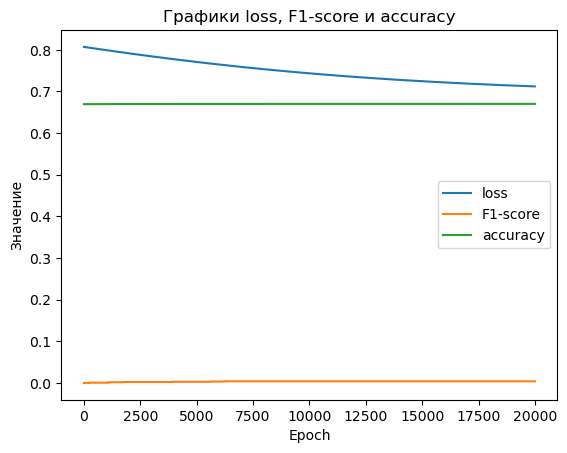

In [138]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf7['Epoch'], diagdf7['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf7['Epoch'], diagdf7['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf7['Epoch'], diagdf7['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [139]:
pred_test8=Mk8.forward(x_test.float())
pred_test_binarized8 = (pred_test8 > 0.5).float()

In [140]:
print(classification_report(y_test.to('cpu'), pred_test_binarized8.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.68      1.00      0.81      3216
         1.0       0.33      0.00      0.00      1542

    accuracy                           0.68      4758
   macro avg       0.50      0.50      0.40      4758
weighted avg       0.56      0.68      0.55      4758



In [141]:
#----------------------------------------------

<font color='red'>Experiment_#9</font>

<font color='red'>layers: 1, epochs: 20000, lr: 0.0001 -> 0.001</font>

In [142]:
#----------------------------------------------

In [143]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK9(nn.Module): #изменить название
    def __init__(self, input_size, output_size):
        super(MLP_MK9, self).__init__()
        self.fc1 = nn.Linear(input_size, output_size)
#         self.relu = nn.ReLU()
#         self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.sigmoid = nn.Sigmoid()
#         self.fc3 = nn.Linear(hidden_size, output_size) #если добавлять или изменять, то не забыть поменять название
#         self.tanh = nn.Tanh()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
#         out = self.relu(out)
#         out = self.fc2(out)
        out = self.sigmoid(out)
#         out = self.fc3(out)
#         out = self.tanh(out)
        return out

In [144]:
Mk9=MLP_MK9(1000,1) #изменить название переменной

In [145]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [146]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [147]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [148]:
Mk9=Mk9.to(dev)

In [149]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk9.parameters(), lr=0.001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf8=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(20000):
    optimizer.zero_grad()
    pred = Mk9.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf8 = pd.concat([diagdf8, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.8073622584342957   f1-score: 0.0010884354123845696   accuracy: 0.6692792773246765
Epoch:  2 , Loss:  0.8072822093963623   f1-score: 0.0010893245926126838   accuracy: 0.6695495247840881
Epoch:  3 , Loss:  0.8072021007537842   f1-score: 0.0010896213352680206   accuracy: 0.6696396470069885
Epoch:  4 , Loss:  0.8071220517158508   f1-score: 0.0010899183107540011   accuracy: 0.6697297096252441
Epoch:  5 , Loss:  0.8070420026779175   f1-score: 0.0010899183107540011   accuracy: 0.6697297096252441
Epoch:  6 , Loss:  0.8069619536399841   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  7 , Loss:  0.8068819642066956   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  8 , Loss:  0.806801974773407   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  9 , Loss:  0.8067219257354736   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  10 , Loss:  0.8066420555114746   f1-score: 0.0010902152862399817  

Epoch:  113 , Loss:  0.7985508441925049   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  114 , Loss:  0.7984737753868103   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  115 , Loss:  0.7983969449996948   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  116 , Loss:  0.7983199954032898   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  117 , Loss:  0.7982431054115295   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  118 , Loss:  0.7981663942337036   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  119 , Loss:  0.7980896234512329   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  120 , Loss:  0.7980127334594727   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  121 , Loss:  0.7979360222816467   f1-score: 0.0010902152862399817   accuracy: 0.6698198318481445
Epoch:  122 , Loss:  0.7978593111038208   f1-score: 0.0

Epoch:  207 , Loss:  0.7914693355560303   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  208 , Loss:  0.7913957238197327   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  209 , Loss:  0.7913220524787903   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  210 , Loss:  0.791248619556427   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  211 , Loss:  0.791175127029419   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  212 , Loss:  0.7911015748977661   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  213 , Loss:  0.7910282015800476   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  214 , Loss:  0.7909548282623291   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  215 , Loss:  0.7908815741539001   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  216 , Loss:  0.7908082008361816   f1-score: 0.001

Epoch:  296 , Loss:  0.7850735783576965   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  297 , Loss:  0.7850035429000854   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  298 , Loss:  0.7849335074424744   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  299 , Loss:  0.7848634719848633   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  300 , Loss:  0.7847936153411865   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  301 , Loss:  0.784723699092865   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  302 , Loss:  0.784653902053833   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  303 , Loss:  0.7845841646194458   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  304 , Loss:  0.7845143675804138   f1-score: 0.0016348774079233408   accuracy: 0.6699098944664001
Epoch:  305 , Loss:  0.7844446897506714   f1-score: 0.001

Epoch:  385 , Loss:  0.7790054082870483   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  386 , Loss:  0.7789391875267029   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  387 , Loss:  0.7788728475570679   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  388 , Loss:  0.7788066864013672   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  389 , Loss:  0.7787407040596008   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  390 , Loss:  0.7786745429039001   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  391 , Loss:  0.7786085605621338   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  392 , Loss:  0.7785425782203674   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  393 , Loss:  0.7784765958786011   f1-score: 0.0021792426705360413   accuracy: 0.6700000166893005
Epoch:  394 , Loss:  0.7784106135368347   f1-score: 0.0

Epoch:  471 , Loss:  0.7734677791595459   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  472 , Loss:  0.7734053134918213   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  473 , Loss:  0.7733428478240967   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  474 , Loss:  0.7732805013656616   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  475 , Loss:  0.7732180953025818   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  476 , Loss:  0.773155927658081   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  477 , Loss:  0.773093581199646   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  478 , Loss:  0.7730312943458557   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  479 , Loss:  0.7729691863059998   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  480 , Loss:  0.7729070782661438   f1-score: 0.002

Epoch:  555 , Loss:  0.7683739066123962   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  556 , Loss:  0.7683152556419373   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  557 , Loss:  0.7682564854621887   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  558 , Loss:  0.7681977152824402   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  559 , Loss:  0.768139123916626   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  560 , Loss:  0.7680805921554565   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  561 , Loss:  0.7680218815803528   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  562 , Loss:  0.7679634690284729   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  563 , Loss:  0.7679049968719482   f1-score: 0.0027233115397393703   accuracy: 0.6700900793075562
Epoch:  564 , Loss:  0.7678465843200684   f1-score: 0.00

Epoch:  643 , Loss:  0.7633702158927917   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  644 , Loss:  0.7633152008056641   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  645 , Loss:  0.7632604241371155   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  646 , Loss:  0.7632055282592773   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  647 , Loss:  0.763150691986084   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  648 , Loss:  0.7630959749221802   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  649 , Loss:  0.7630412578582764   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  650 , Loss:  0.7629865407943726   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  651 , Loss:  0.7629318833351135   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  652 , Loss:  0.7628774642944336   f1-score: 0.00326708401

Epoch:  728 , Loss:  0.7588536739349365   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  729 , Loss:  0.7588022947311401   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  730 , Loss:  0.7587509751319885   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  731 , Loss:  0.758699893951416   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  732 , Loss:  0.758648693561554   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  733 , Loss:  0.7585974931716919   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  734 , Loss:  0.7585463523864746   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  735 , Loss:  0.7584952116012573   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  736 , Loss:  0.7584441900253296   f1-score: 0.003267084015533328   accuracy: 0.6701802015304565
Epoch:  737 , Loss:  0.7583932876586914   f1-score: 0.003267084015

Epoch:  814 , Loss:  0.7545896768569946   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  815 , Loss:  0.75454181432724   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  816 , Loss:  0.7544941306114197   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  817 , Loss:  0.7544463872909546   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  818 , Loss:  0.754398763179779   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  819 , Loss:  0.7543510794639587   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  820 , Loss:  0.7543033957481384   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  821 , Loss:  0.7542558312416077   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  822 , Loss:  0.7542082071304321   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  823 , Loss:  0.7541607022285461   f1-score: 0.0038

Epoch:  929 , Loss:  0.7493444681167603   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  930 , Loss:  0.7493011355400085   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  931 , Loss:  0.7492576837539673   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  932 , Loss:  0.7492143511772156   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  933 , Loss:  0.7491710782051086   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  934 , Loss:  0.7491278052330017   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  935 , Loss:  0.7490845918655396   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  936 , Loss:  0.7490413188934326   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  937 , Loss:  0.74899822473526   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  938 , Loss:  0.7489550709724426   f1-score: 0.003

Epoch:  1012 , Loss:  0.7458639740943909   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1013 , Loss:  0.7458235621452332   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1014 , Loss:  0.7457830905914307   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1015 , Loss:  0.7457427382469177   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1016 , Loss:  0.74570232629776   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1017 , Loss:  0.7456619739532471   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1018 , Loss:  0.7456216812133789   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1019 , Loss:  0.7455815672874451   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1020 , Loss:  0.7455413341522217   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1021 , Loss:  0.7455011606216431   f1-sc

Epoch:  1096 , Loss:  0.7425845861434937   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1097 , Loss:  0.742546796798706   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1098 , Loss:  0.7425092458724976   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1099 , Loss:  0.7424716949462891   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1100 , Loss:  0.742434024810791   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1101 , Loss:  0.7423966526985168   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1102 , Loss:  0.7423591613769531   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1103 , Loss:  0.7423216104507446   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1104 , Loss:  0.7422842979431152   f1-score: 0.0038105607964098454   accuracy: 0.6702702641487122
Epoch:  1105 , Loss:  0.7422469258308411   f1-sc

Epoch:  1181 , Loss:  0.7394984364509583   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1182 , Loss:  0.7394635081291199   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1183 , Loss:  0.7394285202026367   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1184 , Loss:  0.7393936514854431   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1185 , Loss:  0.7393587231636047   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1186 , Loss:  0.7393239140510559   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1187 , Loss:  0.7392890453338623   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1188 , Loss:  0.7392542362213135   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1189 , Loss:  0.7392194867134094   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1190 , Loss:  0.7391847968101501   f1-score: 0.

Epoch:  1261 , Loss:  0.736793041229248   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1262 , Loss:  0.7367603778839111   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1263 , Loss:  0.736727774143219   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1264 , Loss:  0.7366952300071716   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1265 , Loss:  0.7366625666618347   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1266 , Loss:  0.7366300821304321   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1267 , Loss:  0.7365975975990295   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1268 , Loss:  0.7365650534629822   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1269 , Loss:  0.7365326285362244   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1270 , Loss:  0.7365001440048218   f1-score: 0.00

Epoch:  1341 , Loss:  0.7342672348022461   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1342 , Loss:  0.7342367768287659   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1343 , Loss:  0.7342062592506409   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1344 , Loss:  0.7341759204864502   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1345 , Loss:  0.7341454029083252   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1346 , Loss:  0.7341150641441345   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1347 , Loss:  0.7340846657752991   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1348 , Loss:  0.7340543866157532   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1349 , Loss:  0.7340239882469177   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1350 , Loss:  0.7339937090873718   f1-score: 0.

Epoch:  1420 , Loss:  0.7319367527961731   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1421 , Loss:  0.7319082021713257   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1422 , Loss:  0.7318797707557678   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1423 , Loss:  0.7318512797355652   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1424 , Loss:  0.7318229079246521   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1425 , Loss:  0.7317944765090942   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1426 , Loss:  0.7317661046981812   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1427 , Loss:  0.7317376732826233   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1428 , Loss:  0.731709361076355   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1429 , Loss:  0.7316810488700867   f1-score: 0.0

Epoch:  1501 , Loss:  0.7297040820121765   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1502 , Loss:  0.7296773195266724   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1503 , Loss:  0.7296507358551025   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1504 , Loss:  0.7296242117881775   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1505 , Loss:  0.7295976281166077   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1506 , Loss:  0.7295711040496826   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1507 , Loss:  0.7295445799827576   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1508 , Loss:  0.7295180559158325   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1509 , Loss:  0.729491651058197   f1-score: 0.004353741649538279   accuracy: 0.6703603863716125
Epoch:  1510 , Loss:  0.7294651865959167   f1-score: 0.0

Epoch:  1584 , Loss:  0.7275685667991638   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1585 , Loss:  0.7275436520576477   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1586 , Loss:  0.7275188565254211   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1587 , Loss:  0.7274941205978394   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1588 , Loss:  0.7274693250656128   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1589 , Loss:  0.7274445295333862   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1590 , Loss:  0.7274197936058044   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1591 , Loss:  0.7273951768875122   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1592 , Loss:  0.7273703813552856   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1593 , Loss:  0.7273457050323486   f1-score: 0.

Epoch:  1664 , Loss:  0.7256452441215515   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1665 , Loss:  0.7256220579147339   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1666 , Loss:  0.7255988121032715   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1667 , Loss:  0.7255755662918091   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1668 , Loss:  0.7255523204803467   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1669 , Loss:  0.7255291938781738   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1670 , Loss:  0.725506067276001   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1671 , Loss:  0.7254829406738281   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1672 , Loss:  0.7254598736763   f1-score: 0.005439216736704111   accuracy: 0.6705405116081238
Epoch:  1673 , Loss:  0.7254366278648376   f1-score: 0.0054

Epoch:  1746 , Loss:  0.7238009572029114   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1747 , Loss:  0.7237792015075684   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1748 , Loss:  0.7237575054168701   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1749 , Loss:  0.7237357497215271   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1750 , Loss:  0.7237141132354736   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1751 , Loss:  0.7236925363540649   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1752 , Loss:  0.7236708402633667   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1753 , Loss:  0.7236491441726685   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1754 , Loss:  0.7236275672912598   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1755 , Loss:  0.7236059904098511   f1-score: 0.

Epoch:  1827 , Loss:  0.7220958471298218   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1828 , Loss:  0.7220755815505981   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1829 , Loss:  0.722055196762085   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1830 , Loss:  0.7220348715782166   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1831 , Loss:  0.7220144867897034   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1832 , Loss:  0.7219942212104797   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1833 , Loss:  0.7219739556312561   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1834 , Loss:  0.7219536900520325   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1835 , Loss:  0.7219334244728088   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1836 , Loss:  0.72191321849823   f1-score: 0.006

Epoch:  1945 , Loss:  0.7198016047477722   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1946 , Loss:  0.7197830677032471   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1947 , Loss:  0.7197644710540771   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1948 , Loss:  0.719745934009552   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1949 , Loss:  0.7197274565696716   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1950 , Loss:  0.7197089791297913   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1951 , Loss:  0.7196905016899109   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1952 , Loss:  0.7196720242500305   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1953 , Loss:  0.7196536660194397   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  1954 , Loss:  0.7196351885795593   f1-score: 0.0

Epoch:  2027 , Loss:  0.718328058719635   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2028 , Loss:  0.7183107137680054   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2029 , Loss:  0.718293309211731   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2030 , Loss:  0.7182760238647461   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2031 , Loss:  0.7182586789131165   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2032 , Loss:  0.718241274356842   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2033 , Loss:  0.7182239890098572   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2034 , Loss:  0.7182066440582275   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2035 , Loss:  0.7181893587112427   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2036 , Loss:  0.7181720733642578   f1-score: 0.006

Epoch:  2107 , Loss:  0.7169780135154724   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2108 , Loss:  0.7169615626335144   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2109 , Loss:  0.7169452905654907   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2110 , Loss:  0.7169289588928223   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2111 , Loss:  0.7169126868247986   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2112 , Loss:  0.7168962955474854   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2113 , Loss:  0.7168800234794617   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2114 , Loss:  0.716863751411438   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2115 , Loss:  0.7168474793434143   f1-score: 0.006523511838167906   accuracy: 0.6707206964492798
Epoch:  2116 , Loss:  0.7168312072753906   f1-score: 0.0

Epoch:  2220 , Loss:  0.7152055501937866   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2221 , Loss:  0.715190589427948   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2222 , Loss:  0.7151755094528198   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2223 , Loss:  0.7151605486869812   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2224 , Loss:  0.7151456475257874   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2225 , Loss:  0.7151305079460144   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2226 , Loss:  0.7151156067848206   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2227 , Loss:  0.7151006460189819   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2228 , Loss:  0.7150856852531433   f1-score: 0.007065217476338148   accuracy: 0.6708108186721802
Epoch:  2229 , Loss:  0.7150707840919495   f1-score: 0.0

Epoch:  2299 , Loss:  0.7140524983406067   f1-score: 0.007606628816574812   accuracy: 0.6709008812904358
Epoch:  2300 , Loss:  0.7140382528305054   f1-score: 0.007606628816574812   accuracy: 0.6709008812904358
Epoch:  2301 , Loss:  0.7140240669250488   f1-score: 0.007606628816574812   accuracy: 0.6709008812904358
Epoch:  2302 , Loss:  0.7140098810195923   f1-score: 0.007606628816574812   accuracy: 0.6709008812904358
Epoch:  2303 , Loss:  0.7139958143234253   f1-score: 0.007606628816574812   accuracy: 0.6709008812904358
Epoch:  2304 , Loss:  0.7139816880226135   f1-score: 0.007606628816574812   accuracy: 0.6709008812904358
Epoch:  2305 , Loss:  0.7139675617218018   f1-score: 0.007606628816574812   accuracy: 0.6709008812904358
Epoch:  2306 , Loss:  0.7139534950256348   f1-score: 0.007606628816574812   accuracy: 0.6709008812904358
Epoch:  2307 , Loss:  0.713939368724823   f1-score: 0.007606628816574812   accuracy: 0.6709008812904358
Epoch:  2308 , Loss:  0.7139252424240112   f1-score: 0.0

Epoch:  2377 , Loss:  0.7129776477813721   f1-score: 0.0076045626774430275   accuracy: 0.6708108186721802
Epoch:  2378 , Loss:  0.7129642963409424   f1-score: 0.0076045626774430275   accuracy: 0.6708108186721802
Epoch:  2379 , Loss:  0.7129509449005127   f1-score: 0.0076045626774430275   accuracy: 0.6708108186721802
Epoch:  2380 , Loss:  0.7129375338554382   f1-score: 0.0076045626774430275   accuracy: 0.6708108186721802
Epoch:  2381 , Loss:  0.7129241824150085   f1-score: 0.0076045626774430275   accuracy: 0.6708108186721802
Epoch:  2382 , Loss:  0.7129108309745789   f1-score: 0.0076045626774430275   accuracy: 0.6708108186721802
Epoch:  2383 , Loss:  0.7128974795341492   f1-score: 0.0076045626774430275   accuracy: 0.6708108186721802
Epoch:  2384 , Loss:  0.7128841280937195   f1-score: 0.0076045626774430275   accuracy: 0.6708108186721802
Epoch:  2385 , Loss:  0.7128708362579346   f1-score: 0.0076045626774430275   accuracy: 0.6708108186721802
Epoch:  2386 , Loss:  0.7128575444221497   f1-

Epoch:  2484 , Loss:  0.7115983963012695   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2485 , Loss:  0.7115859985351562   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2486 , Loss:  0.711573600769043   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2487 , Loss:  0.7115611433982849   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2488 , Loss:  0.7115488052368164   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2489 , Loss:  0.7115364074707031   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2490 , Loss:  0.7115241289138794   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2491 , Loss:  0.7115117311477661   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2492 , Loss:  0.7114993929862976   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2493 , Loss:  0.7114870548248291   f1-score: 0.0

Epoch:  2563 , Loss:  0.7106451392173767   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2564 , Loss:  0.710633397102356   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2565 , Loss:  0.7106216549873352   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2566 , Loss:  0.7106099128723145   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2567 , Loss:  0.7105982899665833   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2568 , Loss:  0.7105865478515625   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2569 , Loss:  0.7105748057365417   f1-score: 0.008686210960149765   accuracy: 0.6709910035133362
Epoch:  2570 , Loss:  0.7105631828308105   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2571 , Loss:  0.7105515003204346   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2572 , Loss:  0.7105398178100586   f1-score: 0.0

Epoch:  2678 , Loss:  0.7093477845191956   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2679 , Loss:  0.7093371152877808   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2680 , Loss:  0.7093262076377869   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2681 , Loss:  0.709315299987793   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2682 , Loss:  0.7093045711517334   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2683 , Loss:  0.7092937231063843   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2684 , Loss:  0.7092828750610352   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2685 , Loss:  0.7092721462249756   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2686 , Loss:  0.7092612981796265   f1-score: 0.009226594120264053   accuracy: 0.6710810661315918
Epoch:  2687 , Loss:  0.7092506289482117   f1-score: 0.0

Epoch:  2794 , Loss:  0.7081382870674133   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2795 , Loss:  0.7081282734870911   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2796 , Loss:  0.7081182599067688   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2797 , Loss:  0.7081082463264465   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2798 , Loss:  0.708098292350769   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2799 , Loss:  0.7080882787704468   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2800 , Loss:  0.7080782055854797   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2801 , Loss:  0.7080682516098022   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2802 , Loss:  0.7080582976341248   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2803 , Loss:  0.7080482840538025   f1-score: 0.0

Epoch:  2909 , Loss:  0.7070279121398926   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2910 , Loss:  0.7070186138153076   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2911 , Loss:  0.7070093750953674   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2912 , Loss:  0.7070000171661377   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2913 , Loss:  0.7069907188415527   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2914 , Loss:  0.7069815397262573   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2915 , Loss:  0.7069722414016724   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2916 , Loss:  0.7069630026817322   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2917 , Loss:  0.706953763961792   f1-score: 0.009766684845089912   accuracy: 0.6711711883544922
Epoch:  2918 , Loss:  0.7069444060325623   f1-score: 0.0

Epoch:  2988 , Loss:  0.7063119411468506   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2989 , Loss:  0.7063031792640686   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2990 , Loss:  0.7062943577766418   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2991 , Loss:  0.7062855362892151   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2992 , Loss:  0.7062767148017883   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2993 , Loss:  0.7062678933143616   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2994 , Loss:  0.7062591314315796   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2995 , Loss:  0.7062503099441528   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2996 , Loss:  0.7062415480613708   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  2997 , Loss:  0.7062327861785889   f1-score: 0.

Epoch:  3102 , Loss:  0.7053407430648804   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3103 , Loss:  0.7053324580192566   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3104 , Loss:  0.7053242921829224   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3105 , Loss:  0.7053161263465881   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3106 , Loss:  0.7053078413009644   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3107 , Loss:  0.7052996754646301   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3108 , Loss:  0.7052915096282959   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3109 , Loss:  0.7052833437919617   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3110 , Loss:  0.7052751183509827   f1-score: 0.010306482203304768   accuracy: 0.6712612509727478
Epoch:  3111 , Loss:  0.7052669525146484   f1-score: 0.

Epoch:  3214 , Loss:  0.7044517397880554   f1-score: 0.01138519961386919   accuracy: 0.6714414358139038
Epoch:  3215 , Loss:  0.7044439911842346   f1-score: 0.01138519961386919   accuracy: 0.6714414358139038
Epoch:  3216 , Loss:  0.7044364213943481   f1-score: 0.01138519961386919   accuracy: 0.6714414358139038
Epoch:  3217 , Loss:  0.7044286727905273   f1-score: 0.01138519961386919   accuracy: 0.6714414358139038
Epoch:  3218 , Loss:  0.7044211030006409   f1-score: 0.01138519961386919   accuracy: 0.6714414358139038
Epoch:  3219 , Loss:  0.7044134736061096   f1-score: 0.01138519961386919   accuracy: 0.6714414358139038
Epoch:  3220 , Loss:  0.7044057846069336   f1-score: 0.01138519961386919   accuracy: 0.6714414358139038
Epoch:  3221 , Loss:  0.7043981552124023   f1-score: 0.01138519961386919   accuracy: 0.6714414358139038
Epoch:  3222 , Loss:  0.7043905258178711   f1-score: 0.01138519961386919   accuracy: 0.6714414358139038
Epoch:  3223 , Loss:  0.7043828964233398   f1-score: 0.011385199

Epoch:  3329 , Loss:  0.7036002278327942   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3330 , Loss:  0.7035931348800659   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3331 , Loss:  0.7035859823226929   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3332 , Loss:  0.7035788297653198   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3333 , Loss:  0.7035716772079468   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3334 , Loss:  0.7035645842552185   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3335 , Loss:  0.7035574316978455   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3336 , Loss:  0.7035502791404724   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3337 , Loss:  0.7035432457923889   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3338 , Loss:  0.7035361528396606   f1-score: 0.

Epoch:  3408 , Loss:  0.703048586845398   f1-score: 0.011924119666218758   accuracy: 0.6715315580368042
Epoch:  3409 , Loss:  0.7030417919158936   f1-score: 0.012462747283279896   accuracy: 0.6716216206550598
Epoch:  3410 , Loss:  0.7030349969863892   f1-score: 0.012462747283279896   accuracy: 0.6716216206550598
Epoch:  3411 , Loss:  0.7030282616615295   f1-score: 0.012462747283279896   accuracy: 0.6716216206550598
Epoch:  3412 , Loss:  0.7030214071273804   f1-score: 0.012462747283279896   accuracy: 0.6716216206550598
Epoch:  3413 , Loss:  0.7030145525932312   f1-score: 0.012462747283279896   accuracy: 0.6716216206550598
Epoch:  3414 , Loss:  0.7030077576637268   f1-score: 0.012462747283279896   accuracy: 0.6716216206550598
Epoch:  3415 , Loss:  0.7030009031295776   f1-score: 0.012462747283279896   accuracy: 0.6716216206550598
Epoch:  3416 , Loss:  0.702994167804718   f1-score: 0.012462747283279896   accuracy: 0.6716216206550598
Epoch:  3417 , Loss:  0.7029874324798584   f1-score: 0.01

Epoch:  3524 , Loss:  0.7022837996482849   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3525 , Loss:  0.702277421951294   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3526 , Loss:  0.7022709846496582   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3527 , Loss:  0.702264666557312   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3528 , Loss:  0.7022583484649658   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3529 , Loss:  0.7022519111633301   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3530 , Loss:  0.7022455930709839   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3531 , Loss:  0.7022393345832825   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3532 , Loss:  0.7022328972816467   f1-score: 0.013539128005504608   accuracy: 0.6718018054962158
Epoch:  3533 , Loss:  0.7022265195846558   f1-score: 0.01

Epoch:  3640 , Loss:  0.701568603515625   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3641 , Loss:  0.7015625834465027   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3642 , Loss:  0.7015566825866699   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3643 , Loss:  0.7015506625175476   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3644 , Loss:  0.7015448212623596   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3645 , Loss:  0.7015388607978821   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3646 , Loss:  0.7015328407287598   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3647 , Loss:  0.7015269994735718   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3648 , Loss:  0.7015209794044495   f1-score: 0.014614343643188477   accuracy: 0.6719819903373718
Epoch:  3649 , Loss:  0.7015150785446167   f1-score: 0.0

Epoch:  3755 , Loss:  0.7009045481681824   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3756 , Loss:  0.7008990049362183   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3757 , Loss:  0.7008932828903198   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3758 , Loss:  0.7008877992630005   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3759 , Loss:  0.7008821964263916   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3760 , Loss:  0.7008766531944275   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3761 , Loss:  0.7008709907531738   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3762 , Loss:  0.7008654475212097   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3763 , Loss:  0.7008599638938904   f1-score: 0.015688395127654076   accuracy: 0.6721621751785278
Epoch:  3764 , Loss:  0.7008544206619263   f1-score: 0.

Epoch:  3869 , Loss:  0.7002868056297302   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3870 , Loss:  0.70028156042099   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3871 , Loss:  0.7002763152122498   f1-score: 0.016761286184191704   accuracy: 0.6723423600196838
Epoch:  3872 , Loss:  0.7002710700035095   f1-score: 0.017297297716140747   accuracy: 0.6724324226379395
Epoch:  3873 , Loss:  0.7002657055854797   f1-score: 0.017297297716140747   accuracy: 0.6724324226379395
Epoch:  3874 , Loss:  0.7002605199813843   f1-score: 0.017297297716140747   accuracy: 0.6724324226379395
Epoch:  3875 , Loss:  0.700255274772644   f1-score: 0.017297297716140747   accuracy: 0.6724324226379395
Epoch:  3876 , Loss:  0.7002500295639038   f1-score: 0.017297297716140747   accuracy: 0.6724324226379395
Epoch:  3877 , Loss:  0.7002448439598083   f1-score: 0.017297297716140747   accuracy: 0.6724324226379395
Epoch:  3878 , Loss:  0.7002395987510681   f1-score: 0.017

Epoch:  3970 , Loss:  0.6997705698013306   f1-score: 0.018368449062108994   accuracy: 0.6726126074790955
Epoch:  3971 , Loss:  0.6997656226158142   f1-score: 0.018368449062108994   accuracy: 0.6726126074790955
Epoch:  3972 , Loss:  0.6997606158256531   f1-score: 0.018368449062108994   accuracy: 0.6726126074790955
Epoch:  3973 , Loss:  0.6997556090354919   f1-score: 0.018368449062108994   accuracy: 0.6726126074790955
Epoch:  3974 , Loss:  0.6997506618499756   f1-score: 0.018368449062108994   accuracy: 0.6726126074790955
Epoch:  3975 , Loss:  0.699745774269104   f1-score: 0.018368449062108994   accuracy: 0.6726126074790955
Epoch:  3976 , Loss:  0.6997407674789429   f1-score: 0.018368449062108994   accuracy: 0.6726126074790955
Epoch:  3977 , Loss:  0.6997358202934265   f1-score: 0.018368449062108994   accuracy: 0.6726126074790955
Epoch:  3978 , Loss:  0.6997308731079102   f1-score: 0.018368449062108994   accuracy: 0.6726126074790955
Epoch:  3979 , Loss:  0.6997259259223938   f1-score: 0.0

Epoch:  4082 , Loss:  0.6992296576499939   f1-score: 0.019973009824752808   accuracy: 0.6728828549385071
Epoch:  4083 , Loss:  0.6992250084877014   f1-score: 0.019973009824752808   accuracy: 0.6728828549385071
Epoch:  4084 , Loss:  0.6992202997207642   f1-score: 0.019973009824752808   accuracy: 0.6728828549385071
Epoch:  4085 , Loss:  0.6992156505584717   f1-score: 0.019973009824752808   accuracy: 0.6728828549385071
Epoch:  4086 , Loss:  0.6992110013961792   f1-score: 0.019973009824752808   accuracy: 0.6728828549385071
Epoch:  4087 , Loss:  0.6992062926292419   f1-score: 0.019973009824752808   accuracy: 0.6728828549385071
Epoch:  4088 , Loss:  0.6992015838623047   f1-score: 0.019973009824752808   accuracy: 0.6728828549385071
Epoch:  4089 , Loss:  0.6991969347000122   f1-score: 0.019973009824752808   accuracy: 0.6728828549385071
Epoch:  4090 , Loss:  0.6991922855377197   f1-score: 0.019973009824752808   accuracy: 0.6728828549385071
Epoch:  4091 , Loss:  0.6991876363754272   f1-score: 0.

Epoch:  4195 , Loss:  0.6987152099609375   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4196 , Loss:  0.6987107992172241   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4197 , Loss:  0.6987063884735107   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4198 , Loss:  0.6987019777297974   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4199 , Loss:  0.6986975073814392   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4200 , Loss:  0.6986930966377258   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4201 , Loss:  0.6986886262893677   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4202 , Loss:  0.6986843347549438   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4203 , Loss:  0.6986799240112305   f1-score: 0.021041274070739746   accuracy: 0.6730630397796631
Epoch:  4204 , Loss:  0.6986755132675171   f1-score: 0.

Epoch:  4311 , Loss:  0.6982171535491943   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4312 , Loss:  0.6982129812240601   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4313 , Loss:  0.6982088685035706   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4314 , Loss:  0.6982046961784363   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4315 , Loss:  0.698200523853302   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4316 , Loss:  0.6981963515281677   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4317 , Loss:  0.6981922388076782   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4318 , Loss:  0.6981880068778992   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4319 , Loss:  0.6981838941574097   f1-score: 0.021574972197413445   accuracy: 0.6731531620025635
Epoch:  4320 , Loss:  0.6981797218322754   f1-score: 0.0

Epoch:  4425 , Loss:  0.6977552175521851   f1-score: 0.02210838533937931   accuracy: 0.6732432246208191
Epoch:  4426 , Loss:  0.6977512240409851   f1-score: 0.02210838533937931   accuracy: 0.6732432246208191
Epoch:  4427 , Loss:  0.6977473497390747   f1-score: 0.02210838533937931   accuracy: 0.6732432246208191
Epoch:  4428 , Loss:  0.6977433562278748   f1-score: 0.02210838533937931   accuracy: 0.6732432246208191
Epoch:  4429 , Loss:  0.6977394223213196   f1-score: 0.02210838533937931   accuracy: 0.6732432246208191
Epoch:  4430 , Loss:  0.6977355480194092   f1-score: 0.02210838533937931   accuracy: 0.6732432246208191
Epoch:  4431 , Loss:  0.6977315545082092   f1-score: 0.02210838533937931   accuracy: 0.6732432246208191
Epoch:  4432 , Loss:  0.6977276802062988   f1-score: 0.02210838533937931   accuracy: 0.6732432246208191
Epoch:  4433 , Loss:  0.6977237462997437   f1-score: 0.02210838533937931   accuracy: 0.6732432246208191
Epoch:  4434 , Loss:  0.6977198123931885   f1-score: 0.022108385

Epoch:  4537 , Loss:  0.6973258852958679   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4538 , Loss:  0.6973221302032471   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4539 , Loss:  0.6973183155059814   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4540 , Loss:  0.6973146200180054   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4541 , Loss:  0.6973109245300293   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4542 , Loss:  0.6973072290420532   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4543 , Loss:  0.6973035335540771   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4544 , Loss:  0.6972997784614563   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4545 , Loss:  0.6972960829734802   f1-score: 0.022635407745838165   accuracy: 0.6732432246208191
Epoch:  4546 , Loss:  0.6972923874855042   f1-score: 0.

Epoch:  4649 , Loss:  0.6969190835952759   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4650 , Loss:  0.6969156265258789   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4651 , Loss:  0.6969120502471924   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4652 , Loss:  0.6969085335731506   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4653 , Loss:  0.6969050168991089   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4654 , Loss:  0.6969014406204224   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4655 , Loss:  0.6968979835510254   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4656 , Loss:  0.6968944072723389   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4657 , Loss:  0.6968908905982971   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4658 , Loss:  0.6968874335289001   f1-score: 0.

Epoch:  4760 , Loss:  0.6965367197990417   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4761 , Loss:  0.6965333819389343   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4762 , Loss:  0.6965299844741821   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4763 , Loss:  0.6965267062187195   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4764 , Loss:  0.6965232491493225   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4765 , Loss:  0.6965199112892151   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4766 , Loss:  0.6965166926383972   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4767 , Loss:  0.6965132355690002   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4768 , Loss:  0.6965098977088928   f1-score: 0.024764468893408775   accuracy: 0.6736035943031311
Epoch:  4769 , Loss:  0.6965065598487854   f1-score: 0.

Epoch:  4873 , Loss:  0.6961671710014343   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4874 , Loss:  0.6961639523506165   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4875 , Loss:  0.6961607933044434   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4876 , Loss:  0.6961575746536255   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4877 , Loss:  0.6961543560028076   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4878 , Loss:  0.6961513161659241   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4879 , Loss:  0.6961480379104614   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4880 , Loss:  0.6961448788642883   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4881 , Loss:  0.6961416602134705   f1-score: 0.026358257979154587   accuracy: 0.6738739013671875
Epoch:  4882 , Loss:  0.6961385011672974   f1-score: 0.

Epoch:  4988 , Loss:  0.6958100199699402   f1-score: 0.026888947933912277   accuracy: 0.6739639639854431
Epoch:  4989 , Loss:  0.6958069801330566   f1-score: 0.026888947933912277   accuracy: 0.6739639639854431
Epoch:  4990 , Loss:  0.6958039999008179   f1-score: 0.026888947933912277   accuracy: 0.6739639639854431
Epoch:  4991 , Loss:  0.6958009600639343   f1-score: 0.026888947933912277   accuracy: 0.6739639639854431
Epoch:  4992 , Loss:  0.6957979202270508   f1-score: 0.026888947933912277   accuracy: 0.6739639639854431
Epoch:  4993 , Loss:  0.6957948803901672   f1-score: 0.026888947933912277   accuracy: 0.6739639639854431
Epoch:  4994 , Loss:  0.6957918405532837   f1-score: 0.026888947933912277   accuracy: 0.6739639639854431
Epoch:  4995 , Loss:  0.6957889199256897   f1-score: 0.026888947933912277   accuracy: 0.6739639639854431
Epoch:  4996 , Loss:  0.6957858204841614   f1-score: 0.026888947933912277   accuracy: 0.6739639639854431
Epoch:  4997 , Loss:  0.6957828402519226   f1-score: 0.

Epoch:  5102 , Loss:  0.6954735517501831   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  5103 , Loss:  0.6954706907272339   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  5104 , Loss:  0.6954678893089294   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  5105 , Loss:  0.6954649686813354   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  5106 , Loss:  0.6954621076583862   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  5107 , Loss:  0.695459246635437   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  5108 , Loss:  0.6954563856124878   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  5109 , Loss:  0.6954534649848938   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  5110 , Loss:  0.6954506039619446   f1-score: 0.027419354766607285   accuracy: 0.6740540266036987
Epoch:  5111 , Loss:  0.6954476833343506   f1-score: 0.0

Epoch:  5217 , Loss:  0.6951507329940796   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5218 , Loss:  0.6951479315757751   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5219 , Loss:  0.6951451897621155   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5220 , Loss:  0.6951424479484558   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5221 , Loss:  0.6951397061347961   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5222 , Loss:  0.6951369643211365   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5223 , Loss:  0.6951342821121216   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5224 , Loss:  0.6951315402984619   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5225 , Loss:  0.6951287984848022   f1-score: 0.029008863493800163   accuracy: 0.6743243336677551
Epoch:  5226 , Loss:  0.6951261162757874   f1-score: 0.

Epoch:  5333 , Loss:  0.694840669631958   f1-score: 0.030595812946558   accuracy: 0.6745945811271667
Epoch:  5334 , Loss:  0.6948380470275879   f1-score: 0.030595812946558   accuracy: 0.6745945811271667
Epoch:  5335 , Loss:  0.694835364818573   f1-score: 0.030595812946558   accuracy: 0.6745945811271667
Epoch:  5336 , Loss:  0.6948327422142029   f1-score: 0.030595812946558   accuracy: 0.6745945811271667
Epoch:  5337 , Loss:  0.6948301196098328   f1-score: 0.030595812946558   accuracy: 0.6745945811271667
Epoch:  5338 , Loss:  0.6948276162147522   f1-score: 0.030595812946558   accuracy: 0.6745945811271667
Epoch:  5339 , Loss:  0.6948250532150269   f1-score: 0.030595812946558   accuracy: 0.6745945811271667
Epoch:  5340 , Loss:  0.694822371006012   f1-score: 0.030595812946558   accuracy: 0.6745945811271667
Epoch:  5341 , Loss:  0.6948198080062866   f1-score: 0.030595812946558   accuracy: 0.6745945811271667
Epoch:  5342 , Loss:  0.6948171854019165   f1-score: 0.030595812946558   accuracy: 0.

Epoch:  5441 , Loss:  0.6945651173591614   f1-score: 0.03218020871281624   accuracy: 0.6748648881912231
Epoch:  5442 , Loss:  0.6945626735687256   f1-score: 0.03218020871281624   accuracy: 0.6748648881912231
Epoch:  5443 , Loss:  0.6945601105690002   f1-score: 0.03218020871281624   accuracy: 0.6748648881912231
Epoch:  5444 , Loss:  0.6945577263832092   f1-score: 0.03218020871281624   accuracy: 0.6748648881912231
Epoch:  5445 , Loss:  0.6945551633834839   f1-score: 0.03218020871281624   accuracy: 0.6748648881912231
Epoch:  5446 , Loss:  0.6945526599884033   f1-score: 0.03218020871281624   accuracy: 0.6748648881912231
Epoch:  5447 , Loss:  0.6945501565933228   f1-score: 0.03218020871281624   accuracy: 0.6748648881912231
Epoch:  5448 , Loss:  0.6945476531982422   f1-score: 0.03218020871281624   accuracy: 0.6748648881912231
Epoch:  5449 , Loss:  0.6945451498031616   f1-score: 0.03218020871281624   accuracy: 0.6748648881912231
Epoch:  5450 , Loss:  0.6945427060127258   f1-score: 0.032180208

Epoch:  5549 , Loss:  0.6943014860153198   f1-score: 0.033235058188438416   accuracy: 0.6750450730323792
Epoch:  5550 , Loss:  0.6942991018295288   f1-score: 0.033235058188438416   accuracy: 0.6750450730323792
Epoch:  5551 , Loss:  0.6942967772483826   f1-score: 0.033235058188438416   accuracy: 0.6750450730323792
Epoch:  5552 , Loss:  0.6942943334579468   f1-score: 0.033235058188438416   accuracy: 0.6750450730323792
Epoch:  5553 , Loss:  0.6942919492721558   f1-score: 0.033235058188438416   accuracy: 0.6750450730323792
Epoch:  5554 , Loss:  0.69428950548172   f1-score: 0.033235058188438416   accuracy: 0.6750450730323792
Epoch:  5555 , Loss:  0.6942871809005737   f1-score: 0.033235058188438416   accuracy: 0.6750450730323792
Epoch:  5556 , Loss:  0.6942848563194275   f1-score: 0.033235058188438416   accuracy: 0.6750450730323792
Epoch:  5557 , Loss:  0.6942824125289917   f1-score: 0.033235058188438416   accuracy: 0.6750450730323792
Epoch:  5558 , Loss:  0.6942800283432007   f1-score: 0.03

Epoch:  5664 , Loss:  0.6940329670906067   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5665 , Loss:  0.6940306425094604   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5666 , Loss:  0.694028377532959   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5667 , Loss:  0.6940261125564575   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5668 , Loss:  0.6940237879753113   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5669 , Loss:  0.6940215826034546   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5670 , Loss:  0.6940193176269531   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5671 , Loss:  0.6940170526504517   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5672 , Loss:  0.6940146684646606   f1-score: 0.03534136712551117   accuracy: 0.6754053831100464
Epoch:  5673 , Loss:  0.694012463092804   f1-score: 0.03534136712

Epoch:  5776 , Loss:  0.6937828063964844   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5777 , Loss:  0.6937805414199829   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5778 , Loss:  0.693778395652771   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5779 , Loss:  0.6937762498855591   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5780 , Loss:  0.6937739849090576   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5781 , Loss:  0.6937718391418457   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5782 , Loss:  0.6937696933746338   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5783 , Loss:  0.6937674283981323   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5784 , Loss:  0.6937653422355652   f1-score: 0.03586723655462265   accuracy: 0.6754955053329468
Epoch:  5785 , Loss:  0.6937631368637085   f1-score: 0.0358672365

Epoch:  5856 , Loss:  0.693610429763794   f1-score: 0.03691813722252846   accuracy: 0.6756756901741028
Epoch:  5857 , Loss:  0.6936083436012268   f1-score: 0.03691813722252846   accuracy: 0.6756756901741028
Epoch:  5858 , Loss:  0.6936061978340149   f1-score: 0.03691813722252846   accuracy: 0.6756756901741028
Epoch:  5859 , Loss:  0.6936041116714478   f1-score: 0.03691813722252846   accuracy: 0.6756756901741028
Epoch:  5860 , Loss:  0.6936019659042358   f1-score: 0.03691813722252846   accuracy: 0.6756756901741028
Epoch:  5861 , Loss:  0.6935998797416687   f1-score: 0.03691813722252846   accuracy: 0.6756756901741028
Epoch:  5862 , Loss:  0.6935977339744568   f1-score: 0.03691813722252846   accuracy: 0.6756756901741028
Epoch:  5863 , Loss:  0.6935956478118896   f1-score: 0.03691813722252846   accuracy: 0.6756756901741028
Epoch:  5864 , Loss:  0.6935935020446777   f1-score: 0.03691813722252846   accuracy: 0.6756756901741028
Epoch:  5865 , Loss:  0.6935914158821106   f1-score: 0.0369181372

Epoch:  5935 , Loss:  0.6934453248977661   f1-score: 0.03691813722252846   accuracy: 0.6756756901741028
Epoch:  5936 , Loss:  0.693443238735199   f1-score: 0.037443168461322784   accuracy: 0.6757657527923584
Epoch:  5937 , Loss:  0.6934411525726318   f1-score: 0.037443168461322784   accuracy: 0.6757657527923584
Epoch:  5938 , Loss:  0.6934390664100647   f1-score: 0.03796791285276413   accuracy: 0.6758558750152588
Epoch:  5939 , Loss:  0.6934370994567871   f1-score: 0.03796791285276413   accuracy: 0.6758558750152588
Epoch:  5940 , Loss:  0.6934349536895752   f1-score: 0.03796791285276413   accuracy: 0.6758558750152588
Epoch:  5941 , Loss:  0.6934329271316528   f1-score: 0.03796791285276413   accuracy: 0.6758558750152588
Epoch:  5942 , Loss:  0.6934309005737305   f1-score: 0.03796791285276413   accuracy: 0.6758558750152588
Epoch:  5943 , Loss:  0.6934288144111633   f1-score: 0.03796791285276413   accuracy: 0.6758558750152588
Epoch:  5944 , Loss:  0.6934266686439514   f1-score: 0.03796791

Epoch:  6051 , Loss:  0.6932112574577332   f1-score: 0.04058745130896568   accuracy: 0.6763063073158264
Epoch:  6052 , Loss:  0.6932092308998108   f1-score: 0.04058745130896568   accuracy: 0.6763063073158264
Epoch:  6053 , Loss:  0.6932072639465332   f1-score: 0.04058745130896568   accuracy: 0.6763063073158264
Epoch:  6054 , Loss:  0.6932052373886108   f1-score: 0.04058745130896568   accuracy: 0.6763063073158264
Epoch:  6055 , Loss:  0.693203330039978   f1-score: 0.04058745130896568   accuracy: 0.6763063073158264
Epoch:  6056 , Loss:  0.6932013034820557   f1-score: 0.04058745130896568   accuracy: 0.6763063073158264
Epoch:  6057 , Loss:  0.6931993365287781   f1-score: 0.04058745130896568   accuracy: 0.6763063073158264
Epoch:  6058 , Loss:  0.6931974291801453   f1-score: 0.04058745130896568   accuracy: 0.6763063073158264
Epoch:  6059 , Loss:  0.6931954026222229   f1-score: 0.04058745130896568   accuracy: 0.6763063073158264
Epoch:  6060 , Loss:  0.6931934356689453   f1-score: 0.0405874513

Epoch:  6166 , Loss:  0.6929884552955627   f1-score: 0.04163330793380737   accuracy: 0.6764864921569824
Epoch:  6167 , Loss:  0.6929865479469299   f1-score: 0.04163330793380737   accuracy: 0.6764864921569824
Epoch:  6168 , Loss:  0.6929847002029419   f1-score: 0.04163330793380737   accuracy: 0.6764864921569824
Epoch:  6169 , Loss:  0.6929827332496643   f1-score: 0.04163330793380737   accuracy: 0.6764864921569824
Epoch:  6170 , Loss:  0.6929808259010315   f1-score: 0.04163330793380737   accuracy: 0.6764864921569824
Epoch:  6171 , Loss:  0.6929790377616882   f1-score: 0.04163330793380737   accuracy: 0.6764864921569824
Epoch:  6172 , Loss:  0.6929771304130554   f1-score: 0.04163330793380737   accuracy: 0.6764864921569824
Epoch:  6173 , Loss:  0.6929751634597778   f1-score: 0.04163330793380737   accuracy: 0.6764864921569824
Epoch:  6174 , Loss:  0.6929733157157898   f1-score: 0.04163330793380737   accuracy: 0.6764864921569824
Epoch:  6175 , Loss:  0.692971408367157   f1-score: 0.0416333079

Epoch:  6277 , Loss:  0.6927817463874817   f1-score: 0.04320000112056732   accuracy: 0.676756739616394
Epoch:  6278 , Loss:  0.6927799582481384   f1-score: 0.04320000112056732   accuracy: 0.676756739616394
Epoch:  6279 , Loss:  0.6927781105041504   f1-score: 0.04320000112056732   accuracy: 0.676756739616394
Epoch:  6280 , Loss:  0.6927762031555176   f1-score: 0.04320000112056732   accuracy: 0.676756739616394
Epoch:  6281 , Loss:  0.6927744150161743   f1-score: 0.04320000112056732   accuracy: 0.676756739616394
Epoch:  6282 , Loss:  0.6927725672721863   f1-score: 0.04320000112056732   accuracy: 0.676756739616394
Epoch:  6283 , Loss:  0.692770779132843   f1-score: 0.04320000112056732   accuracy: 0.676756739616394
Epoch:  6284 , Loss:  0.692768931388855   f1-score: 0.04320000112056732   accuracy: 0.676756739616394
Epoch:  6285 , Loss:  0.6927671432495117   f1-score: 0.04320000112056732   accuracy: 0.676756739616394
Epoch:  6286 , Loss:  0.6927652955055237   f1-score: 0.04320000112056732   

Epoch:  6392 , Loss:  0.6925755739212036   f1-score: 0.04528502747416496   accuracy: 0.677117109298706
Epoch:  6393 , Loss:  0.6925737857818604   f1-score: 0.04528502747416496   accuracy: 0.677117109298706
Epoch:  6394 , Loss:  0.6925719976425171   f1-score: 0.045805592089891434   accuracy: 0.6772072315216064
Epoch:  6395 , Loss:  0.6925702095031738   f1-score: 0.045805592089891434   accuracy: 0.6772072315216064
Epoch:  6396 , Loss:  0.6925684809684753   f1-score: 0.045805592089891434   accuracy: 0.6772072315216064
Epoch:  6397 , Loss:  0.6925667524337769   f1-score: 0.045805592089891434   accuracy: 0.6772072315216064
Epoch:  6398 , Loss:  0.6925650238990784   f1-score: 0.045805592089891434   accuracy: 0.6772072315216064
Epoch:  6399 , Loss:  0.6925631761550903   f1-score: 0.04632587730884552   accuracy: 0.6772972941398621
Epoch:  6400 , Loss:  0.6925614476203918   f1-score: 0.04632587730884552   accuracy: 0.6772972941398621
Epoch:  6401 , Loss:  0.6925597190856934   f1-score: 0.046325

Epoch:  6508 , Loss:  0.6923750638961792   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6509 , Loss:  0.6923734545707703   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6510 , Loss:  0.6923717260360718   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6511 , Loss:  0.6923700571060181   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6512 , Loss:  0.6923683285713196   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6513 , Loss:  0.6923666596412659   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6514 , Loss:  0.6923649907112122   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6515 , Loss:  0.6923633217811584   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6516 , Loss:  0.6923616528511047   f1-score: 0.04892315715551376   accuracy: 0.6777477264404297
Epoch:  6517 , Loss:  0.6923598051071167   f1-score: 0.048923157

Epoch:  6622 , Loss:  0.6921852231025696   f1-score: 0.05099601671099663   accuracy: 0.6781080961227417
Epoch:  6623 , Loss:  0.6921835541725159   f1-score: 0.05099601671099663   accuracy: 0.6781080961227417
Epoch:  6624 , Loss:  0.6921818852424622   f1-score: 0.05099601671099663   accuracy: 0.6781080961227417
Epoch:  6625 , Loss:  0.6921802759170532   f1-score: 0.05099601671099663   accuracy: 0.6781080961227417
Epoch:  6626 , Loss:  0.6921786069869995   f1-score: 0.05099601671099663   accuracy: 0.6781080961227417
Epoch:  6627 , Loss:  0.6921770572662354   f1-score: 0.05099601671099663   accuracy: 0.6781080961227417
Epoch:  6628 , Loss:  0.6921753287315369   f1-score: 0.05099601671099663   accuracy: 0.6781080961227417
Epoch:  6629 , Loss:  0.6921737790107727   f1-score: 0.05099601671099663   accuracy: 0.6781080961227417
Epoch:  6630 , Loss:  0.692172110080719   f1-score: 0.05099601671099663   accuracy: 0.6781080961227417
Epoch:  6631 , Loss:  0.6921704411506653   f1-score: 0.0509960167

Epoch:  6735 , Loss:  0.6920032501220703   f1-score: 0.05358090251684189   accuracy: 0.6785585880279541
Epoch:  6736 , Loss:  0.6920016407966614   f1-score: 0.05358090251684189   accuracy: 0.6785585880279541
Epoch:  6737 , Loss:  0.6920000910758972   f1-score: 0.05358090251684189   accuracy: 0.6785585880279541
Epoch:  6738 , Loss:  0.6919984221458435   f1-score: 0.05358090251684189   accuracy: 0.6785585880279541
Epoch:  6739 , Loss:  0.6919969320297241   f1-score: 0.05358090251684189   accuracy: 0.6785585880279541
Epoch:  6740 , Loss:  0.6919954419136047   f1-score: 0.05358090251684189   accuracy: 0.6785585880279541
Epoch:  6741 , Loss:  0.6919937133789062   f1-score: 0.05358090251684189   accuracy: 0.6785585880279541
Epoch:  6742 , Loss:  0.6919921040534973   f1-score: 0.05358090251684189   accuracy: 0.6785585880279541
Epoch:  6743 , Loss:  0.6919906139373779   f1-score: 0.05409705638885498   accuracy: 0.6786486506462097
Epoch:  6744 , Loss:  0.6919890642166138   f1-score: 0.054097056

Epoch:  6837 , Loss:  0.69184410572052   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6838 , Loss:  0.6918425559997559   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6839 , Loss:  0.6918410658836365   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6840 , Loss:  0.6918395161628723   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6841 , Loss:  0.6918379068374634   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6842 , Loss:  0.6918364763259888   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6843 , Loss:  0.6918349266052246   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6844 , Loss:  0.6918333172798157   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6845 , Loss:  0.6918318271636963   f1-score: 0.054612938314676285   accuracy: 0.6787387132644653
Epoch:  6846 , Loss:  0.6918302774429321   f1-score: 0.05

Epoch:  6935 , Loss:  0.691695511341095   f1-score: 0.05564387887716293   accuracy: 0.6789188981056213
Epoch:  6936 , Loss:  0.6916939616203308   f1-score: 0.05564387887716293   accuracy: 0.6789188981056213
Epoch:  6937 , Loss:  0.6916924715042114   f1-score: 0.05564387887716293   accuracy: 0.6789188981056213
Epoch:  6938 , Loss:  0.691690981388092   f1-score: 0.05564387887716293   accuracy: 0.6789188981056213
Epoch:  6939 , Loss:  0.6916894912719727   f1-score: 0.05564387887716293   accuracy: 0.6789188981056213
Epoch:  6940 , Loss:  0.6916880011558533   f1-score: 0.05564387887716293   accuracy: 0.6789188981056213
Epoch:  6941 , Loss:  0.6916864514350891   f1-score: 0.05564387887716293   accuracy: 0.6789188981056213
Epoch:  6942 , Loss:  0.6916849613189697   f1-score: 0.05564387887716293   accuracy: 0.6789188981056213
Epoch:  6943 , Loss:  0.6916834712028503   f1-score: 0.05564387887716293   accuracy: 0.6789188981056213
Epoch:  6944 , Loss:  0.6916819214820862   f1-score: 0.05564387887

Epoch:  7043 , Loss:  0.6915360689163208   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  7044 , Loss:  0.6915346384048462   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  7045 , Loss:  0.6915331482887268   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  7046 , Loss:  0.691531777381897   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  7047 , Loss:  0.6915302872657776   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  7048 , Loss:  0.691528856754303   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  7049 , Loss:  0.6915274262428284   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  7050 , Loss:  0.691525936126709   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  7051 , Loss:  0.6915245056152344   f1-score: 0.056158941239118576   accuracy: 0.6790090203285217
Epoch:  7052 , Loss:  0.691523015499115   f1-score: 0.0561

Epoch:  7152 , Loss:  0.6913797855377197   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7153 , Loss:  0.6913783550262451   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7154 , Loss:  0.6913769841194153   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7155 , Loss:  0.6913754940032959   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7156 , Loss:  0.6913741230964661   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7157 , Loss:  0.6913726329803467   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7158 , Loss:  0.6913713216781616   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7159 , Loss:  0.6913698315620422   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7160 , Loss:  0.6913684606552124   f1-score: 0.05770248919725418   accuracy: 0.6792792677879333
Epoch:  7161 , Loss:  0.691366970539093   f1-score: 0.0577024891

Epoch:  7260 , Loss:  0.691228985786438   f1-score: 0.058216460049152374   accuracy: 0.6793693900108337
Epoch:  7261 , Loss:  0.6912275552749634   f1-score: 0.058216460049152374   accuracy: 0.6793693900108337
Epoch:  7262 , Loss:  0.6912262439727783   f1-score: 0.058216460049152374   accuracy: 0.6793693900108337
Epoch:  7263 , Loss:  0.6912248730659485   f1-score: 0.058216460049152374   accuracy: 0.6793693900108337
Epoch:  7264 , Loss:  0.6912235617637634   f1-score: 0.058216460049152374   accuracy: 0.6793693900108337
Epoch:  7265 , Loss:  0.6912220120429993   f1-score: 0.058216460049152374   accuracy: 0.6793693900108337
Epoch:  7266 , Loss:  0.6912207007408142   f1-score: 0.058216460049152374   accuracy: 0.6793693900108337
Epoch:  7267 , Loss:  0.6912193298339844   f1-score: 0.058216460049152374   accuracy: 0.6793693900108337
Epoch:  7268 , Loss:  0.6912180185317993   f1-score: 0.058216460049152374   accuracy: 0.6793693900108337
Epoch:  7269 , Loss:  0.6912165880203247   f1-score: 0.0

Epoch:  7371 , Loss:  0.6910779476165771   f1-score: 0.059227921068668365   accuracy: 0.6794594526290894
Epoch:  7372 , Loss:  0.6910766363143921   f1-score: 0.059227921068668365   accuracy: 0.6794594526290894
Epoch:  7373 , Loss:  0.6910752654075623   f1-score: 0.059227921068668365   accuracy: 0.6794594526290894
Epoch:  7374 , Loss:  0.6910739541053772   f1-score: 0.059227921068668365   accuracy: 0.6794594526290894
Epoch:  7375 , Loss:  0.6910725831985474   f1-score: 0.059227921068668365   accuracy: 0.6794594526290894
Epoch:  7376 , Loss:  0.6910712718963623   f1-score: 0.05974094569683075   accuracy: 0.6795495748519897
Epoch:  7377 , Loss:  0.6910699009895325   f1-score: 0.05974094569683075   accuracy: 0.6795495748519897
Epoch:  7378 , Loss:  0.6910685896873474   f1-score: 0.05974094569683075   accuracy: 0.6795495748519897
Epoch:  7379 , Loss:  0.6910672783851624   f1-score: 0.060253698378801346   accuracy: 0.6796396374702454
Epoch:  7380 , Loss:  0.6910658478736877   f1-score: 0.060

Epoch:  7483 , Loss:  0.6909293532371521   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7484 , Loss:  0.6909281015396118   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7485 , Loss:  0.6909268498420715   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7486 , Loss:  0.6909255385398865   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7487 , Loss:  0.6909241676330566   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7488 , Loss:  0.6909229159355164   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7489 , Loss:  0.6909215450286865   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7490 , Loss:  0.6909201741218567   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7491 , Loss:  0.6909189820289612   f1-score: 0.06230200454592705   accuracy: 0.6800000071525574
Epoch:  7492 , Loss:  0.6909176111221313   f1-score: 0.062302004

Epoch:  7597 , Loss:  0.6907818913459778   f1-score: 0.06434599310159683   accuracy: 0.6803603768348694
Epoch:  7598 , Loss:  0.690780520439148   f1-score: 0.06434599310159683   accuracy: 0.6803603768348694
Epoch:  7599 , Loss:  0.6907792687416077   f1-score: 0.06434599310159683   accuracy: 0.6803603768348694
Epoch:  7600 , Loss:  0.6907778978347778   f1-score: 0.06434599310159683   accuracy: 0.6803603768348694
Epoch:  7601 , Loss:  0.6907767057418823   f1-score: 0.06434599310159683   accuracy: 0.6803603768348694
Epoch:  7602 , Loss:  0.6907753944396973   f1-score: 0.06434599310159683   accuracy: 0.6803603768348694
Epoch:  7603 , Loss:  0.690774142742157   f1-score: 0.06434599310159683   accuracy: 0.6803603768348694
Epoch:  7604 , Loss:  0.6907728910446167   f1-score: 0.06434599310159683   accuracy: 0.6803603768348694
Epoch:  7605 , Loss:  0.6907715797424316   f1-score: 0.06434599310159683   accuracy: 0.6803603768348694
Epoch:  7606 , Loss:  0.6907702684402466   f1-score: 0.06434599310

Epoch:  7709 , Loss:  0.6906400322914124   f1-score: 0.06585879623889923   accuracy: 0.6805405616760254
Epoch:  7710 , Loss:  0.6906387209892273   f1-score: 0.06585879623889923   accuracy: 0.6805405616760254
Epoch:  7711 , Loss:  0.6906375288963318   f1-score: 0.06585879623889923   accuracy: 0.6805405616760254
Epoch:  7712 , Loss:  0.6906362771987915   f1-score: 0.06585879623889923   accuracy: 0.6805405616760254
Epoch:  7713 , Loss:  0.6906349658966064   f1-score: 0.06636818498373032   accuracy: 0.680630624294281
Epoch:  7714 , Loss:  0.6906337738037109   f1-score: 0.06636818498373032   accuracy: 0.680630624294281
Epoch:  7715 , Loss:  0.6906325817108154   f1-score: 0.06636818498373032   accuracy: 0.680630624294281
Epoch:  7716 , Loss:  0.6906312704086304   f1-score: 0.06636818498373032   accuracy: 0.680630624294281
Epoch:  7717 , Loss:  0.6906300187110901   f1-score: 0.06636818498373032   accuracy: 0.680630624294281
Epoch:  7718 , Loss:  0.6906288266181946   f1-score: 0.06636818498373

Epoch:  7820 , Loss:  0.6905025243759155   f1-score: 0.06840305030345917   accuracy: 0.680990993976593
Epoch:  7821 , Loss:  0.69050133228302   f1-score: 0.06840305030345917   accuracy: 0.680990993976593
Epoch:  7822 , Loss:  0.6905000805854797   f1-score: 0.06840305030345917   accuracy: 0.680990993976593
Epoch:  7823 , Loss:  0.6904988288879395   f1-score: 0.06840305030345917   accuracy: 0.680990993976593
Epoch:  7824 , Loss:  0.690497636795044   f1-score: 0.06840305030345917   accuracy: 0.680990993976593
Epoch:  7825 , Loss:  0.6904963254928589   f1-score: 0.06840305030345917   accuracy: 0.680990993976593
Epoch:  7826 , Loss:  0.6904951333999634   f1-score: 0.06840305030345917   accuracy: 0.680990993976593
Epoch:  7827 , Loss:  0.6904939413070679   f1-score: 0.06840305030345917   accuracy: 0.680990993976593
Epoch:  7828 , Loss:  0.6904926300048828   f1-score: 0.06840305030345917   accuracy: 0.680990993976593
Epoch:  7829 , Loss:  0.6904914379119873   f1-score: 0.06840305030345917   a

Epoch:  7935 , Loss:  0.6903629302978516   f1-score: 0.06992639601230621   accuracy: 0.6812612414360046
Epoch:  7936 , Loss:  0.6903616786003113   f1-score: 0.06992639601230621   accuracy: 0.6812612414360046
Epoch:  7937 , Loss:  0.6903604865074158   f1-score: 0.06992639601230621   accuracy: 0.6812612414360046
Epoch:  7938 , Loss:  0.6903592944145203   f1-score: 0.06992639601230621   accuracy: 0.6812612414360046
Epoch:  7939 , Loss:  0.6903581023216248   f1-score: 0.06992639601230621   accuracy: 0.6812612414360046
Epoch:  7940 , Loss:  0.690356969833374   f1-score: 0.06992639601230621   accuracy: 0.6812612414360046
Epoch:  7941 , Loss:  0.6903557181358337   f1-score: 0.06992639601230621   accuracy: 0.6812612414360046
Epoch:  7942 , Loss:  0.6903544664382935   f1-score: 0.07043363898992538   accuracy: 0.681351363658905
Epoch:  7943 , Loss:  0.690353274345398   f1-score: 0.07043363898992538   accuracy: 0.681351363658905
Epoch:  7944 , Loss:  0.6903520226478577   f1-score: 0.0704336389899

Epoch:  8050 , Loss:  0.6902260184288025   f1-score: 0.07195378094911575   accuracy: 0.6816216111183167
Epoch:  8051 , Loss:  0.690224826335907   f1-score: 0.07195378094911575   accuracy: 0.6816216111183167
Epoch:  8052 , Loss:  0.6902236342430115   f1-score: 0.07195378094911575   accuracy: 0.6816216111183167
Epoch:  8053 , Loss:  0.6902223229408264   f1-score: 0.07195378094911575   accuracy: 0.6816216111183167
Epoch:  8054 , Loss:  0.6902213096618652   f1-score: 0.07195378094911575   accuracy: 0.6816216111183167
Epoch:  8055 , Loss:  0.690220057964325   f1-score: 0.07195378094911575   accuracy: 0.6816216111183167
Epoch:  8056 , Loss:  0.6902189254760742   f1-score: 0.07195378094911575   accuracy: 0.6816216111183167
Epoch:  8057 , Loss:  0.6902177929878235   f1-score: 0.07195378094911575   accuracy: 0.6816216111183167
Epoch:  8058 , Loss:  0.6902165412902832   f1-score: 0.07195378094911575   accuracy: 0.6816216111183167
Epoch:  8059 , Loss:  0.6902154088020325   f1-score: 0.07195378094

Epoch:  8159 , Loss:  0.6900984048843384   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8160 , Loss:  0.6900972723960876   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8161 , Loss:  0.6900961995124817   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8162 , Loss:  0.6900949478149414   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8163 , Loss:  0.6900938749313354   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8164 , Loss:  0.6900926828384399   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8165 , Loss:  0.6900915503501892   f1-score: 0.0744820386171341   accuracy: 0.6820720434188843
Epoch:  8166 , Loss:  0.6900903582572937   f1-score: 0.07498688995838165   accuracy: 0.6821621656417847
Epoch:  8167 , Loss:  0.6900891661643982   f1-score: 0.07498688995838165   accuracy: 0.6821621656417847
Epoch:  8168 , Loss:  0.6900879740715027   f1-score: 0.0749868899583816

Epoch:  8276 , Loss:  0.6899638772010803   f1-score: 0.07649987190961838   accuracy: 0.6824324131011963
Epoch:  8277 , Loss:  0.6899627447128296   f1-score: 0.07649987190961838   accuracy: 0.6824324131011963
Epoch:  8278 , Loss:  0.6899615526199341   f1-score: 0.07649987190961838   accuracy: 0.6824324131011963
Epoch:  8279 , Loss:  0.6899604797363281   f1-score: 0.07649987190961838   accuracy: 0.6824324131011963
Epoch:  8280 , Loss:  0.6899592876434326   f1-score: 0.07649987190961838   accuracy: 0.6824324131011963
Epoch:  8281 , Loss:  0.6899581551551819   f1-score: 0.07649987190961838   accuracy: 0.6824324131011963
Epoch:  8282 , Loss:  0.6899570226669312   f1-score: 0.07649987190961838   accuracy: 0.6824324131011963
Epoch:  8283 , Loss:  0.6899558305740356   f1-score: 0.07649987190961838   accuracy: 0.6824324131011963
Epoch:  8284 , Loss:  0.6899548172950745   f1-score: 0.07649987190961838   accuracy: 0.6824324131011963
Epoch:  8285 , Loss:  0.689953625202179   f1-score: 0.0764998719

Epoch:  8381 , Loss:  0.6898449063301086   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8382 , Loss:  0.6898437738418579   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8383 , Loss:  0.6898426413536072   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8384 , Loss:  0.6898415088653564   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8385 , Loss:  0.6898403167724609   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8386 , Loss:  0.6898393034934998   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8387 , Loss:  0.6898381114006042   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8388 , Loss:  0.6898369789123535   f1-score: 0.0769835039973259   accuracy: 0.6824324131011963
Epoch:  8389 , Loss:  0.6898358464241028   f1-score: 0.07748690992593765   accuracy: 0.6825225353240967
Epoch:  8390 , Loss:  0.689834713935852   f1-score: 0.07748690992593765 

Epoch:  8494 , Loss:  0.6897186636924744   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8495 , Loss:  0.6897175312042236   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8496 , Loss:  0.6897163987159729   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8497 , Loss:  0.6897153258323669   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8498 , Loss:  0.6897141933441162   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8499 , Loss:  0.6897131204605103   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8500 , Loss:  0.6897119879722595   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8501 , Loss:  0.6897109150886536   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8502 , Loss:  0.6897097826004028   f1-score: 0.08050183206796646   accuracy: 0.6830630898475647
Epoch:  8503 , Loss:  0.6897086501121521   f1-score: 0.080501832

Epoch:  8608 , Loss:  0.6895931363105774   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8609 , Loss:  0.6895920038223267   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8610 , Loss:  0.6895909309387207   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8611 , Loss:  0.68958979845047   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8612 , Loss:  0.6895886063575745   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8613 , Loss:  0.6895875930786133   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8614 , Loss:  0.6895865201950073   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8615 , Loss:  0.6895853877067566   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8616 , Loss:  0.6895843148231506   f1-score: 0.0815047025680542   accuracy: 0.6832432150840759
Epoch:  8617 , Loss:  0.6895832419395447   f1-score: 0.0815047025680542   a

Epoch:  8722 , Loss:  0.689469039440155   f1-score: 0.08300704509019852   accuracy: 0.6835135221481323
Epoch:  8723 , Loss:  0.6894680261611938   f1-score: 0.08300704509019852   accuracy: 0.6835135221481323
Epoch:  8724 , Loss:  0.6894669532775879   f1-score: 0.08300704509019852   accuracy: 0.6835135221481323
Epoch:  8725 , Loss:  0.6894658207893372   f1-score: 0.08300704509019852   accuracy: 0.6835135221481323
Epoch:  8726 , Loss:  0.6894646883010864   f1-score: 0.08300704509019852   accuracy: 0.6835135221481323
Epoch:  8727 , Loss:  0.6894636750221252   f1-score: 0.08300704509019852   accuracy: 0.6835135221481323
Epoch:  8728 , Loss:  0.6894626617431641   f1-score: 0.08300704509019852   accuracy: 0.6835135221481323
Epoch:  8729 , Loss:  0.6894615292549133   f1-score: 0.08300704509019852   accuracy: 0.6835135221481323
Epoch:  8730 , Loss:  0.6894604563713074   f1-score: 0.08300704509019852   accuracy: 0.6835135221481323
Epoch:  8731 , Loss:  0.6894593238830566   f1-score: 0.0830070450

Epoch:  8837 , Loss:  0.6893455386161804   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8838 , Loss:  0.6893444657325745   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8839 , Loss:  0.6893434524536133   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8840 , Loss:  0.6893422603607178   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8841 , Loss:  0.6893413066864014   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8842 , Loss:  0.6893402934074402   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8843 , Loss:  0.6893392205238342   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8844 , Loss:  0.6893380880355835   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8845 , Loss:  0.6893370151519775   f1-score: 0.08398539572954178   accuracy: 0.6836035847663879
Epoch:  8846 , Loss:  0.6893360018730164   f1-score: 0.083985395

Epoch:  8949 , Loss:  0.6892265677452087   f1-score: 0.08498436212539673   accuracy: 0.683783769607544
Epoch:  8950 , Loss:  0.6892256140708923   f1-score: 0.08498436212539673   accuracy: 0.683783769607544
Epoch:  8951 , Loss:  0.6892246007919312   f1-score: 0.08498436212539673   accuracy: 0.683783769607544
Epoch:  8952 , Loss:  0.6892234086990356   f1-score: 0.08498436212539673   accuracy: 0.683783769607544
Epoch:  8953 , Loss:  0.6892223954200745   f1-score: 0.08498436212539673   accuracy: 0.683783769607544
Epoch:  8954 , Loss:  0.6892213225364685   f1-score: 0.08498436212539673   accuracy: 0.683783769607544
Epoch:  8955 , Loss:  0.6892202496528625   f1-score: 0.08498436212539673   accuracy: 0.683783769607544
Epoch:  8956 , Loss:  0.6892192363739014   f1-score: 0.08498436212539673   accuracy: 0.683783769607544
Epoch:  8957 , Loss:  0.6892182230949402   f1-score: 0.08498436212539673   accuracy: 0.683783769607544
Epoch:  8958 , Loss:  0.6892171502113342   f1-score: 0.08498436212539673 

Epoch:  9057 , Loss:  0.6891131401062012   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9058 , Loss:  0.6891120672225952   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9059 , Loss:  0.689111053943634   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9060 , Loss:  0.6891100406646729   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9061 , Loss:  0.6891089677810669   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9062 , Loss:  0.6891080141067505   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9063 , Loss:  0.6891068816184998   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9064 , Loss:  0.6891058683395386   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9065 , Loss:  0.6891047358512878   f1-score: 0.08648085594177246   accuracy: 0.6840540766716003
Epoch:  9066 , Loss:  0.6891036629676819   f1-score: 0.0864808559

Epoch:  9166 , Loss:  0.6889997720718384   f1-score: 0.08847254514694214   accuracy: 0.6844143867492676
Epoch:  9167 , Loss:  0.6889987587928772   f1-score: 0.08847254514694214   accuracy: 0.6844143867492676
Epoch:  9168 , Loss:  0.688997745513916   f1-score: 0.08847254514694214   accuracy: 0.6844143867492676
Epoch:  9169 , Loss:  0.6889967322349548   f1-score: 0.08847254514694214   accuracy: 0.6844143867492676
Epoch:  9170 , Loss:  0.6889957189559937   f1-score: 0.08847254514694214   accuracy: 0.6844143867492676
Epoch:  9171 , Loss:  0.6889946460723877   f1-score: 0.08847254514694214   accuracy: 0.6844143867492676
Epoch:  9172 , Loss:  0.6889936327934265   f1-score: 0.08847254514694214   accuracy: 0.6844143867492676
Epoch:  9173 , Loss:  0.6889925599098206   f1-score: 0.08847254514694214   accuracy: 0.6844143867492676
Epoch:  9174 , Loss:  0.6889915466308594   f1-score: 0.08847254514694214   accuracy: 0.6844143867492676
Epoch:  9175 , Loss:  0.6889904737472534   f1-score: 0.0884725451

Epoch:  9279 , Loss:  0.6888834238052368   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9280 , Loss:  0.6888824105262756   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9281 , Loss:  0.6888813972473145   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9282 , Loss:  0.6888803839683533   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9283 , Loss:  0.6888793706893921   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9284 , Loss:  0.6888783574104309   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9285 , Loss:  0.6888773441314697   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9286 , Loss:  0.6888762712478638   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9287 , Loss:  0.6888751983642578   f1-score: 0.08896982669830322   accuracy: 0.684504508972168
Epoch:  9288 , Loss:  0.6888742446899414   f1-score: 0.08896982669830322 

Epoch:  9392 , Loss:  0.688768208026886   f1-score: 0.09046009927988052   accuracy: 0.6847747564315796
Epoch:  9393 , Loss:  0.6887671947479248   f1-score: 0.09046009927988052   accuracy: 0.6847747564315796
Epoch:  9394 , Loss:  0.6887661814689636   f1-score: 0.09046009927988052   accuracy: 0.6847747564315796
Epoch:  9395 , Loss:  0.6887652277946472   f1-score: 0.09046009927988052   accuracy: 0.6847747564315796
Epoch:  9396 , Loss:  0.6887641549110413   f1-score: 0.09046009927988052   accuracy: 0.6847747564315796
Epoch:  9397 , Loss:  0.6887632012367249   f1-score: 0.09046009927988052   accuracy: 0.6847747564315796
Epoch:  9398 , Loss:  0.6887621283531189   f1-score: 0.09046009927988052   accuracy: 0.6847747564315796
Epoch:  9399 , Loss:  0.6887611746788025   f1-score: 0.09046009927988052   accuracy: 0.6847747564315796
Epoch:  9400 , Loss:  0.6887601613998413   f1-score: 0.09046009927988052   accuracy: 0.6847747564315796
Epoch:  9401 , Loss:  0.6887590885162354   f1-score: 0.0904600992

Epoch:  9496 , Loss:  0.6886631846427917   f1-score: 0.09293873608112335   accuracy: 0.685225248336792
Epoch:  9497 , Loss:  0.6886622309684753   f1-score: 0.09293873608112335   accuracy: 0.685225248336792
Epoch:  9498 , Loss:  0.6886612176895142   f1-score: 0.09293873608112335   accuracy: 0.685225248336792
Epoch:  9499 , Loss:  0.6886602640151978   f1-score: 0.09293873608112335   accuracy: 0.685225248336792
Epoch:  9500 , Loss:  0.6886592507362366   f1-score: 0.09293873608112335   accuracy: 0.685225248336792
Epoch:  9501 , Loss:  0.6886581778526306   f1-score: 0.09293873608112335   accuracy: 0.685225248336792
Epoch:  9502 , Loss:  0.6886571645736694   f1-score: 0.09293873608112335   accuracy: 0.685225248336792
Epoch:  9503 , Loss:  0.688656210899353   f1-score: 0.09293873608112335   accuracy: 0.685225248336792
Epoch:  9504 , Loss:  0.6886551976203918   f1-score: 0.09293873608112335   accuracy: 0.685225248336792
Epoch:  9505 , Loss:  0.6886541843414307   f1-score: 0.09293873608112335  

Epoch:  9605 , Loss:  0.6885541677474976   f1-score: 0.09489240497350693   accuracy: 0.6854954957962036
Epoch:  9606 , Loss:  0.6885532140731812   f1-score: 0.09489240497350693   accuracy: 0.6854954957962036
Epoch:  9607 , Loss:  0.68855220079422   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9608 , Loss:  0.6885511875152588   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9609 , Loss:  0.6885502338409424   f1-score: 0.09538620710372925   accuracy: 0.6855855584144592
Epoch:  9610 , Loss:  0.6885491013526917   f1-score: 0.09587976336479187   accuracy: 0.6856756806373596
Epoch:  9611 , Loss:  0.6885480880737305   f1-score: 0.09587976336479187   accuracy: 0.6856756806373596
Epoch:  9612 , Loss:  0.6885472536087036   f1-score: 0.09587976336479187   accuracy: 0.6856756806373596
Epoch:  9613 , Loss:  0.6885461807250977   f1-score: 0.09587976336479187   accuracy: 0.6856756806373596
Epoch:  9614 , Loss:  0.6885451674461365   f1-score: 0.09587976336

Epoch:  9714 , Loss:  0.6884461045265198   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9715 , Loss:  0.6884451508522034   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9716 , Loss:  0.6884441375732422   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9717 , Loss:  0.688443124294281   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9718 , Loss:  0.6884421110153198   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9719 , Loss:  0.6884410977363586   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9720 , Loss:  0.688440203666687   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9721 , Loss:  0.6884391903877258   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9722 , Loss:  0.6884382367134094   f1-score: 0.09686609357595444   accuracy: 0.6858558654785156
Epoch:  9723 , Loss:  0.6884372234344482   f1-score: 0.09686609357

Epoch:  9812 , Loss:  0.6883497834205627   f1-score: 0.09785141050815582   accuracy: 0.6860360503196716
Epoch:  9813 , Loss:  0.6883488297462463   f1-score: 0.09785141050815582   accuracy: 0.6860360503196716
Epoch:  9814 , Loss:  0.6883478760719299   f1-score: 0.09785141050815582   accuracy: 0.6860360503196716
Epoch:  9815 , Loss:  0.6883469223976135   f1-score: 0.09785141050815582   accuracy: 0.6860360503196716
Epoch:  9816 , Loss:  0.6883459091186523   f1-score: 0.09785141050815582   accuracy: 0.6860360503196716
Epoch:  9817 , Loss:  0.6883448958396912   f1-score: 0.09785141050815582   accuracy: 0.6860360503196716
Epoch:  9818 , Loss:  0.6883439421653748   f1-score: 0.09785141050815582   accuracy: 0.6860360503196716
Epoch:  9819 , Loss:  0.6883429288864136   f1-score: 0.09785141050815582   accuracy: 0.6860360503196716
Epoch:  9820 , Loss:  0.6883419752120972   f1-score: 0.09785141050815582   accuracy: 0.6860360503196716
Epoch:  9821 , Loss:  0.688340961933136   f1-score: 0.0978514105

Epoch:  9911 , Loss:  0.6882534027099609   f1-score: 0.09834368526935577   accuracy: 0.6861261129379272
Epoch:  9912 , Loss:  0.6882523894309998   f1-score: 0.09834368526935577   accuracy: 0.6861261129379272
Epoch:  9913 , Loss:  0.6882514953613281   f1-score: 0.09834368526935577   accuracy: 0.6861261129379272
Epoch:  9914 , Loss:  0.6882504820823669   f1-score: 0.09834368526935577   accuracy: 0.6861261129379272
Epoch:  9915 , Loss:  0.6882495284080505   f1-score: 0.09834368526935577   accuracy: 0.6861261129379272
Epoch:  9916 , Loss:  0.6882485747337341   f1-score: 0.09834368526935577   accuracy: 0.6861261129379272
Epoch:  9917 , Loss:  0.688247561454773   f1-score: 0.09834368526935577   accuracy: 0.6861261129379272
Epoch:  9918 , Loss:  0.6882466077804565   f1-score: 0.09834368526935577   accuracy: 0.6861261129379272
Epoch:  9919 , Loss:  0.6882456541061401   f1-score: 0.09834368526935577   accuracy: 0.6861261129379272
Epoch:  9920 , Loss:  0.6882445812225342   f1-score: 0.0983436852

Epoch:  10019 , Loss:  0.688149094581604   f1-score: 0.10178248584270477   accuracy: 0.6867567300796509
Epoch:  10020 , Loss:  0.6881481409072876   f1-score: 0.10178248584270477   accuracy: 0.6867567300796509
Epoch:  10021 , Loss:  0.6881471872329712   f1-score: 0.10178248584270477   accuracy: 0.6867567300796509
Epoch:  10022 , Loss:  0.6881462931632996   f1-score: 0.10178248584270477   accuracy: 0.6867567300796509
Epoch:  10023 , Loss:  0.6881452798843384   f1-score: 0.10178248584270477   accuracy: 0.6867567300796509
Epoch:  10024 , Loss:  0.688144326210022   f1-score: 0.10178248584270477   accuracy: 0.6867567300796509
Epoch:  10025 , Loss:  0.6881433129310608   f1-score: 0.10178248584270477   accuracy: 0.6867567300796509
Epoch:  10026 , Loss:  0.6881424188613892   f1-score: 0.10178248584270477   accuracy: 0.6867567300796509
Epoch:  10027 , Loss:  0.6881414651870728   f1-score: 0.10178248584270477   accuracy: 0.6867567300796509
Epoch:  10028 , Loss:  0.6881405115127563   f1-score: 0.1

Epoch:  10130 , Loss:  0.6880429983139038   f1-score: 0.10374193638563156   accuracy: 0.6871170997619629
Epoch:  10131 , Loss:  0.6880420446395874   f1-score: 0.10374193638563156   accuracy: 0.6871170997619629
Epoch:  10132 , Loss:  0.688041090965271   f1-score: 0.10374193638563156   accuracy: 0.6871170997619629
Epoch:  10133 , Loss:  0.6880401372909546   f1-score: 0.10374193638563156   accuracy: 0.6871170997619629
Epoch:  10134 , Loss:  0.688039243221283   f1-score: 0.10374193638563156   accuracy: 0.6871170997619629
Epoch:  10135 , Loss:  0.6880382895469666   f1-score: 0.10374193638563156   accuracy: 0.6871170997619629
Epoch:  10136 , Loss:  0.6880372762680054   f1-score: 0.10374193638563156   accuracy: 0.6871170997619629
Epoch:  10137 , Loss:  0.688036322593689   f1-score: 0.10374193638563156   accuracy: 0.6871170997619629
Epoch:  10138 , Loss:  0.6880354285240173   f1-score: 0.10374193638563156   accuracy: 0.6871170997619629
Epoch:  10139 , Loss:  0.6880344152450562   f1-score: 0.10

Epoch:  10241 , Loss:  0.6879379153251648   f1-score: 0.10472014546394348   accuracy: 0.6872972846031189
Epoch:  10242 , Loss:  0.6879369616508484   f1-score: 0.10472014546394348   accuracy: 0.6872972846031189
Epoch:  10243 , Loss:  0.6879360675811768   f1-score: 0.10472014546394348   accuracy: 0.6872972846031189
Epoch:  10244 , Loss:  0.6879351139068604   f1-score: 0.10472014546394348   accuracy: 0.6872972846031189
Epoch:  10245 , Loss:  0.687934160232544   f1-score: 0.10472014546394348   accuracy: 0.6872972846031189
Epoch:  10246 , Loss:  0.6879332065582275   f1-score: 0.10472014546394348   accuracy: 0.6872972846031189
Epoch:  10247 , Loss:  0.6879323720932007   f1-score: 0.10472014546394348   accuracy: 0.6872972846031189
Epoch:  10248 , Loss:  0.6879313588142395   f1-score: 0.10472014546394348   accuracy: 0.6872972846031189
Epoch:  10249 , Loss:  0.6879304647445679   f1-score: 0.10472014546394348   accuracy: 0.6872972846031189
Epoch:  10250 , Loss:  0.6879294514656067   f1-score: 0.

Epoch:  10353 , Loss:  0.6878329515457153   f1-score: 0.10618557035923004   accuracy: 0.6875675916671753
Epoch:  10354 , Loss:  0.6878320574760437   f1-score: 0.10618557035923004   accuracy: 0.6875675916671753
Epoch:  10355 , Loss:  0.6878311038017273   f1-score: 0.10618557035923004   accuracy: 0.6875675916671753
Epoch:  10356 , Loss:  0.6878302097320557   f1-score: 0.10618557035923004   accuracy: 0.6875675916671753
Epoch:  10357 , Loss:  0.6878291964530945   f1-score: 0.10618557035923004   accuracy: 0.6875675916671753
Epoch:  10358 , Loss:  0.6878283023834229   f1-score: 0.10618557035923004   accuracy: 0.6875675916671753
Epoch:  10359 , Loss:  0.6878274083137512   f1-score: 0.10618557035923004   accuracy: 0.6875675916671753
Epoch:  10360 , Loss:  0.68782639503479   f1-score: 0.10618557035923004   accuracy: 0.6875675916671753
Epoch:  10361 , Loss:  0.6878255605697632   f1-score: 0.10667353868484497   accuracy: 0.6876576542854309
Epoch:  10362 , Loss:  0.6878246665000916   f1-score: 0.1

Epoch:  10463 , Loss:  0.6877308487892151   f1-score: 0.10762100666761398   accuracy: 0.6877477765083313
Epoch:  10464 , Loss:  0.6877300143241882   f1-score: 0.10762100666761398   accuracy: 0.6877477765083313
Epoch:  10465 , Loss:  0.6877290606498718   f1-score: 0.10762100666761398   accuracy: 0.6877477765083313
Epoch:  10466 , Loss:  0.6877281665802002   f1-score: 0.10762100666761398   accuracy: 0.6877477765083313
Epoch:  10467 , Loss:  0.6877272725105286   f1-score: 0.10762100666761398   accuracy: 0.6877477765083313
Epoch:  10468 , Loss:  0.6877263188362122   f1-score: 0.10762100666761398   accuracy: 0.6877477765083313
Epoch:  10469 , Loss:  0.6877254247665405   f1-score: 0.10762100666761398   accuracy: 0.6877477765083313
Epoch:  10470 , Loss:  0.6877245306968689   f1-score: 0.10762100666761398   accuracy: 0.6877477765083313
Epoch:  10471 , Loss:  0.6877235770225525   f1-score: 0.10762100666761398   accuracy: 0.6877477765083313
Epoch:  10472 , Loss:  0.6877226233482361   f1-score: 0

Epoch:  10572 , Loss:  0.6876308917999268   f1-score: 0.10908155143260956   accuracy: 0.6880180239677429
Epoch:  10573 , Loss:  0.6876299381256104   f1-score: 0.10908155143260956   accuracy: 0.6880180239677429
Epoch:  10574 , Loss:  0.687628984451294   f1-score: 0.10908155143260956   accuracy: 0.6880180239677429
Epoch:  10575 , Loss:  0.6876280903816223   f1-score: 0.10908155143260956   accuracy: 0.6880180239677429
Epoch:  10576 , Loss:  0.6876271963119507   f1-score: 0.10908155143260956   accuracy: 0.6880180239677429
Epoch:  10577 , Loss:  0.6876263618469238   f1-score: 0.10908155143260956   accuracy: 0.6880180239677429
Epoch:  10578 , Loss:  0.6876254081726074   f1-score: 0.10908155143260956   accuracy: 0.6880180239677429
Epoch:  10579 , Loss:  0.687624454498291   f1-score: 0.10908155143260956   accuracy: 0.6880180239677429
Epoch:  10580 , Loss:  0.6876235604286194   f1-score: 0.10908155143260956   accuracy: 0.6880180239677429
Epoch:  10581 , Loss:  0.6876226663589478   f1-score: 0.1

Epoch:  10681 , Loss:  0.6875317692756653   f1-score: 0.11099691689014435   accuracy: 0.6882882714271545
Epoch:  10682 , Loss:  0.6875309348106384   f1-score: 0.11099691689014435   accuracy: 0.6882882714271545
Epoch:  10683 , Loss:  0.6875300407409668   f1-score: 0.11099691689014435   accuracy: 0.6882882714271545
Epoch:  10684 , Loss:  0.6875291466712952   f1-score: 0.11099691689014435   accuracy: 0.6882882714271545
Epoch:  10685 , Loss:  0.6875281929969788   f1-score: 0.11099691689014435   accuracy: 0.6882882714271545
Epoch:  10686 , Loss:  0.6875272989273071   f1-score: 0.11099691689014435   accuracy: 0.6882882714271545
Epoch:  10687 , Loss:  0.6875264048576355   f1-score: 0.11099691689014435   accuracy: 0.6882882714271545
Epoch:  10688 , Loss:  0.6875254511833191   f1-score: 0.11099691689014435   accuracy: 0.6882882714271545
Epoch:  10689 , Loss:  0.6875245571136475   f1-score: 0.11099691689014435   accuracy: 0.6882882714271545
Epoch:  10690 , Loss:  0.6875236630439758   f1-score: 0

Epoch:  10791 , Loss:  0.6874328255653381   f1-score: 0.11245185881853104   accuracy: 0.6885585784912109
Epoch:  10792 , Loss:  0.6874319911003113   f1-score: 0.11245185881853104   accuracy: 0.6885585784912109
Epoch:  10793 , Loss:  0.6874310970306396   f1-score: 0.11245185881853104   accuracy: 0.6885585784912109
Epoch:  10794 , Loss:  0.6874301433563232   f1-score: 0.11245185881853104   accuracy: 0.6885585784912109
Epoch:  10795 , Loss:  0.6874293088912964   f1-score: 0.11245185881853104   accuracy: 0.6885585784912109
Epoch:  10796 , Loss:  0.6874284744262695   f1-score: 0.11245185881853104   accuracy: 0.6885585784912109
Epoch:  10797 , Loss:  0.6874275207519531   f1-score: 0.11245185881853104   accuracy: 0.6885585784912109
Epoch:  10798 , Loss:  0.6874265670776367   f1-score: 0.11245185881853104   accuracy: 0.6885585784912109
Epoch:  10799 , Loss:  0.6874257326126099   f1-score: 0.11245185881853104   accuracy: 0.6885585784912109
Epoch:  10800 , Loss:  0.6874248385429382   f1-score: 0

Epoch:  10901 , Loss:  0.6873349547386169   f1-score: 0.11390456557273865   accuracy: 0.6888288259506226
Epoch:  10902 , Loss:  0.6873340606689453   f1-score: 0.11390456557273865   accuracy: 0.6888288259506226
Epoch:  10903 , Loss:  0.6873331069946289   f1-score: 0.11390456557273865   accuracy: 0.6888288259506226
Epoch:  10904 , Loss:  0.6873323321342468   f1-score: 0.11390456557273865   accuracy: 0.6888288259506226
Epoch:  10905 , Loss:  0.6873314380645752   f1-score: 0.11390456557273865   accuracy: 0.6888288259506226
Epoch:  10906 , Loss:  0.6873305439949036   f1-score: 0.11390456557273865   accuracy: 0.6888288259506226
Epoch:  10907 , Loss:  0.6873296499252319   f1-score: 0.11390456557273865   accuracy: 0.6888288259506226
Epoch:  10908 , Loss:  0.6873286962509155   f1-score: 0.11390456557273865   accuracy: 0.6888288259506226
Epoch:  10909 , Loss:  0.6873279213905334   f1-score: 0.11390456557273865   accuracy: 0.6888288259506226
Epoch:  10910 , Loss:  0.687326967716217   f1-score: 0.

Epoch:  11013 , Loss:  0.6872363686561584   f1-score: 0.11580835282802582   accuracy: 0.6890990734100342
Epoch:  11014 , Loss:  0.6872354745864868   f1-score: 0.11580835282802582   accuracy: 0.6890990734100342
Epoch:  11015 , Loss:  0.6872345805168152   f1-score: 0.11580835282802582   accuracy: 0.6890990734100342
Epoch:  11016 , Loss:  0.6872336864471436   f1-score: 0.11580835282802582   accuracy: 0.6890990734100342
Epoch:  11017 , Loss:  0.6872328519821167   f1-score: 0.11580835282802582   accuracy: 0.6890990734100342
Epoch:  11018 , Loss:  0.6872320175170898   f1-score: 0.11580835282802582   accuracy: 0.6890990734100342
Epoch:  11019 , Loss:  0.687231183052063   f1-score: 0.11580835282802582   accuracy: 0.6890990734100342
Epoch:  11020 , Loss:  0.6872301697731018   f1-score: 0.11580835282802582   accuracy: 0.6890990734100342
Epoch:  11021 , Loss:  0.687229335308075   f1-score: 0.11580835282802582   accuracy: 0.6890990734100342
Epoch:  11022 , Loss:  0.6872284412384033   f1-score: 0.1

Epoch:  11124 , Loss:  0.6871396899223328   f1-score: 0.11870043724775314   accuracy: 0.6896396279335022
Epoch:  11125 , Loss:  0.6871388554573059   f1-score: 0.11870043724775314   accuracy: 0.6896396279335022
Epoch:  11126 , Loss:  0.6871379017829895   f1-score: 0.11870043724775314   accuracy: 0.6896396279335022
Epoch:  11127 , Loss:  0.6871371269226074   f1-score: 0.11870043724775314   accuracy: 0.6896396279335022
Epoch:  11128 , Loss:  0.6871362328529358   f1-score: 0.11870043724775314   accuracy: 0.6896396279335022
Epoch:  11129 , Loss:  0.6871353983879089   f1-score: 0.11870043724775314   accuracy: 0.6896396279335022
Epoch:  11130 , Loss:  0.6871345639228821   f1-score: 0.11870043724775314   accuracy: 0.6896396279335022
Epoch:  11131 , Loss:  0.6871336698532104   f1-score: 0.11870043724775314   accuracy: 0.6896396279335022
Epoch:  11132 , Loss:  0.6871327757835388   f1-score: 0.11870043724775314   accuracy: 0.6896396279335022
Epoch:  11133 , Loss:  0.687131941318512   f1-score: 0.

Epoch:  11232 , Loss:  0.6870467066764832   f1-score: 0.12011244893074036   accuracy: 0.6898198127746582
Epoch:  11233 , Loss:  0.6870458722114563   f1-score: 0.12011244893074036   accuracy: 0.6898198127746582
Epoch:  11234 , Loss:  0.6870449185371399   f1-score: 0.12011244893074036   accuracy: 0.6898198127746582
Epoch:  11235 , Loss:  0.687044084072113   f1-score: 0.12011244893074036   accuracy: 0.6898198127746582
Epoch:  11236 , Loss:  0.687043309211731   f1-score: 0.12011244893074036   accuracy: 0.6898198127746582
Epoch:  11237 , Loss:  0.6870424151420593   f1-score: 0.12011244893074036   accuracy: 0.6898198127746582
Epoch:  11238 , Loss:  0.6870414614677429   f1-score: 0.12011244893074036   accuracy: 0.6898198127746582
Epoch:  11239 , Loss:  0.6870407462120056   f1-score: 0.12011244893074036   accuracy: 0.6898198127746582
Epoch:  11240 , Loss:  0.6870397925376892   f1-score: 0.12011244893074036   accuracy: 0.6898198127746582
Epoch:  11241 , Loss:  0.6870390176773071   f1-score: 0.1

Epoch:  11338 , Loss:  0.6869562864303589   f1-score: 0.12248022109270096   accuracy: 0.6901801824569702
Epoch:  11339 , Loss:  0.686955451965332   f1-score: 0.12248022109270096   accuracy: 0.6901801824569702
Epoch:  11340 , Loss:  0.68695467710495   f1-score: 0.12248022109270096   accuracy: 0.6901801824569702
Epoch:  11341 , Loss:  0.6869536638259888   f1-score: 0.12248022109270096   accuracy: 0.6901801824569702
Epoch:  11342 , Loss:  0.6869529485702515   f1-score: 0.12248022109270096   accuracy: 0.6901801824569702
Epoch:  11343 , Loss:  0.6869521141052246   f1-score: 0.12248022109270096   accuracy: 0.6901801824569702
Epoch:  11344 , Loss:  0.6869512796401978   f1-score: 0.12248022109270096   accuracy: 0.6901801824569702
Epoch:  11345 , Loss:  0.6869503855705261   f1-score: 0.12248022109270096   accuracy: 0.6901801824569702
Epoch:  11346 , Loss:  0.6869495511054993   f1-score: 0.1229591816663742   accuracy: 0.6902702450752258
Epoch:  11347 , Loss:  0.6869487166404724   f1-score: 0.122

Epoch:  11449 , Loss:  0.6868627667427063   f1-score: 0.12487258017063141   accuracy: 0.6906306147575378
Epoch:  11450 , Loss:  0.6868619918823242   f1-score: 0.12487258017063141   accuracy: 0.6906306147575378
Epoch:  11451 , Loss:  0.6868611574172974   f1-score: 0.12487258017063141   accuracy: 0.6906306147575378
Epoch:  11452 , Loss:  0.6868602633476257   f1-score: 0.12487258017063141   accuracy: 0.6906306147575378
Epoch:  11453 , Loss:  0.6868594288825989   f1-score: 0.12487258017063141   accuracy: 0.6906306147575378
Epoch:  11454 , Loss:  0.686858594417572   f1-score: 0.12487258017063141   accuracy: 0.6906306147575378
Epoch:  11455 , Loss:  0.6868577599525452   f1-score: 0.12487258017063141   accuracy: 0.6906306147575378
Epoch:  11456 , Loss:  0.6868569254875183   f1-score: 0.12487258017063141   accuracy: 0.6906306147575378
Epoch:  11457 , Loss:  0.6868560314178467   f1-score: 0.12487258017063141   accuracy: 0.6906306147575378
Epoch:  11458 , Loss:  0.6868551969528198   f1-score: 0.

Epoch:  11561 , Loss:  0.686769425868988   f1-score: 0.12773537635803223   accuracy: 0.6911711692810059
Epoch:  11562 , Loss:  0.686768651008606   f1-score: 0.12773537635803223   accuracy: 0.6911711692810059
Epoch:  11563 , Loss:  0.6867677569389343   f1-score: 0.12773537635803223   accuracy: 0.6911711692810059
Epoch:  11564 , Loss:  0.6867668628692627   f1-score: 0.12773537635803223   accuracy: 0.6911711692810059
Epoch:  11565 , Loss:  0.6867660284042358   f1-score: 0.12773537635803223   accuracy: 0.6911711692810059
Epoch:  11566 , Loss:  0.6867653131484985   f1-score: 0.12773537635803223   accuracy: 0.6911711692810059
Epoch:  11567 , Loss:  0.6867644786834717   f1-score: 0.12773537635803223   accuracy: 0.6911711692810059
Epoch:  11568 , Loss:  0.6867636442184448   f1-score: 0.12773537635803223   accuracy: 0.6911711692810059
Epoch:  11569 , Loss:  0.686762809753418   f1-score: 0.12773537635803223   accuracy: 0.6911711692810059
Epoch:  11570 , Loss:  0.6867619752883911   f1-score: 0.12

Epoch:  11673 , Loss:  0.6866771578788757   f1-score: 0.12868769466876984   accuracy: 0.6913513541221619
Epoch:  11674 , Loss:  0.6866762638092041   f1-score: 0.12868769466876984   accuracy: 0.6913513541221619
Epoch:  11675 , Loss:  0.686675488948822   f1-score: 0.12868769466876984   accuracy: 0.6913513541221619
Epoch:  11676 , Loss:  0.6866747140884399   f1-score: 0.12868769466876984   accuracy: 0.6913513541221619
Epoch:  11677 , Loss:  0.6866738796234131   f1-score: 0.12868769466876984   accuracy: 0.6913513541221619
Epoch:  11678 , Loss:  0.6866730451583862   f1-score: 0.12868769466876984   accuracy: 0.6913513541221619
Epoch:  11679 , Loss:  0.6866722106933594   f1-score: 0.12868769466876984   accuracy: 0.6913513541221619
Epoch:  11680 , Loss:  0.6866713166236877   f1-score: 0.12868769466876984   accuracy: 0.6913513541221619
Epoch:  11681 , Loss:  0.6866706013679504   f1-score: 0.12868769466876984   accuracy: 0.6913513541221619
Epoch:  11682 , Loss:  0.6866697669029236   f1-score: 0.

Epoch:  11786 , Loss:  0.6865851283073425   f1-score: 0.132013201713562   accuracy: 0.6919819712638855
Epoch:  11787 , Loss:  0.6865842938423157   f1-score: 0.132013201713562   accuracy: 0.6919819712638855
Epoch:  11788 , Loss:  0.6865834593772888   f1-score: 0.132013201713562   accuracy: 0.6919819712638855
Epoch:  11789 , Loss:  0.6865826845169067   f1-score: 0.132013201713562   accuracy: 0.6919819712638855
Epoch:  11790 , Loss:  0.6865818500518799   f1-score: 0.132013201713562   accuracy: 0.6919819712638855
Epoch:  11791 , Loss:  0.6865810751914978   f1-score: 0.132013201713562   accuracy: 0.6919819712638855
Epoch:  11792 , Loss:  0.6865803003311157   f1-score: 0.132013201713562   accuracy: 0.6919819712638855
Epoch:  11793 , Loss:  0.6865794062614441   f1-score: 0.132013201713562   accuracy: 0.6919819712638855
Epoch:  11794 , Loss:  0.686578631401062   f1-score: 0.132013201713562   accuracy: 0.6919819712638855
Epoch:  11795 , Loss:  0.6865778565406799   f1-score: 0.132013201713562   

Epoch:  11898 , Loss:  0.6864949464797974   f1-score: 0.1329611837863922   accuracy: 0.6921621561050415
Epoch:  11899 , Loss:  0.6864941716194153   f1-score: 0.1329611837863922   accuracy: 0.6921621561050415
Epoch:  11900 , Loss:  0.6864933371543884   f1-score: 0.1329611837863922   accuracy: 0.6921621561050415
Epoch:  11901 , Loss:  0.6864925026893616   f1-score: 0.1329611837863922   accuracy: 0.6921621561050415
Epoch:  11902 , Loss:  0.6864917874336243   f1-score: 0.1329611837863922   accuracy: 0.6921621561050415
Epoch:  11903 , Loss:  0.6864910125732422   f1-score: 0.1329611837863922   accuracy: 0.6921621561050415
Epoch:  11904 , Loss:  0.6864901185035706   f1-score: 0.1329611837863922   accuracy: 0.6921621561050415
Epoch:  11905 , Loss:  0.6864894032478333   f1-score: 0.1329611837863922   accuracy: 0.6921621561050415
Epoch:  11906 , Loss:  0.6864885091781616   f1-score: 0.1329611837863922   accuracy: 0.6921621561050415
Epoch:  11907 , Loss:  0.6864877343177795   f1-score: 0.13296118

Epoch:  12012 , Loss:  0.686404287815094   f1-score: 0.1357993483543396   accuracy: 0.6927027106285095
Epoch:  12013 , Loss:  0.6864035129547119   f1-score: 0.13627153635025024   accuracy: 0.6927927732467651
Epoch:  12014 , Loss:  0.6864026784896851   f1-score: 0.13627153635025024   accuracy: 0.6927927732467651
Epoch:  12015 , Loss:  0.6864019632339478   f1-score: 0.13627153635025024   accuracy: 0.6927927732467651
Epoch:  12016 , Loss:  0.6864011883735657   f1-score: 0.13627153635025024   accuracy: 0.6927927732467651
Epoch:  12017 , Loss:  0.6864003539085388   f1-score: 0.13627153635025024   accuracy: 0.6927927732467651
Epoch:  12018 , Loss:  0.6863995790481567   f1-score: 0.13627153635025024   accuracy: 0.6927927732467651
Epoch:  12019 , Loss:  0.6863988041877747   f1-score: 0.13627153635025024   accuracy: 0.6927927732467651
Epoch:  12020 , Loss:  0.6863979697227478   f1-score: 0.13627153635025024   accuracy: 0.6927927732467651
Epoch:  12021 , Loss:  0.6863971948623657   f1-score: 0.1

Epoch:  12126 , Loss:  0.6863147616386414   f1-score: 0.1367434859275818   accuracy: 0.6928828954696655
Epoch:  12127 , Loss:  0.6863138675689697   f1-score: 0.1367434859275818   accuracy: 0.6928828954696655
Epoch:  12128 , Loss:  0.6863131523132324   f1-score: 0.1367434859275818   accuracy: 0.6928828954696655
Epoch:  12129 , Loss:  0.6863123774528503   f1-score: 0.1367434859275818   accuracy: 0.6928828954696655
Epoch:  12130 , Loss:  0.6863116025924683   f1-score: 0.1367434859275818   accuracy: 0.6928828954696655
Epoch:  12131 , Loss:  0.6863108277320862   f1-score: 0.1367434859275818   accuracy: 0.6928828954696655
Epoch:  12132 , Loss:  0.6863099932670593   f1-score: 0.1367434859275818   accuracy: 0.6928828954696655
Epoch:  12133 , Loss:  0.6863091588020325   f1-score: 0.1367434859275818   accuracy: 0.6928828954696655
Epoch:  12134 , Loss:  0.6863085031509399   f1-score: 0.1367434859275818   accuracy: 0.6928828954696655
Epoch:  12135 , Loss:  0.6863076686859131   f1-score: 0.13674348

Epoch:  12236 , Loss:  0.6862293481826782   f1-score: 0.13721519708633423   accuracy: 0.6929729580879211
Epoch:  12237 , Loss:  0.6862285733222961   f1-score: 0.13768665492534637   accuracy: 0.6930630803108215
Epoch:  12238 , Loss:  0.6862277388572693   f1-score: 0.13768665492534637   accuracy: 0.6930630803108215
Epoch:  12239 , Loss:  0.6862270832061768   f1-score: 0.13768665492534637   accuracy: 0.6930630803108215
Epoch:  12240 , Loss:  0.6862262487411499   f1-score: 0.13768665492534637   accuracy: 0.6930630803108215
Epoch:  12241 , Loss:  0.6862254738807678   f1-score: 0.13768665492534637   accuracy: 0.6930630803108215
Epoch:  12242 , Loss:  0.686224639415741   f1-score: 0.13768665492534637   accuracy: 0.6930630803108215
Epoch:  12243 , Loss:  0.6862239241600037   f1-score: 0.13768665492534637   accuracy: 0.6930630803108215
Epoch:  12244 , Loss:  0.6862230896949768   f1-score: 0.13768665492534637   accuracy: 0.6930630803108215
Epoch:  12245 , Loss:  0.6862223744392395   f1-score: 0.

Epoch:  12342 , Loss:  0.6861479878425598   f1-score: 0.13862888514995575   accuracy: 0.6932432651519775
Epoch:  12343 , Loss:  0.6861472725868225   f1-score: 0.13862888514995575   accuracy: 0.6932432651519775
Epoch:  12344 , Loss:  0.6861464381217957   f1-score: 0.13862888514995575   accuracy: 0.6932432651519775
Epoch:  12345 , Loss:  0.6861457824707031   f1-score: 0.13862888514995575   accuracy: 0.6932432651519775
Epoch:  12346 , Loss:  0.6861448884010315   f1-score: 0.13862888514995575   accuracy: 0.6932432651519775
Epoch:  12347 , Loss:  0.6861441731452942   f1-score: 0.13862888514995575   accuracy: 0.6932432651519775
Epoch:  12348 , Loss:  0.6861433982849121   f1-score: 0.13862888514995575   accuracy: 0.6932432651519775
Epoch:  12349 , Loss:  0.6861426830291748   f1-score: 0.13862888514995575   accuracy: 0.6932432651519775
Epoch:  12350 , Loss:  0.6861419081687927   f1-score: 0.13862888514995575   accuracy: 0.6932432651519775
Epoch:  12351 , Loss:  0.6861410737037659   f1-score: 0

Epoch:  12443 , Loss:  0.6860713362693787   f1-score: 0.13957016170024872   accuracy: 0.6934234499931335
Epoch:  12444 , Loss:  0.6860705614089966   f1-score: 0.13957016170024872   accuracy: 0.6934234499931335
Epoch:  12445 , Loss:  0.6860698461532593   f1-score: 0.13957016170024872   accuracy: 0.6934234499931335
Epoch:  12446 , Loss:  0.6860690712928772   f1-score: 0.13957016170024872   accuracy: 0.6934234499931335
Epoch:  12447 , Loss:  0.6860683560371399   f1-score: 0.13957016170024872   accuracy: 0.6934234499931335
Epoch:  12448 , Loss:  0.686067521572113   f1-score: 0.13957016170024872   accuracy: 0.6934234499931335
Epoch:  12449 , Loss:  0.686066746711731   f1-score: 0.13957016170024872   accuracy: 0.6934234499931335
Epoch:  12450 , Loss:  0.6860660314559937   f1-score: 0.13957016170024872   accuracy: 0.6934234499931335
Epoch:  12451 , Loss:  0.6860652565956116   f1-score: 0.13957016170024872   accuracy: 0.6934234499931335
Epoch:  12452 , Loss:  0.6860645413398743   f1-score: 0.1

Epoch:  12547 , Loss:  0.6859933137893677   f1-score: 0.14051048457622528   accuracy: 0.6936035752296448
Epoch:  12548 , Loss:  0.6859924793243408   f1-score: 0.14051048457622528   accuracy: 0.6936035752296448
Epoch:  12549 , Loss:  0.6859917640686035   f1-score: 0.14051048457622528   accuracy: 0.6936035752296448
Epoch:  12550 , Loss:  0.6859909892082214   f1-score: 0.14051048457622528   accuracy: 0.6936035752296448
Epoch:  12551 , Loss:  0.6859903335571289   f1-score: 0.14051048457622528   accuracy: 0.6936035752296448
Epoch:  12552 , Loss:  0.6859895586967468   f1-score: 0.14051048457622528   accuracy: 0.6936035752296448
Epoch:  12553 , Loss:  0.6859889030456543   f1-score: 0.14051048457622528   accuracy: 0.6936035752296448
Epoch:  12554 , Loss:  0.6859880089759827   f1-score: 0.14051048457622528   accuracy: 0.6936035752296448
Epoch:  12555 , Loss:  0.6859874129295349   f1-score: 0.14051048457622528   accuracy: 0.6936035752296448
Epoch:  12556 , Loss:  0.6859866380691528   f1-score: 0

Epoch:  12634 , Loss:  0.6859287023544312   f1-score: 0.14191919565200806   accuracy: 0.6938738822937012
Epoch:  12635 , Loss:  0.6859279274940491   f1-score: 0.14191919565200806   accuracy: 0.6938738822937012
Epoch:  12636 , Loss:  0.6859272122383118   f1-score: 0.14191919565200806   accuracy: 0.6938738822937012
Epoch:  12637 , Loss:  0.6859264969825745   f1-score: 0.14191919565200806   accuracy: 0.6938738822937012
Epoch:  12638 , Loss:  0.6859257221221924   f1-score: 0.14191919565200806   accuracy: 0.6938738822937012
Epoch:  12639 , Loss:  0.6859250068664551   f1-score: 0.14191919565200806   accuracy: 0.6938738822937012
Epoch:  12640 , Loss:  0.685924232006073   f1-score: 0.14191919565200806   accuracy: 0.6938738822937012
Epoch:  12641 , Loss:  0.6859234571456909   f1-score: 0.14191919565200806   accuracy: 0.6938738822937012
Epoch:  12642 , Loss:  0.6859227418899536   f1-score: 0.14191919565200806   accuracy: 0.6938738822937012
Epoch:  12643 , Loss:  0.6859220862388611   f1-score: 0.

Epoch:  12724 , Loss:  0.6858625411987305   f1-score: 0.14332576096057892   accuracy: 0.6941441297531128
Epoch:  12725 , Loss:  0.6858617663383484   f1-score: 0.14332576096057892   accuracy: 0.6941441297531128
Epoch:  12726 , Loss:  0.6858609914779663   f1-score: 0.14332576096057892   accuracy: 0.6941441297531128
Epoch:  12727 , Loss:  0.685860276222229   f1-score: 0.14332576096057892   accuracy: 0.6941441297531128
Epoch:  12728 , Loss:  0.6858595013618469   f1-score: 0.14332576096057892   accuracy: 0.6941441297531128
Epoch:  12729 , Loss:  0.6858588457107544   f1-score: 0.14332576096057892   accuracy: 0.6941441297531128
Epoch:  12730 , Loss:  0.6858581304550171   f1-score: 0.14332576096057892   accuracy: 0.6941441297531128
Epoch:  12731 , Loss:  0.685857355594635   f1-score: 0.14332576096057892   accuracy: 0.6941441297531128
Epoch:  12732 , Loss:  0.6858566403388977   f1-score: 0.14332576096057892   accuracy: 0.6941441297531128
Epoch:  12733 , Loss:  0.6858558654785156   f1-score: 0.1

Epoch:  12829 , Loss:  0.6857861280441284   f1-score: 0.14659950137138367   accuracy: 0.6947747468948364
Epoch:  12830 , Loss:  0.6857853531837463   f1-score: 0.14659950137138367   accuracy: 0.6947747468948364
Epoch:  12831 , Loss:  0.685784637928009   f1-score: 0.14659950137138367   accuracy: 0.6947747468948364
Epoch:  12832 , Loss:  0.6857839226722717   f1-score: 0.14659950137138367   accuracy: 0.6947747468948364
Epoch:  12833 , Loss:  0.6857832074165344   f1-score: 0.14659950137138367   accuracy: 0.6947747468948364
Epoch:  12834 , Loss:  0.6857824325561523   f1-score: 0.14659950137138367   accuracy: 0.6947747468948364
Epoch:  12835 , Loss:  0.6857817769050598   f1-score: 0.14659950137138367   accuracy: 0.6947747468948364
Epoch:  12836 , Loss:  0.6857810616493225   f1-score: 0.14659950137138367   accuracy: 0.6947747468948364
Epoch:  12837 , Loss:  0.6857802867889404   f1-score: 0.14659950137138367   accuracy: 0.6947747468948364
Epoch:  12838 , Loss:  0.6857795715332031   f1-score: 0.

Epoch:  12930 , Loss:  0.6857134103775024   f1-score: 0.14846502244472504   accuracy: 0.6951351165771484
Epoch:  12931 , Loss:  0.6857127547264099   f1-score: 0.14846502244472504   accuracy: 0.6951351165771484
Epoch:  12932 , Loss:  0.6857120394706726   f1-score: 0.14846502244472504   accuracy: 0.6951351165771484
Epoch:  12933 , Loss:  0.6857112646102905   f1-score: 0.14846502244472504   accuracy: 0.6951351165771484
Epoch:  12934 , Loss:  0.6857105493545532   f1-score: 0.14846502244472504   accuracy: 0.6951351165771484
Epoch:  12935 , Loss:  0.6857098340988159   f1-score: 0.14846502244472504   accuracy: 0.6951351165771484
Epoch:  12936 , Loss:  0.6857091188430786   f1-score: 0.14846502244472504   accuracy: 0.6951351165771484
Epoch:  12937 , Loss:  0.6857084035873413   f1-score: 0.14846502244472504   accuracy: 0.6951351165771484
Epoch:  12938 , Loss:  0.685707688331604   f1-score: 0.14846502244472504   accuracy: 0.6951351165771484
Epoch:  12939 , Loss:  0.6857069730758667   f1-score: 0.

Epoch:  13036 , Loss:  0.6856380105018616   f1-score: 0.15075376629829407   accuracy: 0.6954954862594604
Epoch:  13037 , Loss:  0.6856372952461243   f1-score: 0.15075376629829407   accuracy: 0.6954954862594604
Epoch:  13038 , Loss:  0.6856366395950317   f1-score: 0.15075376629829407   accuracy: 0.6954954862594604
Epoch:  13039 , Loss:  0.6856358647346497   f1-score: 0.15075376629829407   accuracy: 0.6954954862594604
Epoch:  13040 , Loss:  0.6856352090835571   f1-score: 0.15075376629829407   accuracy: 0.6954954862594604
Epoch:  13041 , Loss:  0.6856344938278198   f1-score: 0.15075376629829407   accuracy: 0.6954954862594604
Epoch:  13042 , Loss:  0.6856337189674377   f1-score: 0.15075376629829407   accuracy: 0.6954954862594604
Epoch:  13043 , Loss:  0.68563312292099   f1-score: 0.15075376629829407   accuracy: 0.6954954862594604
Epoch:  13044 , Loss:  0.6856324076652527   f1-score: 0.15075376629829407   accuracy: 0.6954954862594604
Epoch:  13045 , Loss:  0.6856316328048706   f1-score: 0.1

Epoch:  13143 , Loss:  0.685562789440155   f1-score: 0.15121828019618988   accuracy: 0.6955856084823608
Epoch:  13144 , Loss:  0.6855621337890625   f1-score: 0.15121828019618988   accuracy: 0.6955856084823608
Epoch:  13145 , Loss:  0.6855614185333252   f1-score: 0.15121828019618988   accuracy: 0.6955856084823608
Epoch:  13146 , Loss:  0.6855607628822327   f1-score: 0.15121828019618988   accuracy: 0.6955856084823608
Epoch:  13147 , Loss:  0.6855599880218506   f1-score: 0.15121828019618988   accuracy: 0.6955856084823608
Epoch:  13148 , Loss:  0.6855592727661133   f1-score: 0.15121828019618988   accuracy: 0.6955856084823608
Epoch:  13149 , Loss:  0.6855586767196655   f1-score: 0.15121828019618988   accuracy: 0.6955856084823608
Epoch:  13150 , Loss:  0.6855579018592834   f1-score: 0.15121828019618988   accuracy: 0.6955856084823608
Epoch:  13151 , Loss:  0.6855572462081909   f1-score: 0.15121828019618988   accuracy: 0.6955856084823608
Epoch:  13152 , Loss:  0.6855565309524536   f1-score: 0.

Epoch:  13253 , Loss:  0.6854864358901978   f1-score: 0.1521466225385666   accuracy: 0.6957657933235168
Epoch:  13254 , Loss:  0.6854857206344604   f1-score: 0.1521466225385666   accuracy: 0.6957657933235168
Epoch:  13255 , Loss:  0.6854849457740784   f1-score: 0.1521466225385666   accuracy: 0.6957657933235168
Epoch:  13256 , Loss:  0.6854843497276306   f1-score: 0.1521466225385666   accuracy: 0.6957657933235168
Epoch:  13257 , Loss:  0.6854836344718933   f1-score: 0.1521466225385666   accuracy: 0.6957657933235168
Epoch:  13258 , Loss:  0.685482919216156   f1-score: 0.1521466225385666   accuracy: 0.6957657933235168
Epoch:  13259 , Loss:  0.6854822039604187   f1-score: 0.1521466225385666   accuracy: 0.6957657933235168
Epoch:  13260 , Loss:  0.6854815483093262   f1-score: 0.1521466225385666   accuracy: 0.6957657933235168
Epoch:  13261 , Loss:  0.6854808330535889   f1-score: 0.1521466225385666   accuracy: 0.6957657933235168
Epoch:  13262 , Loss:  0.6854801774024963   f1-score: 0.152146622

Epoch:  13360 , Loss:  0.6854129433631897   f1-score: 0.15307402610778809   accuracy: 0.6959459185600281
Epoch:  13361 , Loss:  0.6854121685028076   f1-score: 0.15307402610778809   accuracy: 0.6959459185600281
Epoch:  13362 , Loss:  0.6854116320610046   f1-score: 0.15307402610778809   accuracy: 0.6959459185600281
Epoch:  13363 , Loss:  0.6854108572006226   f1-score: 0.15307402610778809   accuracy: 0.6959459185600281
Epoch:  13364 , Loss:  0.68541020154953   f1-score: 0.15307402610778809   accuracy: 0.6959459185600281
Epoch:  13365 , Loss:  0.6854094862937927   f1-score: 0.15307402610778809   accuracy: 0.6959459185600281
Epoch:  13366 , Loss:  0.6854088306427002   f1-score: 0.15307402610778809   accuracy: 0.6959459185600281
Epoch:  13367 , Loss:  0.6854081153869629   f1-score: 0.15307402610778809   accuracy: 0.6959459185600281
Epoch:  13368 , Loss:  0.6854074597358704   f1-score: 0.15307402610778809   accuracy: 0.6959459185600281
Epoch:  13369 , Loss:  0.6854068040847778   f1-score: 0.1

Epoch:  13465 , Loss:  0.6853416562080383   f1-score: 0.15400050580501556   accuracy: 0.6961261034011841
Epoch:  13466 , Loss:  0.6853410005569458   f1-score: 0.15400050580501556   accuracy: 0.6961261034011841
Epoch:  13467 , Loss:  0.6853403449058533   f1-score: 0.15400050580501556   accuracy: 0.6961261034011841
Epoch:  13468 , Loss:  0.685339629650116   f1-score: 0.15400050580501556   accuracy: 0.6961261034011841
Epoch:  13469 , Loss:  0.6853389739990234   f1-score: 0.15400050580501556   accuracy: 0.6961261034011841
Epoch:  13470 , Loss:  0.6853383183479309   f1-score: 0.15400050580501556   accuracy: 0.6961261034011841
Epoch:  13471 , Loss:  0.6853376030921936   f1-score: 0.15400050580501556   accuracy: 0.6961261034011841
Epoch:  13472 , Loss:  0.6853368878364563   f1-score: 0.15400050580501556   accuracy: 0.6961261034011841
Epoch:  13473 , Loss:  0.6853362917900085   f1-score: 0.15400050580501556   accuracy: 0.6961261034011841
Epoch:  13474 , Loss:  0.6853355765342712   f1-score: 0.

Epoch:  13570 , Loss:  0.6852712631225586   f1-score: 0.15585066378116608   accuracy: 0.6964864730834961
Epoch:  13571 , Loss:  0.6852705478668213   f1-score: 0.15585066378116608   accuracy: 0.6964864730834961
Epoch:  13572 , Loss:  0.6852699518203735   f1-score: 0.15585066378116608   accuracy: 0.6964864730834961
Epoch:  13573 , Loss:  0.6852692365646362   f1-score: 0.15585066378116608   accuracy: 0.6964864730834961
Epoch:  13574 , Loss:  0.6852685213088989   f1-score: 0.15585066378116608   accuracy: 0.6964864730834961
Epoch:  13575 , Loss:  0.6852679252624512   f1-score: 0.15585066378116608   accuracy: 0.6964864730834961
Epoch:  13576 , Loss:  0.6852671504020691   f1-score: 0.15585066378116608   accuracy: 0.6964864730834961
Epoch:  13577 , Loss:  0.6852665543556213   f1-score: 0.15585066378116608   accuracy: 0.6964864730834961
Epoch:  13578 , Loss:  0.6852658987045288   f1-score: 0.15585066378116608   accuracy: 0.6964864730834961
Epoch:  13579 , Loss:  0.6852652430534363   f1-score: 0

Epoch:  13677 , Loss:  0.6852002739906311   f1-score: 0.15815815329551697   accuracy: 0.6969369649887085
Epoch:  13678 , Loss:  0.6851996183395386   f1-score: 0.15815815329551697   accuracy: 0.6969369649887085
Epoch:  13679 , Loss:  0.685198962688446   f1-score: 0.15815815329551697   accuracy: 0.6969369649887085
Epoch:  13680 , Loss:  0.6851982474327087   f1-score: 0.15815815329551697   accuracy: 0.6969369649887085
Epoch:  13681 , Loss:  0.6851975917816162   f1-score: 0.15815815329551697   accuracy: 0.6969369649887085
Epoch:  13682 , Loss:  0.6851969361305237   f1-score: 0.15815815329551697   accuracy: 0.6969369649887085
Epoch:  13683 , Loss:  0.6851962804794312   f1-score: 0.15815815329551697   accuracy: 0.6969369649887085
Epoch:  13684 , Loss:  0.6851956844329834   f1-score: 0.15815815329551697   accuracy: 0.6969369649887085
Epoch:  13685 , Loss:  0.6851949691772461   f1-score: 0.15815815329551697   accuracy: 0.6969369649887085
Epoch:  13686 , Loss:  0.6851943731307983   f1-score: 0.

Epoch:  13787 , Loss:  0.6851282119750977   f1-score: 0.15907953679561615   accuracy: 0.6971170902252197
Epoch:  13788 , Loss:  0.6851275563240051   f1-score: 0.15907953679561615   accuracy: 0.6971170902252197
Epoch:  13789 , Loss:  0.6851269602775574   f1-score: 0.15907953679561615   accuracy: 0.6971170902252197
Epoch:  13790 , Loss:  0.6851262450218201   f1-score: 0.15907953679561615   accuracy: 0.6971170902252197
Epoch:  13791 , Loss:  0.6851255893707275   f1-score: 0.15907953679561615   accuracy: 0.6971170902252197
Epoch:  13792 , Loss:  0.685124933719635   f1-score: 0.15907953679561615   accuracy: 0.6971170902252197
Epoch:  13793 , Loss:  0.6851242780685425   f1-score: 0.15953987836837769   accuracy: 0.6972072124481201
Epoch:  13794 , Loss:  0.6851236820220947   f1-score: 0.15953987836837769   accuracy: 0.6972072124481201
Epoch:  13795 , Loss:  0.6851229667663574   f1-score: 0.15953987836837769   accuracy: 0.6972072124481201
Epoch:  13796 , Loss:  0.6851223111152649   f1-score: 0.

Epoch:  13896 , Loss:  0.6850575804710388   f1-score: 0.1599999964237213   accuracy: 0.6972972750663757
Epoch:  13897 , Loss:  0.6850569248199463   f1-score: 0.1599999964237213   accuracy: 0.6972972750663757
Epoch:  13898 , Loss:  0.6850563287734985   f1-score: 0.1599999964237213   accuracy: 0.6972972750663757
Epoch:  13899 , Loss:  0.6850557327270508   f1-score: 0.1599999964237213   accuracy: 0.6972972750663757
Epoch:  13900 , Loss:  0.6850550174713135   f1-score: 0.1599999964237213   accuracy: 0.6972972750663757
Epoch:  13901 , Loss:  0.685054361820221   f1-score: 0.1599999964237213   accuracy: 0.6972972750663757
Epoch:  13902 , Loss:  0.6850537061691284   f1-score: 0.1599999964237213   accuracy: 0.6972972750663757
Epoch:  13903 , Loss:  0.6850530505180359   f1-score: 0.1599999964237213   accuracy: 0.6972972750663757
Epoch:  13904 , Loss:  0.6850523352622986   f1-score: 0.1599999964237213   accuracy: 0.6972972750663757
Epoch:  13905 , Loss:  0.6850517392158508   f1-score: 0.159999996

Epoch:  13999 , Loss:  0.6849915981292725   f1-score: 0.16045989096164703   accuracy: 0.6973873972892761
Epoch:  14000 , Loss:  0.6849910616874695   f1-score: 0.16045989096164703   accuracy: 0.6973873972892761
Epoch:  14001 , Loss:  0.684990406036377   f1-score: 0.16045989096164703   accuracy: 0.6973873972892761
Epoch:  14002 , Loss:  0.6849897503852844   f1-score: 0.16045989096164703   accuracy: 0.6973873972892761
Epoch:  14003 , Loss:  0.6849891543388367   f1-score: 0.16045989096164703   accuracy: 0.6973873972892761
Epoch:  14004 , Loss:  0.6849884390830994   f1-score: 0.16045989096164703   accuracy: 0.6973873972892761
Epoch:  14005 , Loss:  0.6849878430366516   f1-score: 0.16045989096164703   accuracy: 0.6973873972892761
Epoch:  14006 , Loss:  0.6849871873855591   f1-score: 0.16045989096164703   accuracy: 0.6973873972892761
Epoch:  14007 , Loss:  0.6849865913391113   f1-score: 0.16045989096164703   accuracy: 0.6973873972892761
Epoch:  14008 , Loss:  0.684985876083374   f1-score: 0.1

Epoch:  14100 , Loss:  0.684927761554718   f1-score: 0.16229712963104248   accuracy: 0.6977477669715881
Epoch:  14101 , Loss:  0.6849271059036255   f1-score: 0.16229712963104248   accuracy: 0.6977477669715881
Epoch:  14102 , Loss:  0.684926450252533   f1-score: 0.16229712963104248   accuracy: 0.6977477669715881
Epoch:  14103 , Loss:  0.6849258542060852   f1-score: 0.16229712963104248   accuracy: 0.6977477669715881
Epoch:  14104 , Loss:  0.6849252581596375   f1-score: 0.16229712963104248   accuracy: 0.6977477669715881
Epoch:  14105 , Loss:  0.6849246025085449   f1-score: 0.16229712963104248   accuracy: 0.6977477669715881
Epoch:  14106 , Loss:  0.6849238872528076   f1-score: 0.16229712963104248   accuracy: 0.6977477669715881
Epoch:  14107 , Loss:  0.6849232912063599   f1-score: 0.16229712963104248   accuracy: 0.6977477669715881
Epoch:  14108 , Loss:  0.6849226951599121   f1-score: 0.16229712963104248   accuracy: 0.6977477669715881
Epoch:  14109 , Loss:  0.6849220395088196   f1-score: 0.1

Epoch:  14209 , Loss:  0.6848595142364502   f1-score: 0.16275586187839508   accuracy: 0.6978378295898438
Epoch:  14210 , Loss:  0.6848587989807129   f1-score: 0.16275586187839508   accuracy: 0.6978378295898438
Epoch:  14211 , Loss:  0.6848582029342651   f1-score: 0.16275586187839508   accuracy: 0.6978378295898438
Epoch:  14212 , Loss:  0.6848576068878174   f1-score: 0.16275586187839508   accuracy: 0.6978378295898438
Epoch:  14213 , Loss:  0.6848570108413696   f1-score: 0.16275586187839508   accuracy: 0.6978378295898438
Epoch:  14214 , Loss:  0.6848563551902771   f1-score: 0.16275586187839508   accuracy: 0.6978378295898438
Epoch:  14215 , Loss:  0.6848557591438293   f1-score: 0.16275586187839508   accuracy: 0.6978378295898438
Epoch:  14216 , Loss:  0.6848552227020264   f1-score: 0.16275586187839508   accuracy: 0.6978378295898438
Epoch:  14217 , Loss:  0.6848544478416443   f1-score: 0.16275586187839508   accuracy: 0.6978378295898438
Epoch:  14218 , Loss:  0.6848539113998413   f1-score: 0

Epoch:  14322 , Loss:  0.6847895979881287   f1-score: 0.16413070261478424   accuracy: 0.6981081366539001
Epoch:  14323 , Loss:  0.6847889423370361   f1-score: 0.16413070261478424   accuracy: 0.6981081366539001
Epoch:  14324 , Loss:  0.6847883462905884   f1-score: 0.16413070261478424   accuracy: 0.6981081366539001
Epoch:  14325 , Loss:  0.6847877502441406   f1-score: 0.16413070261478424   accuracy: 0.6981081366539001
Epoch:  14326 , Loss:  0.6847870945930481   f1-score: 0.16413070261478424   accuracy: 0.6981081366539001
Epoch:  14327 , Loss:  0.6847864985466003   f1-score: 0.16413070261478424   accuracy: 0.6981081366539001
Epoch:  14328 , Loss:  0.6847859025001526   f1-score: 0.16413070261478424   accuracy: 0.6981081366539001
Epoch:  14329 , Loss:  0.6847852468490601   f1-score: 0.16413070261478424   accuracy: 0.6981081366539001
Epoch:  14330 , Loss:  0.6847846508026123   f1-score: 0.16413070261478424   accuracy: 0.6981081366539001
Epoch:  14331 , Loss:  0.684783935546875   f1-score: 0.

Epoch:  14430 , Loss:  0.6847234964370728   f1-score: 0.16550348699092865   accuracy: 0.6983783841133118
Epoch:  14431 , Loss:  0.684722900390625   f1-score: 0.16550348699092865   accuracy: 0.6983783841133118
Epoch:  14432 , Loss:  0.684722363948822   f1-score: 0.16550348699092865   accuracy: 0.6983783841133118
Epoch:  14433 , Loss:  0.6847216486930847   f1-score: 0.16550348699092865   accuracy: 0.6983783841133118
Epoch:  14434 , Loss:  0.6847211122512817   f1-score: 0.16550348699092865   accuracy: 0.6983783841133118
Epoch:  14435 , Loss:  0.684720516204834   f1-score: 0.16550348699092865   accuracy: 0.6983783841133118
Epoch:  14436 , Loss:  0.6847198605537415   f1-score: 0.16550348699092865   accuracy: 0.6983783841133118
Epoch:  14437 , Loss:  0.6847192645072937   f1-score: 0.16550348699092865   accuracy: 0.6983783841133118
Epoch:  14438 , Loss:  0.684718668460846   f1-score: 0.16550348699092865   accuracy: 0.6983783841133118
Epoch:  14439 , Loss:  0.6847180724143982   f1-score: 0.165

Epoch:  14541 , Loss:  0.6846564412117004   f1-score: 0.16641753911972046   accuracy: 0.6985585689544678
Epoch:  14542 , Loss:  0.6846559047698975   f1-score: 0.16641753911972046   accuracy: 0.6985585689544678
Epoch:  14543 , Loss:  0.6846553087234497   f1-score: 0.16641753911972046   accuracy: 0.6985585689544678
Epoch:  14544 , Loss:  0.684654712677002   f1-score: 0.16641753911972046   accuracy: 0.6985585689544678
Epoch:  14545 , Loss:  0.6846540570259094   f1-score: 0.16641753911972046   accuracy: 0.6985585689544678
Epoch:  14546 , Loss:  0.6846534013748169   f1-score: 0.16641753911972046   accuracy: 0.6985585689544678
Epoch:  14547 , Loss:  0.6846528649330139   f1-score: 0.16641753911972046   accuracy: 0.6985585689544678
Epoch:  14548 , Loss:  0.6846522092819214   f1-score: 0.16641753911972046   accuracy: 0.6985585689544678
Epoch:  14549 , Loss:  0.6846516132354736   f1-score: 0.16641753911972046   accuracy: 0.6985585689544678
Epoch:  14550 , Loss:  0.6846510767936707   f1-score: 0.

Epoch:  14650 , Loss:  0.6845913529396057   f1-score: 0.16774514317512512   accuracy: 0.6987387537956238
Epoch:  14651 , Loss:  0.6845908164978027   f1-score: 0.16774514317512512   accuracy: 0.6987387537956238
Epoch:  14652 , Loss:  0.6845902800559998   f1-score: 0.16774514317512512   accuracy: 0.6987387537956238
Epoch:  14653 , Loss:  0.6845896244049072   f1-score: 0.16774514317512512   accuracy: 0.6987387537956238
Epoch:  14654 , Loss:  0.6845890283584595   f1-score: 0.16774514317512512   accuracy: 0.6987387537956238
Epoch:  14655 , Loss:  0.6845884323120117   f1-score: 0.16774514317512512   accuracy: 0.6987387537956238
Epoch:  14656 , Loss:  0.684587836265564   f1-score: 0.16774514317512512   accuracy: 0.6987387537956238
Epoch:  14657 , Loss:  0.6845872402191162   f1-score: 0.16774514317512512   accuracy: 0.6987387537956238
Epoch:  14658 , Loss:  0.6845865845680237   f1-score: 0.16774514317512512   accuracy: 0.6987387537956238
Epoch:  14659 , Loss:  0.6845860481262207   f1-score: 0.

Epoch:  14743 , Loss:  0.6845365166664124   f1-score: 0.1682010442018509   accuracy: 0.6988288164138794
Epoch:  14744 , Loss:  0.6845358610153198   f1-score: 0.16815920174121857   accuracy: 0.6987387537956238
Epoch:  14745 , Loss:  0.6845352649688721   f1-score: 0.16815920174121857   accuracy: 0.6987387537956238
Epoch:  14746 , Loss:  0.6845346689224243   f1-score: 0.16815920174121857   accuracy: 0.6987387537956238
Epoch:  14747 , Loss:  0.6845340728759766   f1-score: 0.16815920174121857   accuracy: 0.6987387537956238
Epoch:  14748 , Loss:  0.6845334768295288   f1-score: 0.16815920174121857   accuracy: 0.6987387537956238
Epoch:  14749 , Loss:  0.684532880783081   f1-score: 0.16815920174121857   accuracy: 0.6987387537956238
Epoch:  14750 , Loss:  0.6845323443412781   f1-score: 0.16815920174121857   accuracy: 0.6987387537956238
Epoch:  14751 , Loss:  0.6845318078994751   f1-score: 0.16815920174121857   accuracy: 0.6987387537956238
Epoch:  14752 , Loss:  0.6845311522483826   f1-score: 0.1

Epoch:  14850 , Loss:  0.6844739317893982   f1-score: 0.16907010972499847   accuracy: 0.6989189386367798
Epoch:  14851 , Loss:  0.6844733357429504   f1-score: 0.16907010972499847   accuracy: 0.6989189386367798
Epoch:  14852 , Loss:  0.6844727396965027   f1-score: 0.16907010972499847   accuracy: 0.6989189386367798
Epoch:  14853 , Loss:  0.6844722032546997   f1-score: 0.16907010972499847   accuracy: 0.6989189386367798
Epoch:  14854 , Loss:  0.684471607208252   f1-score: 0.16907010972499847   accuracy: 0.6989189386367798
Epoch:  14855 , Loss:  0.684471070766449   f1-score: 0.16907010972499847   accuracy: 0.6989189386367798
Epoch:  14856 , Loss:  0.6844704151153564   f1-score: 0.16907010972499847   accuracy: 0.6989189386367798
Epoch:  14857 , Loss:  0.6844698190689087   f1-score: 0.16907010972499847   accuracy: 0.6989189386367798
Epoch:  14858 , Loss:  0.6844692230224609   f1-score: 0.16907010972499847   accuracy: 0.6989189386367798
Epoch:  14859 , Loss:  0.684468686580658   f1-score: 0.16

Epoch:  14957 , Loss:  0.6844121217727661   f1-score: 0.16948309540748596   accuracy: 0.6989189386367798
Epoch:  14958 , Loss:  0.6844115257263184   f1-score: 0.16948309540748596   accuracy: 0.6989189386367798
Epoch:  14959 , Loss:  0.6844109892845154   f1-score: 0.16948309540748596   accuracy: 0.6989189386367798
Epoch:  14960 , Loss:  0.6844103932380676   f1-score: 0.16948309540748596   accuracy: 0.6989189386367798
Epoch:  14961 , Loss:  0.6844097971916199   f1-score: 0.16948309540748596   accuracy: 0.6989189386367798
Epoch:  14962 , Loss:  0.6844092607498169   f1-score: 0.16948309540748596   accuracy: 0.6989189386367798
Epoch:  14963 , Loss:  0.6844086050987244   f1-score: 0.16948309540748596   accuracy: 0.6989189386367798
Epoch:  14964 , Loss:  0.6844080686569214   f1-score: 0.16948309540748596   accuracy: 0.6989189386367798
Epoch:  14965 , Loss:  0.6844075918197632   f1-score: 0.16948309540748596   accuracy: 0.6989189386367798
Epoch:  14966 , Loss:  0.6844069361686707   f1-score: 0

Epoch:  15064 , Loss:  0.6843509674072266   f1-score: 0.17030784487724304   accuracy: 0.6989189386367798
Epoch:  15065 , Loss:  0.6843503713607788   f1-score: 0.17030784487724304   accuracy: 0.6989189386367798
Epoch:  15066 , Loss:  0.6843498349189758   f1-score: 0.17030784487724304   accuracy: 0.6989189386367798
Epoch:  15067 , Loss:  0.6843492984771729   f1-score: 0.17030784487724304   accuracy: 0.6989189386367798
Epoch:  15068 , Loss:  0.6843487620353699   f1-score: 0.17030784487724304   accuracy: 0.6989189386367798
Epoch:  15069 , Loss:  0.6843482255935669   f1-score: 0.17030784487724304   accuracy: 0.6989189386367798
Epoch:  15070 , Loss:  0.6843476295471191   f1-score: 0.17030784487724304   accuracy: 0.6989189386367798
Epoch:  15071 , Loss:  0.6843470335006714   f1-score: 0.17030784487724304   accuracy: 0.6989189386367798
Epoch:  15072 , Loss:  0.6843464970588684   f1-score: 0.17030784487724304   accuracy: 0.6989189386367798
Epoch:  15073 , Loss:  0.6843459010124207   f1-score: 0

Epoch:  15177 , Loss:  0.6842871904373169   f1-score: 0.17076197266578674   accuracy: 0.6990090012550354
Epoch:  15178 , Loss:  0.6842865347862244   f1-score: 0.17076197266578674   accuracy: 0.6990090012550354
Epoch:  15179 , Loss:  0.6842860579490662   f1-score: 0.17076197266578674   accuracy: 0.6990090012550354
Epoch:  15180 , Loss:  0.6842855215072632   f1-score: 0.17076197266578674   accuracy: 0.6990090012550354
Epoch:  15181 , Loss:  0.6842849254608154   f1-score: 0.17076197266578674   accuracy: 0.6990090012550354
Epoch:  15182 , Loss:  0.6842843890190125   f1-score: 0.17076197266578674   accuracy: 0.6990090012550354
Epoch:  15183 , Loss:  0.6842837333679199   f1-score: 0.17076197266578674   accuracy: 0.6990090012550354
Epoch:  15184 , Loss:  0.6842833161354065   f1-score: 0.17076197266578674   accuracy: 0.6990090012550354
Epoch:  15185 , Loss:  0.684282660484314   f1-score: 0.17076197266578674   accuracy: 0.6990090012550354
Epoch:  15186 , Loss:  0.6842821836471558   f1-score: 0.

Epoch:  15288 , Loss:  0.6842252612113953   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15289 , Loss:  0.6842246651649475   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15290 , Loss:  0.6842241287231445   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15291 , Loss:  0.6842235922813416   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15292 , Loss:  0.6842230558395386   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15293 , Loss:  0.6842225193977356   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15294 , Loss:  0.6842219233512878   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15295 , Loss:  0.6842213869094849   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15296 , Loss:  0.6842207908630371   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15297 , Loss:  0.6842201948165894   f1-score: 0

Epoch:  15396 , Loss:  0.6841656565666199   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15397 , Loss:  0.6841651797294617   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15398 , Loss:  0.6841646432876587   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15399 , Loss:  0.6841641068458557   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15400 , Loss:  0.684163510799408   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15401 , Loss:  0.684162974357605   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15402 , Loss:  0.684162437915802   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15403 , Loss:  0.6841618418693542   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15404 , Loss:  0.6841613054275513   f1-score: 0.17166955769062042   accuracy: 0.6991891860961914
Epoch:  15405 , Loss:  0.6841607689857483   f1-score: 0.17

Epoch:  15496 , Loss:  0.6841111779212952   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15497 , Loss:  0.6841106414794922   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15498 , Loss:  0.6841101050376892   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15499 , Loss:  0.6841095089912415   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15500 , Loss:  0.6841089725494385   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15501 , Loss:  0.6841084361076355   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15502 , Loss:  0.6841078400611877   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15503 , Loss:  0.6841073632240295   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15504 , Loss:  0.6841068267822266   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15505 , Loss:  0.6841062903404236   f1-score: 0

Epoch:  15607 , Loss:  0.6840512752532959   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15608 , Loss:  0.6840507388114929   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15609 , Loss:  0.6840502619743347   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15610 , Loss:  0.6840496063232422   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15611 , Loss:  0.684049129486084   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15612 , Loss:  0.6840485334396362   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15613 , Loss:  0.6840479969978333   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15614 , Loss:  0.684047520160675   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15615 , Loss:  0.6840470433235168   f1-score: 0.17253346741199493   accuracy: 0.6992793083190918
Epoch:  15616 , Loss:  0.6840464472770691   f1-score: 0.1

Epoch:  15714 , Loss:  0.6839942336082458   f1-score: 0.17389149963855743   accuracy: 0.6995495557785034
Epoch:  15715 , Loss:  0.6839936375617981   f1-score: 0.17389149963855743   accuracy: 0.6995495557785034
Epoch:  15716 , Loss:  0.6839931607246399   f1-score: 0.17389149963855743   accuracy: 0.6995495557785034
Epoch:  15717 , Loss:  0.6839926242828369   f1-score: 0.17389149963855743   accuracy: 0.6995495557785034
Epoch:  15718 , Loss:  0.6839921474456787   f1-score: 0.17389149963855743   accuracy: 0.6995495557785034
Epoch:  15719 , Loss:  0.6839914917945862   f1-score: 0.17389149963855743   accuracy: 0.6995495557785034
Epoch:  15720 , Loss:  0.6839910745620728   f1-score: 0.17389149963855743   accuracy: 0.6995495557785034
Epoch:  15721 , Loss:  0.683990478515625   f1-score: 0.17389149963855743   accuracy: 0.6995495557785034
Epoch:  15722 , Loss:  0.6839900016784668   f1-score: 0.17389149963855743   accuracy: 0.6995495557785034
Epoch:  15723 , Loss:  0.683989405632019   f1-score: 0.1

Epoch:  15824 , Loss:  0.6839361786842346   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15825 , Loss:  0.6839357614517212   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15826 , Loss:  0.6839351058006287   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15827 , Loss:  0.6839346885681152   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15828 , Loss:  0.6839340925216675   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15829 , Loss:  0.6839335560798645   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15830 , Loss:  0.6839330196380615   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15831 , Loss:  0.6839325428009033   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15832 , Loss:  0.6839320063591003   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15833 , Loss:  0.6839315295219421   f1-score: 0.17434373

Epoch:  15921 , Loss:  0.6838855743408203   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15922 , Loss:  0.6838850378990173   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15923 , Loss:  0.6838845610618591   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15924 , Loss:  0.6838840246200562   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15925 , Loss:  0.683883547782898   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15926 , Loss:  0.683883011341095   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15927 , Loss:  0.6838825345039368   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15928 , Loss:  0.6838819980621338   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15929 , Loss:  0.6838814616203308   f1-score: 0.17434373497962952   accuracy: 0.699639618396759
Epoch:  15930 , Loss:  0.6838809251785278   f1-score: 0.1743437349

Epoch:  16029 , Loss:  0.6838298439979553   f1-score: 0.17524752020835876   accuracy: 0.699819803237915
Epoch:  16030 , Loss:  0.6838293671607971   f1-score: 0.17524752020835876   accuracy: 0.699819803237915
Epoch:  16031 , Loss:  0.6838288307189941   f1-score: 0.17524752020835876   accuracy: 0.699819803237915
Epoch:  16032 , Loss:  0.6838282942771912   f1-score: 0.17524752020835876   accuracy: 0.699819803237915
Epoch:  16033 , Loss:  0.683827817440033   f1-score: 0.17524752020835876   accuracy: 0.699819803237915
Epoch:  16034 , Loss:  0.68382728099823   f1-score: 0.17524752020835876   accuracy: 0.699819803237915
Epoch:  16035 , Loss:  0.683826744556427   f1-score: 0.17524752020835876   accuracy: 0.699819803237915
Epoch:  16036 , Loss:  0.6838262677192688   f1-score: 0.17524752020835876   accuracy: 0.699819803237915
Epoch:  16037 , Loss:  0.6838257908821106   f1-score: 0.17524752020835876   accuracy: 0.699819803237915
Epoch:  16038 , Loss:  0.6838252544403076   f1-score: 0.175247520208

Epoch:  16129 , Loss:  0.6837788820266724   f1-score: 0.17655786871910095   accuracy: 0.699999988079071
Epoch:  16130 , Loss:  0.6837783455848694   f1-score: 0.17655786871910095   accuracy: 0.699999988079071
Epoch:  16131 , Loss:  0.6837778687477112   f1-score: 0.17655786871910095   accuracy: 0.699999988079071
Epoch:  16132 , Loss:  0.6837772727012634   f1-score: 0.17655786871910095   accuracy: 0.699999988079071
Epoch:  16133 , Loss:  0.6837767958641052   f1-score: 0.17655786871910095   accuracy: 0.699999988079071
Epoch:  16134 , Loss:  0.683776319026947   f1-score: 0.17655786871910095   accuracy: 0.699999988079071
Epoch:  16135 , Loss:  0.6837757229804993   f1-score: 0.17655786871910095   accuracy: 0.699999988079071
Epoch:  16136 , Loss:  0.6837752461433411   f1-score: 0.17655786871910095   accuracy: 0.699999988079071
Epoch:  16137 , Loss:  0.6837747097015381   f1-score: 0.17655786871910095   accuracy: 0.699999988079071
Epoch:  16138 , Loss:  0.6837742924690247   f1-score: 0.176557868

Epoch:  16235 , Loss:  0.6837252974510193   f1-score: 0.1774592250585556   accuracy: 0.700180172920227
Epoch:  16236 , Loss:  0.6837247610092163   f1-score: 0.1774592250585556   accuracy: 0.700180172920227
Epoch:  16237 , Loss:  0.6837243437767029   f1-score: 0.1774592250585556   accuracy: 0.700180172920227
Epoch:  16238 , Loss:  0.6837237477302551   f1-score: 0.1774592250585556   accuracy: 0.700180172920227
Epoch:  16239 , Loss:  0.6837232708930969   f1-score: 0.1774592250585556   accuracy: 0.700180172920227
Epoch:  16240 , Loss:  0.683722734451294   f1-score: 0.1774592250585556   accuracy: 0.700180172920227
Epoch:  16241 , Loss:  0.6837222576141357   f1-score: 0.1774592250585556   accuracy: 0.700180172920227
Epoch:  16242 , Loss:  0.6837217807769775   f1-score: 0.1774592250585556   accuracy: 0.700180172920227
Epoch:  16243 , Loss:  0.6837212443351746   f1-score: 0.1774592250585556   accuracy: 0.700180172920227
Epoch:  16244 , Loss:  0.6837208271026611   f1-score: 0.1774592250585556  

Epoch:  16345 , Loss:  0.6836704015731812   f1-score: 0.17790956795215607   accuracy: 0.7002702951431274
Epoch:  16346 , Loss:  0.6836698651313782   f1-score: 0.17790956795215607   accuracy: 0.7002702951431274
Epoch:  16347 , Loss:  0.6836693286895752   f1-score: 0.17790956795215607   accuracy: 0.7002702951431274
Epoch:  16348 , Loss:  0.683668851852417   f1-score: 0.17790956795215607   accuracy: 0.7002702951431274
Epoch:  16349 , Loss:  0.6836683750152588   f1-score: 0.17790956795215607   accuracy: 0.7002702951431274
Epoch:  16350 , Loss:  0.6836678385734558   f1-score: 0.17790956795215607   accuracy: 0.7002702951431274
Epoch:  16351 , Loss:  0.6836673617362976   f1-score: 0.17790956795215607   accuracy: 0.7002702951431274
Epoch:  16352 , Loss:  0.6836668848991394   f1-score: 0.17790956795215607   accuracy: 0.7002702951431274
Epoch:  16353 , Loss:  0.6836664080619812   f1-score: 0.17790956795215607   accuracy: 0.7002702951431274
Epoch:  16354 , Loss:  0.683665931224823   f1-score: 0.1

Epoch:  16455 , Loss:  0.6836159825325012   f1-score: 0.1787654310464859   accuracy: 0.7003603577613831
Epoch:  16456 , Loss:  0.6836155652999878   f1-score: 0.1787654310464859   accuracy: 0.7003603577613831
Epoch:  16457 , Loss:  0.68361496925354   f1-score: 0.1787654310464859   accuracy: 0.7003603577613831
Epoch:  16458 , Loss:  0.6836145520210266   f1-score: 0.1787654310464859   accuracy: 0.7003603577613831
Epoch:  16459 , Loss:  0.6836140751838684   f1-score: 0.1787654310464859   accuracy: 0.7003603577613831
Epoch:  16460 , Loss:  0.6836135387420654   f1-score: 0.1787654310464859   accuracy: 0.7003603577613831
Epoch:  16461 , Loss:  0.6836130619049072   f1-score: 0.1787654310464859   accuracy: 0.7003603577613831
Epoch:  16462 , Loss:  0.683612585067749   f1-score: 0.1787654310464859   accuracy: 0.7003603577613831
Epoch:  16463 , Loss:  0.683612048625946   f1-score: 0.1787654310464859   accuracy: 0.7003603577613831
Epoch:  16464 , Loss:  0.6836116313934326   f1-score: 0.178765431046

Epoch:  16565 , Loss:  0.6835623383522034   f1-score: 0.18145956099033356   accuracy: 0.7009009122848511
Epoch:  16566 , Loss:  0.6835618615150452   f1-score: 0.18145956099033356   accuracy: 0.7009009122848511
Epoch:  16567 , Loss:  0.6835613250732422   f1-score: 0.18145956099033356   accuracy: 0.7009009122848511
Epoch:  16568 , Loss:  0.683560848236084   f1-score: 0.18145956099033356   accuracy: 0.7009009122848511
Epoch:  16569 , Loss:  0.6835604310035706   f1-score: 0.18145956099033356   accuracy: 0.7009009122848511
Epoch:  16570 , Loss:  0.6835598945617676   f1-score: 0.18145956099033356   accuracy: 0.7009009122848511
Epoch:  16571 , Loss:  0.6835593581199646   f1-score: 0.18145956099033356   accuracy: 0.7009009122848511
Epoch:  16572 , Loss:  0.6835589408874512   f1-score: 0.18145956099033356   accuracy: 0.7009009122848511
Epoch:  16573 , Loss:  0.6835584044456482   f1-score: 0.18145956099033356   accuracy: 0.7009009122848511
Epoch:  16574 , Loss:  0.68355792760849   f1-score: 0.18

Epoch:  16674 , Loss:  0.6835097074508667   f1-score: 0.1823558360338211   accuracy: 0.7010810971260071
Epoch:  16675 , Loss:  0.6835092306137085   f1-score: 0.1823558360338211   accuracy: 0.7010810971260071
Epoch:  16676 , Loss:  0.6835087537765503   f1-score: 0.1823558360338211   accuracy: 0.7010810971260071
Epoch:  16677 , Loss:  0.6835082769393921   f1-score: 0.1823558360338211   accuracy: 0.7010810971260071
Epoch:  16678 , Loss:  0.6835077404975891   f1-score: 0.1823558360338211   accuracy: 0.7010810971260071
Epoch:  16679 , Loss:  0.6835072636604309   f1-score: 0.1823558360338211   accuracy: 0.7010810971260071
Epoch:  16680 , Loss:  0.6835068464279175   f1-score: 0.1823558360338211   accuracy: 0.7010810971260071
Epoch:  16681 , Loss:  0.6835063695907593   f1-score: 0.1823558360338211   accuracy: 0.7010810971260071
Epoch:  16682 , Loss:  0.6835058331489563   f1-score: 0.1823558360338211   accuracy: 0.7010810971260071
Epoch:  16683 , Loss:  0.6835053563117981   f1-score: 0.18235583

Epoch:  16777 , Loss:  0.6834604740142822   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16778 , Loss:  0.6834601163864136   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16779 , Loss:  0.6834595799446106   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16780 , Loss:  0.6834590435028076   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16781 , Loss:  0.6834586262702942   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16782 , Loss:  0.6834580898284912   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16783 , Loss:  0.6834576725959778   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16784 , Loss:  0.6834572553634644   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16785 , Loss:  0.6834567189216614   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16786 , Loss:  0.6834561824798584   f1-score: 0

Epoch:  16875 , Loss:  0.6834141612052917   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16876 , Loss:  0.6834136843681335   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16877 , Loss:  0.6834132075309753   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16878 , Loss:  0.6834127902984619   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16879 , Loss:  0.6834122538566589   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16880 , Loss:  0.6834118366241455   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16881 , Loss:  0.6834113597869873   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16882 , Loss:  0.6834108829498291   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16883 , Loss:  0.6834104061126709   f1-score: 0.18325123190879822   accuracy: 0.7012612819671631
Epoch:  16884 , Loss:  0.6834099888801575   f1-score: 0

Epoch:  16983 , Loss:  0.683363676071167   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  16984 , Loss:  0.6833631992340088   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  16985 , Loss:  0.6833627223968506   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  16986 , Loss:  0.6833623051643372   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  16987 , Loss:  0.683361828327179   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  16988 , Loss:  0.6833613514900208   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  16989 , Loss:  0.6833608746528625   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  16990 , Loss:  0.6833604574203491   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  16991 , Loss:  0.6833599805831909   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  16992 , Loss:  0.6833595037460327   f1-score: 0.1

Epoch:  17081 , Loss:  0.6833183169364929   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17082 , Loss:  0.6833178400993347   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17083 , Loss:  0.6833174228668213   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17084 , Loss:  0.6833170056343079   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17085 , Loss:  0.6833164691925049   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17086 , Loss:  0.6833159923553467   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17087 , Loss:  0.6833155155181885   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17088 , Loss:  0.683315098285675   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17089 , Loss:  0.6833146214485168   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17090 , Loss:  0.6833141446113586   f1-score: 0.

Epoch:  17182 , Loss:  0.6832720041275024   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17183 , Loss:  0.683271586894989   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17184 , Loss:  0.6832711696624756   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17185 , Loss:  0.6832706928253174   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17186 , Loss:  0.6832702159881592   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17187 , Loss:  0.683269739151001   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17188 , Loss:  0.6832693219184875   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17189 , Loss:  0.6832689046859741   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17190 , Loss:  0.6832684278488159   f1-score: 0.18459266424179077   accuracy: 0.7015315294265747
Epoch:  17191 , Loss:  0.6832680106163025   f1-score: 0.1

Epoch:  17289 , Loss:  0.6832235455513   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17290 , Loss:  0.6832230091094971   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17291 , Loss:  0.6832226514816284   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17292 , Loss:  0.6832221746444702   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17293 , Loss:  0.683221697807312   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17294 , Loss:  0.6832212209701538   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17295 , Loss:  0.6832208037376404   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17296 , Loss:  0.683220386505127   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17297 , Loss:  0.6832199692726135   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17298 , Loss:  0.6832194328308105   f1-score: 0.1850

Epoch:  17386 , Loss:  0.6831799149513245   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17387 , Loss:  0.6831795573234558   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17388 , Loss:  0.6831791400909424   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17389 , Loss:  0.6831786632537842   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17390 , Loss:  0.683178186416626   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17391 , Loss:  0.6831777095794678   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17392 , Loss:  0.6831772923469543   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17393 , Loss:  0.6831768155097961   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17394 , Loss:  0.6831763982772827   f1-score: 0.18503937125205994   accuracy: 0.7016215920448303
Epoch:  17395 , Loss:  0.6831759214401245   f1-score: 0.

Epoch:  17480 , Loss:  0.6831381916999817   f1-score: 0.18593211472034454   accuracy: 0.7018017768859863
Epoch:  17481 , Loss:  0.683137834072113   f1-score: 0.18593211472034454   accuracy: 0.7018017768859863
Epoch:  17482 , Loss:  0.6831373572349548   f1-score: 0.18593211472034454   accuracy: 0.7018017768859863
Epoch:  17483 , Loss:  0.6831368803977966   f1-score: 0.18593211472034454   accuracy: 0.7018017768859863
Epoch:  17484 , Loss:  0.6831364035606384   f1-score: 0.18593211472034454   accuracy: 0.7018017768859863
Epoch:  17485 , Loss:  0.683135986328125   f1-score: 0.18593211472034454   accuracy: 0.7018017768859863
Epoch:  17486 , Loss:  0.6831355094909668   f1-score: 0.18593211472034454   accuracy: 0.7018017768859863
Epoch:  17487 , Loss:  0.6831350922584534   f1-score: 0.18593211472034454   accuracy: 0.7018017768859863
Epoch:  17488 , Loss:  0.6831346750259399   f1-score: 0.18593211472034454   accuracy: 0.7018017768859863
Epoch:  17489 , Loss:  0.6831342577934265   f1-score: 0.1

Epoch:  17574 , Loss:  0.6830967664718628   f1-score: 0.18722358345985413   accuracy: 0.7019819617271423
Epoch:  17575 , Loss:  0.6830963492393494   f1-score: 0.18722358345985413   accuracy: 0.7019819617271423
Epoch:  17576 , Loss:  0.6830959320068359   f1-score: 0.18722358345985413   accuracy: 0.7019819617271423
Epoch:  17577 , Loss:  0.6830955147743225   f1-score: 0.18722358345985413   accuracy: 0.7019819617271423
Epoch:  17578 , Loss:  0.6830950379371643   f1-score: 0.18722358345985413   accuracy: 0.7019819617271423
Epoch:  17579 , Loss:  0.6830946207046509   f1-score: 0.18722358345985413   accuracy: 0.7019819617271423
Epoch:  17580 , Loss:  0.6830942034721375   f1-score: 0.18722358345985413   accuracy: 0.7019819617271423
Epoch:  17581 , Loss:  0.6830936670303345   f1-score: 0.18722358345985413   accuracy: 0.7019819617271423
Epoch:  17582 , Loss:  0.683093249797821   f1-score: 0.18722358345985413   accuracy: 0.7019819617271423
Epoch:  17583 , Loss:  0.6830928325653076   f1-score: 0.

Epoch:  17668 , Loss:  0.6830557584762573   f1-score: 0.18855880200862885   accuracy: 0.7022522687911987
Epoch:  17669 , Loss:  0.6830553412437439   f1-score: 0.18855880200862885   accuracy: 0.7022522687911987
Epoch:  17670 , Loss:  0.6830549836158752   f1-score: 0.18855880200862885   accuracy: 0.7022522687911987
Epoch:  17671 , Loss:  0.6830544471740723   f1-score: 0.18855880200862885   accuracy: 0.7022522687911987
Epoch:  17672 , Loss:  0.6830540299415588   f1-score: 0.18855880200862885   accuracy: 0.7022522687911987
Epoch:  17673 , Loss:  0.6830536723136902   f1-score: 0.18855880200862885   accuracy: 0.7022522687911987
Epoch:  17674 , Loss:  0.6830532550811768   f1-score: 0.18855880200862885   accuracy: 0.7022522687911987
Epoch:  17675 , Loss:  0.6830527186393738   f1-score: 0.18855880200862885   accuracy: 0.7022522687911987
Epoch:  17676 , Loss:  0.6830523014068604   f1-score: 0.18855880200862885   accuracy: 0.7022522687911987
Epoch:  17677 , Loss:  0.6830518841743469   f1-score: 0

Epoch:  17762 , Loss:  0.6830151677131653   f1-score: 0.18900343775749207   accuracy: 0.7023423314094543
Epoch:  17763 , Loss:  0.6830147504806519   f1-score: 0.18900343775749207   accuracy: 0.7023423314094543
Epoch:  17764 , Loss:  0.6830143332481384   f1-score: 0.18900343775749207   accuracy: 0.7023423314094543
Epoch:  17765 , Loss:  0.6830138564109802   f1-score: 0.18900343775749207   accuracy: 0.7023423314094543
Epoch:  17766 , Loss:  0.6830134391784668   f1-score: 0.18900343775749207   accuracy: 0.7023423314094543
Epoch:  17767 , Loss:  0.6830130219459534   f1-score: 0.18900343775749207   accuracy: 0.7023423314094543
Epoch:  17768 , Loss:  0.6830126047134399   f1-score: 0.18900343775749207   accuracy: 0.7023423314094543
Epoch:  17769 , Loss:  0.6830121874809265   f1-score: 0.18900343775749207   accuracy: 0.7023423314094543
Epoch:  17770 , Loss:  0.6830117106437683   f1-score: 0.18900343775749207   accuracy: 0.7023423314094543
Epoch:  17771 , Loss:  0.6830113530158997   f1-score: 0

Epoch:  17872 , Loss:  0.6829680800437927   f1-score: 0.19077979028224945   accuracy: 0.7027027010917664
Epoch:  17873 , Loss:  0.6829676032066345   f1-score: 0.19077979028224945   accuracy: 0.7027027010917664
Epoch:  17874 , Loss:  0.6829672455787659   f1-score: 0.19077979028224945   accuracy: 0.7027027010917664
Epoch:  17875 , Loss:  0.6829668283462524   f1-score: 0.19077979028224945   accuracy: 0.7027027010917664
Epoch:  17876 , Loss:  0.682966411113739   f1-score: 0.19077979028224945   accuracy: 0.7027027010917664
Epoch:  17877 , Loss:  0.6829660534858704   f1-score: 0.19077979028224945   accuracy: 0.7027027010917664
Epoch:  17878 , Loss:  0.6829655766487122   f1-score: 0.19077979028224945   accuracy: 0.7027027010917664
Epoch:  17879 , Loss:  0.6829651594161987   f1-score: 0.19077979028224945   accuracy: 0.7027027010917664
Epoch:  17880 , Loss:  0.6829646825790405   f1-score: 0.19077979028224945   accuracy: 0.7027027010917664
Epoch:  17881 , Loss:  0.6829642653465271   f1-score: 0.

Epoch:  17984 , Loss:  0.6829207539558411   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  17985 , Loss:  0.6829202771186829   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  17986 , Loss:  0.6829198598861694   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  17987 , Loss:  0.6829193830490112   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  17988 , Loss:  0.6829190850257874   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  17989 , Loss:  0.6829186081886292   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  17990 , Loss:  0.6829182505607605   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  17991 , Loss:  0.6829178333282471   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  17992 , Loss:  0.6829174160957336   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  17993 , Loss:  0.6829169988632202   f1-score: 0

Epoch:  18094 , Loss:  0.6828747391700745   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  18095 , Loss:  0.6828742623329163   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  18096 , Loss:  0.6828738451004028   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  18097 , Loss:  0.6828734278678894   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  18098 , Loss:  0.6828730702400208   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  18099 , Loss:  0.6828725934028625   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  18100 , Loss:  0.6828721761703491   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  18101 , Loss:  0.6828717589378357   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  18102 , Loss:  0.682871401309967   f1-score: 0.19166666269302368   accuracy: 0.7028828859329224
Epoch:  18103 , Loss:  0.6828709244728088   f1-score: 0.

Epoch:  18194 , Loss:  0.682833194732666   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18195 , Loss:  0.6828327775001526   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18196 , Loss:  0.6828323602676392   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18197 , Loss:  0.6828319430351257   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18198 , Loss:  0.6828315854072571   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18199 , Loss:  0.6828311681747437   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18200 , Loss:  0.6828307509422302   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18201 , Loss:  0.6828303933143616   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18202 , Loss:  0.6828299164772034   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18203 , Loss:  0.6828294992446899   f1-score: 0.192109778

Epoch:  18304 , Loss:  0.6827881336212158   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18305 , Loss:  0.6827877163887024   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18306 , Loss:  0.682787299156189   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18307 , Loss:  0.6827869415283203   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18308 , Loss:  0.6827864646911621   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18309 , Loss:  0.6827861070632935   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18310 , Loss:  0.6827857494354248   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18311 , Loss:  0.6827852725982666   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18312 , Loss:  0.682784914970398   f1-score: 0.19210977852344513   accuracy: 0.702972948551178
Epoch:  18313 , Loss:  0.682784378528595   f1-score: 0.19210977852

Epoch:  18416 , Loss:  0.6827426552772522   f1-score: 0.19255267083644867   accuracy: 0.7030630707740784
Epoch:  18417 , Loss:  0.6827422380447388   f1-score: 0.19255267083644867   accuracy: 0.7030630707740784
Epoch:  18418 , Loss:  0.6827418804168701   f1-score: 0.19255267083644867   accuracy: 0.7030630707740784
Epoch:  18419 , Loss:  0.6827415227890015   f1-score: 0.19255267083644867   accuracy: 0.7030630707740784
Epoch:  18420 , Loss:  0.682741105556488   f1-score: 0.19255267083644867   accuracy: 0.7030630707740784
Epoch:  18421 , Loss:  0.6827406883239746   f1-score: 0.19255267083644867   accuracy: 0.7030630707740784
Epoch:  18422 , Loss:  0.6827402114868164   f1-score: 0.19255267083644867   accuracy: 0.7030630707740784
Epoch:  18423 , Loss:  0.6827399134635925   f1-score: 0.19255267083644867   accuracy: 0.7030630707740784
Epoch:  18424 , Loss:  0.6827394366264343   f1-score: 0.1929953396320343   accuracy: 0.703153133392334
Epoch:  18425 , Loss:  0.6827390789985657   f1-score: 0.19

Epoch:  18528 , Loss:  0.6826977133750916   f1-score: 0.19432207942008972   accuracy: 0.7034234404563904
Epoch:  18529 , Loss:  0.6826973557472229   f1-score: 0.19432207942008972   accuracy: 0.7034234404563904
Epoch:  18530 , Loss:  0.6826968789100647   f1-score: 0.19432207942008972   accuracy: 0.7034234404563904
Epoch:  18531 , Loss:  0.6826964616775513   f1-score: 0.19432207942008972   accuracy: 0.7034234404563904
Epoch:  18532 , Loss:  0.6826961040496826   f1-score: 0.19432207942008972   accuracy: 0.7034234404563904
Epoch:  18533 , Loss:  0.682695746421814   f1-score: 0.19432207942008972   accuracy: 0.7034234404563904
Epoch:  18534 , Loss:  0.6826953291893005   f1-score: 0.19432207942008972   accuracy: 0.7034234404563904
Epoch:  18535 , Loss:  0.6826949715614319   f1-score: 0.19432207942008972   accuracy: 0.7034234404563904
Epoch:  18536 , Loss:  0.6826945543289185   f1-score: 0.19432207942008972   accuracy: 0.7034234404563904
Epoch:  18537 , Loss:  0.6826940774917603   f1-score: 0.

Epoch:  18636 , Loss:  0.6826547980308533   f1-score: 0.1952054798603058   accuracy: 0.7036036252975464
Epoch:  18637 , Loss:  0.6826543807983398   f1-score: 0.1952054798603058   accuracy: 0.7036036252975464
Epoch:  18638 , Loss:  0.6826539635658264   f1-score: 0.1952054798603058   accuracy: 0.7036036252975464
Epoch:  18639 , Loss:  0.6826536059379578   f1-score: 0.1952054798603058   accuracy: 0.7036036252975464
Epoch:  18640 , Loss:  0.6826531887054443   f1-score: 0.1952054798603058   accuracy: 0.7036036252975464
Epoch:  18641 , Loss:  0.6826527714729309   f1-score: 0.1952054798603058   accuracy: 0.7036036252975464
Epoch:  18642 , Loss:  0.682652473449707   f1-score: 0.1952054798603058   accuracy: 0.7036036252975464
Epoch:  18643 , Loss:  0.6826520562171936   f1-score: 0.1952054798603058   accuracy: 0.7036036252975464
Epoch:  18644 , Loss:  0.6826515793800354   f1-score: 0.1952054798603058   accuracy: 0.7036036252975464
Epoch:  18645 , Loss:  0.6826512813568115   f1-score: 0.195205479

Epoch:  18744 , Loss:  0.6826122999191284   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18745 , Loss:  0.6826119422912598   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18746 , Loss:  0.6826115250587463   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18747 , Loss:  0.6826111078262329   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18748 , Loss:  0.6826106905937195   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18749 , Loss:  0.6826103329658508   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18750 , Loss:  0.6826099753379822   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18751 , Loss:  0.6826096177101135   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18752 , Loss:  0.6826092004776001   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18753 , Loss:  0.6826087832450867   f1-score: 0.19608801

Epoch:  18859 , Loss:  0.6825675964355469   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18860 , Loss:  0.6825671195983887   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18861 , Loss:  0.68256676197052   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18862 , Loss:  0.6825664639472961   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18863 , Loss:  0.6825659871101379   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18864 , Loss:  0.6825656294822693   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18865 , Loss:  0.6825652122497559   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18866 , Loss:  0.6825648546218872   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18867 , Loss:  0.6825644373893738   f1-score: 0.1960880160331726   accuracy: 0.7037838101387024
Epoch:  18868 , Loss:  0.6825640797615051   f1-score: 0.1960880160

Epoch:  18965 , Loss:  0.6825267672538757   f1-score: 0.19696970283985138   accuracy: 0.7039639353752136
Epoch:  18966 , Loss:  0.6825263500213623   f1-score: 0.19696970283985138   accuracy: 0.7039639353752136
Epoch:  18967 , Loss:  0.6825259923934937   f1-score: 0.19696970283985138   accuracy: 0.7039639353752136
Epoch:  18968 , Loss:  0.6825255751609802   f1-score: 0.19696970283985138   accuracy: 0.7039639353752136
Epoch:  18969 , Loss:  0.6825252771377563   f1-score: 0.19696970283985138   accuracy: 0.7039639353752136
Epoch:  18970 , Loss:  0.6825248003005981   f1-score: 0.19696970283985138   accuracy: 0.7039639353752136
Epoch:  18971 , Loss:  0.6825245022773743   f1-score: 0.19696970283985138   accuracy: 0.7039639353752136
Epoch:  18972 , Loss:  0.6825240850448608   f1-score: 0.19696970283985138   accuracy: 0.7039639353752136
Epoch:  18973 , Loss:  0.6825236678123474   f1-score: 0.19696970283985138   accuracy: 0.7039639353752136
Epoch:  18974 , Loss:  0.6825233101844788   f1-score: 0

Epoch:  19072 , Loss:  0.6824859380722046   f1-score: 0.19785051047801971   accuracy: 0.7041441202163696
Epoch:  19073 , Loss:  0.6824855804443359   f1-score: 0.19785051047801971   accuracy: 0.7041441202163696
Epoch:  19074 , Loss:  0.6824851632118225   f1-score: 0.19785051047801971   accuracy: 0.7041441202163696
Epoch:  19075 , Loss:  0.6824848651885986   f1-score: 0.19785051047801971   accuracy: 0.7041441202163696
Epoch:  19076 , Loss:  0.6824844479560852   f1-score: 0.19785051047801971   accuracy: 0.7041441202163696
Epoch:  19077 , Loss:  0.6824840307235718   f1-score: 0.19785051047801971   accuracy: 0.7041441202163696
Epoch:  19078 , Loss:  0.6824836730957031   f1-score: 0.19785051047801971   accuracy: 0.7041441202163696
Epoch:  19079 , Loss:  0.6824833154678345   f1-score: 0.19785051047801971   accuracy: 0.7041441202163696
Epoch:  19080 , Loss:  0.6824829578399658   f1-score: 0.19785051047801971   accuracy: 0.7041441202163696
Epoch:  19081 , Loss:  0.6824825406074524   f1-score: 0

Epoch:  19183 , Loss:  0.6824439764022827   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19184 , Loss:  0.6824436187744141   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19185 , Loss:  0.6824432015419006   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19186 , Loss:  0.6824429035186768   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19187 , Loss:  0.6824424862861633   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19188 , Loss:  0.6824421286582947   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19189 , Loss:  0.6824417114257812   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19190 , Loss:  0.6824413537979126   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19191 , Loss:  0.682440996170044   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19192 , Loss:  0.6824405789375305   f1-score: 0.199170127

Epoch:  19288 , Loss:  0.6824047565460205   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19289 , Loss:  0.6824043989181519   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19290 , Loss:  0.6824040412902832   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19291 , Loss:  0.682403564453125   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19292 , Loss:  0.6824032664299011   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19293 , Loss:  0.6824029088020325   f1-score: 0.19917012751102448   accuracy: 0.704414427280426
Epoch:  19294 , Loss:  0.6824025511741638   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19295 , Loss:  0.6824021339416504   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19296 , Loss:  0.6824017763137817   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19297 , Loss:  0.6824014186859131   f1-score: 0.199609

Epoch:  19393 , Loss:  0.6823658347129822   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19394 , Loss:  0.6823654770851135   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19395 , Loss:  0.6823651194572449   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19396 , Loss:  0.682364821434021   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19397 , Loss:  0.6823643445968628   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19398 , Loss:  0.6823640465736389   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19399 , Loss:  0.6823636293411255   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19400 , Loss:  0.6823632717132568   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19401 , Loss:  0.6823628544807434   f1-score: 0.19960956275463104   accuracy: 0.7045044898986816
Epoch:  19402 , Loss:  0.6823624968528748   f1-score: 0.

Epoch:  19500 , Loss:  0.68232661485672   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19501 , Loss:  0.6823262572288513   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19502 , Loss:  0.6823258996009827   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19503 , Loss:  0.6823254823684692   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19504 , Loss:  0.6823251843452454   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19505 , Loss:  0.6823248267173767   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19506 , Loss:  0.6823244094848633   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19507 , Loss:  0.6823239922523499   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19508 , Loss:  0.6823236346244812   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19509 , Loss:  0.6823232769966125   f1-score: 0.1995608657

Epoch:  19603 , Loss:  0.6822891235351562   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19604 , Loss:  0.6822888851165771   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19605 , Loss:  0.682288408279419   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19606 , Loss:  0.6822880506515503   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19607 , Loss:  0.6822877526283264   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19608 , Loss:  0.6822872757911682   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19609 , Loss:  0.6822869777679443   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19610 , Loss:  0.6822865605354309   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19611 , Loss:  0.6822862029075623   f1-score: 0.19956086575984955   accuracy: 0.704414427280426
Epoch:  19612 , Loss:  0.6822859048843384   f1-score: 0.199560865

Epoch:  19708 , Loss:  0.6822513937950134   f1-score: 0.20043891668319702   accuracy: 0.704594612121582
Epoch:  19709 , Loss:  0.6822509169578552   f1-score: 0.20043891668319702   accuracy: 0.704594612121582
Epoch:  19710 , Loss:  0.6822506189346313   f1-score: 0.20043891668319702   accuracy: 0.704594612121582
Epoch:  19711 , Loss:  0.6822502613067627   f1-score: 0.20043891668319702   accuracy: 0.704594612121582
Epoch:  19712 , Loss:  0.682249903678894   f1-score: 0.20043891668319702   accuracy: 0.704594612121582
Epoch:  19713 , Loss:  0.6822495460510254   f1-score: 0.20043891668319702   accuracy: 0.704594612121582
Epoch:  19714 , Loss:  0.682249128818512   f1-score: 0.20043891668319702   accuracy: 0.704594612121582
Epoch:  19715 , Loss:  0.6822488307952881   f1-score: 0.20043891668319702   accuracy: 0.704594612121582
Epoch:  19716 , Loss:  0.6822484731674194   f1-score: 0.20043891668319702   accuracy: 0.704594612121582
Epoch:  19717 , Loss:  0.6822481751441956   f1-score: 0.2004389166

Epoch:  19821 , Loss:  0.6822109818458557   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19822 , Loss:  0.6822106838226318   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19823 , Loss:  0.6822103261947632   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19824 , Loss:  0.6822099685668945   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19825 , Loss:  0.6822096705436707   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19826 , Loss:  0.6822092533111572   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19827 , Loss:  0.6822088956832886   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19828 , Loss:  0.6822085976600647   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19829 , Loss:  0.6822081804275513   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19830 , Loss:  0.6822078227996826   f1-score: 0.20087762

Epoch:  19929 , Loss:  0.6821728944778442   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19930 , Loss:  0.6821725368499756   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19931 , Loss:  0.6821721792221069   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19932 , Loss:  0.6821718811988831   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19933 , Loss:  0.6821714639663696   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19934 , Loss:  0.6821711659431458   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19935 , Loss:  0.6821707487106323   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19936 , Loss:  0.6821704506874084   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19937 , Loss:  0.682170033454895   f1-score: 0.2008776217699051   accuracy: 0.7046846747398376
Epoch:  19938 , Loss:  0.6821697354316711   f1-score: 0.200877621

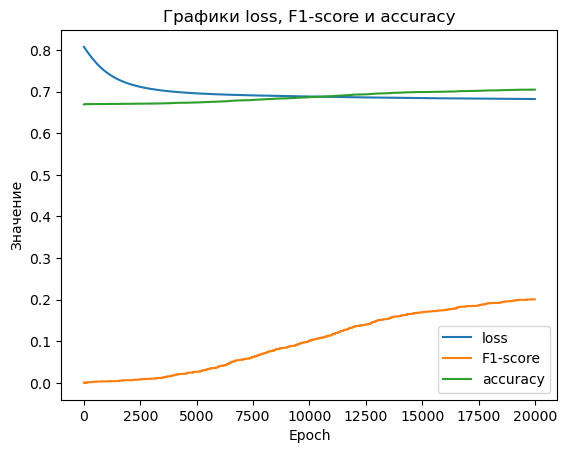

In [150]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf8['Epoch'], diagdf8['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf8['Epoch'], diagdf8['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf8['Epoch'], diagdf8['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [151]:
pred_test9=Mk9.forward(x_test.float())
pred_test_binarized9 = (pred_test9 > 0.5).float()

In [152]:
print(classification_report(y_test.to('cpu'), pred_test_binarized9.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.67      0.93      0.78      3216
         1.0       0.30      0.06      0.10      1542

    accuracy                           0.65      4758
   macro avg       0.48      0.50      0.44      4758
weighted avg       0.55      0.65      0.56      4758



In [153]:
#----------------------------------------------

<font color='red'>Experiment_#10</font>

<font color='red'>layers: 1+3, epochs: 10000, lr: 0.0001</font>

In [154]:
#----------------------------------------------

In [155]:
# import torch.nn as nn

# nn.Linear() можно указать точные значения для "input_size, hidden_size"
# вместо nn.ReLU() можно посмотреть Sigmoid, tangensoid, etc.
# попробовать добавить еще Layers (fc3, fc4, etc.)
class MLP_MK10(nn.Module): #изменить название
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP_MK10, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, 200)
        self.sigmoid = nn.Sigmoid()
        self.fc3 = nn.Linear(200, 100) #если добавлять или изменять, то не забыть поменять название
        self.tanh = nn.Tanh()
        self.fc4 = nn.Linear(100, output_size) #если добавлять или изменять, то не забыть поменять название
        self.sigmoid1 = nn.Sigmoid()
    def forward(self, x):
        out = self.fc1(x) #если добавлять или изменять, то не забыть поменять название
        out = self.relu(out)
        out = self.fc2(out)
        out = self.sigmoid(out)
        out = self.fc3(out)
        out = self.tanh(out)
        out = self.fc4(out)
        out = self.sigmoid1(out)
        return out

In [156]:
Mk10=MLP_MK10(1000,300,1) #изменить название переменной

In [157]:
if torch.cuda.is_available():
    dev = torch.device("cuda:0")
else:
    dev = torch.device("cpu")

In [158]:
# if torch.cuda.is_available():
#     dev=torch.device('cuda:0')
# else: dev=torch.device('cpu:0')
torch.cuda.is_available()

True

In [159]:
x_train=x_train.to(dev)
x_test=x_test.to(dev)
y_train=y_train.to(dev)
y_test=y_test.to(dev)

In [160]:
Mk10=Mk10.to(dev)

In [161]:
# "lr" - learning rate (чем больше "epoch", тем меньше "lr")
optimizer = torch.optim.Adam(Mk10.parameters(), lr=0.0001) #изменить название переменной
loss = nn.BCEWithLogitsLoss()
f1_score = torchmetrics.functional.f1_score
accuracy = torchmetrics.functional.accuracy
diagdf9=pd.DataFrame(columns=['Epoch','loss','F1-score','accuracy']) #изменить название переменной
# можно изменить количество "epoch"
for epoch in range(10000):
    optimizer.zero_grad()
    pred = Mk10.forward(x_train.float()) #изменить название переменной
    l = loss(pred, y_train) # squeeze the predicted tensor
    l.backward()
    f1= f1_score(pred, y_train, task='binary')
    acc=accuracy(pred, y_train, task='binary')
    data={'Epoch':epoch,'loss':l.item(),'F1-score':f1.item(),'accuracy':acc.item()}
    diagdf9 = pd.concat([diagdf9, pd.DataFrame(data, index=[epoch])], ignore_index=True) #изменить название переменной
    optimizer.step()
    print('Epoch: ', epoch+1, ', Loss: ', l.item(),'  f1-score:', f1.item(),"  accuracy:", acc.item())

Epoch:  1 , Loss:  0.79682856798172   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2 , Loss:  0.793735682964325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3 , Loss:  0.7906897664070129   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4 , Loss:  0.7876940965652466   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5 , Loss:  0.7847518920898438   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6 , Loss:  0.7818661332130432   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7 , Loss:  0.7790396213531494   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8 , Loss:  0.7762749791145325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9 , Loss:  0.7735743522644043   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  10 , Loss:  0.7709396481513977   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  11 , Loss:  0.7683725953102112   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  12 , Loss:  0.7658745050430298   f1-score: 0.0   accuracy:

Epoch:  118 , Loss:  0.7005887627601624   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  119 , Loss:  0.7005050778388977   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  120 , Loss:  0.7004229426383972   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  121 , Loss:  0.7003421783447266   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  122 , Loss:  0.7002629637718201   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  123 , Loss:  0.700185239315033   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  124 , Loss:  0.7001086473464966   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  125 , Loss:  0.7000336050987244   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  126 , Loss:  0.6999598145484924   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  127 , Loss:  0.6998873353004456   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  128 , Loss:  0.6998159885406494   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  129 , Loss:  0.6997459530830383   f1

Epoch:  224 , Loss:  0.6961456537246704   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  225 , Loss:  0.6961255073547363   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  226 , Loss:  0.6961056590080261   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  227 , Loss:  0.696086049079895   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  228 , Loss:  0.6960665583610535   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  229 , Loss:  0.6960473656654358   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  230 , Loss:  0.6960282921791077   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  231 , Loss:  0.6960094571113586   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  232 , Loss:  0.6959907412528992   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  233 , Loss:  0.6959723830223083   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  234 , Loss:  0.6959540247917175   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  235 , Loss:  0.6959359049797058   f1

Epoch:  331 , Loss:  0.69478440284729   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  332 , Loss:  0.6947765350341797   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  333 , Loss:  0.6947687864303589   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  334 , Loss:  0.6947610378265381   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  335 , Loss:  0.6947534680366516   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  336 , Loss:  0.6947457790374756   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  337 , Loss:  0.6947383284568787   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  338 , Loss:  0.694730818271637   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  339 , Loss:  0.6947233080863953   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  340 , Loss:  0.6947160363197327   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  341 , Loss:  0.6947087049484253   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  342 , Loss:  0.6947014331817627   f1-s

Epoch:  440 , Loss:  0.6941846609115601   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  441 , Loss:  0.6941809058189392   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  442 , Loss:  0.6941770911216736   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  443 , Loss:  0.6941733956336975   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  444 , Loss:  0.6941696405410767   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  445 , Loss:  0.6941660046577454   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  446 , Loss:  0.6941623091697693   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  447 , Loss:  0.6941586136817932   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  448 , Loss:  0.6941549777984619   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  449 , Loss:  0.6941513419151306   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  450 , Loss:  0.6941477060317993   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  451 , Loss:  0.694144070148468   f1

Epoch:  544 , Loss:  0.6938842535018921   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  545 , Loss:  0.6938820481300354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  546 , Loss:  0.6938799023628235   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  547 , Loss:  0.6938776969909668   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  548 , Loss:  0.6938756108283997   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  549 , Loss:  0.6938735246658325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  550 , Loss:  0.6938713192939758   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  551 , Loss:  0.6938692331314087   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  552 , Loss:  0.6938670873641968   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  553 , Loss:  0.6938651204109192   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  554 , Loss:  0.6938629746437073   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  555 , Loss:  0.6938608884811401   f

Epoch:  655 , Loss:  0.6936951279640198   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  656 , Loss:  0.6936937570571899   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  657 , Loss:  0.6936925053596497   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  658 , Loss:  0.693691074848175   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  659 , Loss:  0.6936898231506348   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  660 , Loss:  0.6936886310577393   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  661 , Loss:  0.6936872601509094   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  662 , Loss:  0.6936859488487244   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  663 , Loss:  0.6936847567558289   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  664 , Loss:  0.693683385848999   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  665 , Loss:  0.693682074546814   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  666 , Loss:  0.6936808824539185   f1-s

Epoch:  765 , Loss:  0.6935760378837585   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  766 , Loss:  0.6935751438140869   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  767 , Loss:  0.6935743093490601   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  768 , Loss:  0.6935734152793884   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  769 , Loss:  0.6935725212097168   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  770 , Loss:  0.6935716867446899   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  771 , Loss:  0.6935707330703735   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  772 , Loss:  0.6935699582099915   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  773 , Loss:  0.6935691237449646   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  774 , Loss:  0.693568229675293   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  775 , Loss:  0.6935673356056213   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  776 , Loss:  0.6935665011405945   f1

Epoch:  876 , Loss:  0.6934941411018372   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  877 , Loss:  0.6934934258460999   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  878 , Loss:  0.6934928894042969   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  879 , Loss:  0.6934923529624939   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  880 , Loss:  0.6934916377067566   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  881 , Loss:  0.6934909820556641   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  882 , Loss:  0.6934905052185059   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  883 , Loss:  0.6934897899627686   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  884 , Loss:  0.693489134311676   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  885 , Loss:  0.6934886574745178   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  886 , Loss:  0.6934879422187805   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  887 , Loss:  0.6934874653816223   f1

Epoch:  985 , Loss:  0.6934362649917603   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  986 , Loss:  0.693435788154602   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  987 , Loss:  0.6934353709220886   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  988 , Loss:  0.6934348344802856   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  989 , Loss:  0.6934344172477722   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  990 , Loss:  0.6934338808059692   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  991 , Loss:  0.6934335827827454   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  992 , Loss:  0.6934331059455872   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  993 , Loss:  0.6934325695037842   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  994 , Loss:  0.6934322118759155   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  995 , Loss:  0.6934317350387573   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  996 , Loss:  0.6934312582015991   f1

Epoch:  1090 , Loss:  0.693394124507904   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1091 , Loss:  0.6933937668800354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1092 , Loss:  0.693393349647522   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1093 , Loss:  0.6933931112289429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1094 , Loss:  0.6933926939964294   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1095 , Loss:  0.6933923959732056   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1096 , Loss:  0.6933920383453369   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1097 , Loss:  0.6933916807174683   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1098 , Loss:  0.6933912634849548   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1099 , Loss:  0.693390965461731   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1100 , Loss:  0.6933906078338623   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1101 , Loss:  0.69339025020

Epoch:  1198 , Loss:  0.6933602690696716   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1199 , Loss:  0.6933600306510925   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1200 , Loss:  0.6933598518371582   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1201 , Loss:  0.6933594942092896   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1202 , Loss:  0.6933592557907104   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1203 , Loss:  0.6933590173721313   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1204 , Loss:  0.6933587193489075   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1205 , Loss:  0.6933584213256836   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1206 , Loss:  0.6933581829071045   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1207 , Loss:  0.6933578848838806   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1208 , Loss:  0.693357527256012   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1209 , Loss:  0.693357288

Epoch:  1307 , Loss:  0.6933331489562988   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1308 , Loss:  0.6933329105377197   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1309 , Loss:  0.6933326721191406   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1310 , Loss:  0.6933324933052063   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1311 , Loss:  0.693332314491272   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1312 , Loss:  0.6933320164680481   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1313 , Loss:  0.6933318376541138   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1314 , Loss:  0.6933316588401794   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1315 , Loss:  0.6933313608169556   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1316 , Loss:  0.6933311820030212   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1317 , Loss:  0.6933310031890869   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1318 , Loss:  0.693330705

Epoch:  1415 , Loss:  0.693311333656311   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1416 , Loss:  0.6933111548423767   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1417 , Loss:  0.6933109164237976   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1418 , Loss:  0.6933108568191528   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1419 , Loss:  0.693310558795929   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1420 , Loss:  0.6933103799819946   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1421 , Loss:  0.6933102011680603   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1422 , Loss:  0.693310022354126   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1423 , Loss:  0.6933098435401917   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1424 , Loss:  0.6933096647262573   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1425 , Loss:  0.693309485912323   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1426 , Loss:  0.693309307098

Epoch:  1524 , Loss:  0.6932929754257202   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1525 , Loss:  0.6932929158210754   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1526 , Loss:  0.6932926774024963   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1527 , Loss:  0.693292498588562   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1528 , Loss:  0.6932923793792725   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1529 , Loss:  0.6932923197746277   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1530 , Loss:  0.6932921409606934   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1531 , Loss:  0.6932920217514038   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1532 , Loss:  0.6932918429374695   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1533 , Loss:  0.6932916641235352   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1534 , Loss:  0.6932914853096008   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1535 , Loss:  0.693291366

Epoch:  1628 , Loss:  0.6932783722877502   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1629 , Loss:  0.6932782530784607   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1630 , Loss:  0.6932781338691711   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1631 , Loss:  0.6932780146598816   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1632 , Loss:  0.693277895450592   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1633 , Loss:  0.6932777762413025   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1634 , Loss:  0.6932775974273682   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1635 , Loss:  0.6932774186134338   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1636 , Loss:  0.6932774186134338   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1637 , Loss:  0.6932772397994995   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1638 , Loss:  0.6932770609855652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1639 , Loss:  0.693276941

Epoch:  1735 , Loss:  0.693265438079834   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1736 , Loss:  0.6932653188705444   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1737 , Loss:  0.6932653188705444   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1738 , Loss:  0.6932651400566101   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1739 , Loss:  0.6932650208473206   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1740 , Loss:  0.6932649612426758   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1741 , Loss:  0.6932648420333862   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1742 , Loss:  0.6932646632194519   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1743 , Loss:  0.6932646036148071   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1744 , Loss:  0.6932644844055176   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1745 , Loss:  0.693264365196228   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1746 , Loss:  0.6932643055

Epoch:  1842 , Loss:  0.6932543516159058   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1843 , Loss:  0.6932542324066162   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1844 , Loss:  0.6932541728019714   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1845 , Loss:  0.6932540535926819   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1846 , Loss:  0.6932539939880371   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1847 , Loss:  0.6932538151741028   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1848 , Loss:  0.6932538151741028   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1849 , Loss:  0.6932536363601685   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1850 , Loss:  0.6932535767555237   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1851 , Loss:  0.6932534575462341   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1852 , Loss:  0.6932533979415894   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1853 , Loss:  0.69325327

Epoch:  1947 , Loss:  0.6932448744773865   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1948 , Loss:  0.6932447552680969   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1949 , Loss:  0.6932447552680969   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1950 , Loss:  0.6932446956634521   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1951 , Loss:  0.6932445764541626   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1952 , Loss:  0.6932445168495178   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1953 , Loss:  0.6932443976402283   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1954 , Loss:  0.6932443380355835   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1955 , Loss:  0.693244218826294   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1956 , Loss:  0.6932441592216492   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1957 , Loss:  0.6932440400123596   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  1958 , Loss:  0.693243980

Epoch:  2055 , Loss:  0.6932362914085388   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2056 , Loss:  0.693236231803894   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2057 , Loss:  0.6932361721992493   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2058 , Loss:  0.6932361125946045   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2059 , Loss:  0.6932360529899597   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2060 , Loss:  0.6932359337806702   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2061 , Loss:  0.6932359337806702   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2062 , Loss:  0.6932357549667358   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2063 , Loss:  0.6932357549667358   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2064 , Loss:  0.6932356953620911   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2065 , Loss:  0.6932355761528015   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2066 , Loss:  0.693235516

Epoch:  2162 , Loss:  0.6932289004325867   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2163 , Loss:  0.6932288408279419   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2164 , Loss:  0.6932287216186523   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2165 , Loss:  0.6932286620140076   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2166 , Loss:  0.6932286620140076   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2167 , Loss:  0.693228542804718   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2168 , Loss:  0.6932284832000732   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2169 , Loss:  0.6932284832000732   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2170 , Loss:  0.6932283639907837   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2171 , Loss:  0.6932283043861389   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2172 , Loss:  0.6932282447814941   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2173 , Loss:  0.693228125

Epoch:  2267 , Loss:  0.6932224035263062   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2268 , Loss:  0.6932224035263062   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2269 , Loss:  0.6932223439216614   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2270 , Loss:  0.6932222843170166   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2271 , Loss:  0.6932222247123718   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2272 , Loss:  0.693222165107727   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2273 , Loss:  0.6932220458984375   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2274 , Loss:  0.6932220458984375   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2275 , Loss:  0.6932219862937927   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2276 , Loss:  0.6932219862937927   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2277 , Loss:  0.6932218670845032   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2278 , Loss:  0.693221747

Epoch:  2370 , Loss:  0.6932168006896973   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2371 , Loss:  0.6932168006896973   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2372 , Loss:  0.6932166218757629   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2373 , Loss:  0.6932166218757629   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2374 , Loss:  0.6932166218757629   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2375 , Loss:  0.6932164430618286   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2376 , Loss:  0.6932164430618286   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2377 , Loss:  0.6932164430618286   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2378 , Loss:  0.6932163238525391   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2379 , Loss:  0.6932162642478943   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2380 , Loss:  0.6932162642478943   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2381 , Loss:  0.69321614

Epoch:  2476 , Loss:  0.6932114362716675   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2477 , Loss:  0.6932114362716675   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2478 , Loss:  0.6932113170623779   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2479 , Loss:  0.6932113170623779   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2480 , Loss:  0.6932113170623779   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2481 , Loss:  0.6932112574577332   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2482 , Loss:  0.6932111382484436   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2483 , Loss:  0.6932111382484436   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2484 , Loss:  0.6932110786437988   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2485 , Loss:  0.693211019039154   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2486 , Loss:  0.6932109594345093   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2487 , Loss:  0.693210899

Epoch:  2583 , Loss:  0.6932066679000854   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2584 , Loss:  0.6932065486907959   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2585 , Loss:  0.6932065486907959   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2586 , Loss:  0.6932064890861511   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2587 , Loss:  0.6932065486907959   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2588 , Loss:  0.6932064890861511   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2589 , Loss:  0.6932064890861511   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2590 , Loss:  0.6932064294815063   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2591 , Loss:  0.6932063102722168   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2592 , Loss:  0.6932063102722168   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2593 , Loss:  0.6932063102722168   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2594 , Loss:  0.69320625

Epoch:  2684 , Loss:  0.6932026147842407   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2685 , Loss:  0.693202555179596   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2686 , Loss:  0.693202555179596   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2687 , Loss:  0.6932024359703064   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2688 , Loss:  0.6932023763656616   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2689 , Loss:  0.6932023763656616   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2690 , Loss:  0.6932023763656616   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2691 , Loss:  0.6932022571563721   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2692 , Loss:  0.6932021975517273   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2693 , Loss:  0.6932021975517273   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2694 , Loss:  0.6932021975517273   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2695 , Loss:  0.6932021975

Epoch:  2789 , Loss:  0.6931986808776855   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2790 , Loss:  0.6931986808776855   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2791 , Loss:  0.693198561668396   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2792 , Loss:  0.693198561668396   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2793 , Loss:  0.693198561668396   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2794 , Loss:  0.6931985020637512   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2795 , Loss:  0.6931985020637512   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2796 , Loss:  0.6931983828544617   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2797 , Loss:  0.6931985020637512   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2798 , Loss:  0.6931983232498169   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2799 , Loss:  0.6931983828544617   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2800 , Loss:  0.69319832324

Epoch:  2897 , Loss:  0.6931950449943542   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2898 , Loss:  0.6931950449943542   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2899 , Loss:  0.6931950449943542   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2900 , Loss:  0.6931949853897095   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2901 , Loss:  0.6931949257850647   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2902 , Loss:  0.6931949257850647   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2903 , Loss:  0.6931948661804199   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2904 , Loss:  0.6931948065757751   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2905 , Loss:  0.6931948065757751   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2906 , Loss:  0.6931948065757751   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2907 , Loss:  0.6931947469711304   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  2908 , Loss:  0.69319468

Epoch:  3001 , Loss:  0.6931918263435364   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3002 , Loss:  0.6931918263435364   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3003 , Loss:  0.6931918859481812   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3004 , Loss:  0.6931917667388916   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3005 , Loss:  0.6931917071342468   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3006 , Loss:  0.6931917071342468   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3007 , Loss:  0.6931917071342468   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3008 , Loss:  0.6931917071342468   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3009 , Loss:  0.6931915879249573   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3010 , Loss:  0.6931915879249573   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3011 , Loss:  0.6931915879249573   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3012 , Loss:  0.69319152

Epoch:  3105 , Loss:  0.6931889653205872   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3106 , Loss:  0.6931889057159424   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3107 , Loss:  0.6931889057159424   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3108 , Loss:  0.6931889057159424   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3109 , Loss:  0.6931889057159424   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3110 , Loss:  0.6931887865066528   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3111 , Loss:  0.6931887865066528   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3112 , Loss:  0.6931887269020081   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3113 , Loss:  0.6931887269020081   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3114 , Loss:  0.6931887269020081   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3115 , Loss:  0.6931886076927185   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3116 , Loss:  0.69318860

Epoch:  3210 , Loss:  0.6931861639022827   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3211 , Loss:  0.6931861639022827   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3212 , Loss:  0.6931861639022827   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3213 , Loss:  0.6931861639022827   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3214 , Loss:  0.6931860446929932   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3215 , Loss:  0.6931860446929932   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3216 , Loss:  0.6931860446929932   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3217 , Loss:  0.6931859850883484   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3218 , Loss:  0.6931860446929932   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3219 , Loss:  0.6931859850883484   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3220 , Loss:  0.6931859850883484   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3221 , Loss:  0.69318592

Epoch:  3330 , Loss:  0.6931833624839783   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3331 , Loss:  0.6931833624839783   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3332 , Loss:  0.6931832432746887   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3333 , Loss:  0.6931833028793335   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3334 , Loss:  0.6931833624839783   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3335 , Loss:  0.6931832432746887   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3336 , Loss:  0.6931832432746887   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3337 , Loss:  0.6931832432746887   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3338 , Loss:  0.693183183670044   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3339 , Loss:  0.693183183670044   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3340 , Loss:  0.693183183670044   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3341 , Loss:  0.69318306446

Epoch:  3439 , Loss:  0.6931809782981873   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3440 , Loss:  0.6931809782981873   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3441 , Loss:  0.6931809782981873   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3442 , Loss:  0.6931809186935425   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3443 , Loss:  0.693181037902832   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3444 , Loss:  0.6931809186935425   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3445 , Loss:  0.6931808590888977   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3446 , Loss:  0.6931808590888977   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3447 , Loss:  0.6931808590888977   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3448 , Loss:  0.6931808590888977   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3449 , Loss:  0.6931808590888977   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3450 , Loss:  0.693180799

Epoch:  3546 , Loss:  0.6931788325309753   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3547 , Loss:  0.6931787729263306   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3548 , Loss:  0.6931788325309753   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3549 , Loss:  0.6931787729263306   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3550 , Loss:  0.6931787729263306   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3551 , Loss:  0.6931787133216858   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3552 , Loss:  0.6931787729263306   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3553 , Loss:  0.6931787729263306   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3554 , Loss:  0.6931787729263306   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3555 , Loss:  0.6931787133216858   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3556 , Loss:  0.6931787133216858   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3557 , Loss:  0.69317865

Epoch:  3649 , Loss:  0.6931769251823425   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3650 , Loss:  0.6931769251823425   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3651 , Loss:  0.6931769251823425   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3652 , Loss:  0.6931769251823425   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3653 , Loss:  0.6931768655776978   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3654 , Loss:  0.6931768655776978   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3655 , Loss:  0.6931768655776978   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3656 , Loss:  0.6931768655776978   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3657 , Loss:  0.6931768655776978   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3658 , Loss:  0.6931767463684082   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3659 , Loss:  0.6931767463684082   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3660 , Loss:  0.69317674

Epoch:  3753 , Loss:  0.6931751370429993   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3754 , Loss:  0.6931751370429993   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3755 , Loss:  0.6931751370429993   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3756 , Loss:  0.6931751370429993   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3757 , Loss:  0.6931750774383545   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3758 , Loss:  0.6931751370429993   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3759 , Loss:  0.6931750178337097   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3760 , Loss:  0.6931750178337097   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3761 , Loss:  0.6931750178337097   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3762 , Loss:  0.6931750178337097   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3763 , Loss:  0.6931750178337097   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3764 , Loss:  0.69317495

Epoch:  3861 , Loss:  0.6931734681129456   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3862 , Loss:  0.6931734085083008   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3863 , Loss:  0.6931734085083008   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3864 , Loss:  0.6931734085083008   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3865 , Loss:  0.6931732892990112   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3866 , Loss:  0.6931732892990112   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3867 , Loss:  0.6931732892990112   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3868 , Loss:  0.6931732892990112   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3869 , Loss:  0.6931732892990112   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3870 , Loss:  0.6931732892990112   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3871 , Loss:  0.6931732892990112   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3872 , Loss:  0.69317322

Epoch:  3968 , Loss:  0.6931717991828918   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3969 , Loss:  0.6931717991828918   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3970 , Loss:  0.6931717991828918   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3971 , Loss:  0.6931717991828918   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3972 , Loss:  0.6931717991828918   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3973 , Loss:  0.6931717991828918   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3974 , Loss:  0.6931717395782471   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3975 , Loss:  0.6931717395782471   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3976 , Loss:  0.6931717395782471   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3977 , Loss:  0.6931716799736023   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3978 , Loss:  0.6931716799736023   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  3979 , Loss:  0.69317162

Epoch:  4076 , Loss:  0.693170428276062   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4077 , Loss:  0.6931703090667725   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4078 , Loss:  0.6931703090667725   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4079 , Loss:  0.6931703090667725   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4080 , Loss:  0.6931703090667725   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4081 , Loss:  0.6931703090667725   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4082 , Loss:  0.6931703090667725   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4083 , Loss:  0.6931702494621277   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4084 , Loss:  0.6931702494621277   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4085 , Loss:  0.6931702494621277   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4086 , Loss:  0.6931702494621277   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4087 , Loss:  0.693170249

Epoch:  4183 , Loss:  0.6931689381599426   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4184 , Loss:  0.6931689381599426   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4185 , Loss:  0.6931689381599426   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4186 , Loss:  0.6931689381599426   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4187 , Loss:  0.6931689381599426   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4188 , Loss:  0.6931689381599426   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4189 , Loss:  0.6931688785552979   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4190 , Loss:  0.6931688785552979   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4191 , Loss:  0.6931688189506531   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4192 , Loss:  0.6931688785552979   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4193 , Loss:  0.6931688785552979   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4194 , Loss:  0.69316875

Epoch:  4291 , Loss:  0.6931676864624023   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4292 , Loss:  0.6931676864624023   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4293 , Loss:  0.6931676268577576   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4294 , Loss:  0.6931676268577576   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4295 , Loss:  0.6931676268577576   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4296 , Loss:  0.6931676268577576   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4297 , Loss:  0.6931676268577576   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4298 , Loss:  0.6931676268577576   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4299 , Loss:  0.6931676268577576   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4300 , Loss:  0.6931675672531128   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4301 , Loss:  0.6931676268577576   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4302 , Loss:  0.69316762

Epoch:  4398 , Loss:  0.6931664347648621   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4399 , Loss:  0.6931664347648621   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4400 , Loss:  0.6931664347648621   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4401 , Loss:  0.6931664347648621   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4402 , Loss:  0.6931664347648621   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4403 , Loss:  0.6931664347648621   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4404 , Loss:  0.6931664347648621   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4405 , Loss:  0.6931664347648621   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4406 , Loss:  0.6931663751602173   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4407 , Loss:  0.6931663751602173   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4408 , Loss:  0.6931663751602173   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4409 , Loss:  0.69316637

Epoch:  4507 , Loss:  0.6931653618812561   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4508 , Loss:  0.6931653618812561   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4509 , Loss:  0.6931653022766113   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4510 , Loss:  0.6931653618812561   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4511 , Loss:  0.6931653618812561   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4512 , Loss:  0.6931652426719666   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4513 , Loss:  0.6931652426719666   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4514 , Loss:  0.6931653022766113   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4515 , Loss:  0.6931652426719666   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4516 , Loss:  0.6931652426719666   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4517 , Loss:  0.6931652426719666   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4518 , Loss:  0.69316524

Epoch:  4614 , Loss:  0.6931642293930054   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4615 , Loss:  0.6931643486022949   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4616 , Loss:  0.6931642293930054   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4617 , Loss:  0.6931642293930054   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4618 , Loss:  0.6931642889976501   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4619 , Loss:  0.6931643486022949   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4620 , Loss:  0.6931642293930054   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4621 , Loss:  0.6931642293930054   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4622 , Loss:  0.6931642293930054   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4623 , Loss:  0.6931642293930054   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4624 , Loss:  0.6931642293930054   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4625 , Loss:  0.69316416

Epoch:  4713 , Loss:  0.6931633949279785   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4714 , Loss:  0.6931633949279785   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4715 , Loss:  0.6931633949279785   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4716 , Loss:  0.6931633949279785   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4717 , Loss:  0.6931633949279785   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4718 , Loss:  0.6931633949279785   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4719 , Loss:  0.693163275718689   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4720 , Loss:  0.6931633949279785   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4721 , Loss:  0.693163275718689   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4722 , Loss:  0.693163275718689   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4723 , Loss:  0.693163275718689   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4724 , Loss:  0.693163275718

Epoch:  4817 , Loss:  0.6931625008583069   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4818 , Loss:  0.6931625008583069   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4819 , Loss:  0.6931625008583069   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4820 , Loss:  0.6931625008583069   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4821 , Loss:  0.6931625008583069   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4822 , Loss:  0.6931624412536621   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4823 , Loss:  0.6931624412536621   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4824 , Loss:  0.6931623816490173   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4825 , Loss:  0.6931623816490173   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4826 , Loss:  0.6931623816490173   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4827 , Loss:  0.6931623816490173   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4828 , Loss:  0.69316238

Epoch:  4926 , Loss:  0.6931616067886353   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4927 , Loss:  0.6931616067886353   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4928 , Loss:  0.6931615471839905   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4929 , Loss:  0.6931616067886353   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4930 , Loss:  0.6931616067886353   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4931 , Loss:  0.6931615471839905   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4932 , Loss:  0.6931616067886353   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4933 , Loss:  0.6931615471839905   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4934 , Loss:  0.6931615471839905   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4935 , Loss:  0.6931615471839905   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4936 , Loss:  0.6931615471839905   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  4937 , Loss:  0.69316154

Epoch:  5032 , Loss:  0.6931608319282532   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5033 , Loss:  0.6931608319282532   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5034 , Loss:  0.6931608319282532   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5035 , Loss:  0.6931608319282532   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5036 , Loss:  0.6931607127189636   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5037 , Loss:  0.6931608319282532   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5038 , Loss:  0.6931607127189636   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5039 , Loss:  0.6931607127189636   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5040 , Loss:  0.6931607127189636   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5041 , Loss:  0.6931607127189636   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5042 , Loss:  0.6931607127189636   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5043 , Loss:  0.69316071

Epoch:  5131 , Loss:  0.6931601166725159   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5132 , Loss:  0.6931601166725159   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5133 , Loss:  0.6931600570678711   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5134 , Loss:  0.6931600570678711   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5135 , Loss:  0.6931600570678711   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5136 , Loss:  0.6931600570678711   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5137 , Loss:  0.6931601166725159   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5138 , Loss:  0.6931600570678711   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5139 , Loss:  0.6931600570678711   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5140 , Loss:  0.6931600570678711   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5141 , Loss:  0.6931600570678711   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5142 , Loss:  0.69316005

Epoch:  5233 , Loss:  0.6931594014167786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5234 , Loss:  0.6931594014167786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5235 , Loss:  0.6931594014167786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5236 , Loss:  0.6931594014167786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5237 , Loss:  0.6931594014167786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5238 , Loss:  0.6931594014167786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5239 , Loss:  0.6931594014167786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5240 , Loss:  0.6931594014167786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5241 , Loss:  0.6931594014167786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5242 , Loss:  0.6931594014167786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5243 , Loss:  0.6931594014167786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5244 , Loss:  0.69315940

Epoch:  5338 , Loss:  0.6931588053703308   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5339 , Loss:  0.693158745765686   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5340 , Loss:  0.693158745765686   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5341 , Loss:  0.693158745765686   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5342 , Loss:  0.693158745765686   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5343 , Loss:  0.6931588053703308   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5344 , Loss:  0.6931586861610413   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5345 , Loss:  0.6931586861610413   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5346 , Loss:  0.6931586861610413   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5347 , Loss:  0.6931586861610413   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5348 , Loss:  0.6931586861610413   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5349 , Loss:  0.693158686161

Epoch:  5443 , Loss:  0.6931582093238831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5444 , Loss:  0.6931581497192383   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5445 , Loss:  0.6931581497192383   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5446 , Loss:  0.6931580901145935   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5447 , Loss:  0.6931580901145935   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5448 , Loss:  0.6931580901145935   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5449 , Loss:  0.6931581497192383   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5450 , Loss:  0.6931581497192383   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5451 , Loss:  0.6931580901145935   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5452 , Loss:  0.6931580901145935   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5453 , Loss:  0.6931580901145935   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5454 , Loss:  0.69315803

Epoch:  5550 , Loss:  0.6931575536727905   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5551 , Loss:  0.6931575536727905   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5552 , Loss:  0.6931574940681458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5553 , Loss:  0.6931574940681458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5554 , Loss:  0.6931574940681458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5555 , Loss:  0.6931574940681458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5556 , Loss:  0.6931574940681458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5557 , Loss:  0.6931574940681458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5558 , Loss:  0.6931574940681458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5559 , Loss:  0.6931574940681458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5560 , Loss:  0.693157434463501   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5561 , Loss:  0.693157434

Epoch:  5658 , Loss:  0.6931569576263428   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5659 , Loss:  0.6931569576263428   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5660 , Loss:  0.6931569576263428   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5661 , Loss:  0.6931570172309875   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5662 , Loss:  0.6931569576263428   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5663 , Loss:  0.6931569576263428   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5664 , Loss:  0.6931569576263428   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5665 , Loss:  0.6931569576263428   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5666 , Loss:  0.6931569576263428   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5667 , Loss:  0.693156898021698   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5668 , Loss:  0.693156898021698   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5669 , Loss:  0.6931569576

Epoch:  5757 , Loss:  0.6931565403938293   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5758 , Loss:  0.6931565403938293   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5759 , Loss:  0.6931564211845398   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5760 , Loss:  0.6931564211845398   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5761 , Loss:  0.6931564211845398   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5762 , Loss:  0.6931564211845398   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5763 , Loss:  0.6931564211845398   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5764 , Loss:  0.6931564211845398   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5765 , Loss:  0.6931564211845398   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5766 , Loss:  0.6931564211845398   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5767 , Loss:  0.6931564211845398   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5768 , Loss:  0.69315636

Epoch:  5863 , Loss:  0.6931560039520264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5864 , Loss:  0.6931559443473816   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5865 , Loss:  0.6931560039520264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5866 , Loss:  0.6931560039520264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5867 , Loss:  0.6931560039520264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5868 , Loss:  0.6931559443473816   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5869 , Loss:  0.6931559443473816   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5870 , Loss:  0.6931559443473816   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5871 , Loss:  0.6931559443473816   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5872 , Loss:  0.6931559443473816   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5873 , Loss:  0.6931559443473816   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5874 , Loss:  0.69315594

Epoch:  5971 , Loss:  0.6931554675102234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5972 , Loss:  0.6931554675102234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5973 , Loss:  0.6931554675102234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5974 , Loss:  0.6931554675102234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5975 , Loss:  0.6931554675102234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5976 , Loss:  0.6931554675102234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5977 , Loss:  0.6931554675102234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5978 , Loss:  0.6931554079055786   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5979 , Loss:  0.6931554675102234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5980 , Loss:  0.6931554675102234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5981 , Loss:  0.6931554675102234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  5982 , Loss:  0.69315540

Epoch:  6079 , Loss:  0.69315505027771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6080 , Loss:  0.6931549906730652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6081 , Loss:  0.6931549906730652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6082 , Loss:  0.6931549906730652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6083 , Loss:  0.6931549906730652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6084 , Loss:  0.6931549906730652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6085 , Loss:  0.6931549906730652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6086 , Loss:  0.6931549906730652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6087 , Loss:  0.6931549906730652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6088 , Loss:  0.6931549906730652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6089 , Loss:  0.6931549906730652   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6090 , Loss:  0.6931549906

Epoch:  6184 , Loss:  0.6931545734405518   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6185 , Loss:  0.6931545734405518   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6186 , Loss:  0.6931546926498413   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6187 , Loss:  0.6931545734405518   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6188 , Loss:  0.6931545734405518   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6189 , Loss:  0.6931545734405518   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6190 , Loss:  0.6931545734405518   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6191 , Loss:  0.6931545734405518   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6192 , Loss:  0.6931545734405518   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6193 , Loss:  0.6931545734405518   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6194 , Loss:  0.6931545734405518   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6195 , Loss:  0.69315457

Epoch:  6290 , Loss:  0.6931542158126831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6291 , Loss:  0.6931542158126831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6292 , Loss:  0.6931542158126831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6293 , Loss:  0.6931542158126831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6294 , Loss:  0.6931542158126831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6295 , Loss:  0.6931542158126831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6296 , Loss:  0.6931542158126831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6297 , Loss:  0.6931542158126831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6298 , Loss:  0.6931542158126831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6299 , Loss:  0.6931542158126831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6300 , Loss:  0.6931542158126831   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6301 , Loss:  0.69315421

Epoch:  6394 , Loss:  0.6931538581848145   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6395 , Loss:  0.6931538581848145   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6396 , Loss:  0.6931538581848145   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6397 , Loss:  0.6931538581848145   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6398 , Loss:  0.6931538581848145   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6399 , Loss:  0.6931538581848145   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6400 , Loss:  0.6931538581848145   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6401 , Loss:  0.6931537985801697   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6402 , Loss:  0.6931538581848145   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6403 , Loss:  0.6931538581848145   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6404 , Loss:  0.6931538581848145   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6405 , Loss:  0.69315385

Epoch:  6501 , Loss:  0.6931535005569458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6502 , Loss:  0.6931535005569458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6503 , Loss:  0.6931535005569458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6504 , Loss:  0.6931535005569458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6505 , Loss:  0.693153440952301   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6506 , Loss:  0.693153440952301   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6507 , Loss:  0.693153440952301   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6508 , Loss:  0.693153440952301   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6509 , Loss:  0.693153440952301   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6510 , Loss:  0.6931535005569458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6511 , Loss:  0.693153440952301   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6512 , Loss:  0.69315344095230

Epoch:  6606 , Loss:  0.6931531429290771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6607 , Loss:  0.6931531429290771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6608 , Loss:  0.6931531429290771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6609 , Loss:  0.6931531429290771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6610 , Loss:  0.6931531429290771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6611 , Loss:  0.6931531429290771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6612 , Loss:  0.6931531429290771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6613 , Loss:  0.6931531429290771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6614 , Loss:  0.6931531429290771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6615 , Loss:  0.6931531429290771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6616 , Loss:  0.6931531429290771   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6617 , Loss:  0.69315314

Epoch:  6710 , Loss:  0.6931528449058533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6711 , Loss:  0.6931528449058533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6712 , Loss:  0.6931528449058533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6713 , Loss:  0.6931528449058533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6714 , Loss:  0.6931528449058533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6715 , Loss:  0.6931528449058533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6716 , Loss:  0.6931528449058533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6717 , Loss:  0.6931528449058533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6718 , Loss:  0.6931528449058533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6719 , Loss:  0.6931528449058533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6720 , Loss:  0.6931528449058533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6721 , Loss:  0.69315290

Epoch:  6812 , Loss:  0.6931526064872742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6813 , Loss:  0.6931526064872742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6814 , Loss:  0.6931526064872742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6815 , Loss:  0.6931524872779846   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6816 , Loss:  0.6931524872779846   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6817 , Loss:  0.6931524872779846   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6818 , Loss:  0.6931524872779846   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6819 , Loss:  0.6931526064872742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6820 , Loss:  0.6931526064872742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6821 , Loss:  0.6931526064872742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6822 , Loss:  0.6931525468826294   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6823 , Loss:  0.69315254

Epoch:  6918 , Loss:  0.6931523084640503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6919 , Loss:  0.6931523084640503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6920 , Loss:  0.6931523084640503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6921 , Loss:  0.6931523084640503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6922 , Loss:  0.6931523084640503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6923 , Loss:  0.6931523084640503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6924 , Loss:  0.6931523084640503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6925 , Loss:  0.6931523084640503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6926 , Loss:  0.6931523084640503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6927 , Loss:  0.6931522488594055   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6928 , Loss:  0.6931523084640503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  6929 , Loss:  0.69315230

Epoch:  7026 , Loss:  0.6931520104408264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7027 , Loss:  0.6931520104408264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7028 , Loss:  0.6931520104408264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7029 , Loss:  0.6931520104408264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7030 , Loss:  0.6931520104408264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7031 , Loss:  0.6931520104408264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7032 , Loss:  0.6931520104408264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7033 , Loss:  0.6931520104408264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7034 , Loss:  0.6931520104408264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7035 , Loss:  0.6931520104408264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7036 , Loss:  0.6931520104408264   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7037 , Loss:  0.69315201

Epoch:  7132 , Loss:  0.6931517720222473   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7133 , Loss:  0.6931517720222473   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7134 , Loss:  0.6931517720222473   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7135 , Loss:  0.6931517720222473   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7136 , Loss:  0.6931518316268921   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7137 , Loss:  0.6931517720222473   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7138 , Loss:  0.6931517720222473   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7139 , Loss:  0.6931517720222473   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7140 , Loss:  0.6931517720222473   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7141 , Loss:  0.6931517720222473   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7142 , Loss:  0.6931517124176025   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7143 , Loss:  0.69315171

Epoch:  7235 , Loss:  0.6931514739990234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7236 , Loss:  0.6931514739990234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7237 , Loss:  0.6931514739990234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7238 , Loss:  0.6931514739990234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7239 , Loss:  0.6931514739990234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7240 , Loss:  0.6931515336036682   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7241 , Loss:  0.6931515336036682   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7242 , Loss:  0.6931515336036682   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7243 , Loss:  0.6931514739990234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7244 , Loss:  0.6931514739990234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7245 , Loss:  0.6931514739990234   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7246 , Loss:  0.69315147

Epoch:  7341 , Loss:  0.6931512951850891   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7342 , Loss:  0.6931512951850891   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7343 , Loss:  0.6931512951850891   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7344 , Loss:  0.6931512951850891   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7345 , Loss:  0.6931512951850891   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7346 , Loss:  0.6931512355804443   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7347 , Loss:  0.6931512355804443   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7348 , Loss:  0.6931512355804443   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7349 , Loss:  0.6931512355804443   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7350 , Loss:  0.6931512355804443   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7351 , Loss:  0.6931512355804443   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7352 , Loss:  0.69315123

Epoch:  7447 , Loss:  0.6931511163711548   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7448 , Loss:  0.6931511163711548   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7449 , Loss:  0.69315105676651   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7450 , Loss:  0.69315105676651   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7451 , Loss:  0.69315105676651   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7452 , Loss:  0.6931511759757996   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7453 , Loss:  0.6931511759757996   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7454 , Loss:  0.6931511163711548   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7455 , Loss:  0.6931511163711548   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7456 , Loss:  0.6931511163711548   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7457 , Loss:  0.6931511163711548   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7458 , Loss:  0.69315111637115

Epoch:  7556 , Loss:  0.6931508779525757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7557 , Loss:  0.6931508779525757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7558 , Loss:  0.6931508779525757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7559 , Loss:  0.6931508779525757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7560 , Loss:  0.6931508779525757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7561 , Loss:  0.6931508779525757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7562 , Loss:  0.6931508779525757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7563 , Loss:  0.6931508779525757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7564 , Loss:  0.6931508779525757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7565 , Loss:  0.6931508779525757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7566 , Loss:  0.6931508779525757   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7567 , Loss:  0.69315087

Epoch:  7662 , Loss:  0.6931506991386414   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7663 , Loss:  0.6931506991386414   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7664 , Loss:  0.6931506395339966   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7665 , Loss:  0.6931506395339966   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7666 , Loss:  0.6931506395339966   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7667 , Loss:  0.6931506991386414   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7668 , Loss:  0.6931506991386414   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7669 , Loss:  0.6931506991386414   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7670 , Loss:  0.6931506991386414   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7671 , Loss:  0.6931506991386414   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7672 , Loss:  0.6931506991386414   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7673 , Loss:  0.69315063

Epoch:  7764 , Loss:  0.693150520324707   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7765 , Loss:  0.693150520324707   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7766 , Loss:  0.693150520324707   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7767 , Loss:  0.693150520324707   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7768 , Loss:  0.693150520324707   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7769 , Loss:  0.693150520324707   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7770 , Loss:  0.693150520324707   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7771 , Loss:  0.693150520324707   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7772 , Loss:  0.6931504607200623   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7773 , Loss:  0.6931504607200623   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7774 , Loss:  0.6931504607200623   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7775 , Loss:  0.6931504607200623

Epoch:  7870 , Loss:  0.6931502819061279   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7871 , Loss:  0.6931502819061279   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7872 , Loss:  0.6931502819061279   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7873 , Loss:  0.6931503415107727   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7874 , Loss:  0.6931503415107727   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7875 , Loss:  0.6931503415107727   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7876 , Loss:  0.6931503415107727   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7877 , Loss:  0.6931503415107727   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7878 , Loss:  0.6931503415107727   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7879 , Loss:  0.6931503415107727   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7880 , Loss:  0.6931503415107727   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7881 , Loss:  0.69315034

Epoch:  7976 , Loss:  0.6931501626968384   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7977 , Loss:  0.6931501626968384   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7978 , Loss:  0.6931501626968384   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7979 , Loss:  0.6931501626968384   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7980 , Loss:  0.6931502223014832   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7981 , Loss:  0.6931502819061279   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7982 , Loss:  0.6931502819061279   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7983 , Loss:  0.6931502819061279   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7984 , Loss:  0.6931502819061279   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7985 , Loss:  0.6931502223014832   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7986 , Loss:  0.6931501626968384   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  7987 , Loss:  0.69315016

Epoch:  8079 , Loss:  0.693149983882904   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8080 , Loss:  0.693149983882904   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8081 , Loss:  0.693149983882904   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8082 , Loss:  0.693149983882904   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8083 , Loss:  0.693149983882904   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8084 , Loss:  0.6931500434875488   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8085 , Loss:  0.6931500434875488   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8086 , Loss:  0.6931500434875488   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8087 , Loss:  0.6931500434875488   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8088 , Loss:  0.6931500434875488   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8089 , Loss:  0.693149983882904   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8090 , Loss:  0.69314998388290

Epoch:  8188 , Loss:  0.6931499242782593   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8189 , Loss:  0.6931499242782593   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8190 , Loss:  0.6931499242782593   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8191 , Loss:  0.6931499242782593   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8192 , Loss:  0.6931499242782593   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8193 , Loss:  0.6931499242782593   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8194 , Loss:  0.6931499242782593   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8195 , Loss:  0.6931499242782593   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8196 , Loss:  0.6931499242782593   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8197 , Loss:  0.6931498050689697   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8198 , Loss:  0.6931498050689697   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8199 , Loss:  0.69314980

Epoch:  8293 , Loss:  0.693149745464325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8294 , Loss:  0.693149745464325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8295 , Loss:  0.693149745464325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8296 , Loss:  0.693149745464325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8297 , Loss:  0.693149745464325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8298 , Loss:  0.693149745464325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8299 , Loss:  0.693149745464325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8300 , Loss:  0.6931498050689697   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8301 , Loss:  0.6931498050689697   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8302 , Loss:  0.6931498050689697   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8303 , Loss:  0.693149745464325   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8304 , Loss:  0.693149745464325 

Epoch:  8401 , Loss:  0.6931496262550354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8402 , Loss:  0.6931496262550354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8403 , Loss:  0.6931496262550354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8404 , Loss:  0.6931496262550354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8405 , Loss:  0.6931496262550354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8406 , Loss:  0.6931496262550354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8407 , Loss:  0.6931496262550354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8408 , Loss:  0.6931496262550354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8409 , Loss:  0.6931496262550354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8410 , Loss:  0.6931496262550354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8411 , Loss:  0.6931496262550354   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8412 , Loss:  0.69314962

Epoch:  8507 , Loss:  0.6931495070457458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8508 , Loss:  0.6931495070457458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8509 , Loss:  0.6931495070457458   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8510 , Loss:  0.6931494474411011   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8511 , Loss:  0.6931494474411011   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8512 , Loss:  0.6931494474411011   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8513 , Loss:  0.6931494474411011   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8514 , Loss:  0.6931494474411011   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8515 , Loss:  0.6931494474411011   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8516 , Loss:  0.6931494474411011   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8517 , Loss:  0.6931494474411011   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8518 , Loss:  0.69314944

Epoch:  8614 , Loss:  0.6931493878364563   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8615 , Loss:  0.6931493878364563   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8616 , Loss:  0.6931493878364563   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8617 , Loss:  0.6931493282318115   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8618 , Loss:  0.6931493282318115   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8619 , Loss:  0.6931493282318115   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8620 , Loss:  0.6931493282318115   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8621 , Loss:  0.6931493282318115   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8622 , Loss:  0.6931493282318115   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8623 , Loss:  0.6931493282318115   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8624 , Loss:  0.6931493282318115   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8625 , Loss:  0.69314932

Epoch:  8719 , Loss:  0.6931492686271667   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8720 , Loss:  0.6931492686271667   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8721 , Loss:  0.6931492686271667   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8722 , Loss:  0.6931492686271667   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8723 , Loss:  0.6931492686271667   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8724 , Loss:  0.6931492686271667   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8725 , Loss:  0.6931492686271667   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8726 , Loss:  0.6931492686271667   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8727 , Loss:  0.6931492686271667   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8728 , Loss:  0.6931492686271667   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8729 , Loss:  0.6931492686271667   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8730 , Loss:  0.69314926

Epoch:  8821 , Loss:  0.6931491494178772   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8822 , Loss:  0.6931491494178772   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8823 , Loss:  0.6931491494178772   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8824 , Loss:  0.6931491494178772   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8825 , Loss:  0.6931491494178772   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8826 , Loss:  0.6931491494178772   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8827 , Loss:  0.6931491494178772   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8828 , Loss:  0.6931491494178772   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8829 , Loss:  0.6931491494178772   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8830 , Loss:  0.6931491494178772   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8831 , Loss:  0.6931491494178772   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8832 , Loss:  0.69314914

Epoch:  8928 , Loss:  0.6931490302085876   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8929 , Loss:  0.6931490302085876   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8930 , Loss:  0.6931490302085876   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8931 , Loss:  0.6931490302085876   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8932 , Loss:  0.6931490302085876   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8933 , Loss:  0.6931490302085876   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8934 , Loss:  0.6931490302085876   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8935 , Loss:  0.6931490302085876   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8936 , Loss:  0.6931490302085876   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8937 , Loss:  0.6931490302085876   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8938 , Loss:  0.6931490302085876   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  8939 , Loss:  0.69314903

Epoch:  9034 , Loss:  0.6931489706039429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9035 , Loss:  0.6931489706039429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9036 , Loss:  0.6931489706039429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9037 , Loss:  0.6931489706039429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9038 , Loss:  0.6931489706039429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9039 , Loss:  0.6931489706039429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9040 , Loss:  0.6931489706039429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9041 , Loss:  0.6931489706039429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9042 , Loss:  0.6931489706039429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9043 , Loss:  0.6931489706039429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9044 , Loss:  0.6931489706039429   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9045 , Loss:  0.69314897

Epoch:  9142 , Loss:  0.6931488513946533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9143 , Loss:  0.6931488513946533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9144 , Loss:  0.6931488513946533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9145 , Loss:  0.6931488513946533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9146 , Loss:  0.6931488513946533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9147 , Loss:  0.6931488513946533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9148 , Loss:  0.6931488513946533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9149 , Loss:  0.6931488513946533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9150 , Loss:  0.6931488513946533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9151 , Loss:  0.6931488513946533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9152 , Loss:  0.6931488513946533   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9153 , Loss:  0.69314879

Epoch:  9250 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9251 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9252 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9253 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9254 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9255 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9256 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9257 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9258 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9259 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9260 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9261 , Loss:  0.69314879

Epoch:  9354 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9355 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9356 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9357 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9358 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9359 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9360 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9361 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9362 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9363 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9364 , Loss:  0.6931487917900085   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9365 , Loss:  0.69314879

Epoch:  9459 , Loss:  0.6931486129760742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9460 , Loss:  0.6931486129760742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9461 , Loss:  0.6931486129760742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9462 , Loss:  0.693148672580719   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9463 , Loss:  0.693148672580719   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9464 , Loss:  0.693148672580719   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9465 , Loss:  0.693148672580719   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9466 , Loss:  0.693148672580719   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9467 , Loss:  0.693148672580719   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9468 , Loss:  0.693148672580719   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9469 , Loss:  0.693148672580719   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9470 , Loss:  0.693148672580719 

Epoch:  9564 , Loss:  0.6931486129760742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9565 , Loss:  0.6931486129760742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9566 , Loss:  0.6931486129760742   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9567 , Loss:  0.6931485533714294   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9568 , Loss:  0.6931485533714294   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9569 , Loss:  0.6931485533714294   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9570 , Loss:  0.6931485533714294   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9571 , Loss:  0.6931485533714294   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9572 , Loss:  0.6931485533714294   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9573 , Loss:  0.6931485533714294   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9574 , Loss:  0.6931485533714294   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9575 , Loss:  0.69314855

Epoch:  9670 , Loss:  0.6931484937667847   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9671 , Loss:  0.6931484937667847   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9672 , Loss:  0.6931484937667847   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9673 , Loss:  0.6931484937667847   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9674 , Loss:  0.6931484937667847   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9675 , Loss:  0.6931484937667847   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9676 , Loss:  0.6931484937667847   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9677 , Loss:  0.6931484937667847   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9678 , Loss:  0.6931484937667847   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9679 , Loss:  0.6931484937667847   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9680 , Loss:  0.6931484937667847   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9681 , Loss:  0.69314849

Epoch:  9774 , Loss:  0.6931484341621399   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9775 , Loss:  0.6931484341621399   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9776 , Loss:  0.6931484341621399   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9777 , Loss:  0.6931484341621399   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9778 , Loss:  0.6931484341621399   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9779 , Loss:  0.6931484341621399   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9780 , Loss:  0.6931484341621399   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9781 , Loss:  0.6931484341621399   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9782 , Loss:  0.6931484341621399   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9783 , Loss:  0.6931484341621399   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9784 , Loss:  0.6931484341621399   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9785 , Loss:  0.69314843

Epoch:  9874 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9875 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9876 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9877 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9878 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9879 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9880 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9881 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9882 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9883 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9884 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9885 , Loss:  0.69314831

Epoch:  9977 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9978 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9979 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9980 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9981 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9982 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9983 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9984 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9985 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9986 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9987 , Loss:  0.6931483149528503   f1-score: 0.0   accuracy: 0.6696396470069885
Epoch:  9988 , Loss:  0.69314831

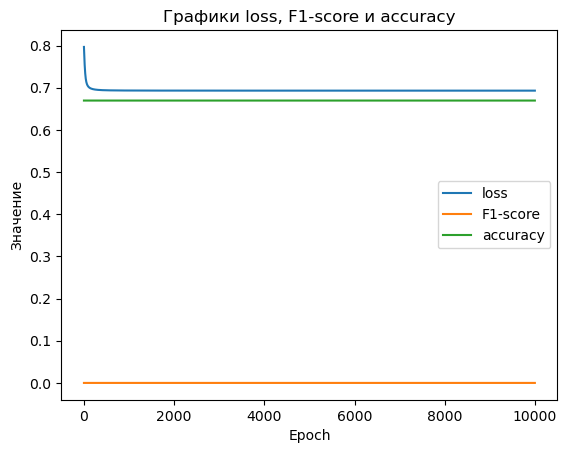

In [162]:
# diagdf изменить название везде
# построение графика loss
plt.plot(diagdf9['Epoch'], diagdf9['loss'], label='loss')

# построение графика F1-score
plt.plot(diagdf9['Epoch'], diagdf9['F1-score'], label='F1-score')

# построение графика accuracy
plt.plot(diagdf9['Epoch'], diagdf9['accuracy'], label='accuracy')

# добавление заголовка графика
plt.title('Графики loss, F1-score и accuracy')

# добавление подписей к осям
plt.xlabel('Epoch')
plt.ylabel('Значение')

# добавление легенды
plt.legend()

# отображение графика
plt.show()

In [163]:
pred_test10=Mk10.forward(x_test.float())
pred_test_binarized10 = (pred_test10 > 0.5).float()

In [164]:
print(classification_report(y_test.to('cpu'), pred_test_binarized10.to('cpu')))

              precision    recall  f1-score   support

         0.0       0.68      1.00      0.81      3216
         1.0       0.00      0.00      0.00      1542

    accuracy                           0.68      4758
   macro avg       0.34      0.50      0.40      4758
weighted avg       0.46      0.68      0.55      4758



C:\Users\Admin\anaconda3\envs\Op11\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Admin\anaconda3\envs\Op11\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Admin\anaconda3\envs\Op11\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
